In [60]:
import pandas as pd
import numpy as np

# Exploratory Analysis

In [61]:
import matplotlib.pyplot as plt
import seaborn as sns

In [62]:
epa_noaa = pd.read_csv('epa_noaa.csv')

In [63]:
epa_noaa.fillna(0,inplace=True)

In [64]:
epa_noaa.head()

,Date Local,City Name,Event Type CO,1st Max Value CO,AQI CO,Arithmetic Mean CO,Event Type SO2,1st Max Value SO2,AQI SO2,Arithmetic Mean SO2,...,AQI NO2,Arithmetic Mean NO2,STATION,PRCP,AWND,SNWD,SNOW,TMAX,TMIN,TAVG
0,2015-01-01,New York,None,0.4,0.0,0.287500,None,5.3,7.0,3.062500,...,27,20.062500,USW00094789,0.0,7.7,0.0,0.0,4.4,-2.1,0.3
1,2015-01-02,New York,None,0.4,0.0,0.295833,None,4.3,6.0,3.358333,...,27,21.587500,USW00094789,0.0,6.1,0.0,0.0,7.2,1.7,4.1
2,2015-01-03,New York,None,0.4,0.0,0.275000,None,3.2,4.0,1.066667,...,27,17.770833,USW00094789,23.9,4.1,0.0,0.0,8.3,-1.0,2.5
3,2015-01-04,New York,None,0.7,0.0,0.433333,None,2.8,3.0,1.566667,...,32,19.183333,USW00094789,11.9,4.5,0.0,0.0,12.8,6.1,8.5
4,2015-01-05,New York,None,0.5,0.0,0.275000,None,2.2,3.0,1.585714,...,20,10.266667,USW00094789,0.0,8.8,0.0,0.0,10.6,-4.9,6.1


In [65]:
epa_noaa.describe()

,1st Max Value CO,AQI CO,Arithmetic Mean CO,1st Max Value SO2,AQI SO2,Arithmetic Mean SO2,1st Max Value Ozone,AQI Ozone,Arithmetic Mean Ozone,1st Max Value NO2,AQI NO2,Arithmetic Mean NO2,PRCP,AWND,SNWD,SNOW,TMAX,TMIN,TAVG
count,4013.000000,4013.0,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000,4013.00000,4013.000000,4013.000000,4013.000000,4013.000000,4013.000000
mean,0.556188,0.0,0.276255,1.932445,1.982557,0.833141,0.037676,36.390481,0.028340,27.112759,25.167207,13.115593,2.196885,4.25370,6.863942,1.720159,18.575206,10.131224,14.190032
std,0.481144,0.0,0.214288,1.844830,2.727888,0.719562,0.013057,16.538492,0.011093,13.528240,12.872107,7.832565,6.957090,1.72558,37.125524,18.046320,9.482498,9.092077,8.977523
min,-0.200000,0.0,-0.271429,-0.400000,0.000000,-0.679167,0.000000,0.000000,0.000000,1.200000,1.000000,-0.152174,0.000000,0.90000,0.000000,0.000000,-17.100000,-24.900000,-19.100000
25%,0.200000,0.0,0.135294,0.800000,0.000000,0.395238,0.029000,27.000000,0.020647,16.700000,15.000000,7.200000,0.000000,3.00000,0.000000,0.000000,12.800000,4.400000,8.700000
50%,0.430000,0.0,0.245833,1.400000,1.000000,0.618182,0.038000,35.000000,0.028588,25.900000,24.000000,11.941667,0.000000,3.80000,0.000000,0.000000,20.600000,12.200000,16.100000
75%,0.800000,0.0,0.362500,2.400000,3.000000,1.075000,0.046000,43.000000,0.036294,36.100000,34.000000,17.808333,0.300000,5.10000,0.000000,0.000000,25.600000,17.200000,20.900000
max,6.000000,0.0,1.550000,32.600000,46.000000,7.762500,0.096000,177.000000,0.068824,91.700000,90.000000,53.254167,106.400000,12.60000,710.000000,770.000000,40.000000,27.800000,30.800000


### Boxpots and Violin Plots

Text(0.5, 1.0, 'Preciptation')

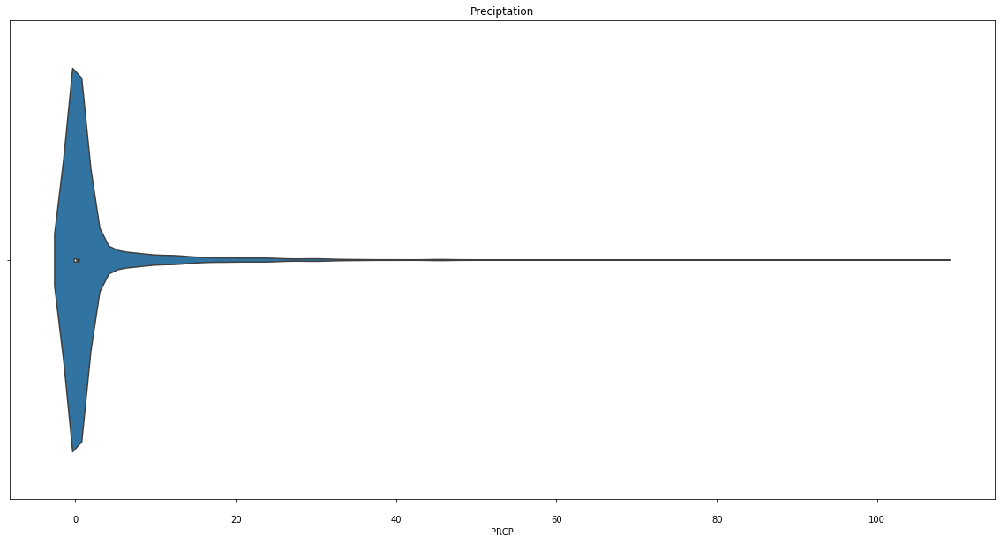

In [66]:
sns.violinplot(x=epa_noaa["PRCP"]).set_title("Preciptation")

Text(0.5, 1.0, 'Average Wind Speed')

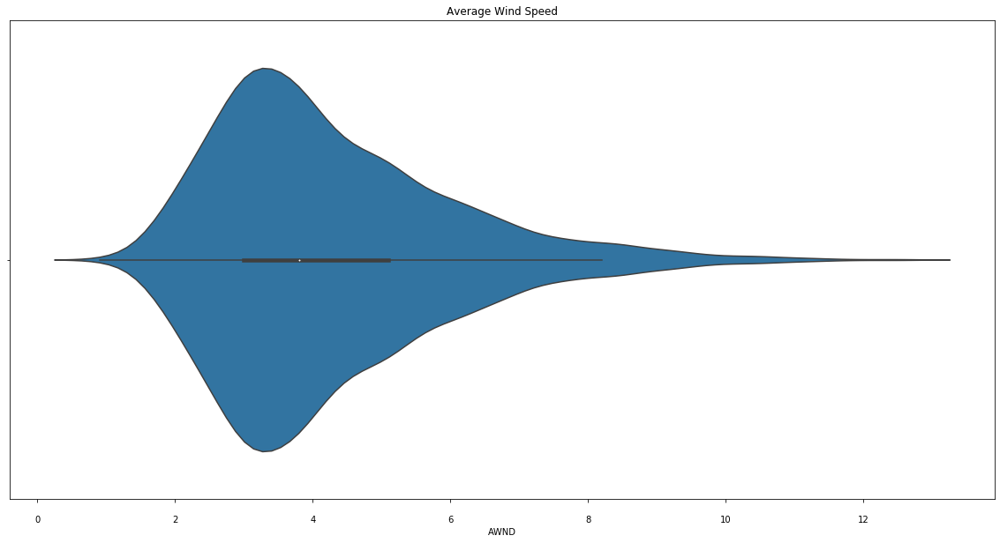

In [67]:
sns.violinplot(x=epa_noaa["AWND"]).set_title("Average Wind Speed")

Text(0.5, 1.0, 'Snow Depth vs Snowfall')

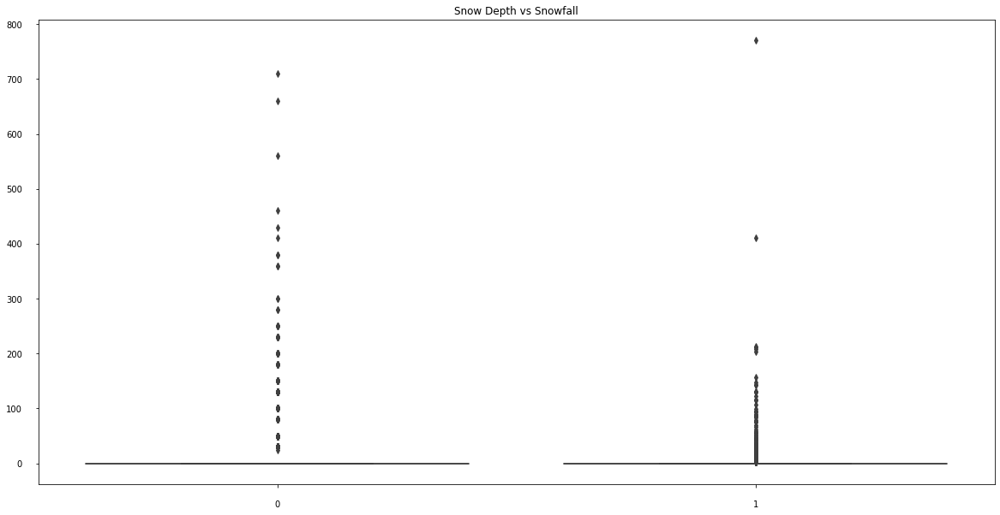

In [68]:
snow = [epa_noaa["SNWD"], epa_noaa["SNOW"]]
sns.boxplot(data=snow).set_title("Snow Depth vs Snowfall")

Text(0.5, 1.0, 'Temperature: Maximum, Minimum, and Average')

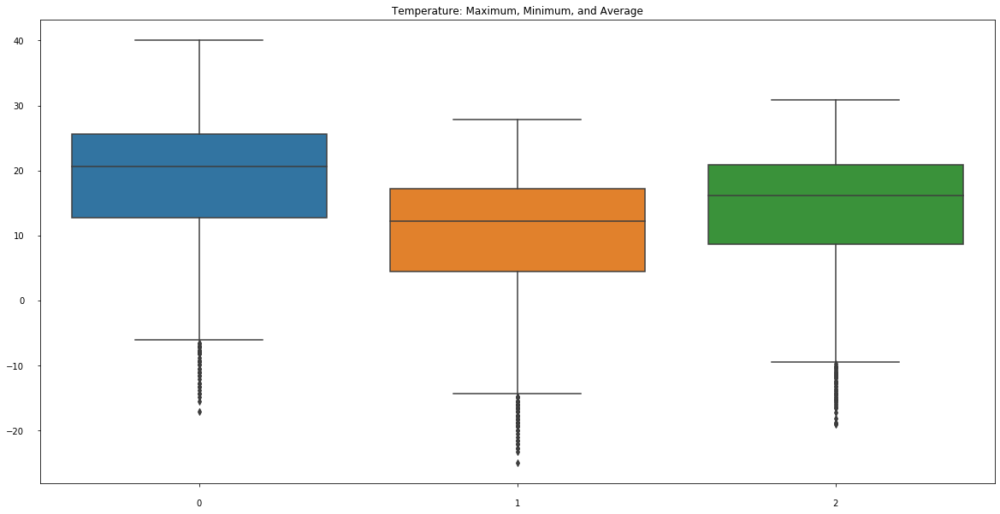

In [69]:
temp = [epa_noaa["TMAX"], epa_noaa["TMIN"], epa_noaa["TAVG"]]
sns.boxplot(data=temp).set_title("Temperature: Maximum, Minimum, and Average")

Text(0.5, 1.0, 'AQI for Sulfur Dioxide')

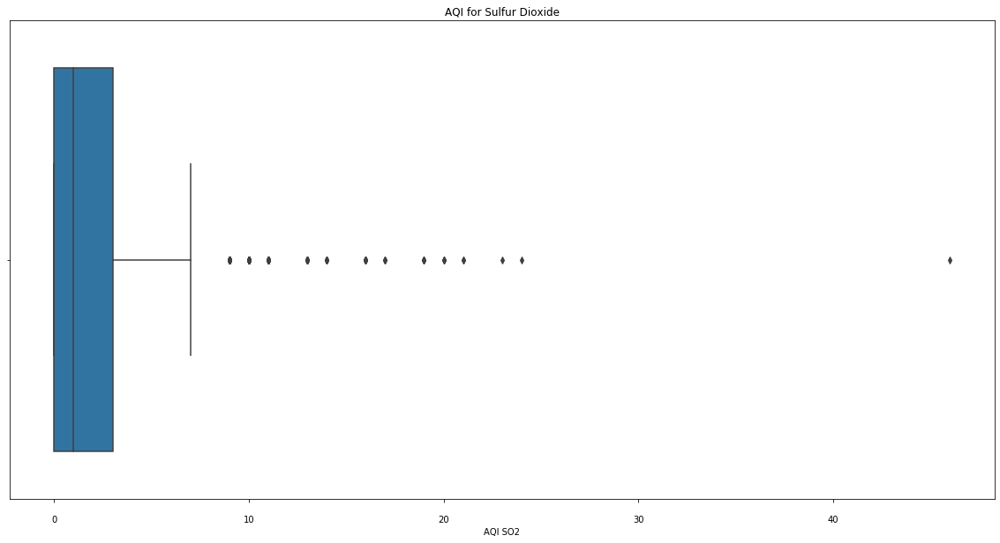

In [72]:
sns.boxplot(x=epa_noaa["AQI SO2"]).set_title("AQI for Sulfur Dioxide")

Text(0.5, 1.0, 'AQI for Ozone')

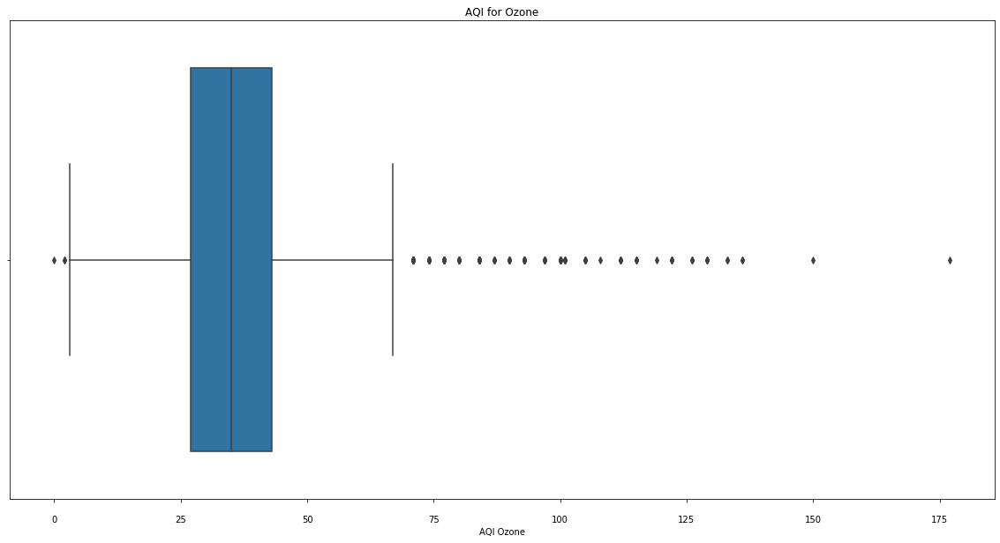

In [73]:
sns.boxplot(x=epa_noaa["AQI Ozone"]).set_title("AQI for Ozone")

Text(0.5, 1.0, 'AQI for Nitrogen Oxide')

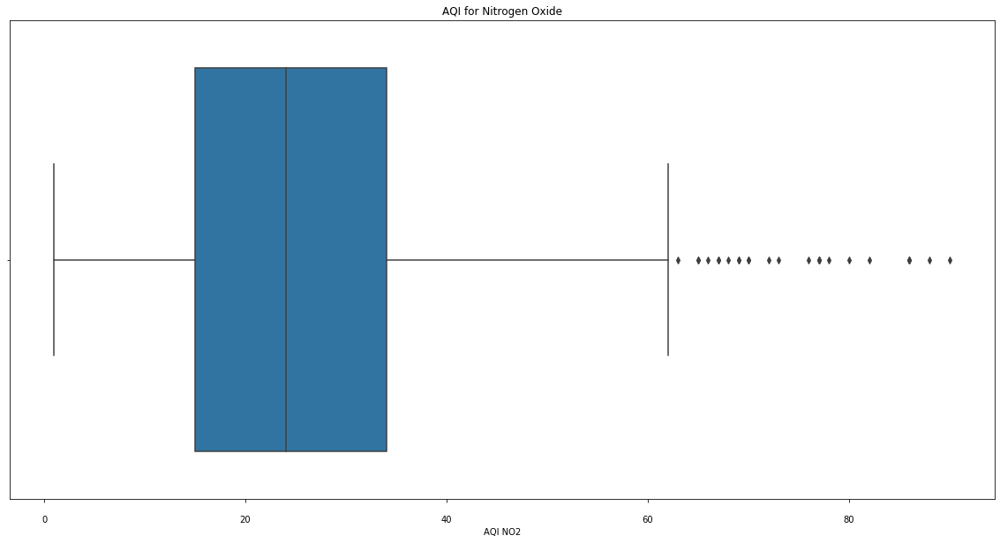

In [74]:
sns.boxplot(x=epa_noaa["AQI NO2"]).set_title("AQI for Nitrogen Oxide")

# Data Modeling

In [75]:
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from itertools import combinations
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import KFold
from sklearn.svm import SVR
from sklearn.model_selection import GridSearchCV
from tqdm import tqdm
import time
import math
from scipy.stats import pearsonr

In [76]:
class ModelRecord(object):
    
    def __init__(self):
        self.mse_ = 10000000
        self.explained_variance_ = 0
        self.features_ = []
        self.target_ = None
        self.model_name_ = ""
        self.model_coeffs_ = None
        self.model_intercept_ = None
        self.test_X_ = None
        self.test_y_ = None
        self.test_predictions_ = None
  
    def get_mse(self):
        return self.mse_

    def get_explained_variance(self):
        return self.explained_variance_

    def __str__(self):   
        return "Top Model\n\tFeatures: {}\n\tTarget: {}\n\tMSE: {} R^2 {}\n".format(self.features_,self.target_,self.mse_, self.explained_variance_)

In [77]:
# Initialize list of models to train
# At this time only Linear Regression models are compared
def initialize_models():
    # Linear Regression
    lreg = LinearRegression()
    models = [("linear_regression",lreg)]
    return models

In [124]:
def get_best_model(dataframe,features,targets):
    # Initialize object to store top model
    list_topModels = []
    
    # Generate list of all possible unique feature set combinations
    feature_subsets = sum([list(map(list, combinations(features, i))) for i in range(1,len(features) + 1)], [])
    print("Num Feature Subsets {}".format(len(feature_subsets)))
    
    # List of all models
    models = initialize_models()
    
    # Targets
    for idx1, target in enumerate(targets):
        # Feature sets
        for idx2, features in enumerate(feature_subsets):
            # Models
            for idx3, model in enumerate(models):
                ret, model_record = train_and_evaluate(dataframe,features,target,model)
                if ret:
                    list_topModels.append(model_record)
    return list_topModels

In [165]:
# Given a specific model algorithm (i.e. linear regression), a dataset,
# and a target variable
# Partition the dataset into train and test sets via k-fold cross validation
# Train the model using the training data and test the model
# on the testing data
# Compute the average mean squared error and explained variance using
# the predicted values from the test set across all k models
def train_and_evaluate(dataframe,features,target,model):
    start = time.time()
    print(target)
    X = dataframe[features].values
    y = dataframe[target].values
    
    # Apply k-fold cross validation
    k = 8
    kf = KFold(n_splits=k,shuffle=True)
    kf.get_n_splits(X)
    
    # These will be used to assess overall model quality
    avg_mse = 0
    avg_explained_variance = 0
    
    # Train and test sets
    X_train = None
    X_test = None
    y_train = None
    y_test = None
    y_predictions = None
    
    # Train model on each fold
    for train_partition, test_partition in kf.split(X):
        X_train, X_test = X[train_partition], X[test_partition]
        y_train, y_test = y[train_partition], y[test_partition]

        # Train a regression model
        reg = model[1]
        reg.fit(X_train, y_train)
        
        # Get predicted targets
        y_predictions = reg.predict(X_test)
        mse = mean_squared_error(y_test, y_predictions)
        corr, _ = pearsonr(y_test, y_predictions)
        explained_variance = corr ** 2
        
        # Compute running total
        avg_mse += mse
        avg_explained_variance += explained_variance
     
    # Compute average mse/explained variance
    avg_mse = avg_mse/k
    avg_explained_variance = avg_explained_variance/k
    
    
    end = time.time()
    print("Train Evaluation Cycle Duration {}".format(end-start))
    
    if avg_explained_variance < .10:
        return False, None
    else:
        model_record = ModelRecord()
        model_record.model_name_ = model[0]
        model_record.model_coeffs_ = reg.coef_
        model_record.model_intercept_ = reg.intercept_
        model_record.test_X_ = X_test # Last test set
        model_record.test_y_ = y_test
        model_record.test_predictions_ = y_predictions
        model_record.mse_ = avg_mse
        model_record.features_ = features 
        model_record.target_ = target
        model_record.explained_variance_ = avg_explained_variance
        return True, model_record

In [166]:
# Build models for every combination of features and target variables
# Record the top models in Model_Record objects
# such that they can be further analyzed
features = ['PRCP','AWND','SNWD','SNOW','TAVG','TMAX','TMIN']
targets = ['Arithmetic Mean Ozone','Arithmetic Mean SO2','Arithmetic Mean CO','Arithmetic Mean NO2']
dataframe = epa_noaa
topModel_records = get_best_model(dataframe,features,targets)


Num Feature Subsets 127
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.07523202896118164
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.01143503189086914
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.009297370910644531
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.009628057479858398
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.010442018508911133
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.009624719619750977
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.009476184844970703
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.016079187393188477
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.010738849639892578
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.01101064682006836
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.010194778442382812
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.010910272598266602
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.01095890998840332
Arith

Train Evaluation Cycle Duration 0.01415109634399414
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.013018131256103516
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.012073993682861328
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.01197504997253418
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.010761260986328125
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.012192010879516602
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.014183998107910156
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.013081073760986328
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.012495040893554688
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.015152692794799805
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.014925956726074219
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.014554023742675781
Arithmetic Mean Ozone
Train Evaluation Cycle Duration 0.013080120086669922
Arithmetic Mean Ozone
Train Evaluation Cycle Dura

Train Evaluation Cycle Duration 0.01098179817199707
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.01312398910522461
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.012835025787353516
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.011294126510620117
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.011360883712768555
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.010478973388671875
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.014446020126342773
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.010655879974365234
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.013046026229858398
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.010497093200683594
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.010170936584472656
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.011503934860229492
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.010395288467407227
Arithmetic Mean SO2
Train Evaluation Cycle Duration 0.011237144470214844


Train Evaluation Cycle Duration 0.013299942016601562
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.012210845947265625
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.012053966522216797
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010837078094482422
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010367870330810547
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010704994201660156
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010211944580078125
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010537147521972656
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010322809219360352
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.01032114028930664
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010158061981201172
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010137081146240234
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010164976119995117
Arithmetic Mean CO
Train Evaluation Cycle Duration 0.010257720947265625
Arithmetic M

Train Evaluation Cycle Duration 0.013869047164916992
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.01644587516784668
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.016264915466308594
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.013467788696289062
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.014348983764648438
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.014223098754882812
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.013443231582641602
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.011512041091918945
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.012247085571289062
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.015534162521362305
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.01442098617553711
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.010977745056152344
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.012204647064208984
Arithmetic Mean NO2
Train Evaluation Cycle Duration 0.012489080429077148


In [167]:
# Sort models by explained_variance / R^2
# The highest possible R^2 is 1
topModel_records = sorted(topModel_records,key= lambda x: x.explained_variance_, reverse=True)
print(len(topModel_records))

363


In [168]:
# Find model with IV Average Temperature and DP Arithematic Mean Ozone
model_record = None
for model_record in topModel_records:
    if(model_record.features_ == ['TAVG'] and model_record.target_ == 'Arithmetic Mean_Ozone'):
        model_to_analyze = model_record
        print(model_to_analyze.model_coeffs_)
print(model_to_analyze)

Top Model
	Features: ['TAVG']
	Target: Arithmetic Mean_Ozone
	MSE: 9.163028829574274e-05 R^2 0.2573707442723563



In [169]:
# Best performing model
print(topModel_records[0])

Top Model
	Features: ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
	Target: Arithmetic Mean NO2
	MSE: 36.095130778831425 R^2 0.4112709937792508



# MODEL VISUALIZATIONS

In [170]:
# matplotlib
from pylab import rcParams
rcParams['figure.figsize'] = 20, 10
rcParams['xtick.major.pad']='15'
rcParams['ytick.major.pad']='15'

In [171]:
# Generate and examine models by featureNum index or feature type
def display_model(model_record,featureNum=0,featureType=None):
    
    # If featureType is specified, check if it is in the model's feature list
    # If so get the index of that feature in that list
    # Use to select a single feature from the data to plot
    if featureType is not None:
        if featureType in model_record.features_:
            featureNum = model_record.features_.index(featureType)
        else:
            return # feature not in particular list
    
    feature = None # depends on multi vs single
    test_X = None # depends on multi vs single
    predictions = None
    target = model_record.target_
    test_y = model_record.test_y_
    coeffs = model_record.model_coeffs_

    if featureNum > len(model_record.features_)-1:
        return
    
    feature = model_record.features_[featureNum]
    test_X = model_record.test_X_[:,featureNum]
    predictions = coeffs[featureNum] * test_X + model_record.model_intercept_

    if len(model_record.features_) > 1: # multiple variable regression
        #https://stats.stackexchange.com/questions/73320/how-to-visualize-a-fitted-multiple-regression-model
        test_X_constant = np.delete(model_record.test_X_, featureNum, axis=1)
        test_X_constant = test_X_constant.mean(axis=0)
        coeffs_constant = np.delete(coeffs,featureNum)
        constant = np.multiply(test_X_constant, coeffs_constant).sum()
        predictions += constant
       
    # Set units x_axis
    x_units = None

    if feature in ['PRCP','SNWD']:
        x_units = 'millimeters'
    elif feature in ['AWND']:
        x_units = 'meters/second'
    elif feature in ['TAVG','TMAX','TMIN']:
        x_units = '°C'
      
    
    # Set units y_axis
    y_units = None
    
    if target in ['Arithmetic Mean CO','Arithmetic Mean Ozone']:
        y_units = 'parts per million'
    elif target in ['Arithmetic Mean SO2','Arithmetic Mean NO2']:
        y_units = 'parts per billion'
    

    plt.title("The Effect of {} on {}".format(feature,target),fontsize=20)
    plt.xticks()
    plt.yticks()
    plt.xlabel('{} ({})'.format(feature,x_units),fontsize=18)
    plt.ylabel('{} ({})'.format(target,y_units),fontsize=18)
    
    plt.tick_params(axis='both', which='major', labelsize=15)
    
    plt.scatter(test_X, test_y,  color='black')
    plt.plot(test_X, predictions, color='blue', linewidth=3)

    plt.show()
    
    print("Explained Variance {:.2f}".format(model_record.explained_variance_))
    print("Correlation Coefficient {:.2f}".format(math.sqrt(max(model_record.explained_variance_,0))))
    print("Feature Selected for Display {}".format(feature))
    print("All Features In Model {}".format(model_record.features_))
    print("Coefficients {}".format(model_record.model_coeffs_))

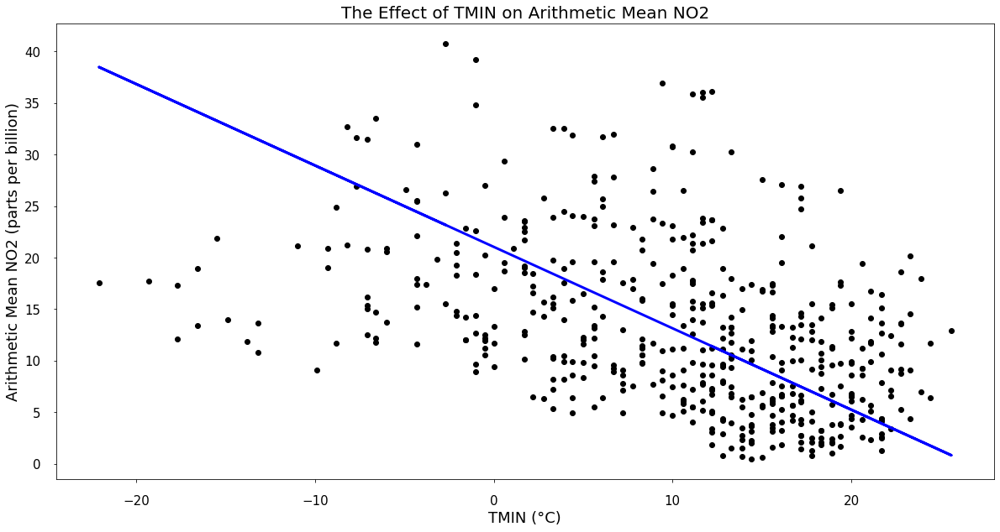

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display TMIN
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.12182397 -1.71413678  0.01161677 -0.41619269  0.75963668 -0.78907793]


In [172]:
display_model(topModel_records[1],featureNum=5,featureType=None)

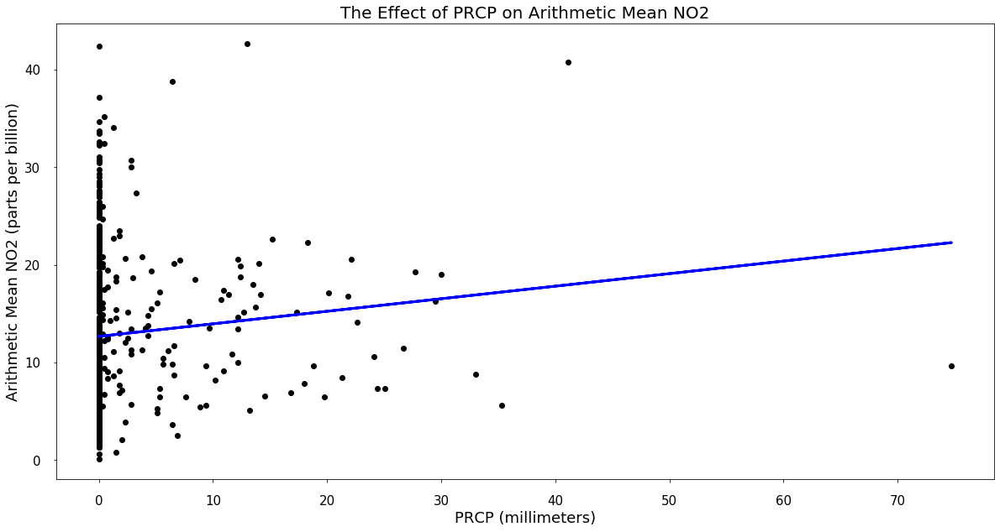

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.12848603 -1.67020476  0.01267511 -0.0073836  -0.41976148  0.77787967
 -0.80614928]


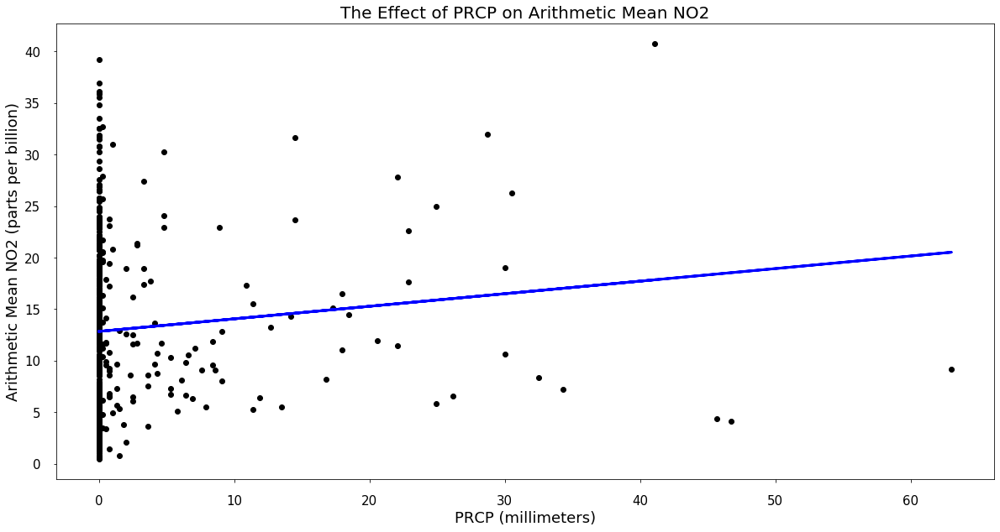

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.12182397 -1.71413678  0.01161677 -0.41619269  0.75963668 -0.78907793]


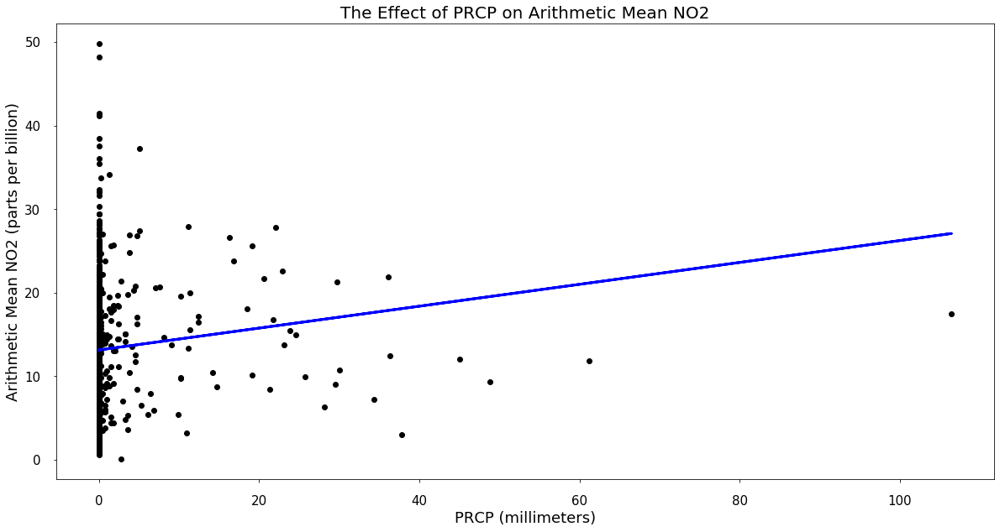

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.13101891 -1.71398123 -0.43479364  0.78765314 -0.80834299]


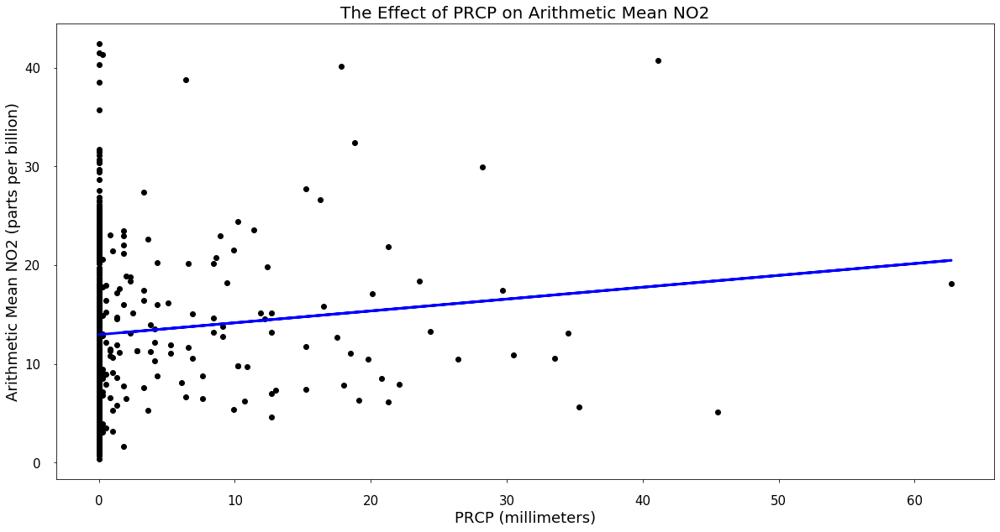

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.12001571 -1.73243515  0.01488546 -0.00448032  0.59171825 -1.0248953 ]


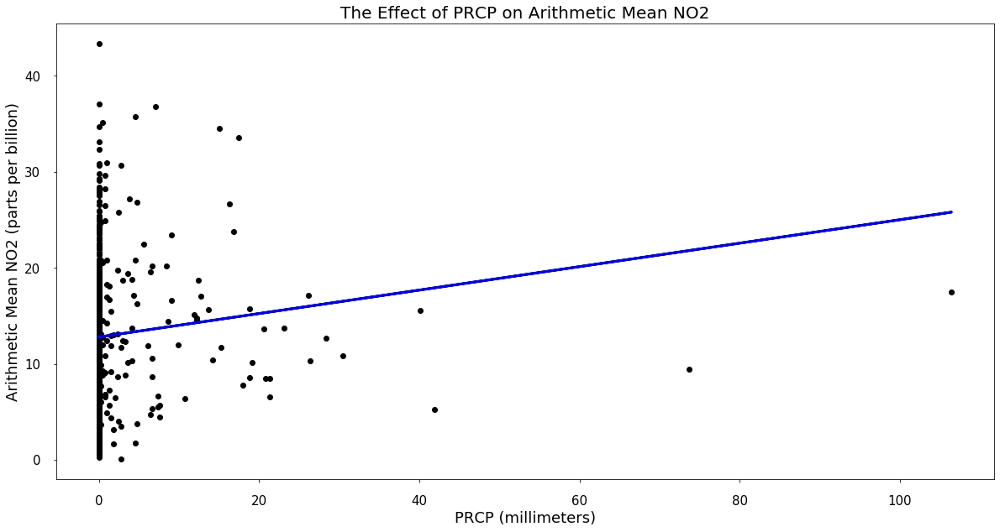

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.12212155 -1.69620441  0.00218256 -0.48046055  0.79180486 -0.77630256]


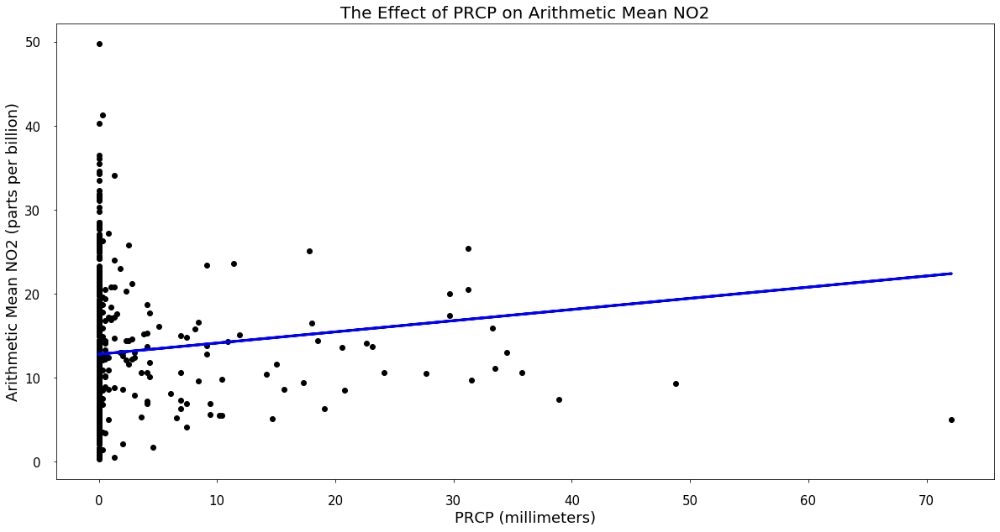

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.13309071 -1.76308721  0.01382804  0.5656739  -1.00222298]


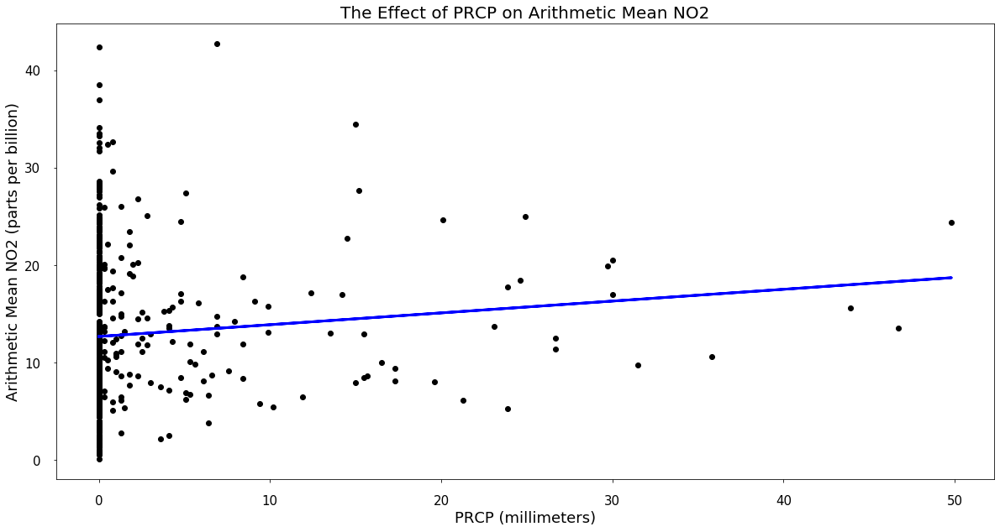

Explained Variance 0.41
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.12105911 -1.726125   -0.00280684  0.5812074  -1.0358767 ]


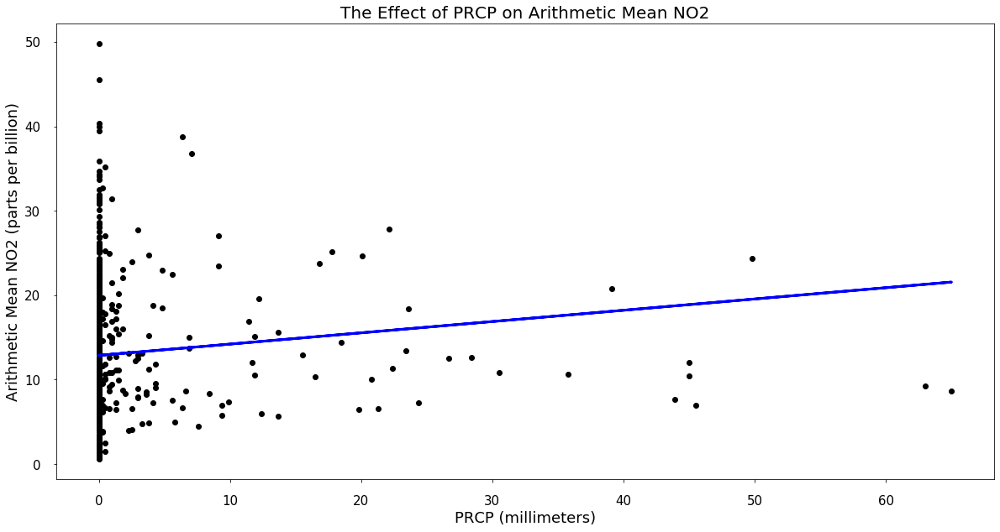

Explained Variance 0.40
Correlation Coefficient 0.64
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMAX', 'TMIN']
Coefficients [ 0.13354774 -1.74586274  0.56323587 -1.01749744]


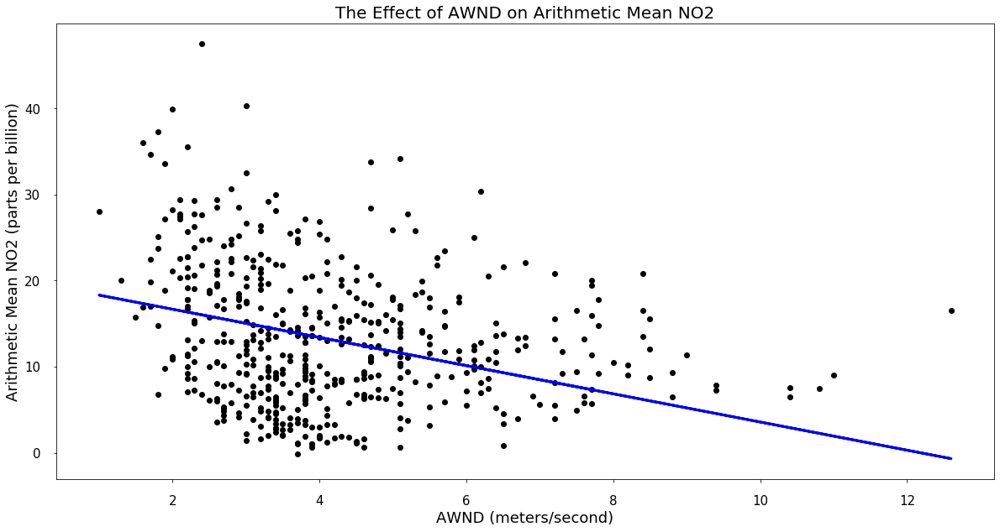

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.63721744  0.01307671  0.00334356 -0.39735993  0.72572999 -0.76501194]


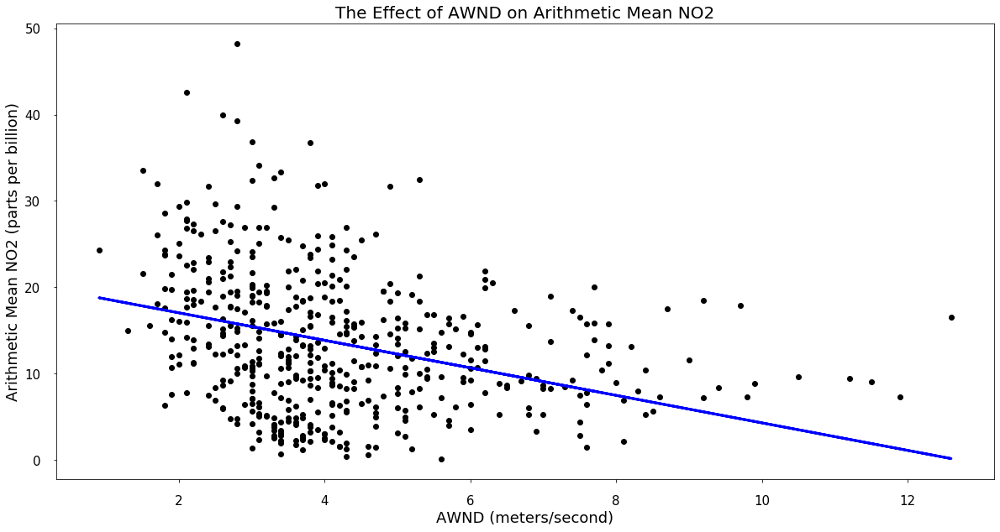

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.59185754  0.01234135 -0.41550723  0.76498163 -0.79400817]


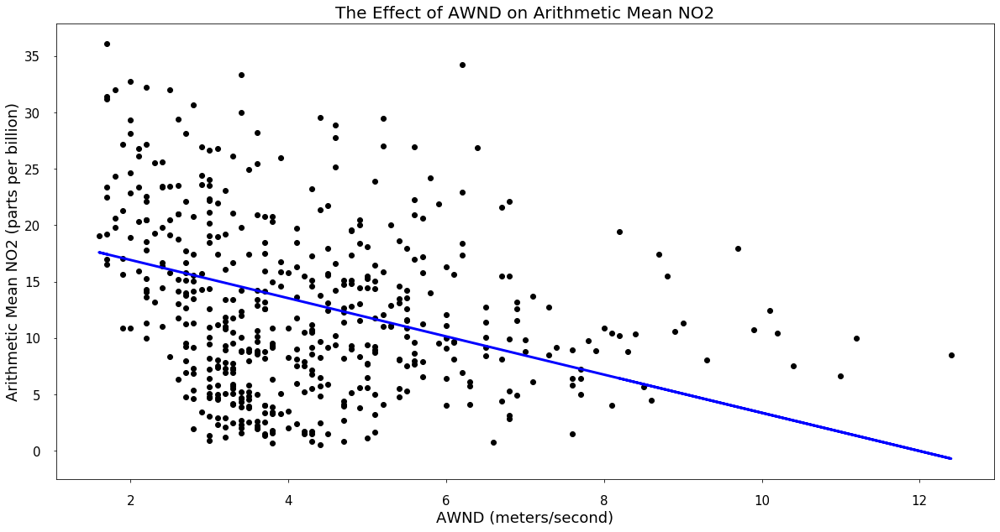

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-1.69387322  0.01411757  0.00395769  0.54398981 -0.97443765]


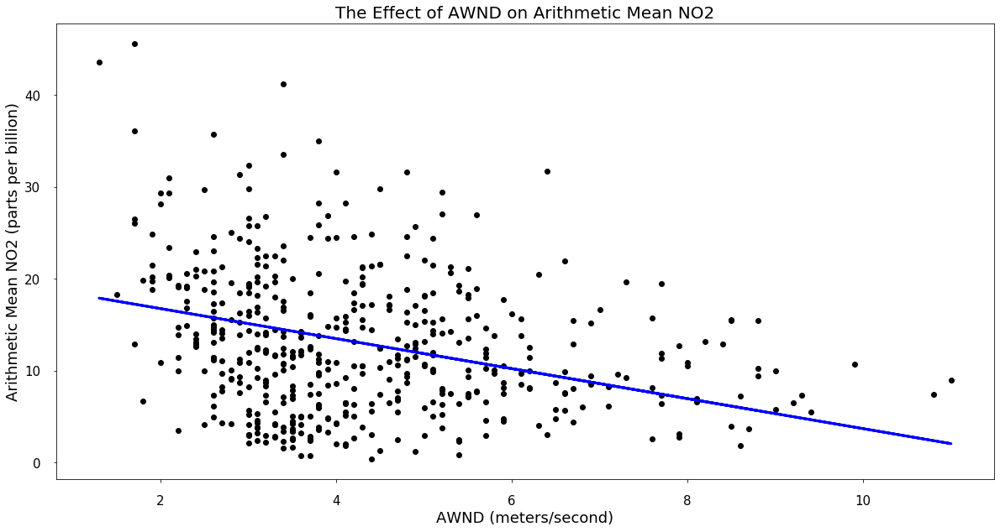

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.63177832 -0.36353883  0.73471797 -0.83515248]


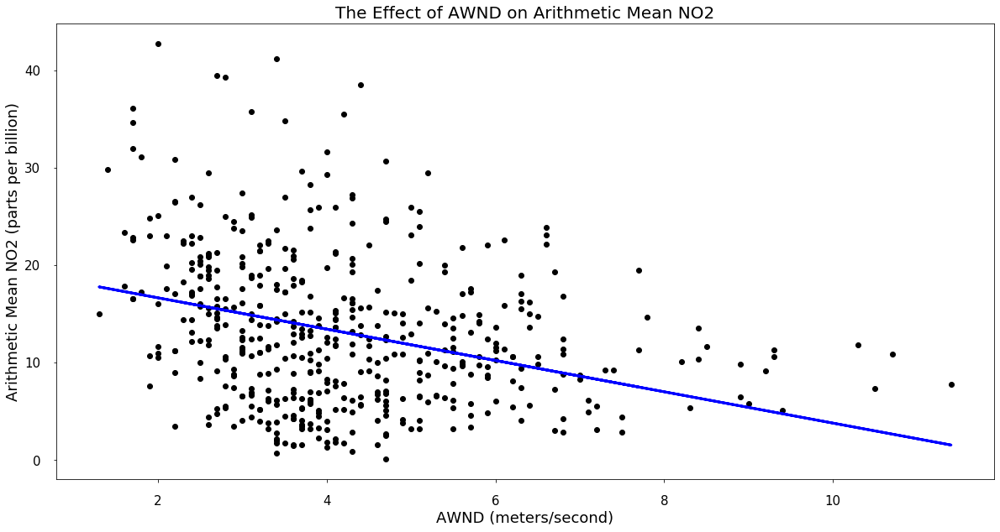

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.60812158  0.00816295 -0.38100412  0.75565176 -0.83221607]


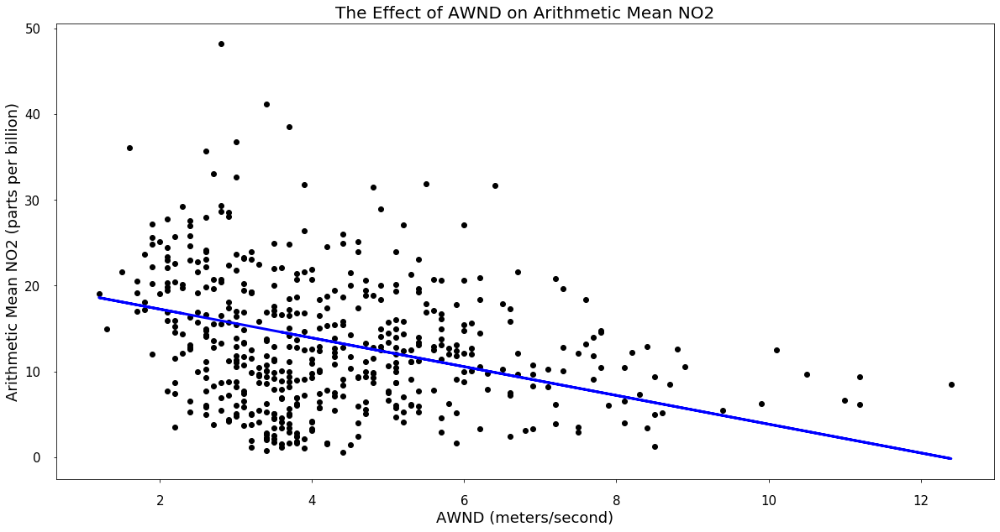

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-1.67547913  0.00931536  0.54756939 -0.99553703]


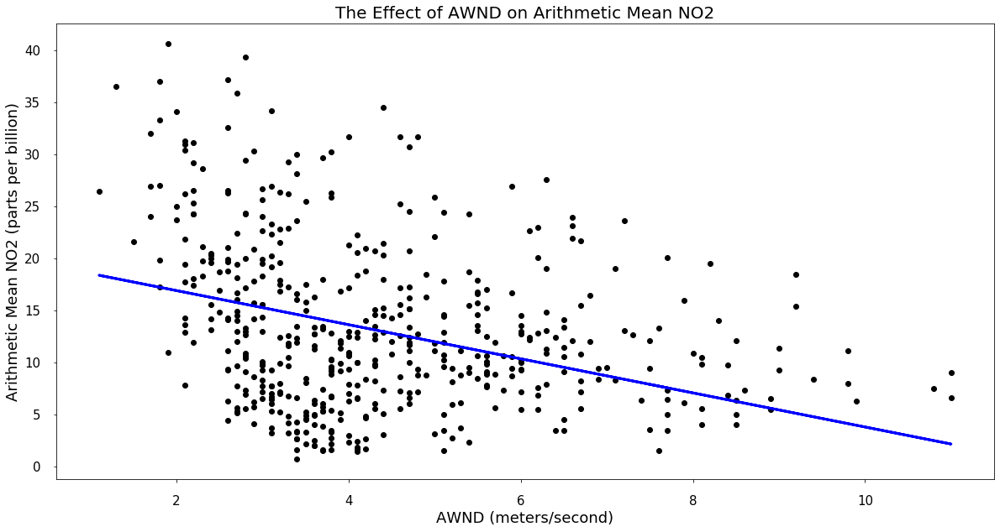

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMAX', 'TMIN']
Coefficients [-1.63834437  0.55880828 -1.00689341]


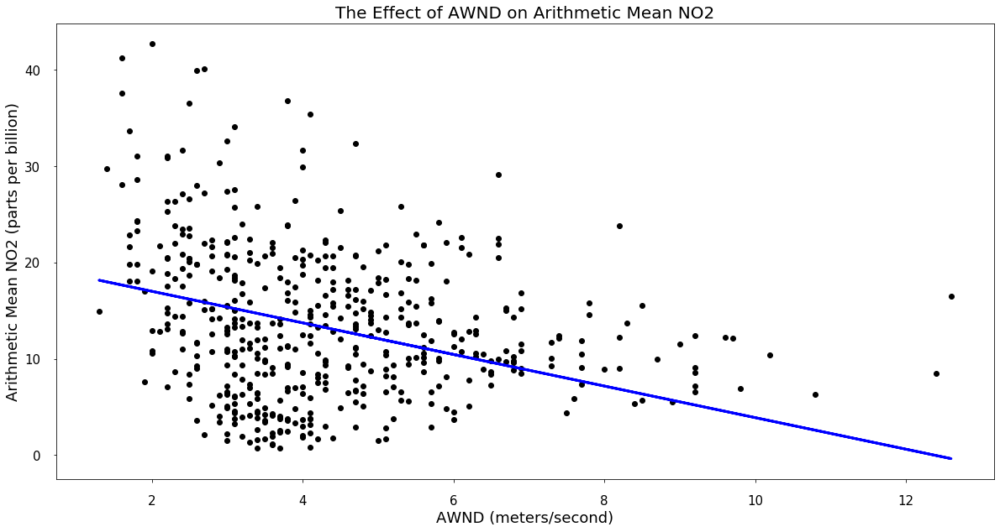

Explained Variance 0.40
Correlation Coefficient 0.63
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [-1.64068608  0.0131677   0.55663867 -0.99424406]


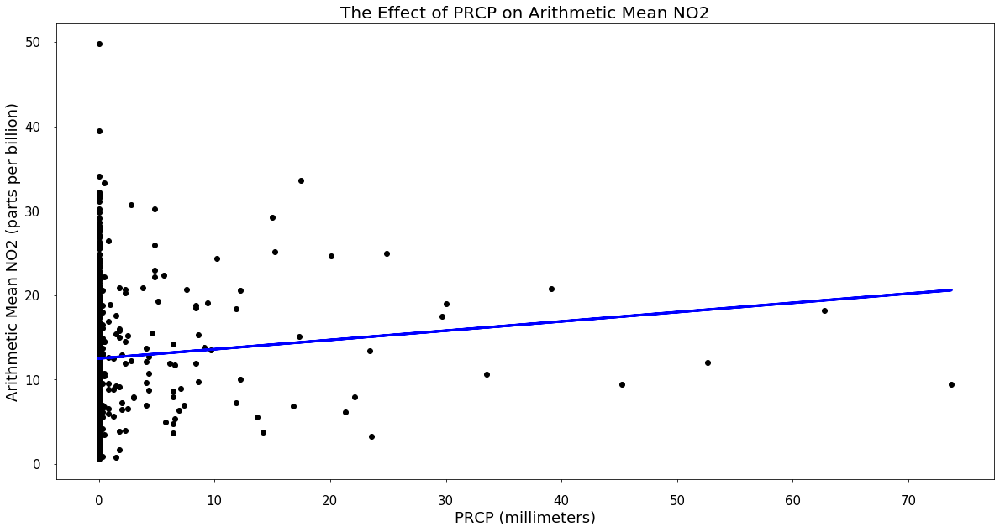

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.10981578 -1.90575125  0.01513143 -0.00827776  0.77624485 -1.21710279]


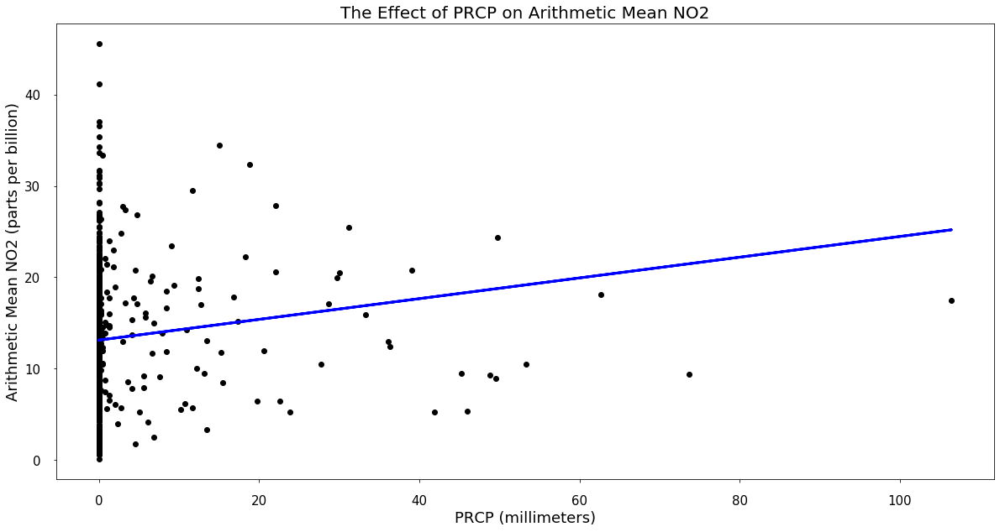

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [ 0.11344462 -1.55423353  0.01691962 -1.55173118  1.12472556]


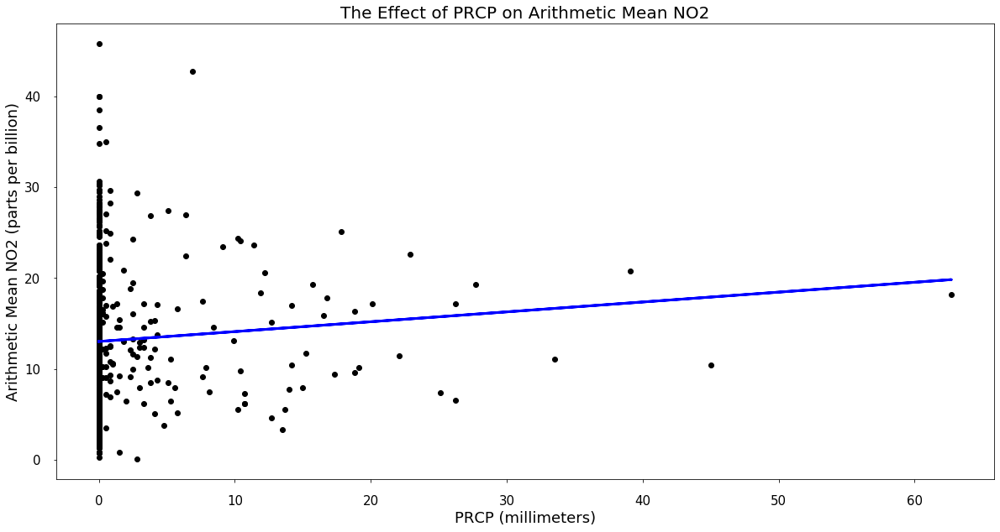

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [ 0.10855564 -1.8670403   0.00991681  0.76151455 -1.20221537]


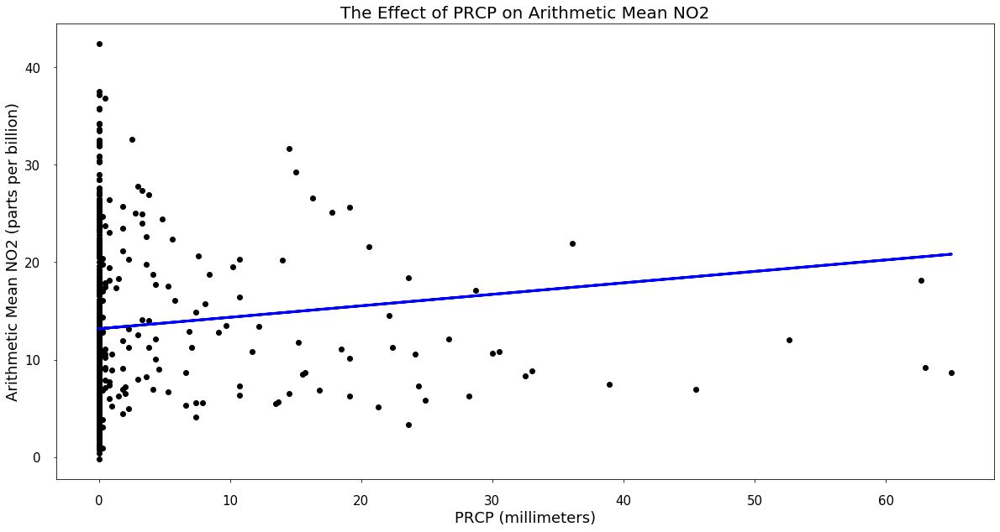

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMIN']
Coefficients [ 0.11768602 -1.8865926   0.77032557 -1.21421722]


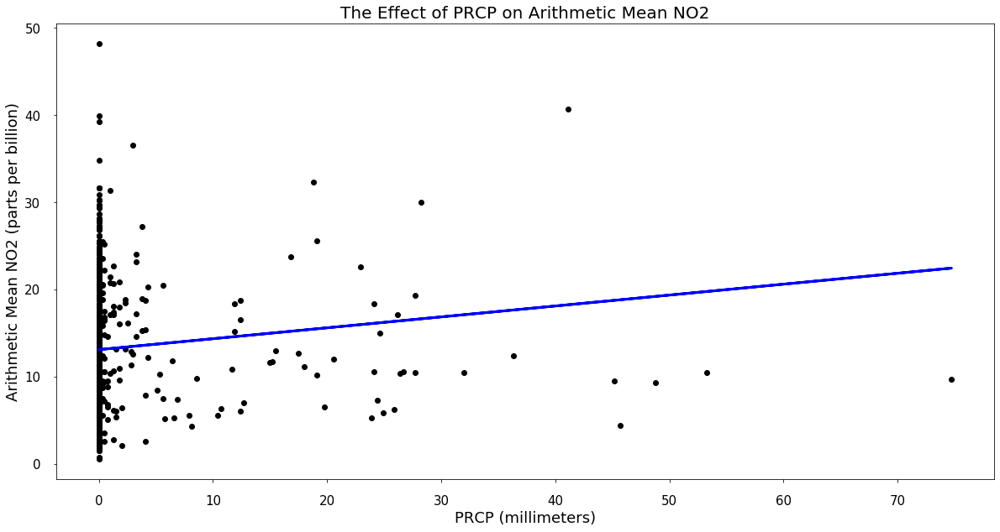

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.1252223  -1.89757397 -0.00843562  0.77318501 -1.2281311 ]


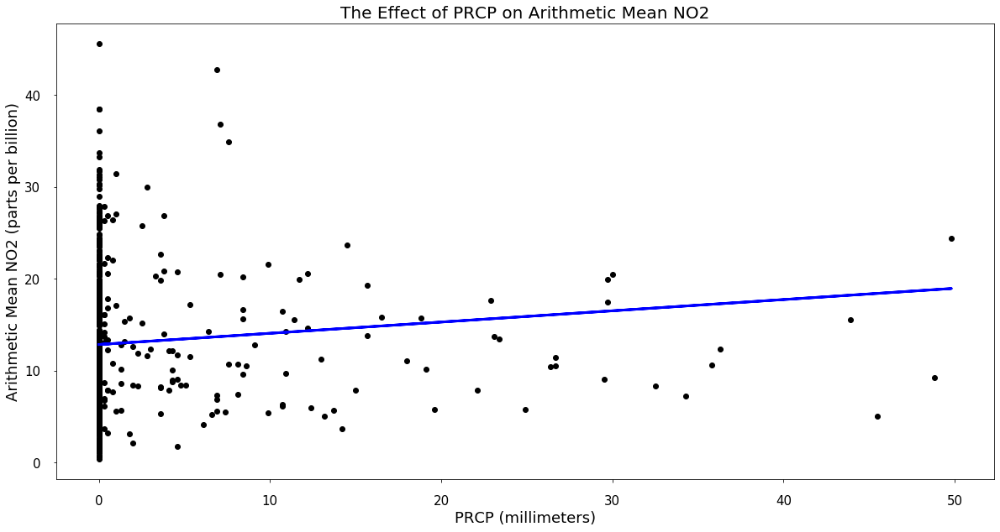

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 1.22217571e-01 -1.55556173e+00 -1.58490916e-03 -1.59278673e+00
  1.13197498e+00]


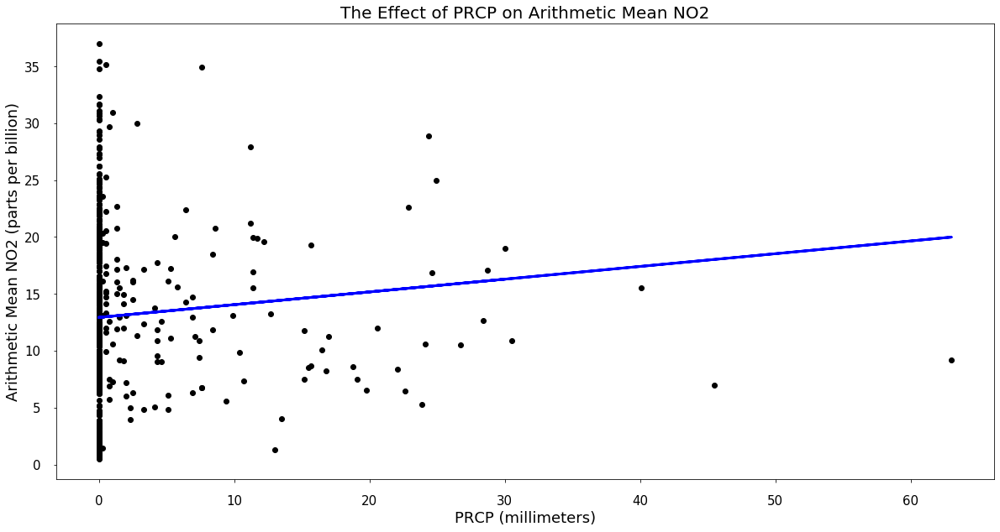

Explained Variance 0.38
Correlation Coefficient 0.62
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX']
Coefficients [ 0.11199966 -1.58382257 -1.59016858  1.12860096]


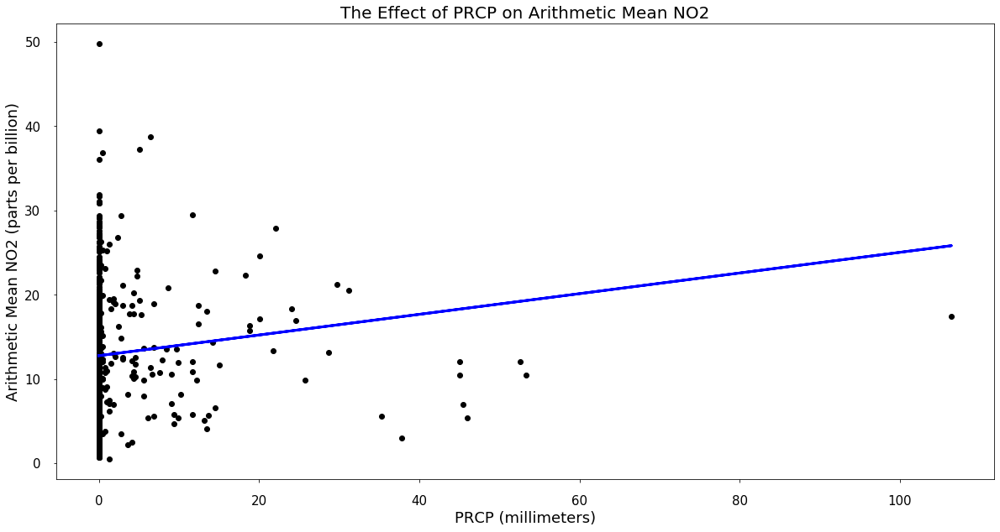

Explained Variance 0.38
Correlation Coefficient 0.61
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.12270422 -1.59334527  0.0141903  -0.00636158 -1.56317685  1.11951818]


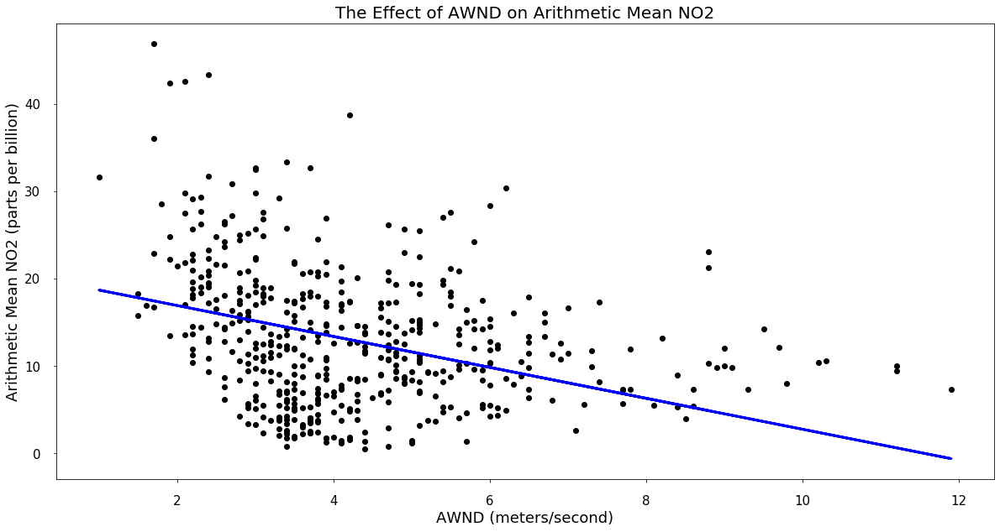

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [-1.7702398   0.01285109  0.71499641 -1.14257776]


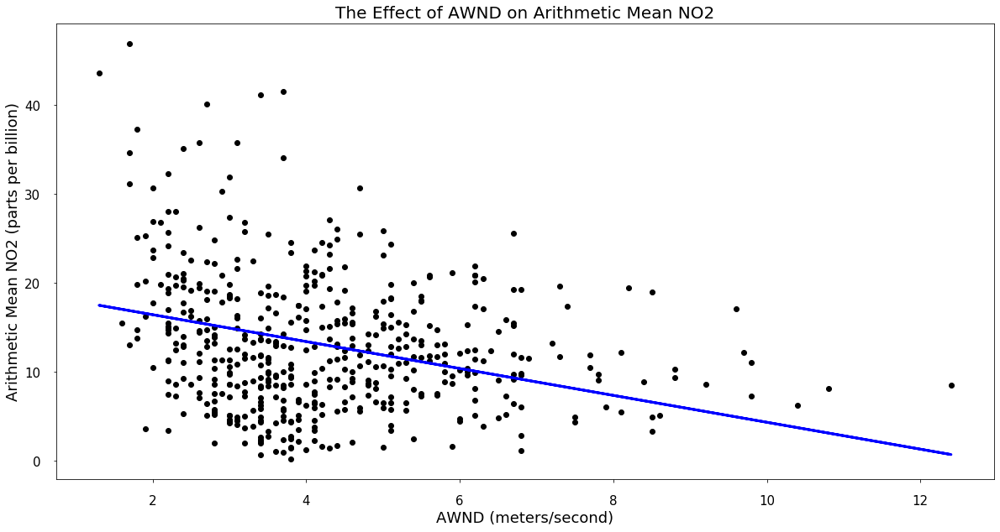

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [-1.5107517   0.01419814 -1.54318428  1.1110019 ]


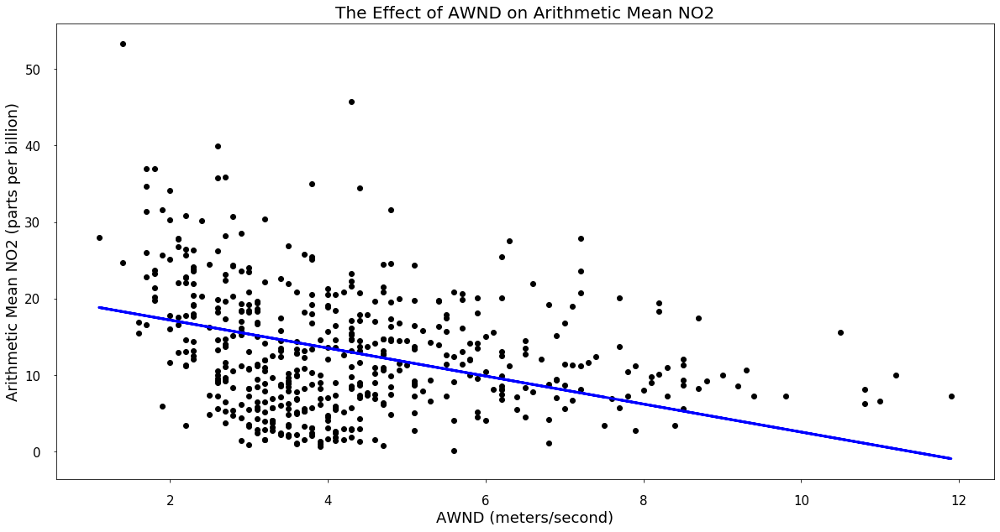

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMIN']
Coefficients [-1.82858773  0.70627436 -1.1582219 ]


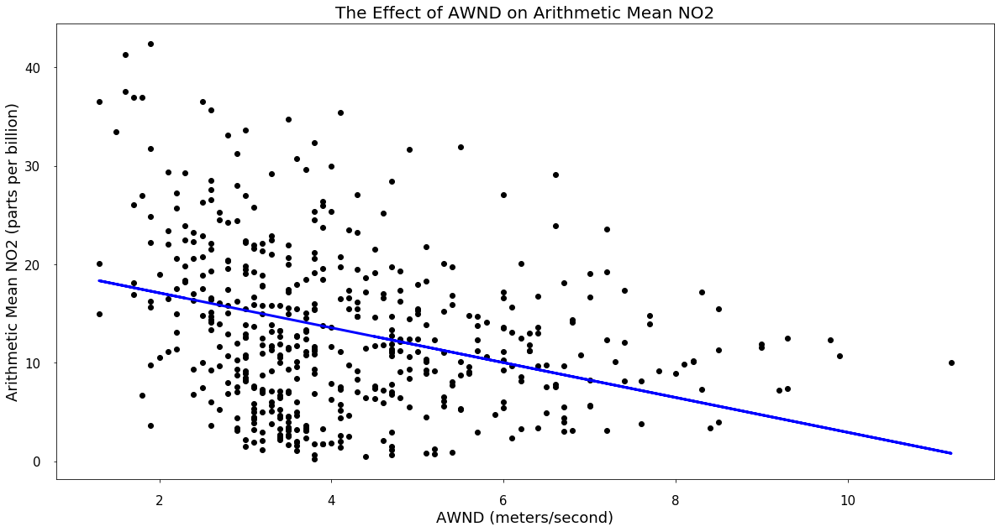

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-1.77123302e+00  1.39857849e-02 -5.00219850e-04  7.13937251e-01
 -1.13331257e+00]


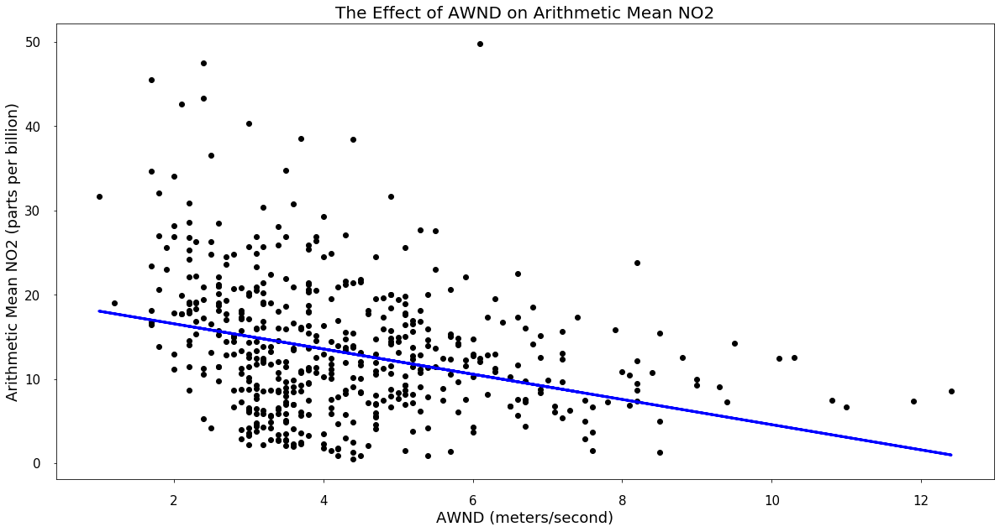

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX']
Coefficients [-1.49759205 -1.54396474  1.08209891]


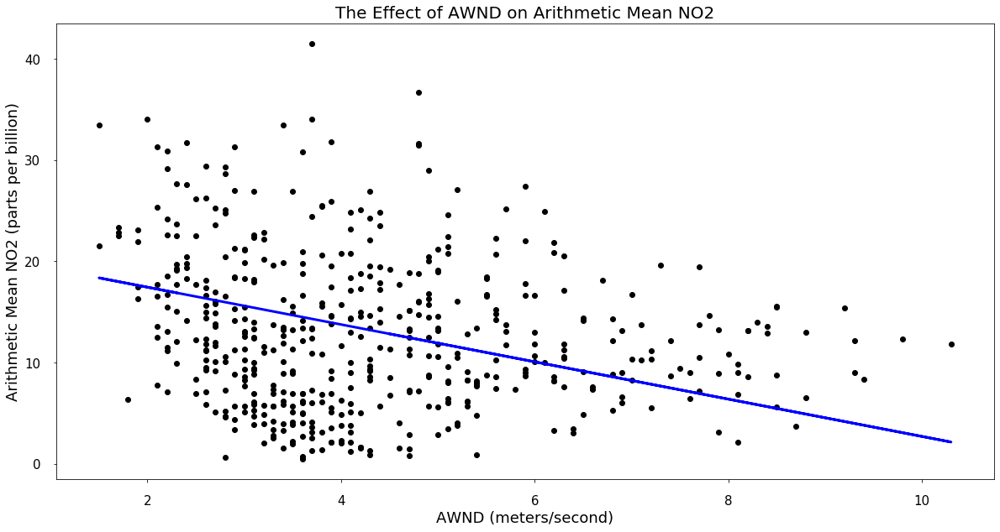

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-1.84277635  0.00448865  0.71236872 -1.16413296]


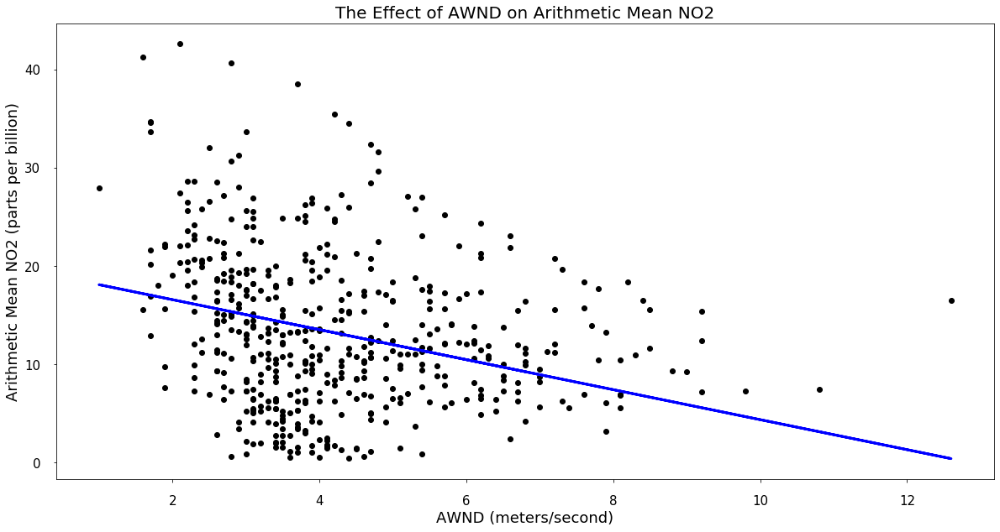

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-1.52649794e+00  1.54684321e-02 -1.29282641e-03 -1.48275972e+00
  1.04783498e+00]


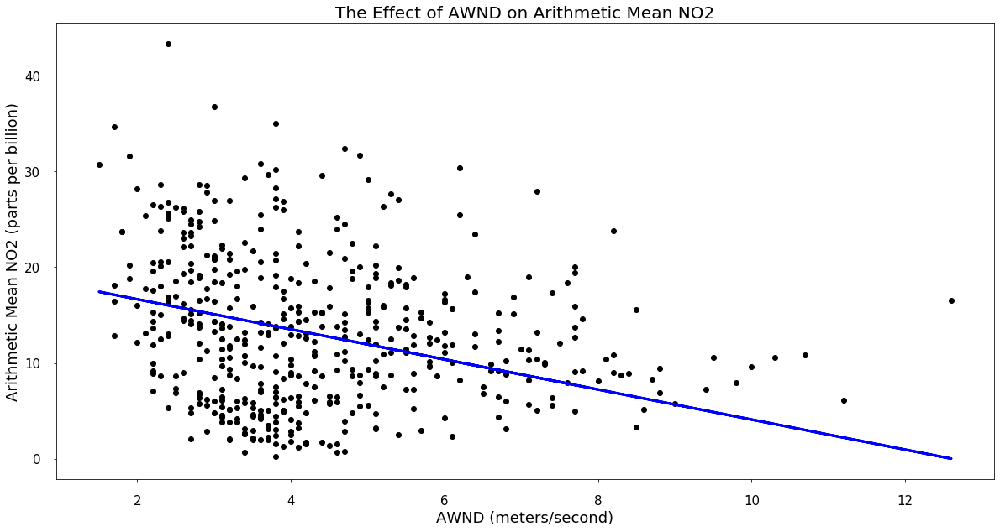

Explained Variance 0.37
Correlation Coefficient 0.61
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-1.56874825  0.00759553 -1.53063176  1.07908854]


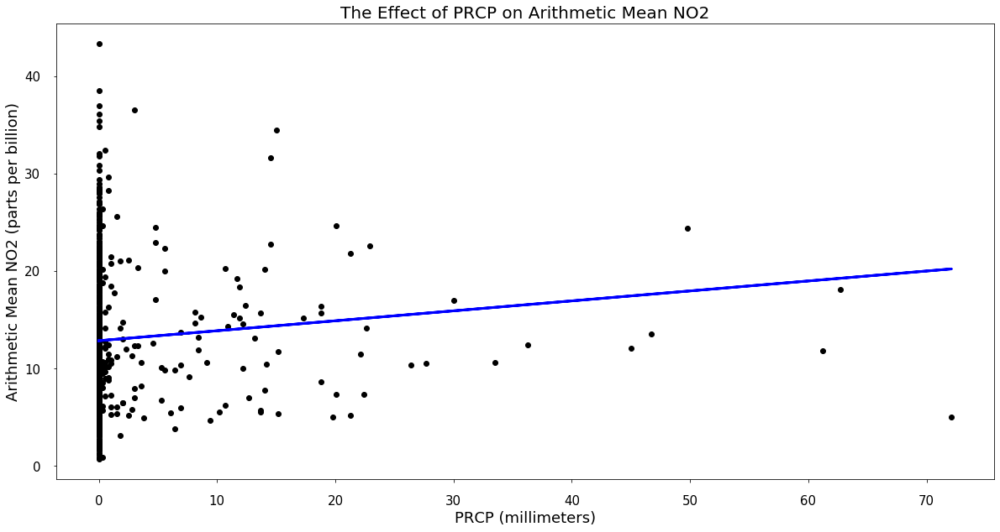

Explained Variance 0.35
Correlation Coefficient 0.59
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [ 0.10215585 -1.87859729  0.01214247 -0.0140792  -0.46657771]


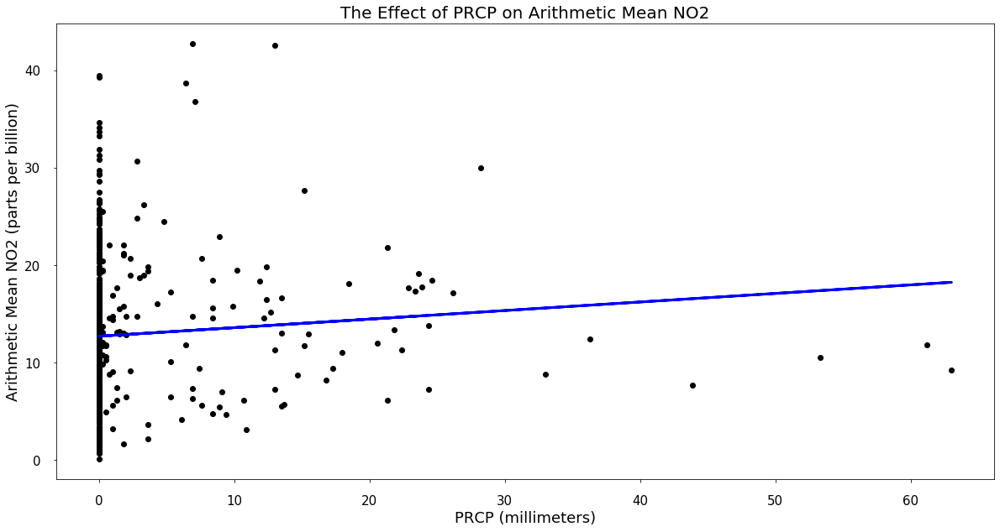

Explained Variance 0.35
Correlation Coefficient 0.59
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMIN']
Coefficients [ 0.08783716 -1.90978268  0.01180132 -0.46521247]


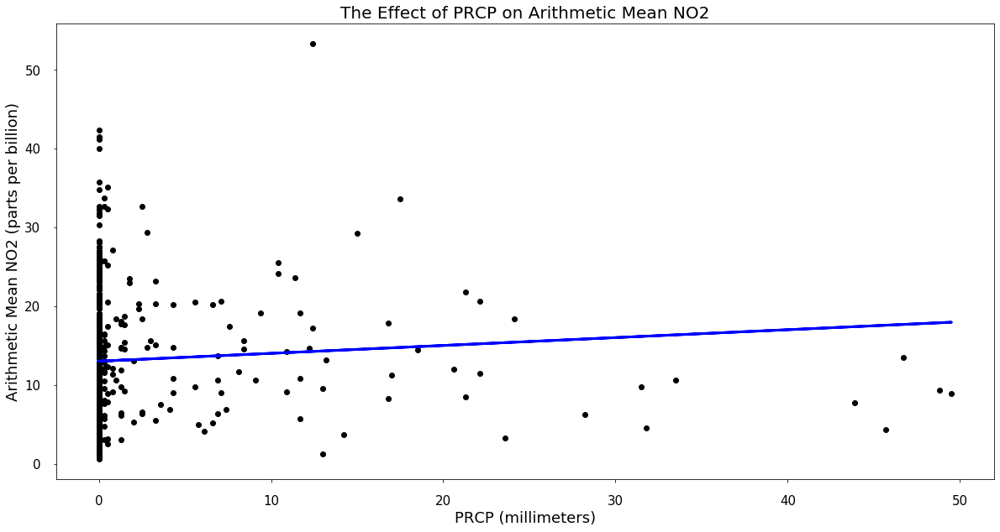

Explained Variance 0.35
Correlation Coefficient 0.59
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMIN']
Coefficients [ 0.09986664 -1.89592088 -0.0067243  -0.47790623]


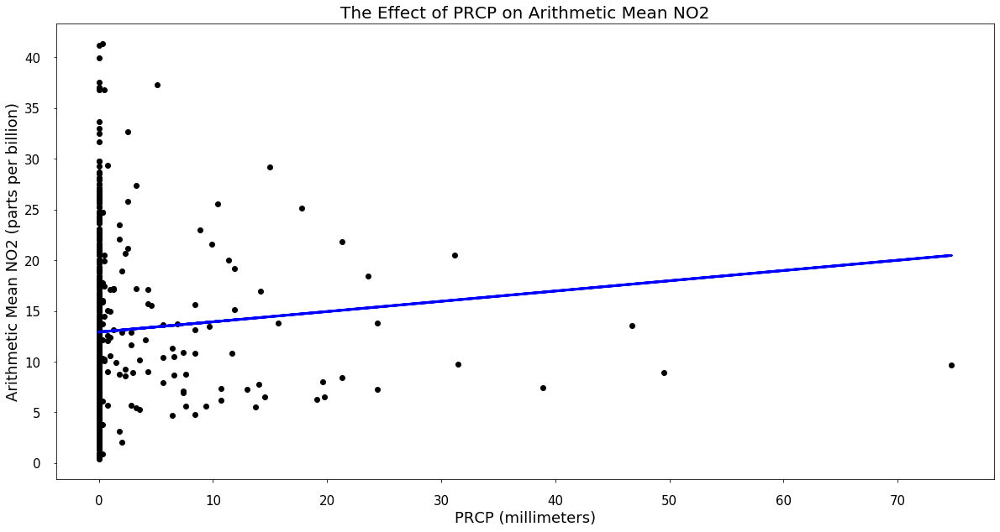

Explained Variance 0.35
Correlation Coefficient 0.59
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMIN']
Coefficients [ 0.1010917  -1.89034471 -0.48271592]


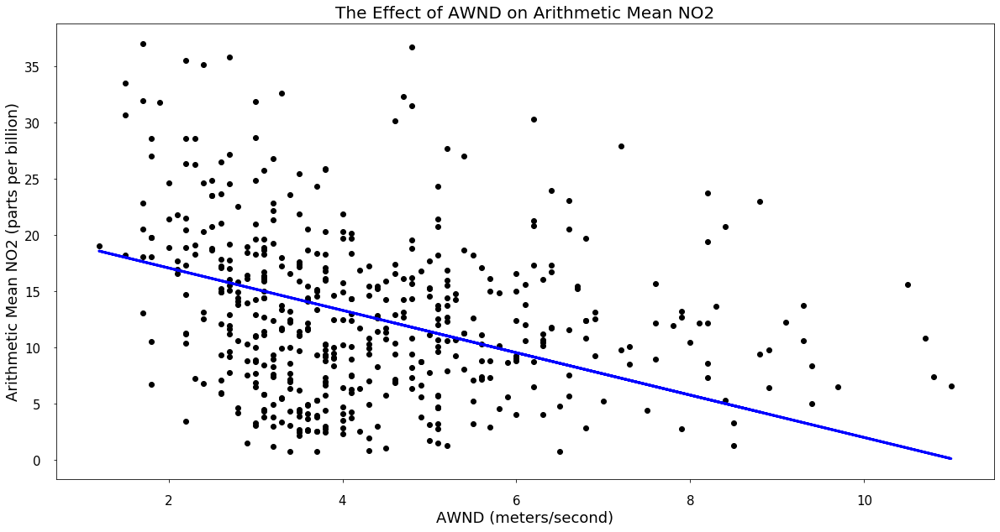

Explained Variance 0.34
Correlation Coefficient 0.59
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMIN']
Coefficients [-1.88404045  0.01087514 -0.4650211 ]


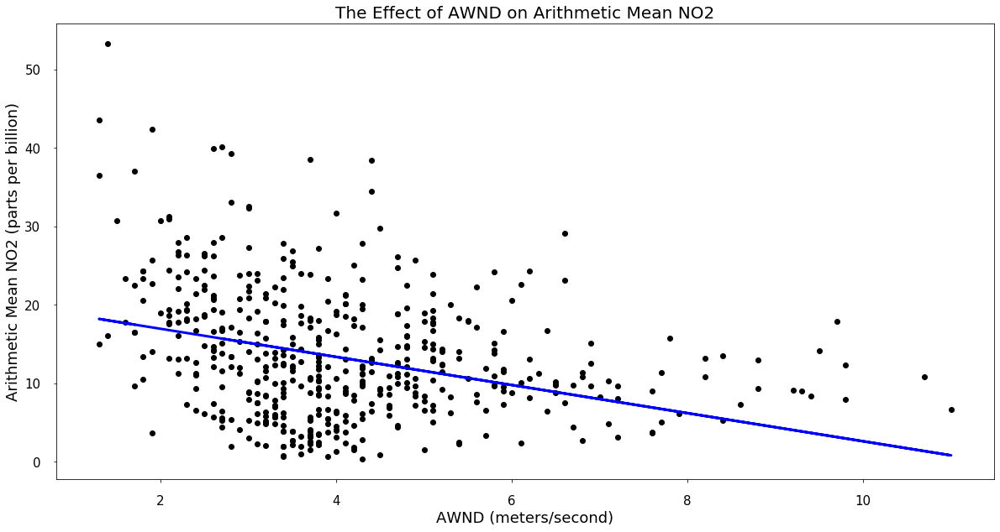

Explained Variance 0.34
Correlation Coefficient 0.59
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [-1.79311562  0.01146997 -0.0032181  -0.4542481 ]


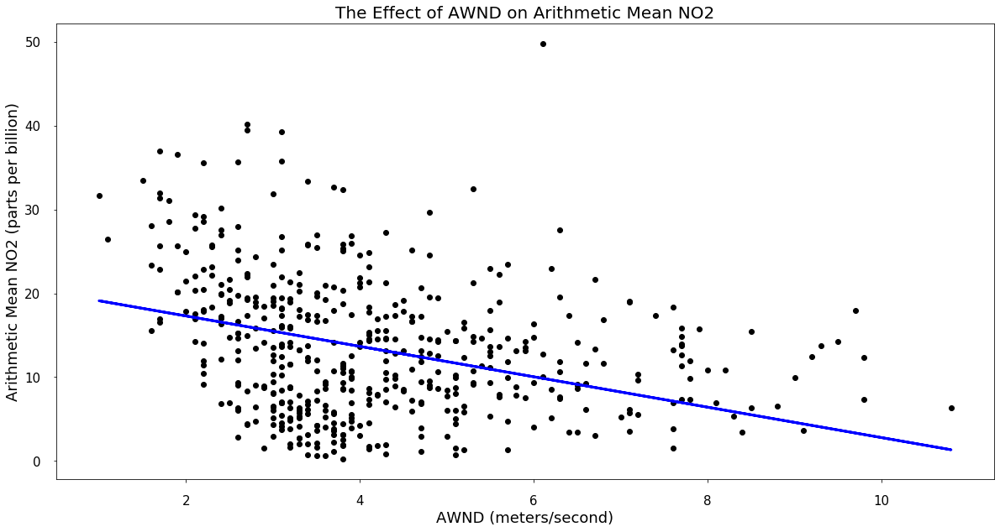

Explained Variance 0.34
Correlation Coefficient 0.59
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMIN']
Coefficients [-1.81476753e+00  1.29283823e-03 -4.67662297e-01]


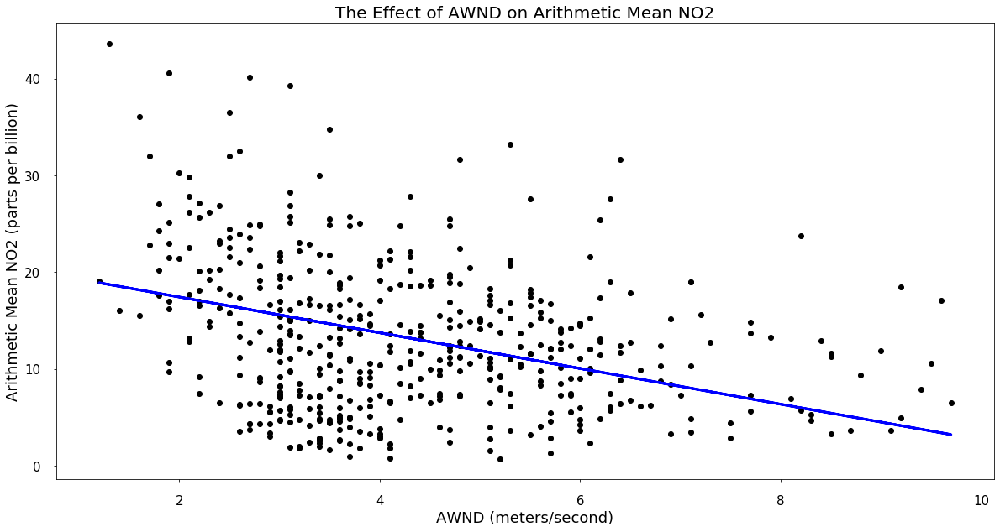

Explained Variance 0.34
Correlation Coefficient 0.58
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMIN']
Coefficients [-1.84308275 -0.48270689]


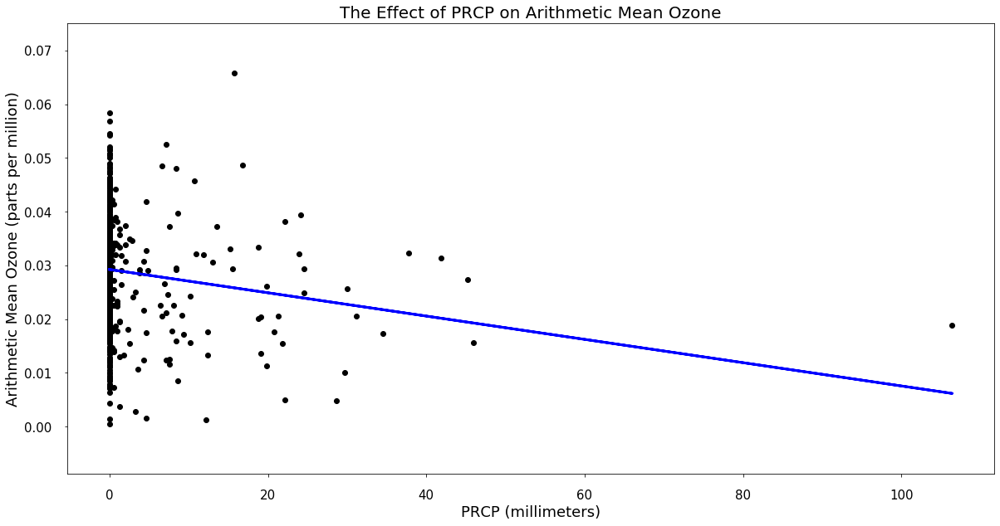

Explained Variance 0.31
Correlation Coefficient 0.56
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-2.16726470e-04  1.45335118e-03  3.50534967e-05 -3.37861763e-04
  8.63297056e-04  1.49988955e-04]


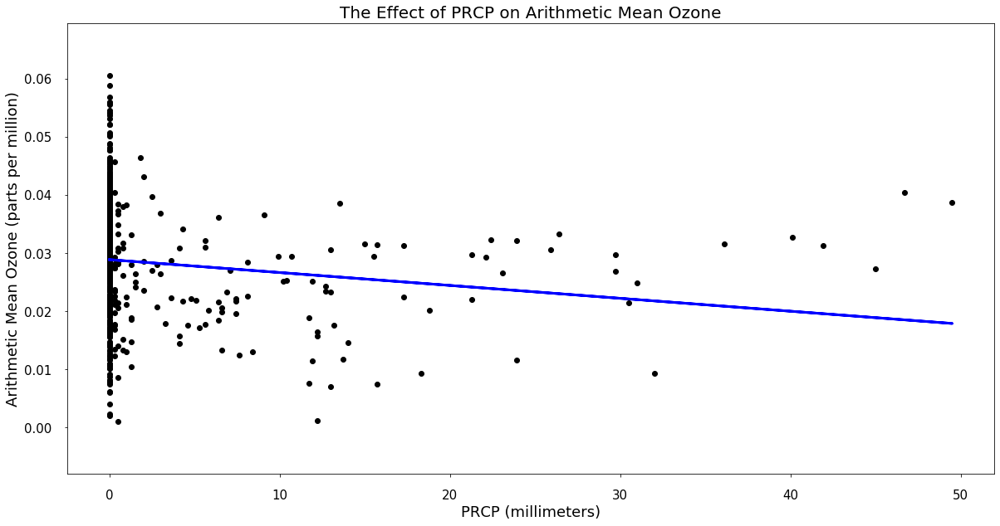

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-2.21619564e-04  1.46313950e-03  3.32060639e-05  7.01609386e-04
 -1.07259687e-05]


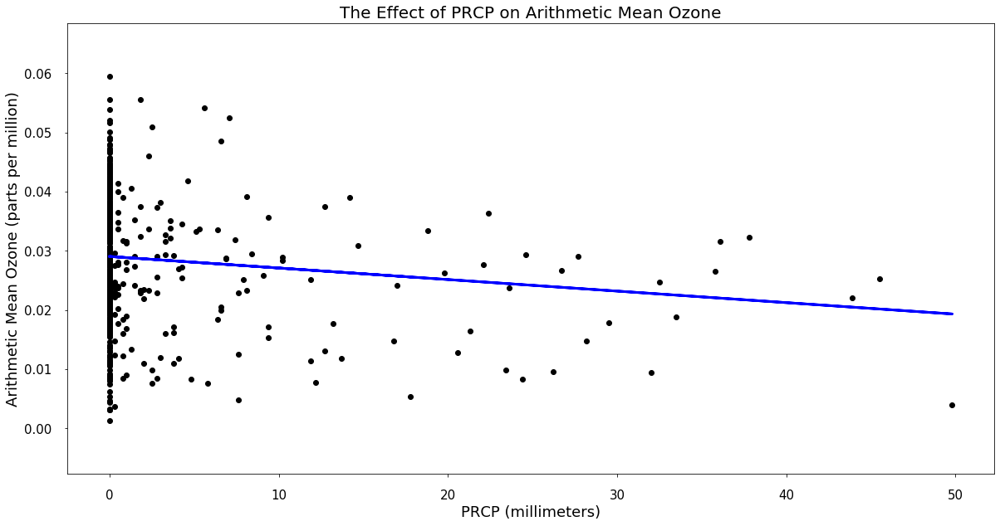

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-1.95177418e-04  1.39156990e-03  6.54768263e-06  3.03065696e-05
  6.92792943e-04 -4.33216378e-06]


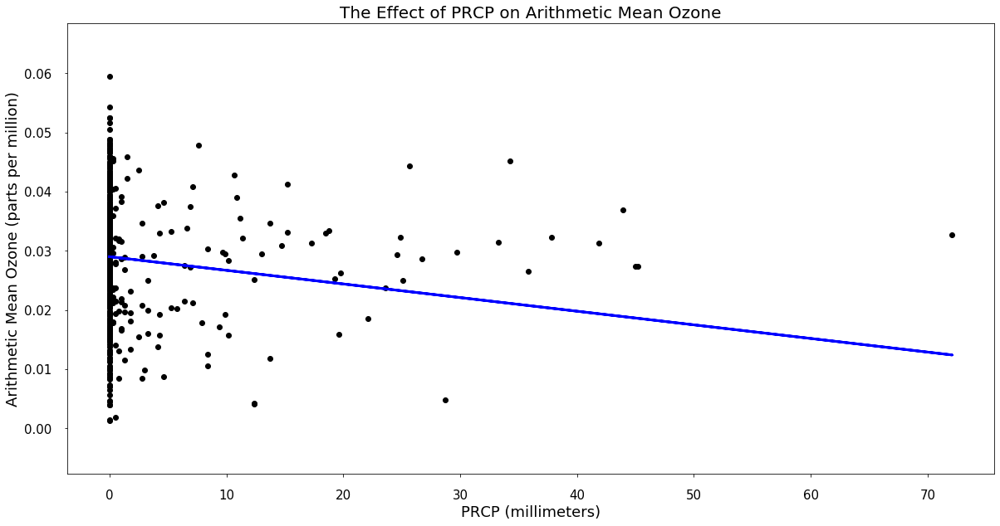

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX']
Coefficients [-2.30471515e-04  1.34807598e-03  6.49888132e-06  3.62949455e-05
  6.97251475e-04]


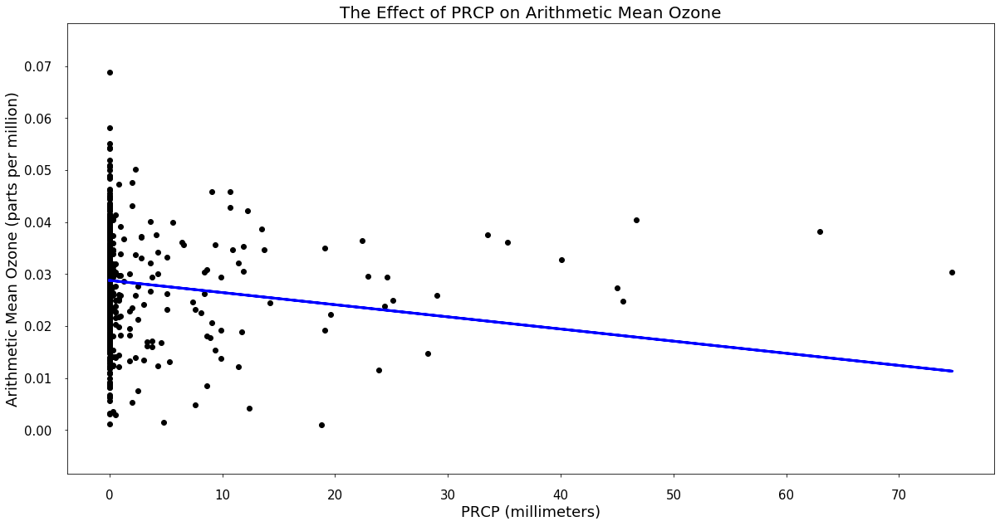

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMAX']
Coefficients [-2.33661836e-04  1.32523397e-03  3.82368143e-05  6.83793928e-04]


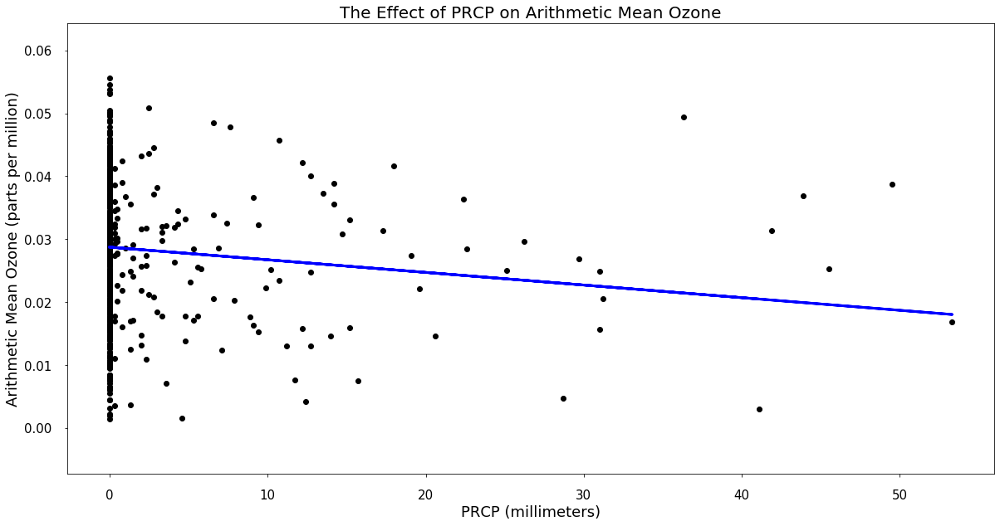

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.00020073  0.00144489 -0.00039828  0.00084302  0.00021456]


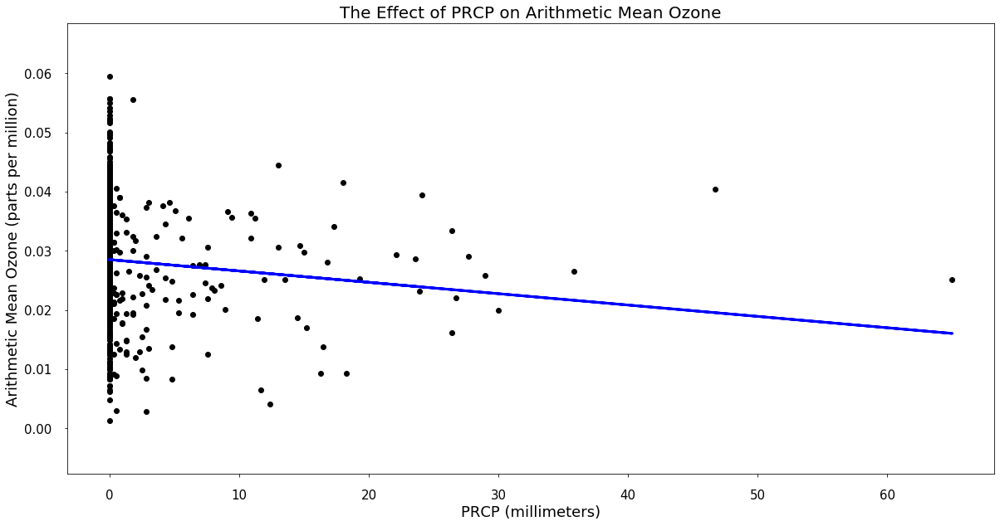

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX']
Coefficients [-1.92046880e-04  1.43092099e-03 -7.68440324e-05  7.37116553e-04]


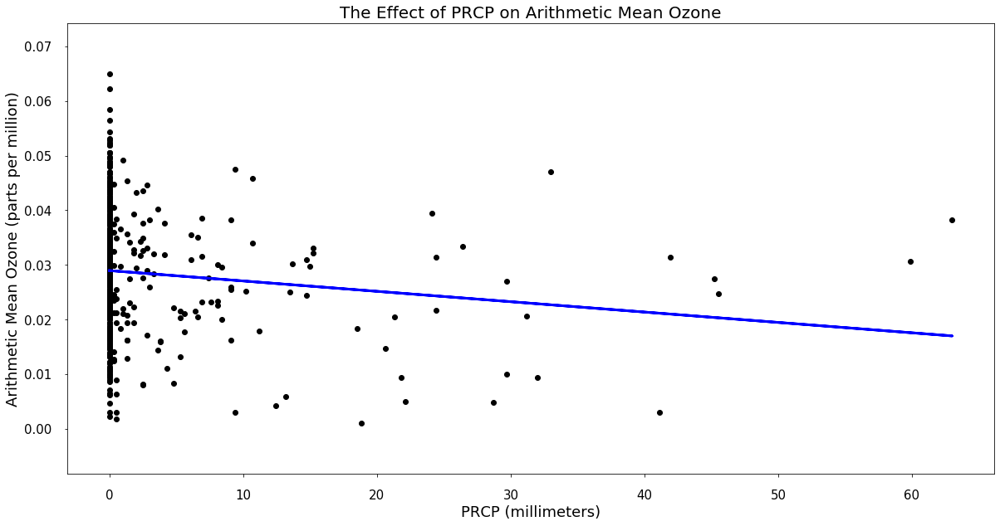

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMAX']
Coefficients [-0.00018976  0.00135285  0.00066334]


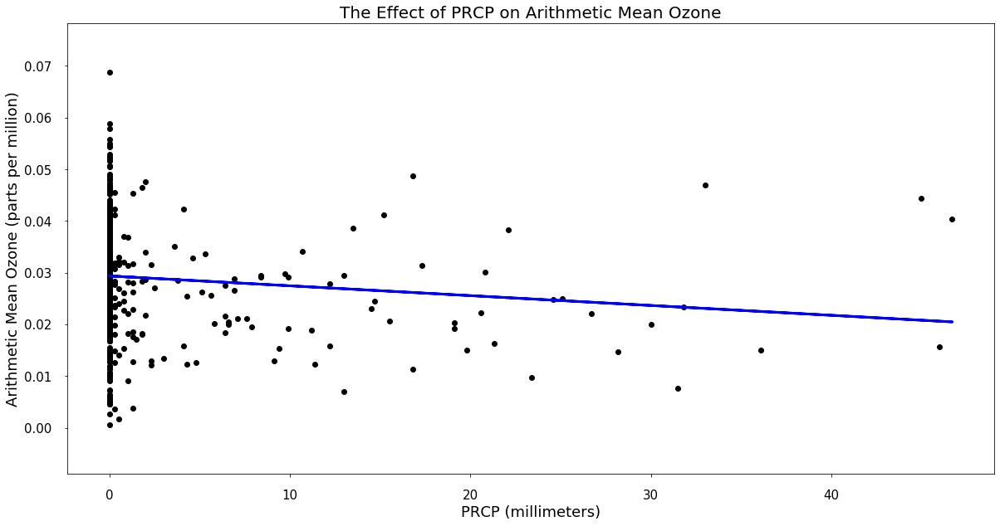

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [-1.90249620e-04  1.44910718e-03  9.35995855e-06  6.67113680e-04
  1.22240115e-05]


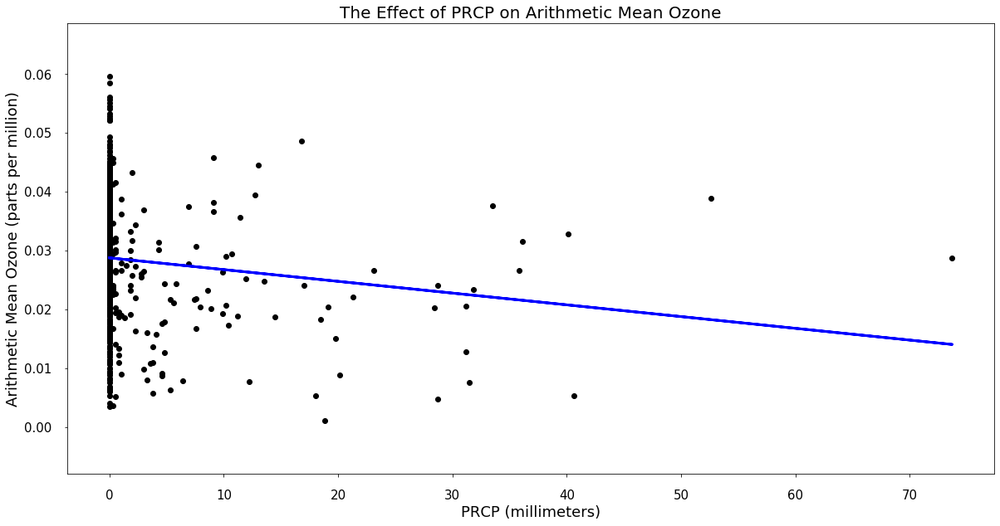

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-1.99671841e-04  1.35685790e-03  4.50501715e-05 -9.90025387e-05
  7.69438724e-04]


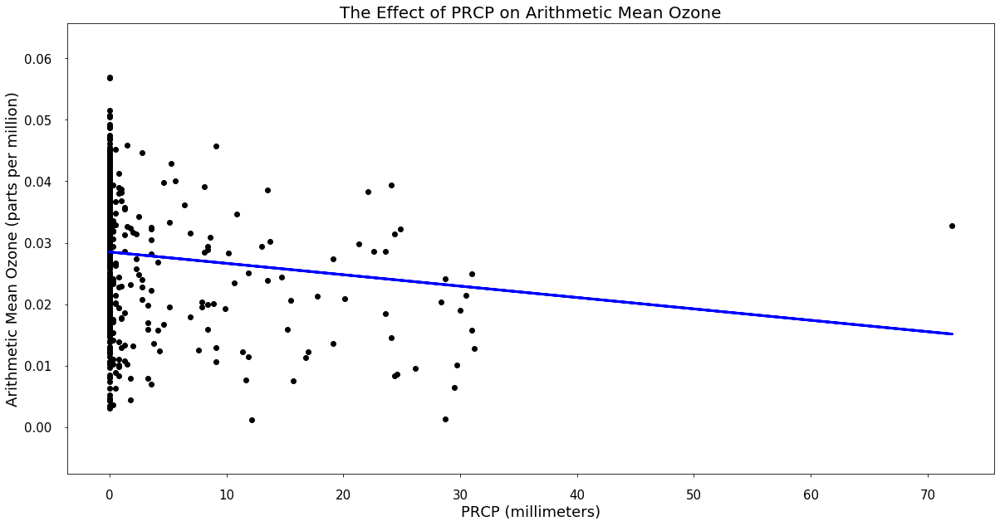

Explained Variance 0.31
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-1.85205533e-04  1.36686112e-03  8.57548485e-06  3.00160766e-05
 -8.47085688e-05  7.71028576e-04]


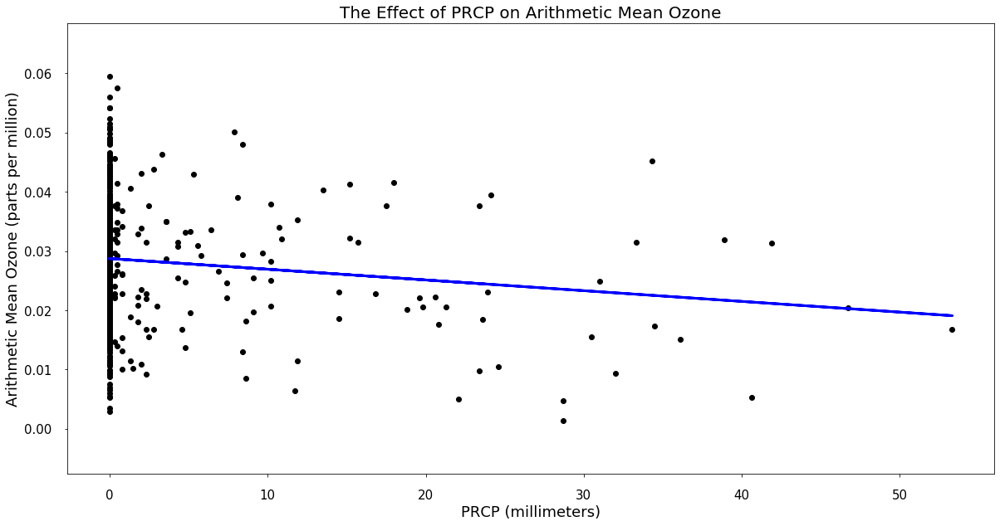

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.81034863e-04  1.46373270e-03  1.14066508e-05 -3.33086403e-04
  8.65150402e-04  1.56534497e-04]


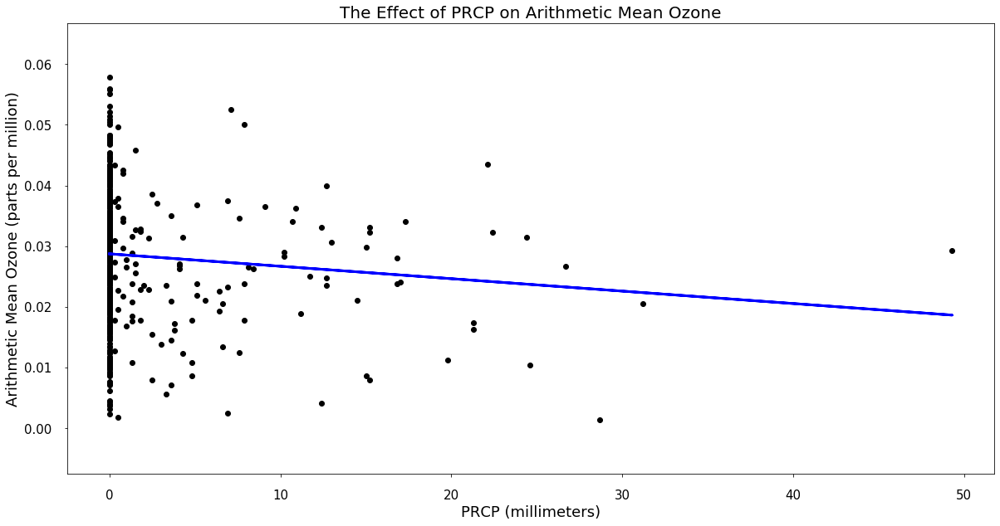

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-2.04739004e-04  1.42441324e-03  8.68975764e-06  2.76386396e-05
 -3.53114003e-04  8.84576595e-04  1.54157879e-04]


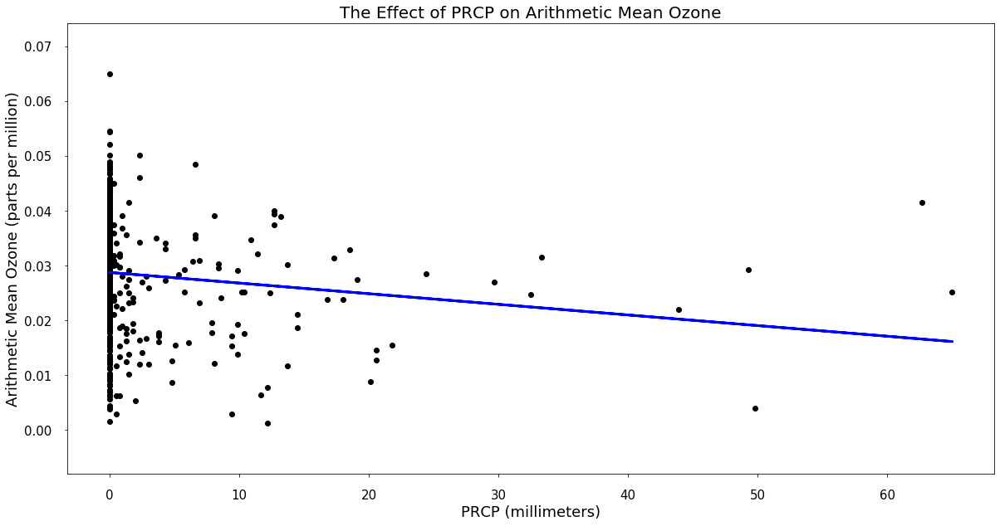

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMAX', 'TMIN']
Coefficients [-1.94004065e-04  1.42046792e-03  6.68245966e-04 -6.34296339e-07]


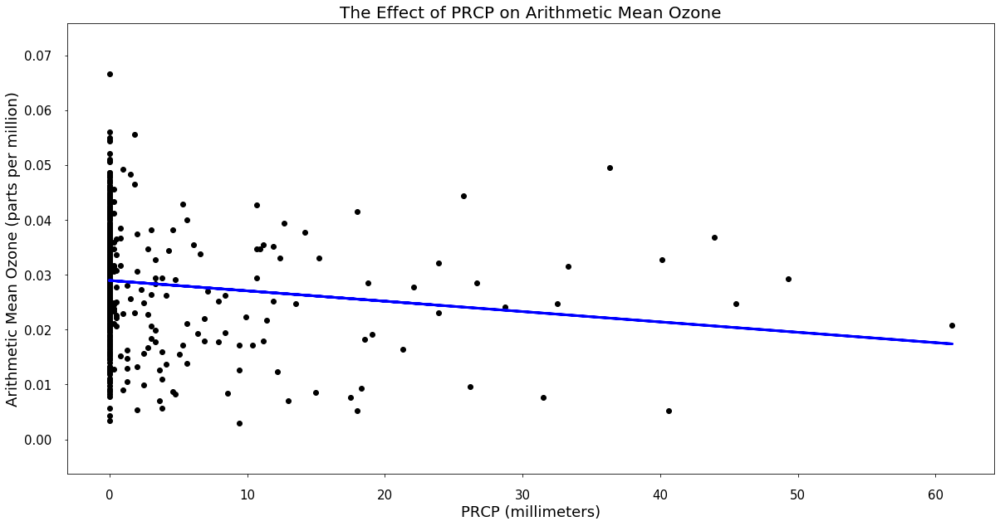

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMAX']
Coefficients [-1.88960827e-04  1.41044257e-03  1.06202683e-05  6.88700134e-04]


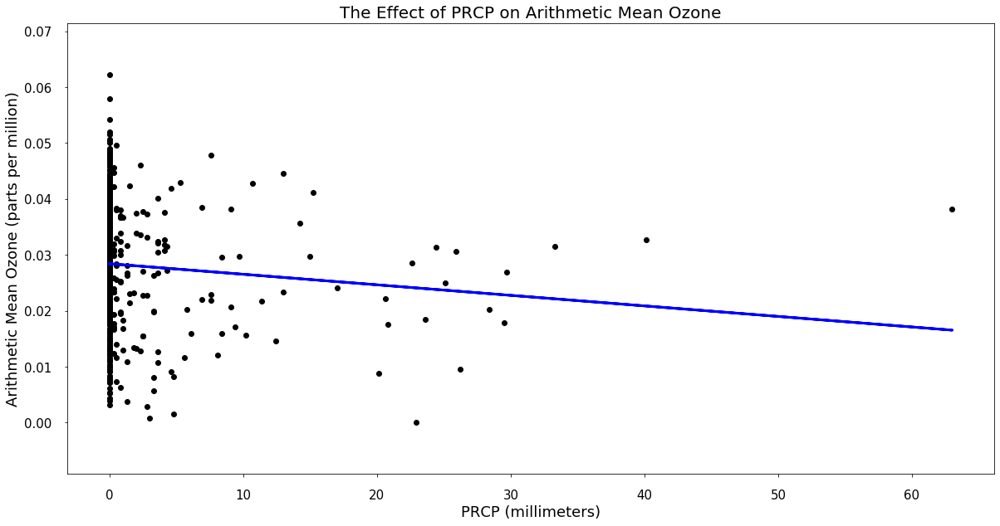

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [-1.88547558e-04  1.43783020e-03  1.25789509e-05 -8.52846571e-05
  7.61474216e-04]


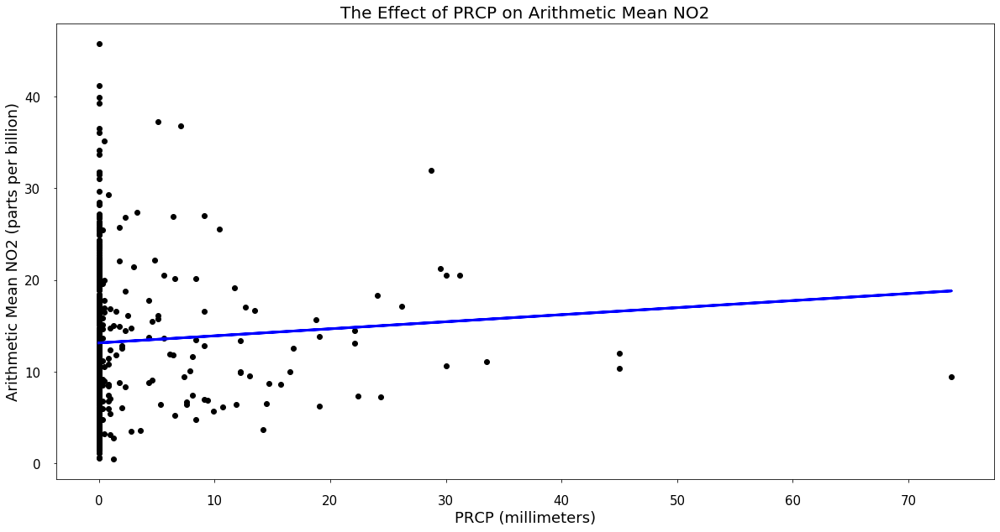

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG']
Coefficients [ 0.07687451 -1.81405376  0.01604576 -0.41575446]


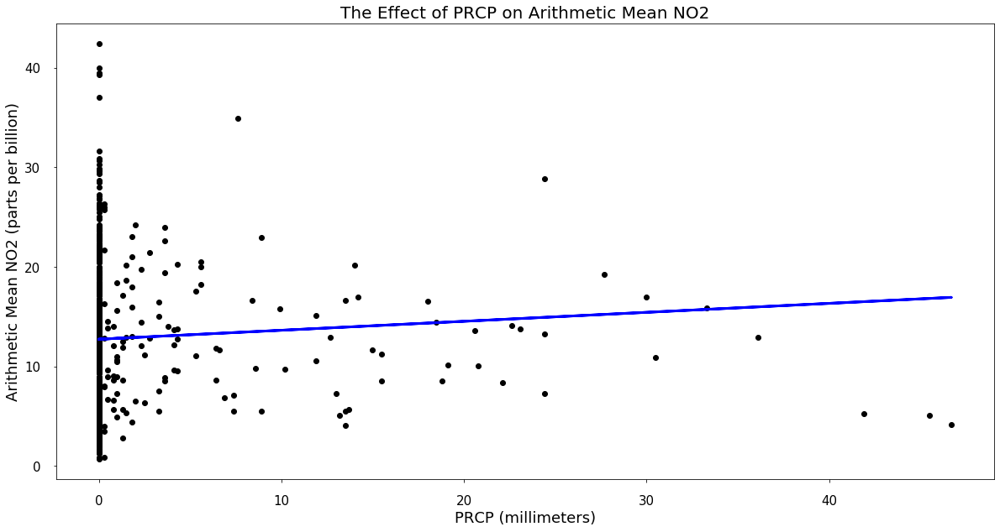

Explained Variance 0.30
Correlation Coefficient 0.55
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG']
Coefficients [ 0.09001547 -1.82459423  0.0169631  -0.0085464  -0.41861898]


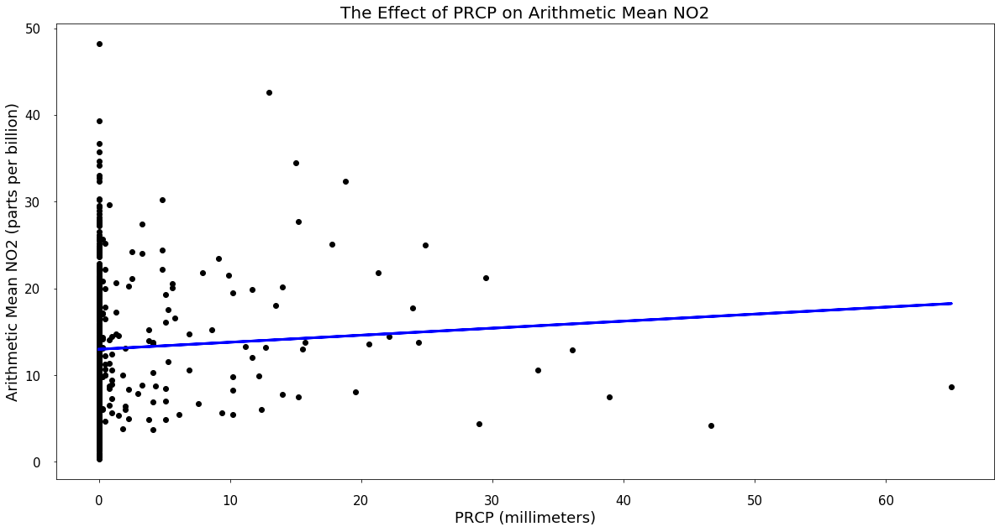

Explained Variance 0.30
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG']
Coefficients [ 0.0809853  -1.82982765 -0.4338653 ]


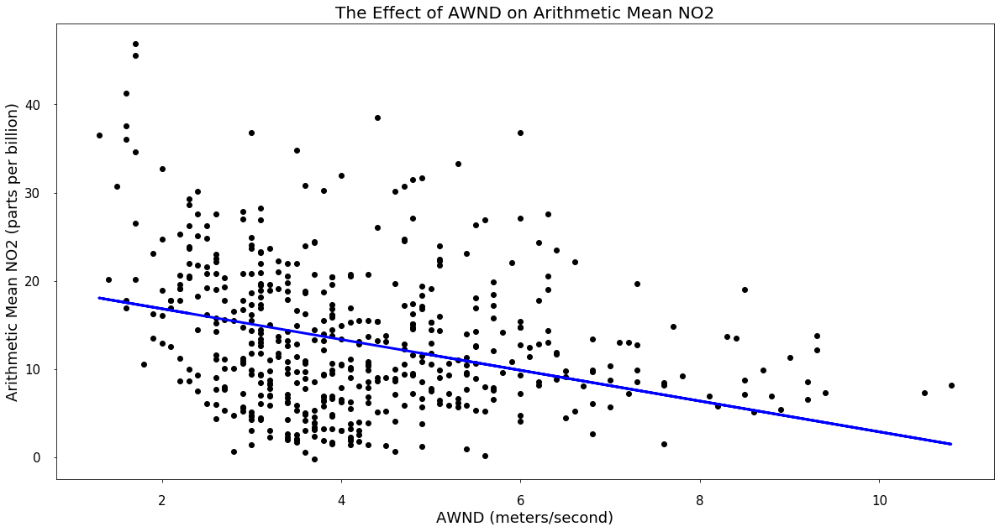

Explained Variance 0.30
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG']
Coefficients [-1.74460472e+00  1.45890439e-02 -9.04742864e-04 -4.09734108e-01]


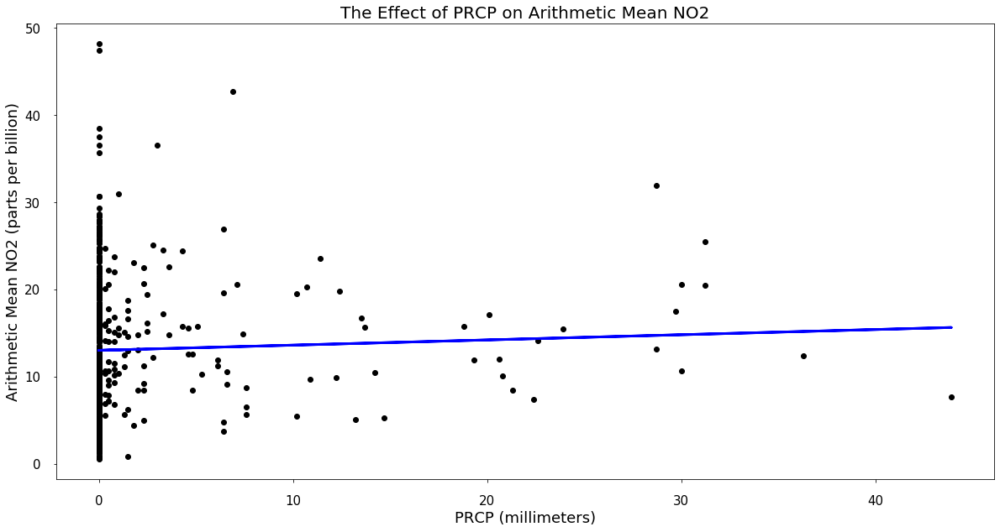

Explained Variance 0.30
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.05977916  0.01524145 -0.91490546  1.12016536 -0.55917679]


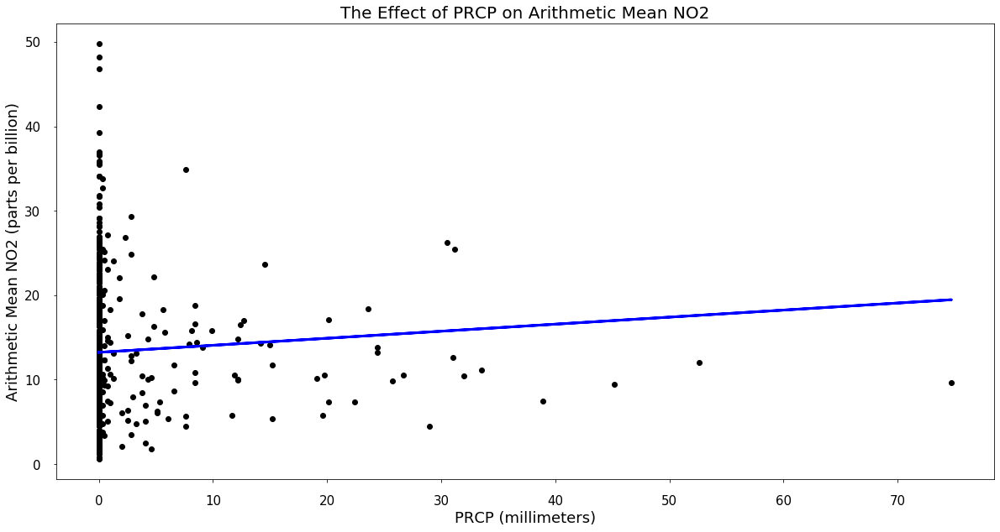

Explained Variance 0.30
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.08342072  0.01387199 -0.01538256 -0.9079789   1.11138922 -0.56610751]


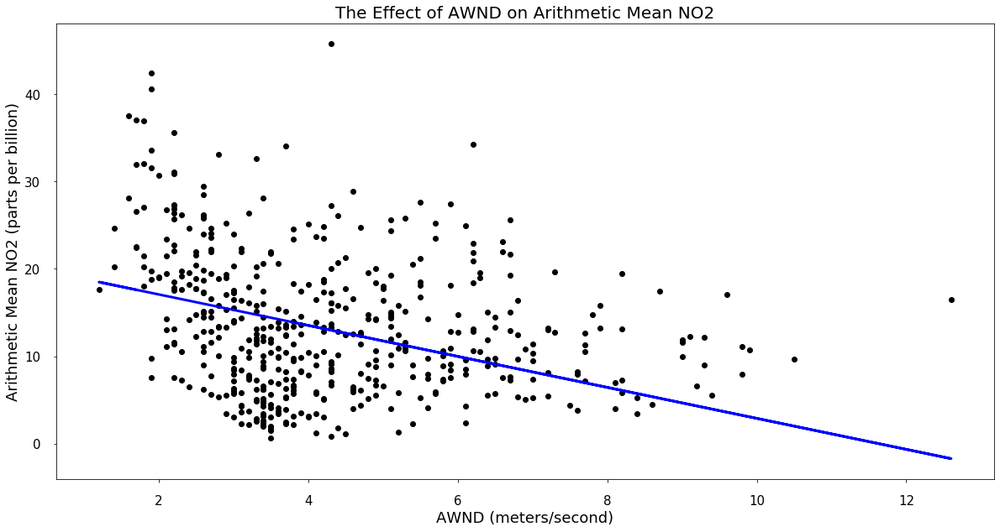

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG']
Coefficients [-1.77274288  0.01185706 -0.42067444]


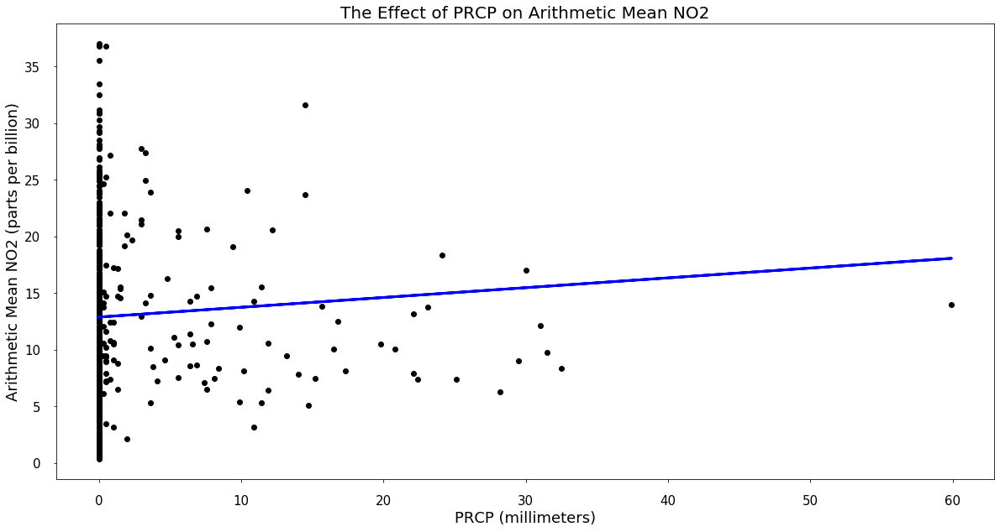

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG']
Coefficients [ 0.08661545 -1.86541617 -0.00581852 -0.43665136]


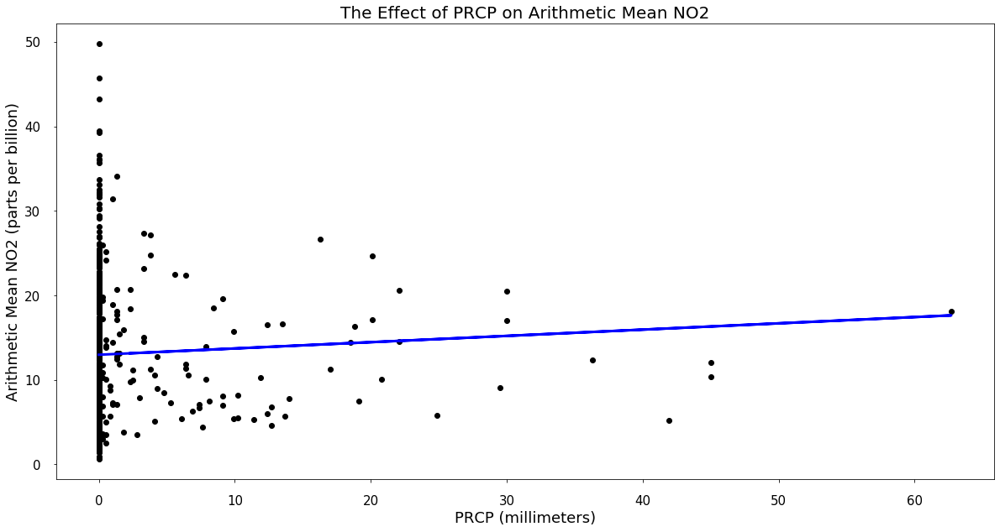

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.07432664 -0.01109211 -0.77584168  1.05832467 -0.6607739 ]


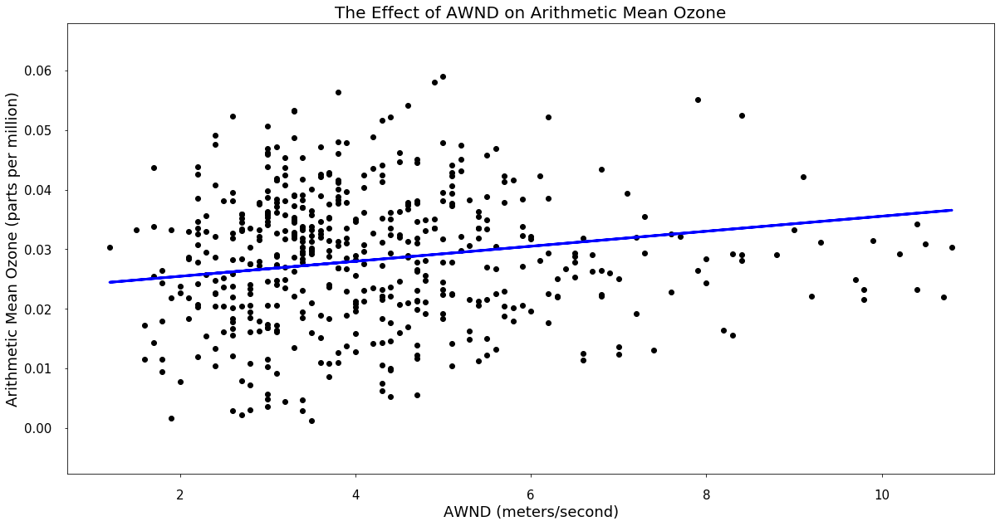

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 1.26011204e-03  7.75279512e-06  1.57355424e-05 -3.45419228e-04
  8.88863394e-04  1.27212350e-04]


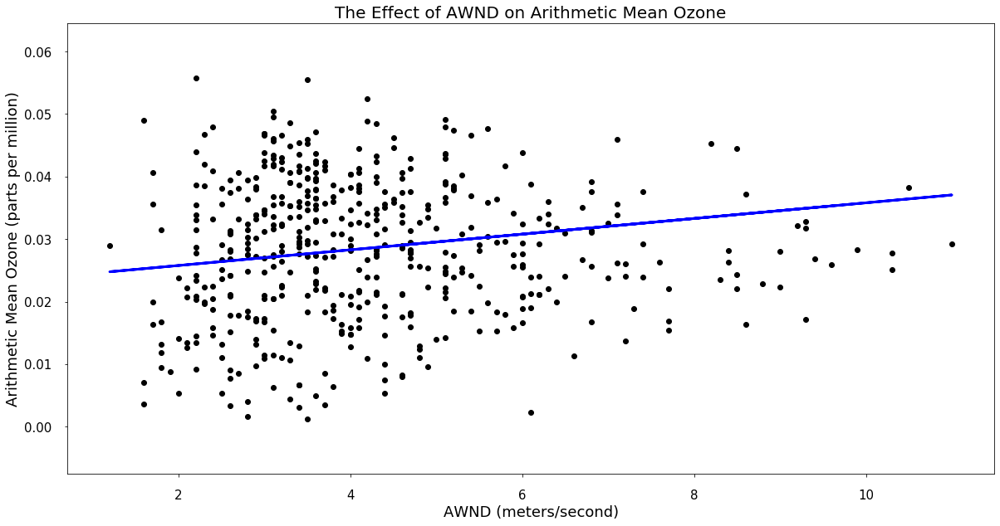

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 1.25326122e-03  1.74604216e-05 -2.08285256e-04  8.65097926e-04]


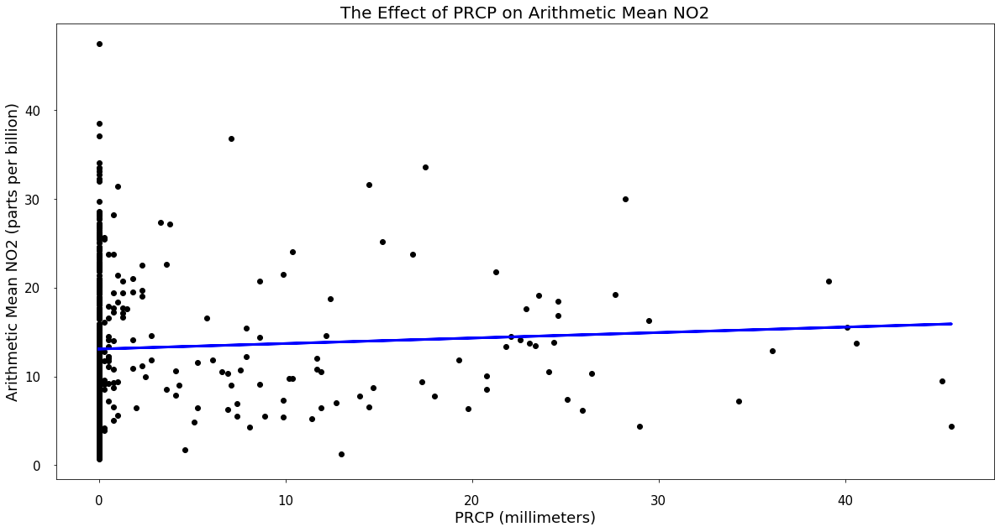

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.0618117  -0.82952822  1.06980065 -0.61568328]


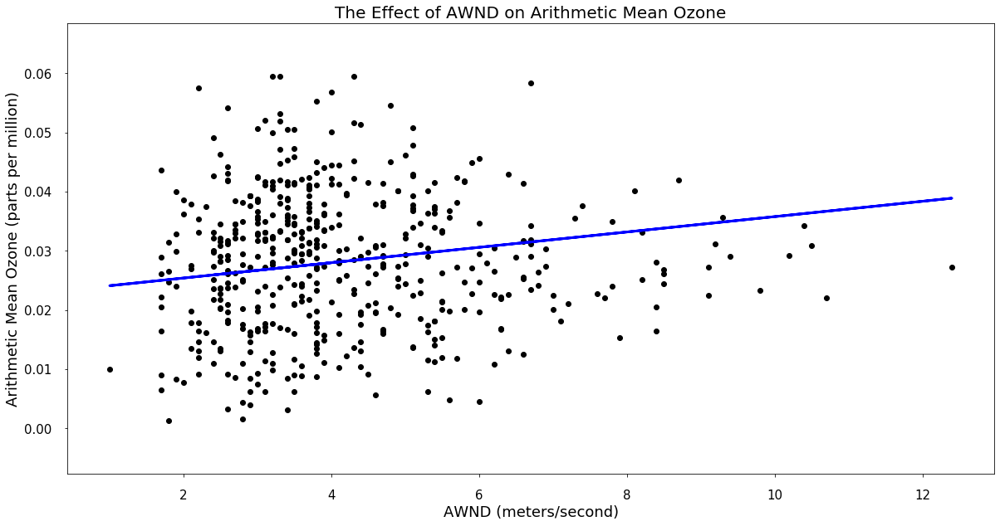

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [ 1.29769139e-03  8.45941581e-06 -1.75406264e-04  8.40903119e-04]


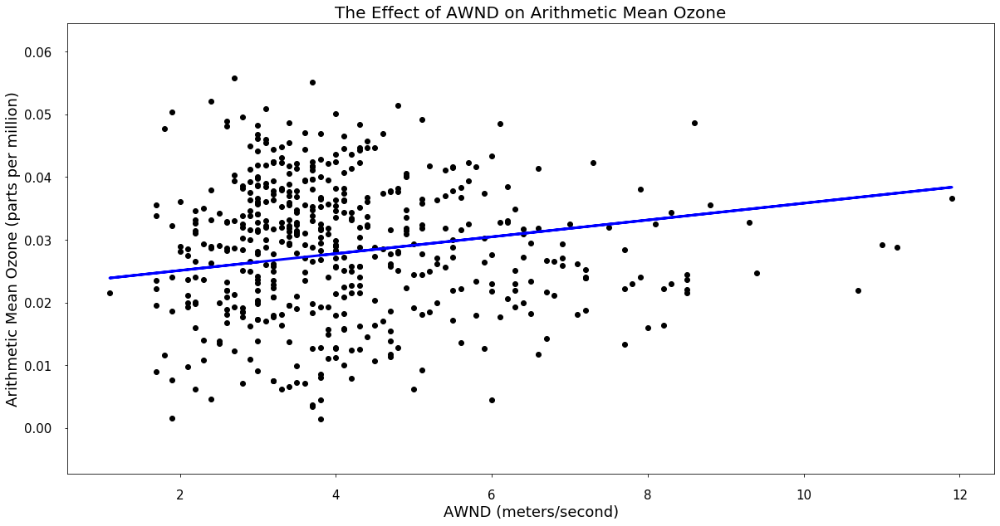

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 1.33985750e-03  8.68989966e-06 -4.11526973e-04  9.27884773e-04
  1.58285907e-04]


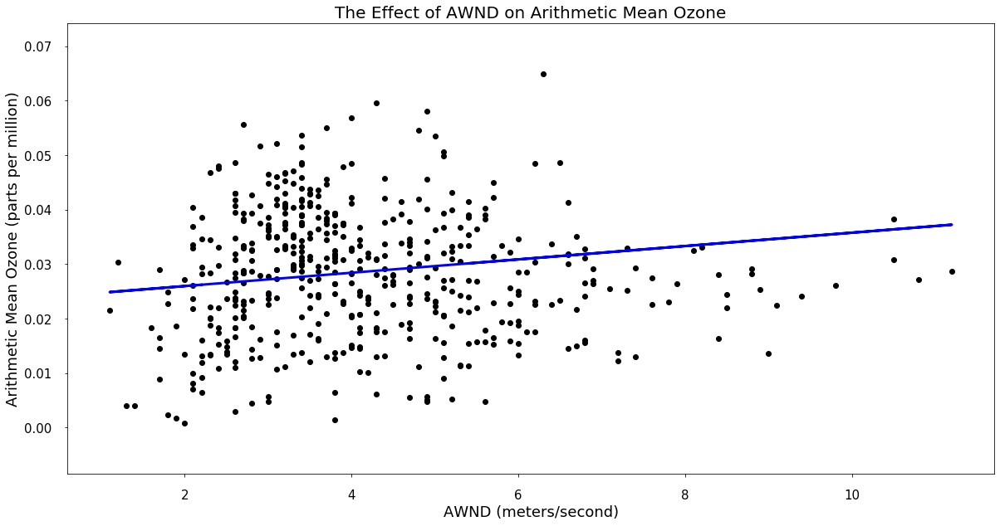

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMAX']
Coefficients [1.22497871e-03 9.58717149e-06 2.52105462e-05 6.85597192e-04]


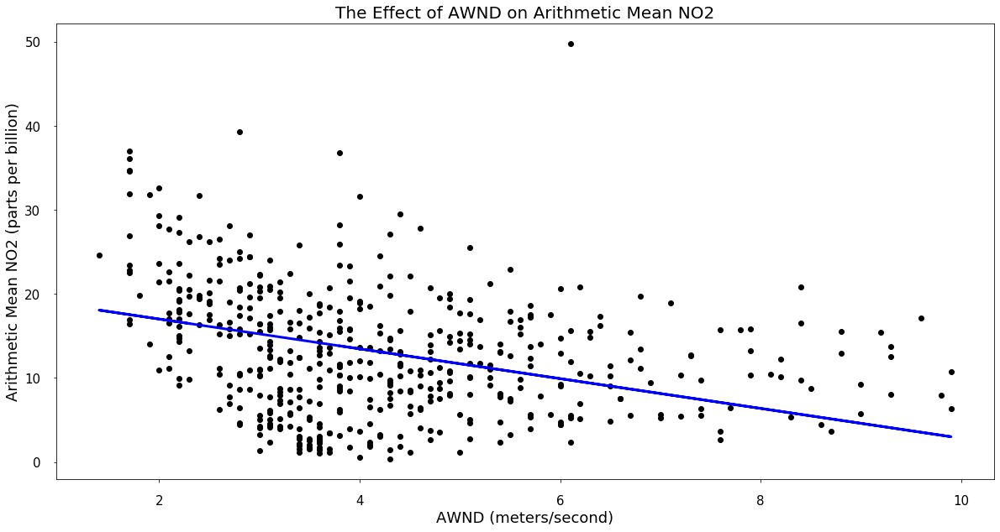

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG']
Coefficients [-1.77309366 -0.44367863]


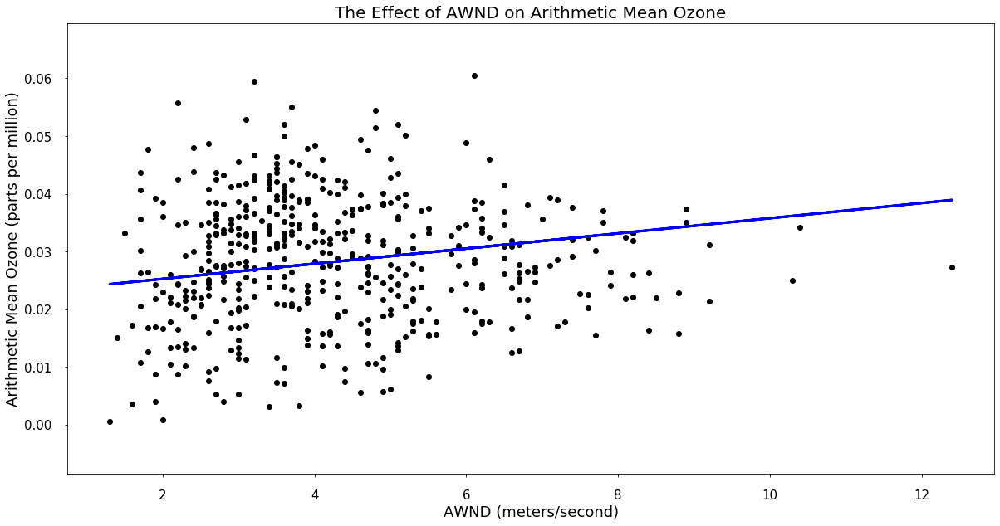

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 1.31362940e-03  1.76187156e-05 -4.33240837e-04  9.44401579e-04
  1.52520698e-04]


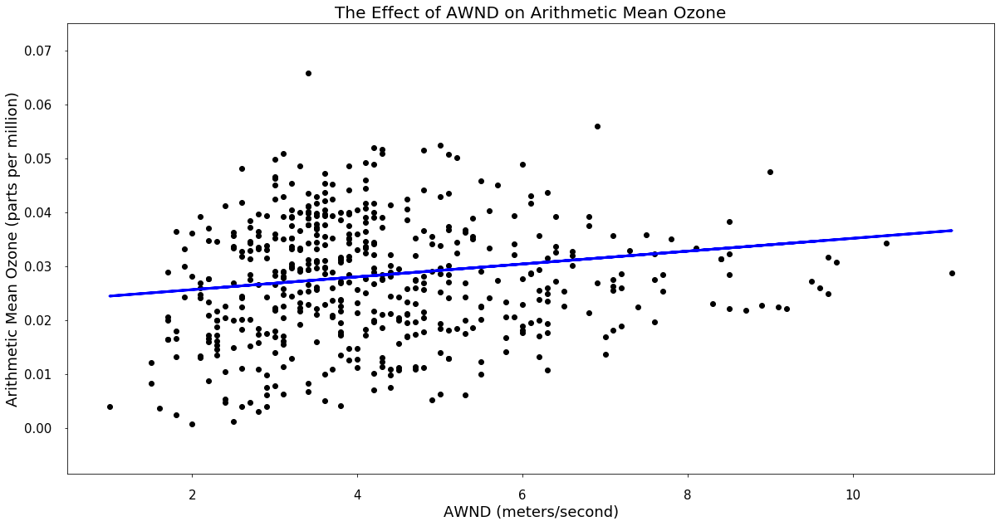

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMAX']
Coefficients [0.00119049 0.00065993]


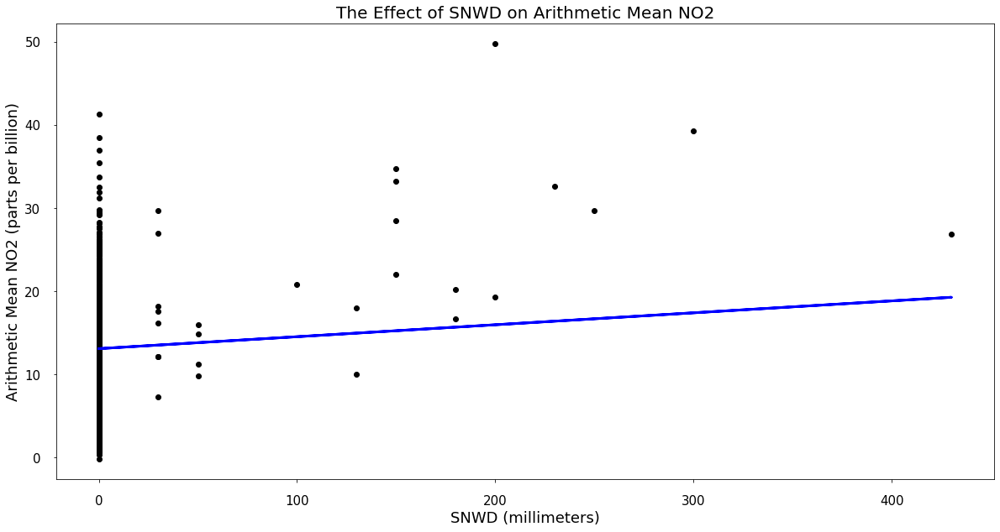

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.01437506 -0.90043491  1.09357347 -0.54377916]


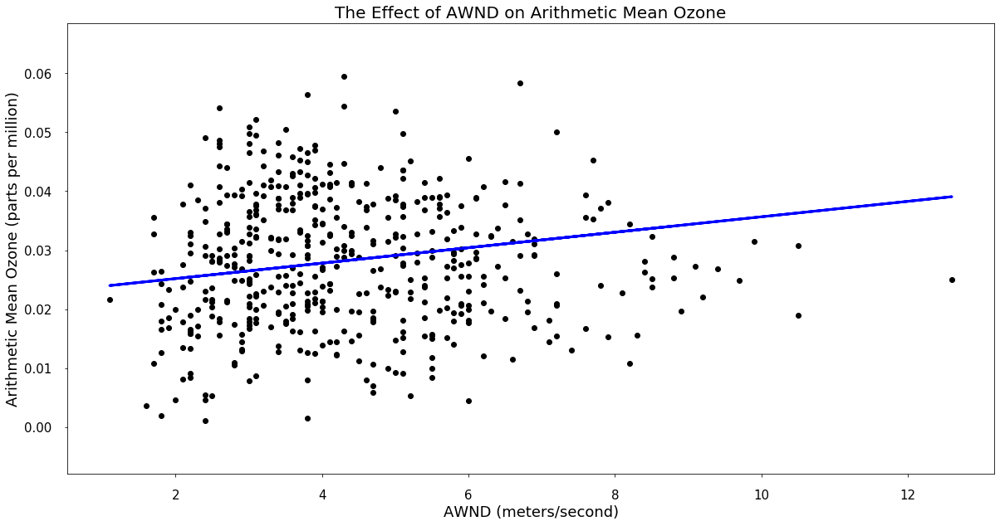

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00131    -0.00039764  0.00090978  0.0001527 ]


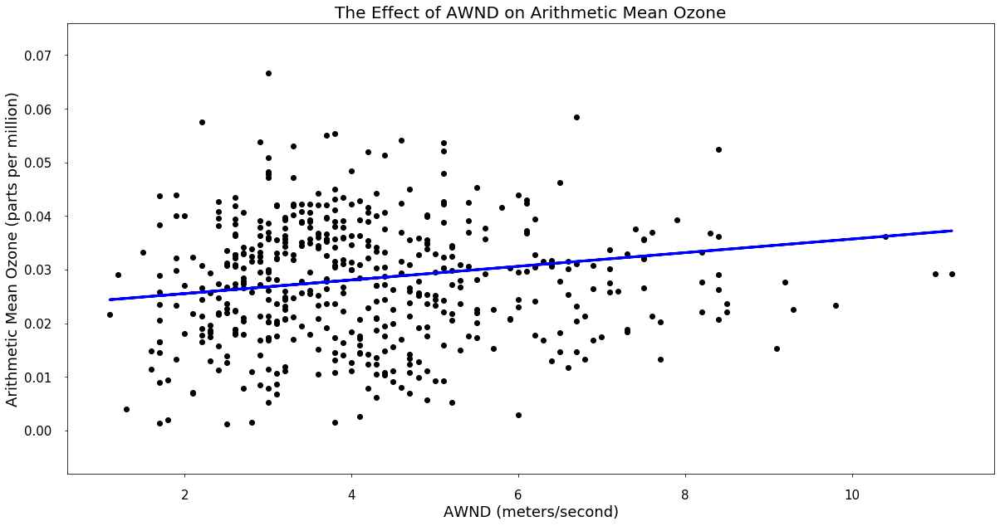

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 1.27131955e-03  6.20999984e-06  1.35343102e-05 -1.21412551e-04
  7.92018360e-04]


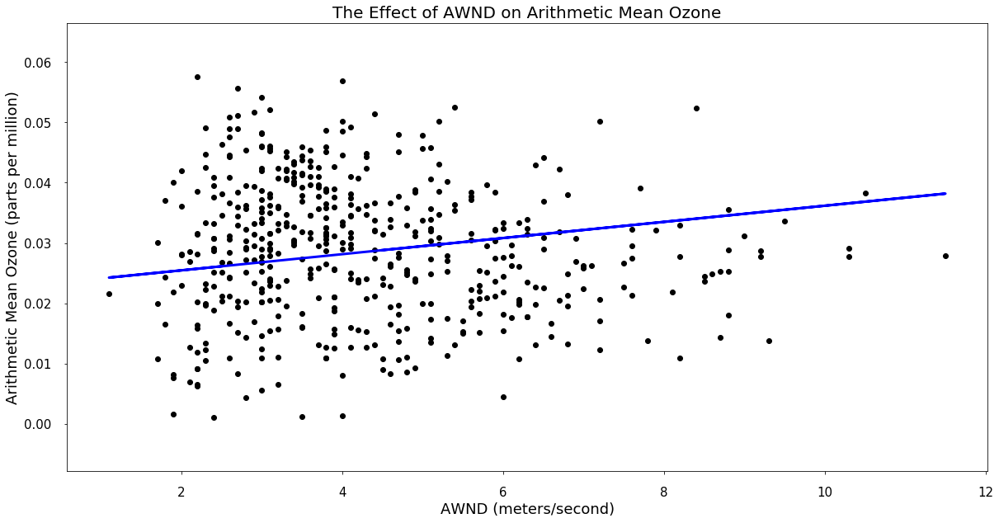

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX']
Coefficients [ 0.00133867 -0.00013694  0.00079236]


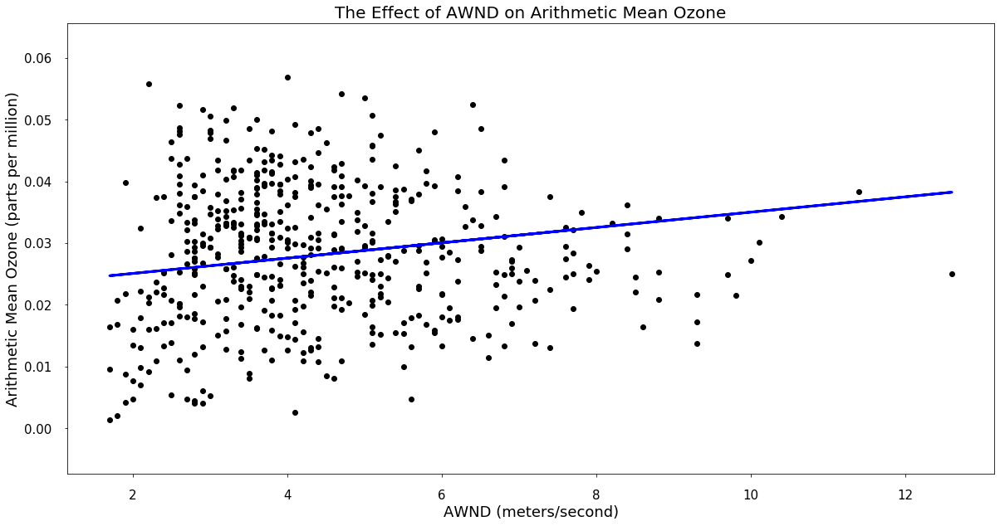

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX']
Coefficients [1.24195505e-03 8.64164321e-06 6.76297083e-04]


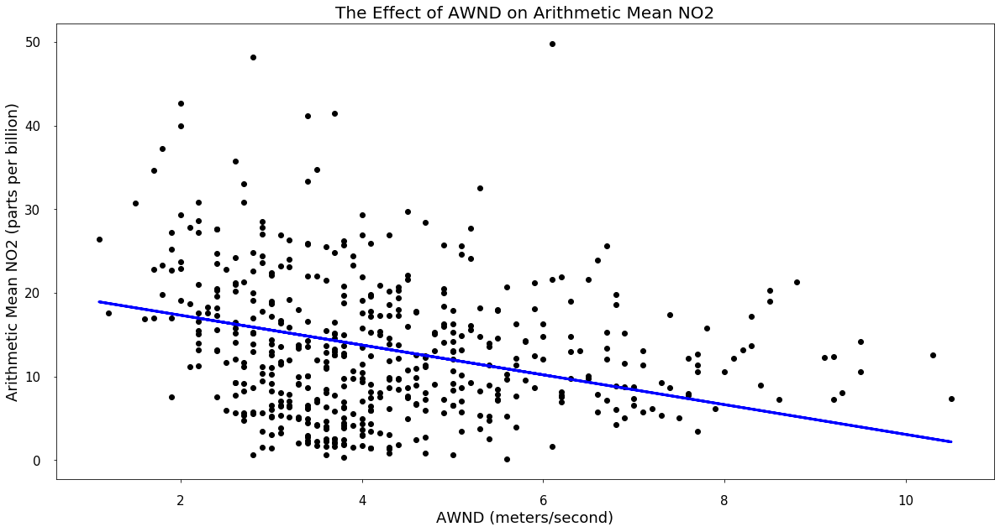

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG']
Coefficients [-1.78197606  0.00277349 -0.42997727]


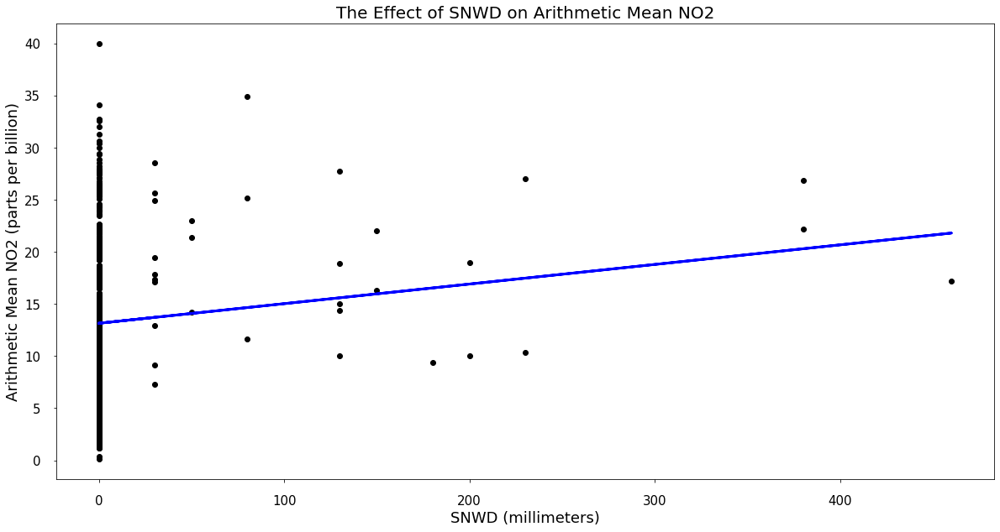

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.01882197 -0.00970578 -0.81365511  1.07421701 -0.61614254]


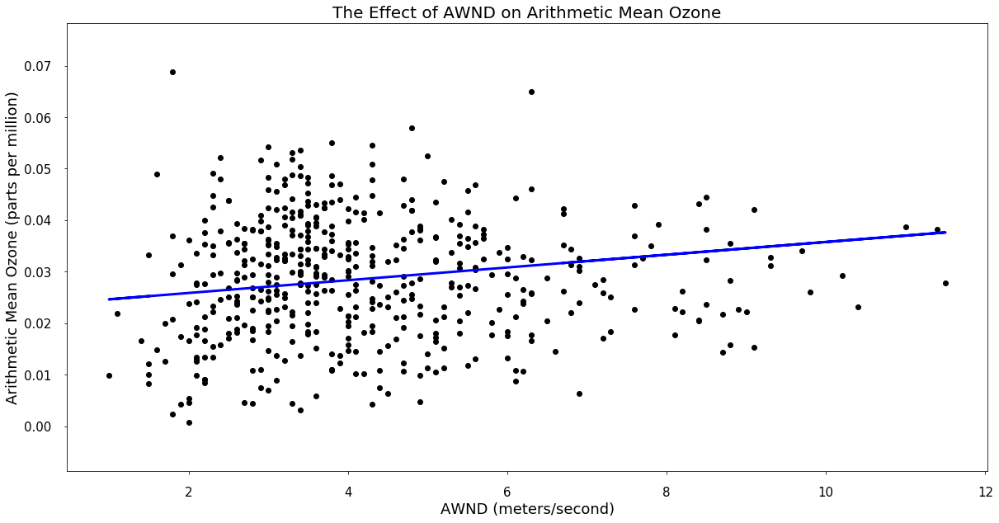

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [ 1.23697011e-03  1.40348495e-05  7.04402533e-04 -2.64133503e-05]


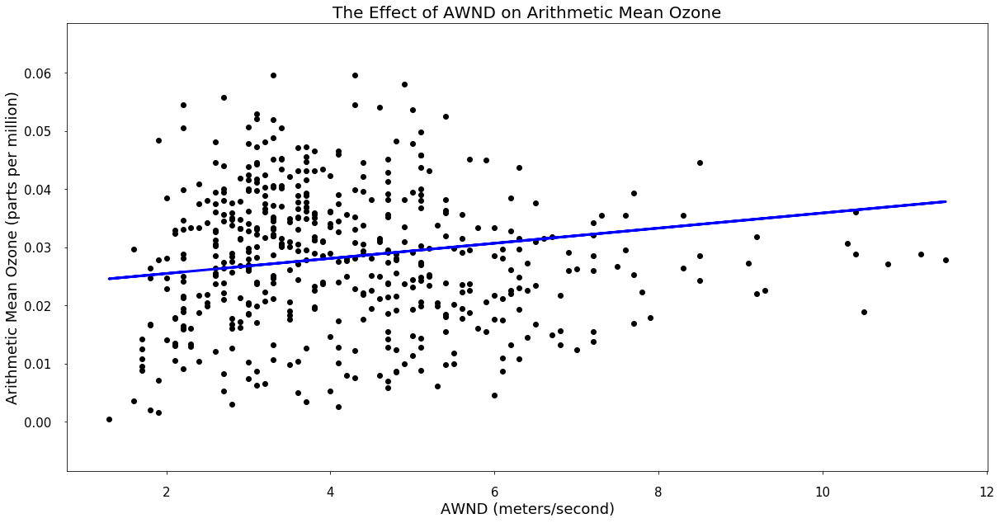

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMAX', 'TMIN']
Coefficients [ 1.29948924e-03  7.06685617e-04 -5.42128995e-05]


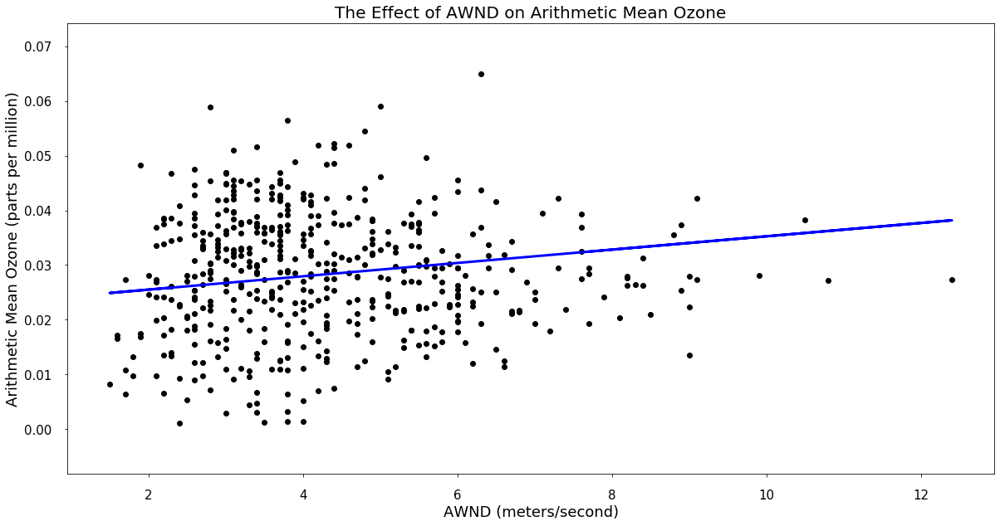

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMAX']
Coefficients [1.21941109e-03 1.59000809e-05 6.70413407e-04]


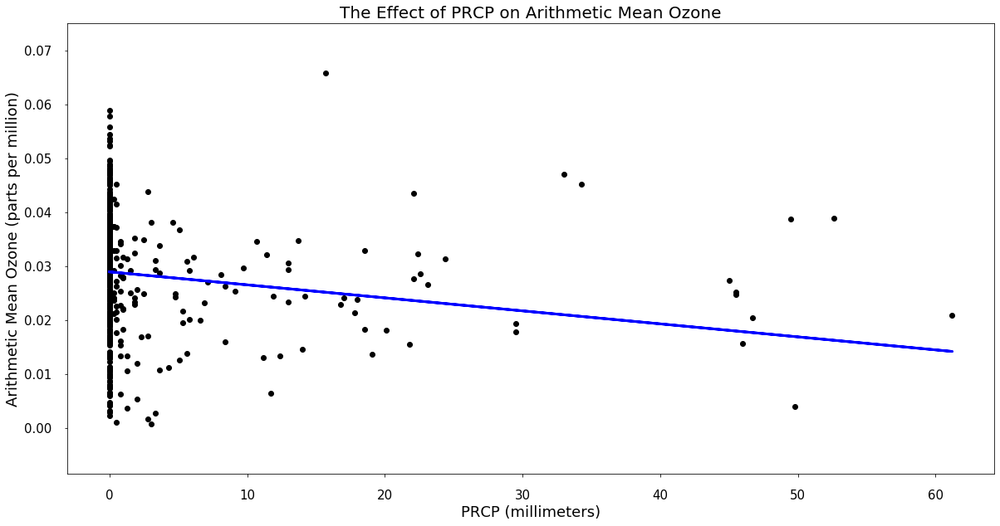

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-2.41165698e-04  1.18889439e-03  9.94438252e-06  3.05544008e-05
  9.59228504e-04 -2.59538624e-04]


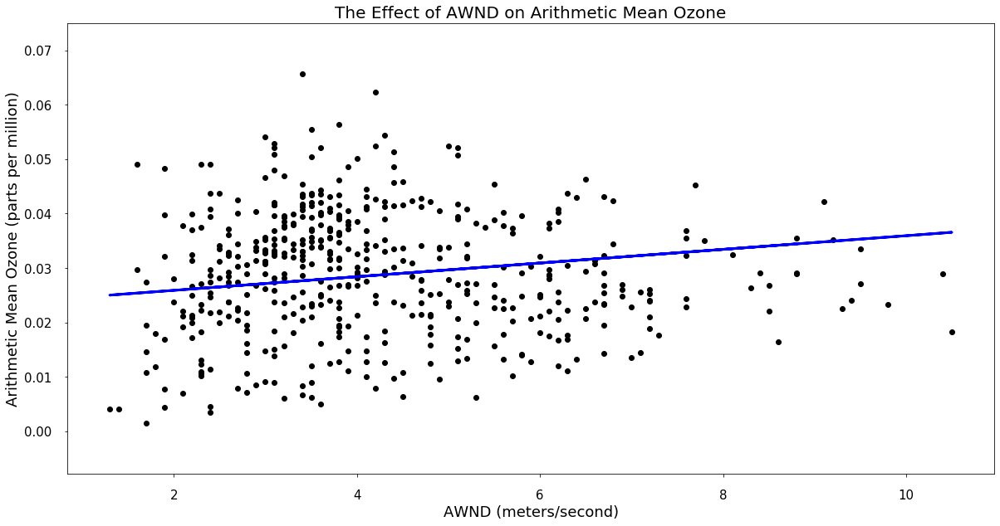

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 1.25567058e-03  1.59340318e-05  7.27389913e-04 -6.91468639e-05]


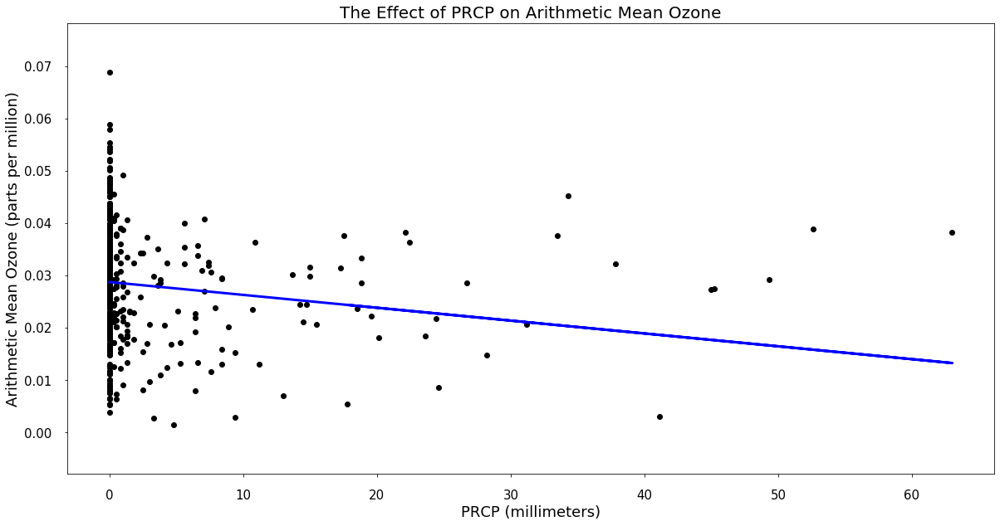

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG']
Coefficients [-2.45775911e-04  1.24237667e-03  7.56394265e-06  3.09551618e-05
  7.01785405e-04]


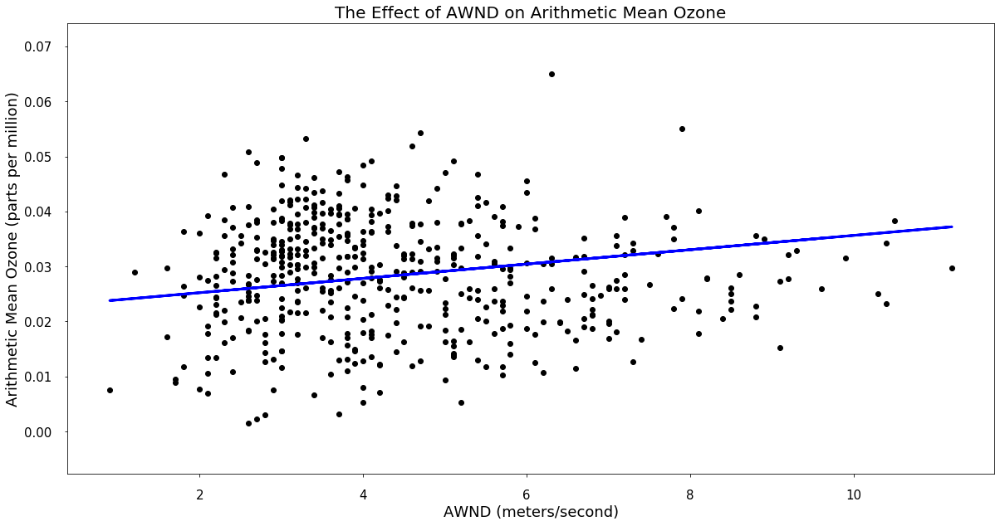

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 1.30177440e-03  8.93893486e-06  1.46469715e-05  7.23378719e-04
 -2.81730074e-05]


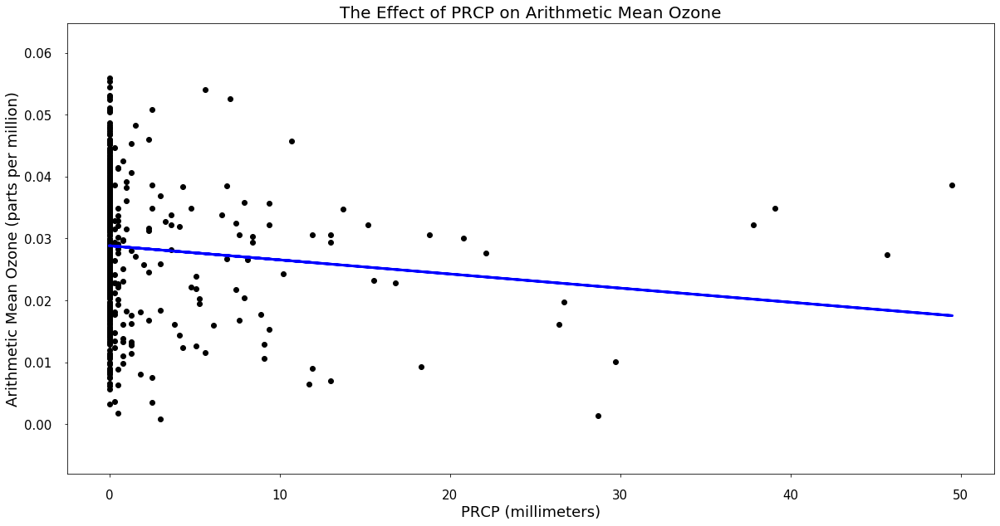

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG']
Coefficients [-2.28174383e-04  1.21957843e-03  3.34842659e-05  6.89704645e-04]


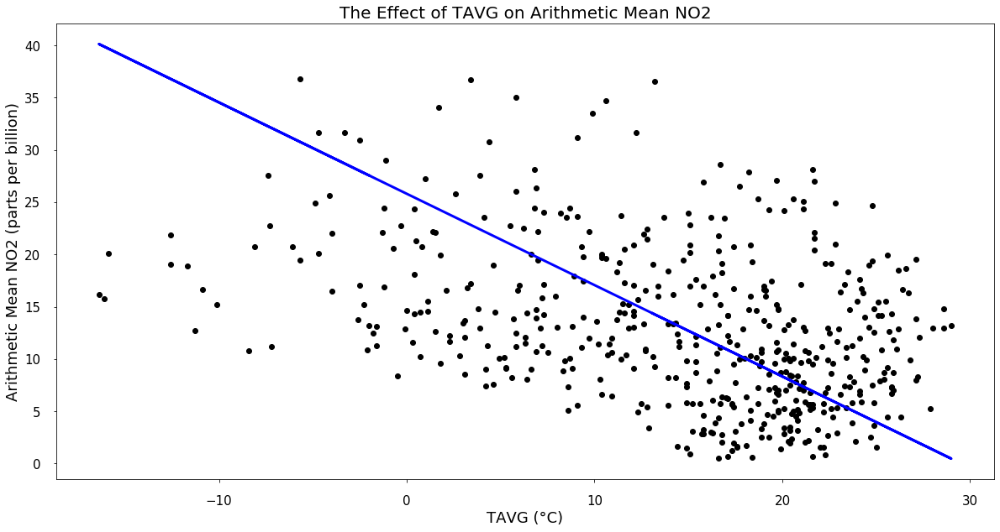

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMAX', 'TMIN']
Coefficients [-0.87389825  1.08474616 -0.59309702]


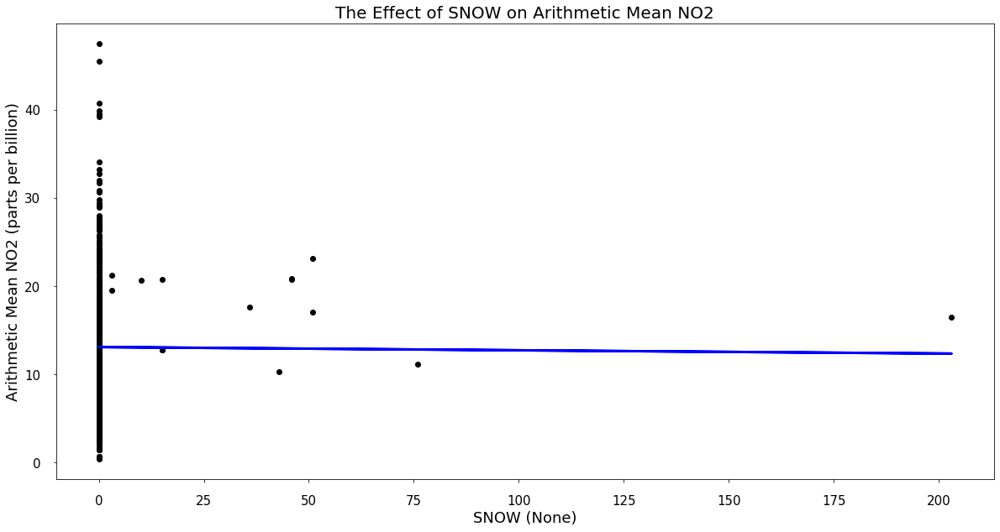

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.00365844 -0.94130833  1.09209139 -0.53320735]


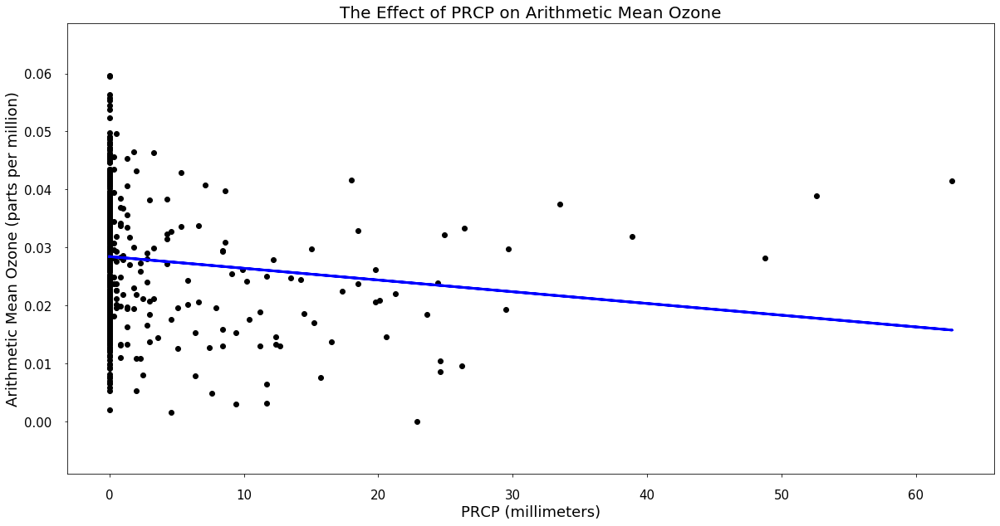

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [-2.02103890e-04  1.20960689e-03  9.23173261e-06  8.72013381e-04
 -1.87430328e-04]


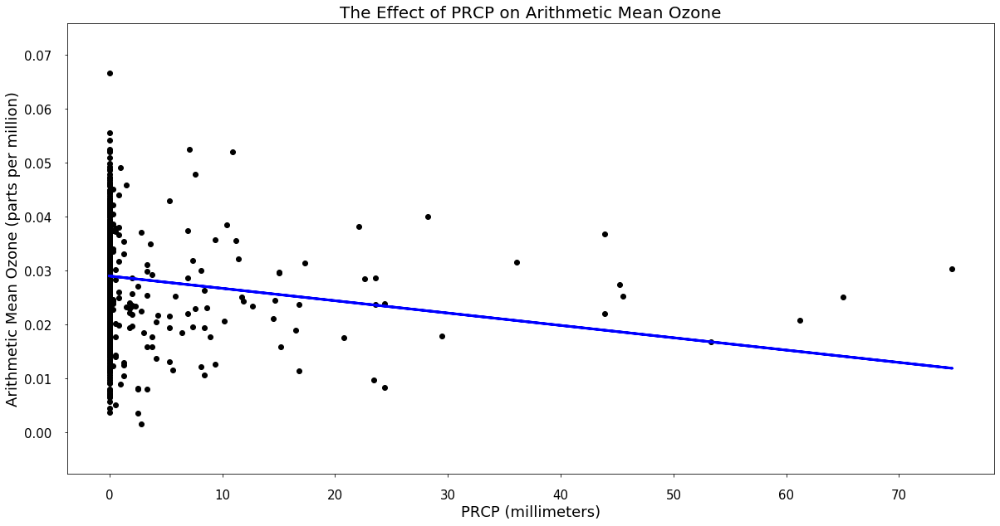

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-2.29197177e-04  1.22085152e-03  3.14423275e-05  9.96799072e-04
 -3.08427516e-04]


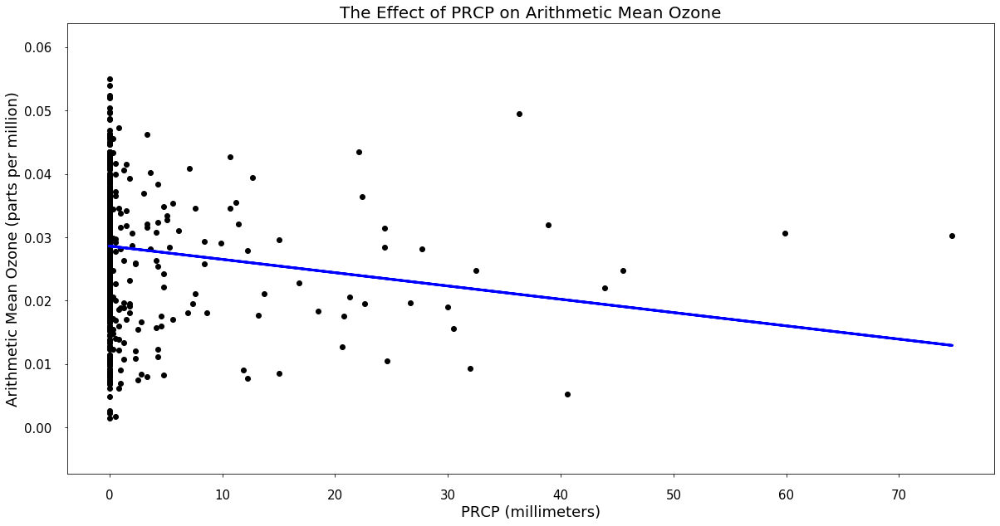

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMIN']
Coefficients [-0.0002098   0.0011721   0.000922   -0.00024778]


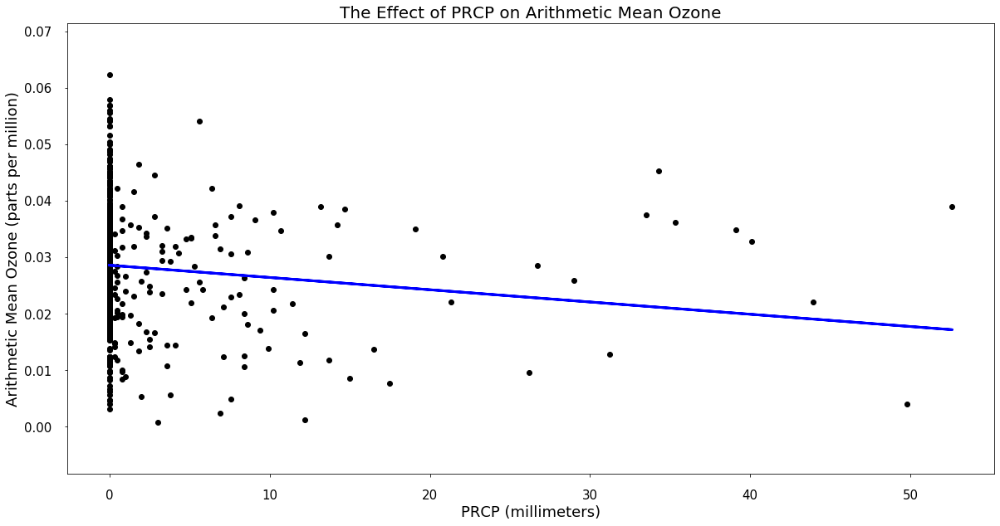

Explained Variance 0.29
Correlation Coefficient 0.54
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG']
Coefficients [-2.16965845e-04  1.21107661e-03  1.23417731e-05  7.02642792e-04]


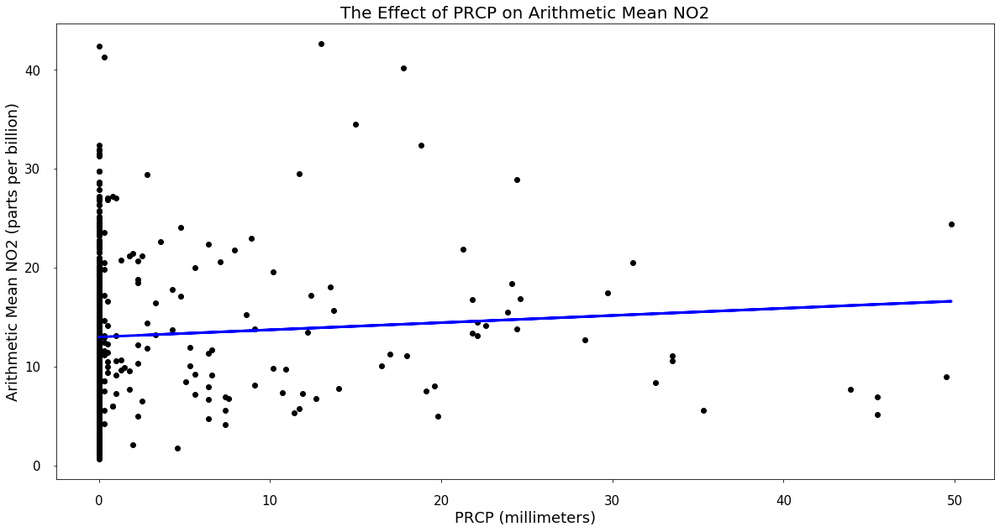

Explained Variance 0.29
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.07251415  0.01685762 -0.01990797  0.68016171 -1.02575991]


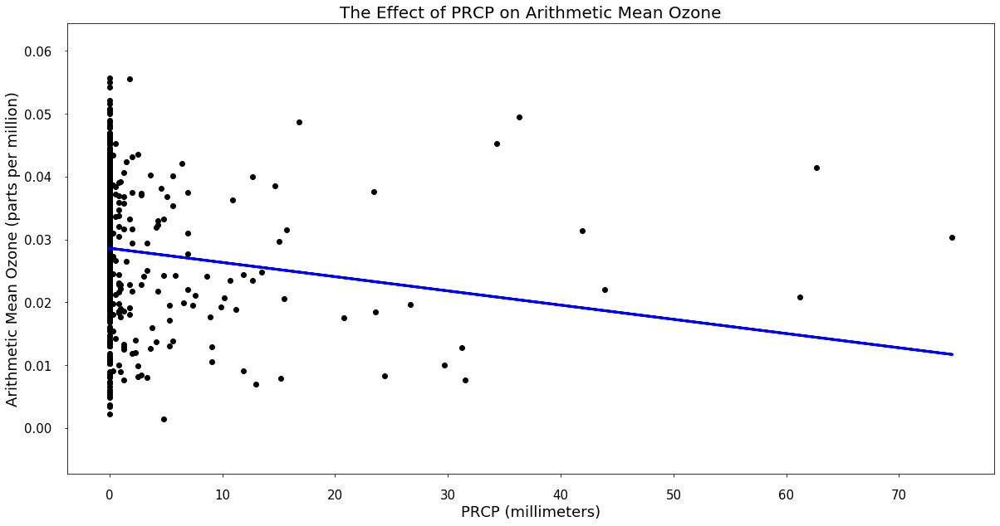

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG']
Coefficients [-0.00022621  0.0012777   0.0006799 ]


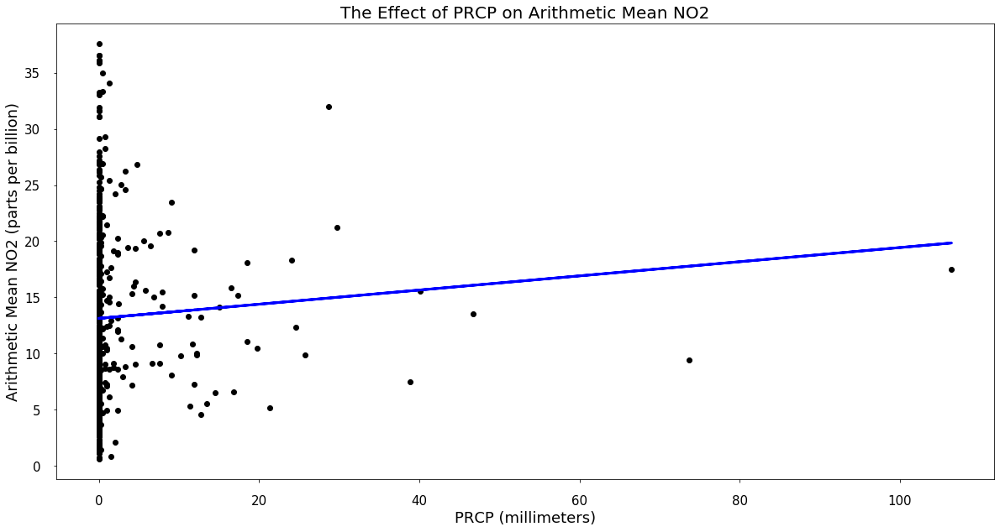

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.06307406  0.01461572  0.69945007 -1.03634221]


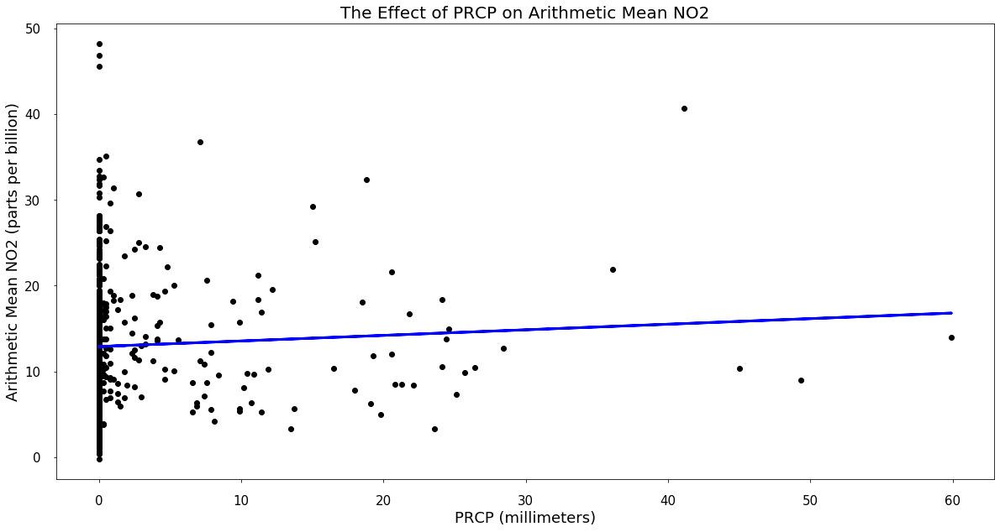

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.06511302  0.01859645 -0.0131764  -1.67820719  1.32686053]


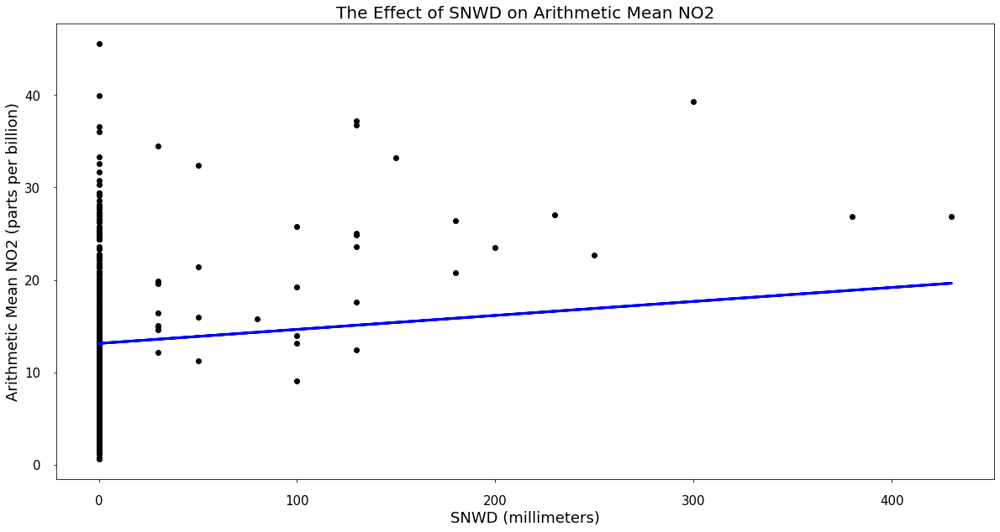

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.01513902 -0.01070567  0.64582017 -0.98149383]


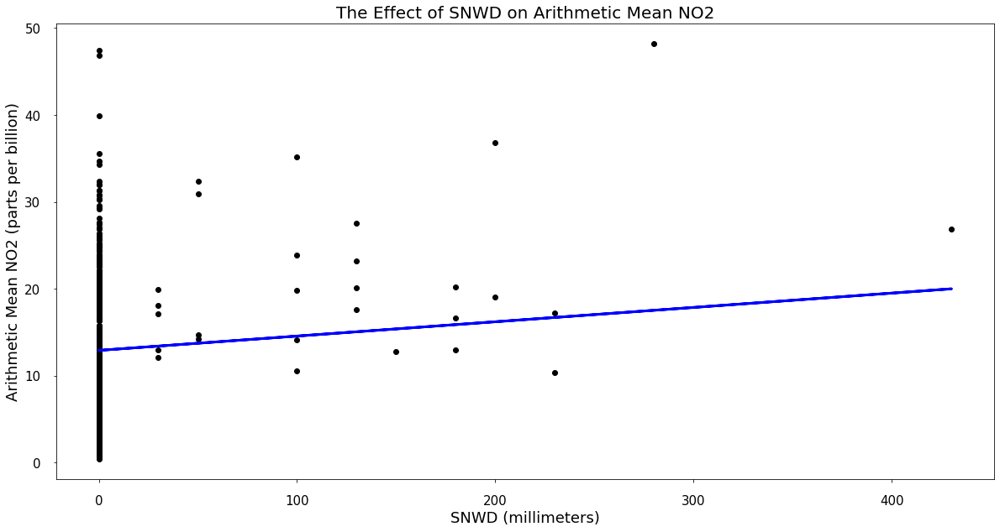

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.01648121  0.66652185 -0.99873623]


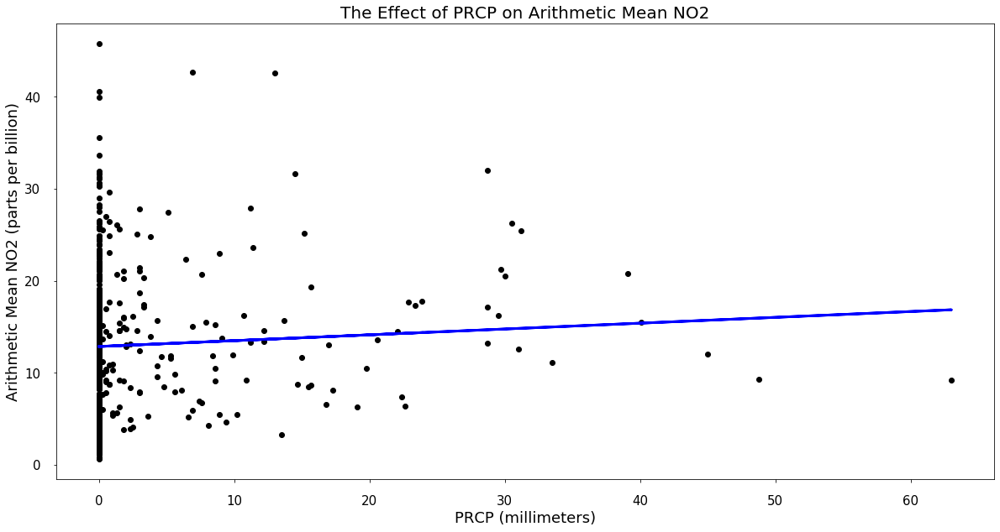

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.06334762 -0.01363995  0.70091629 -1.06070828]


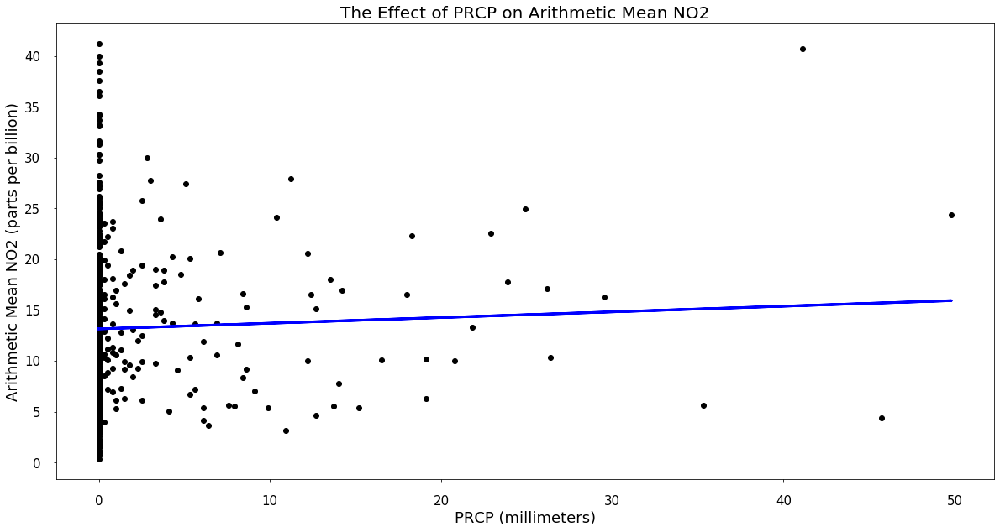

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMAX', 'TMIN']
Coefficients [ 0.05581839  0.68355509 -1.03961022]


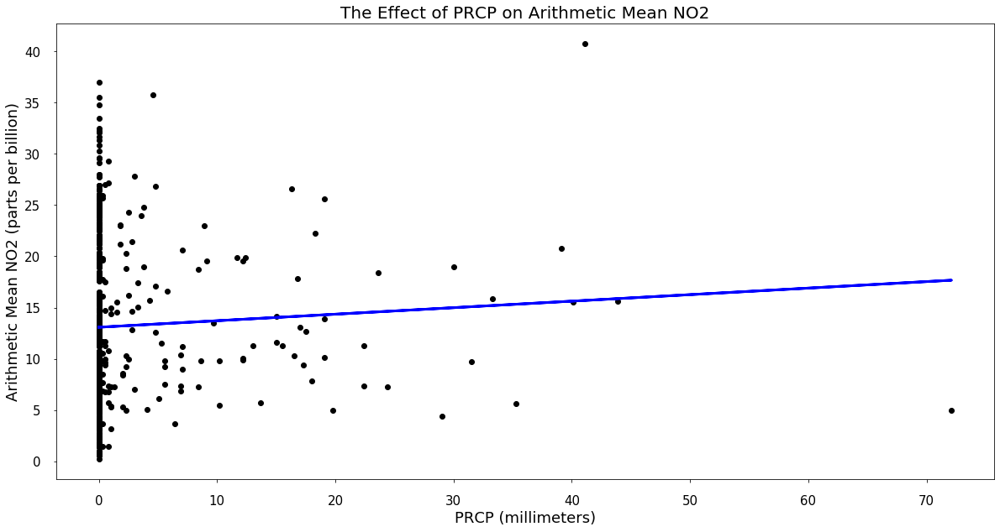

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.06359656 -0.00941274 -1.74689504  1.36631578]


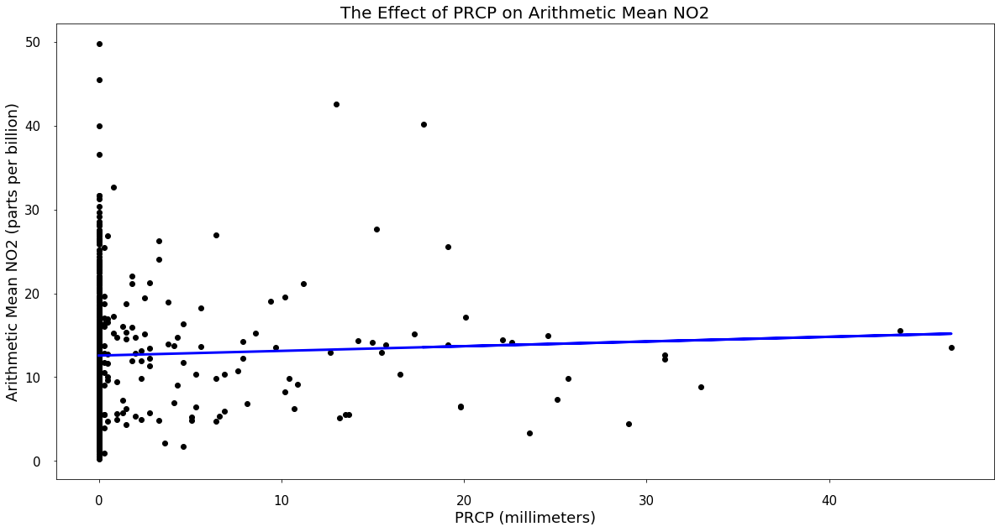

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMAX']
Coefficients [ 0.0559427   0.01553402 -1.68443515  1.3279057 ]


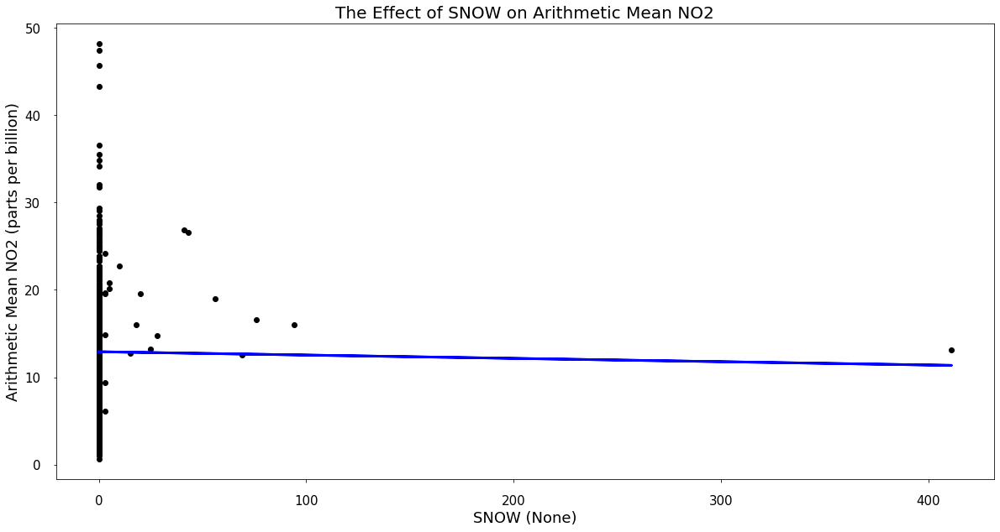

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMAX', 'TMIN']
Coefficients [-0.00379787  0.67618379 -1.04545508]


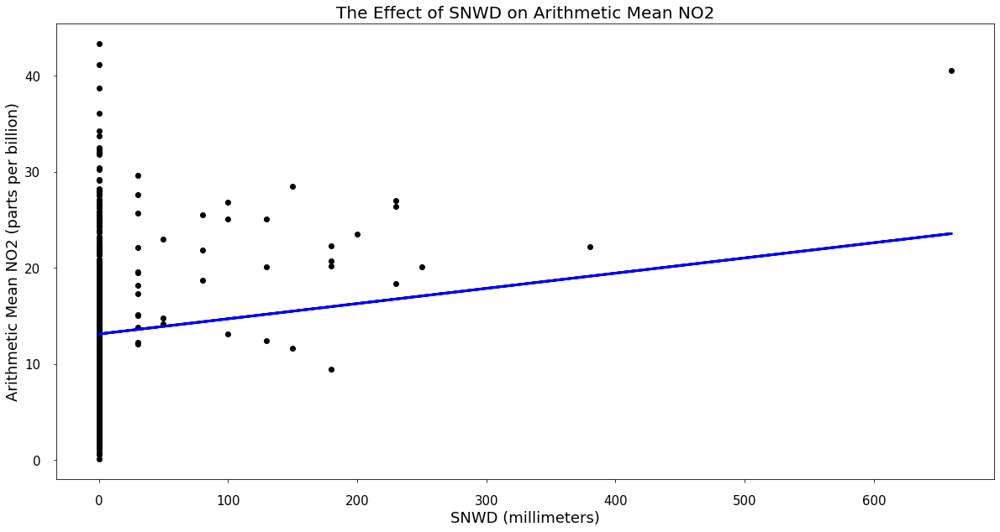

Explained Variance 0.28
Correlation Coefficient 0.53
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.01582432 -0.00560932 -1.63510889  1.28140792]


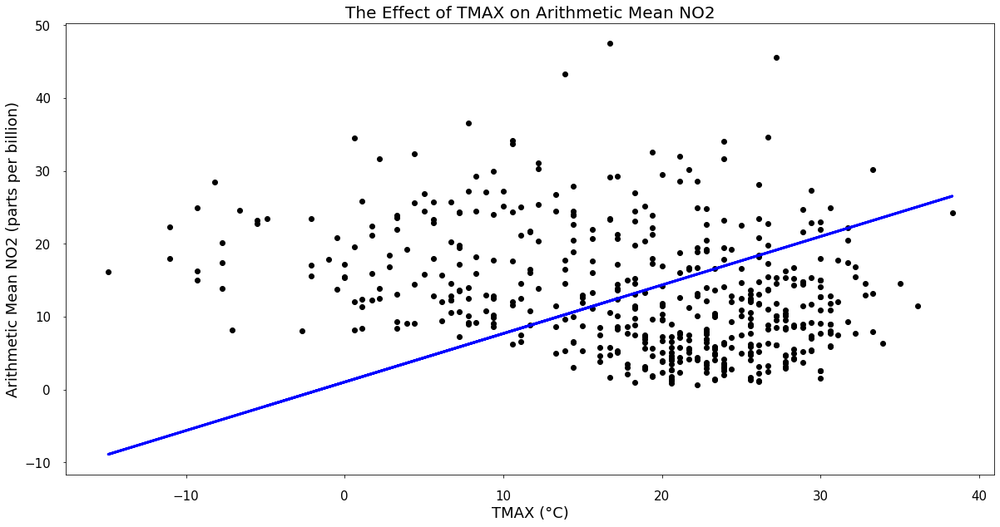

Explained Variance 0.28
Correlation Coefficient 0.52
Feature Selected for Display TMAX
All Features In Model ['TMAX', 'TMIN']
Coefficients [ 0.66581414 -1.0248743 ]


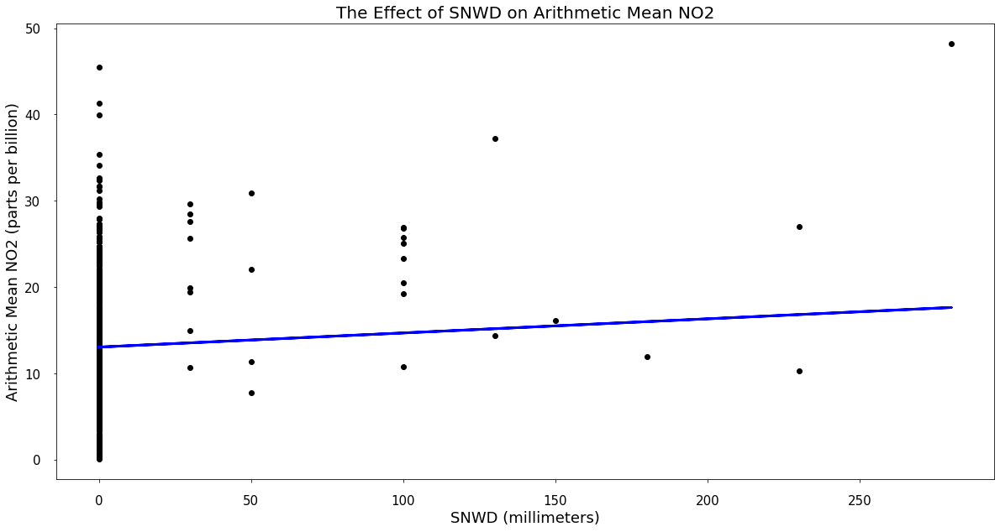

Explained Variance 0.28
Correlation Coefficient 0.52
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMAX']
Coefficients [ 0.01638814 -1.64568085  1.29559669]


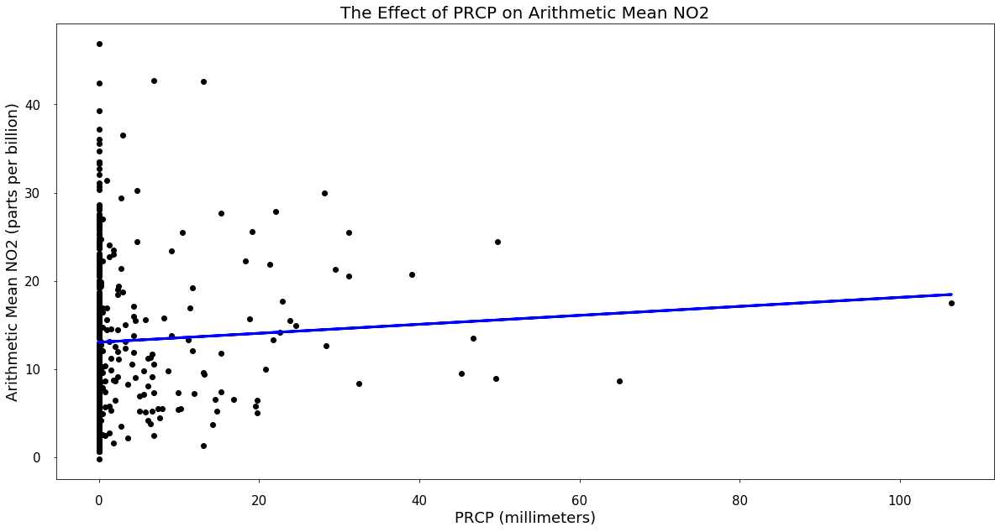

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMAX']
Coefficients [ 0.05085577 -1.69445271  1.3147751 ]


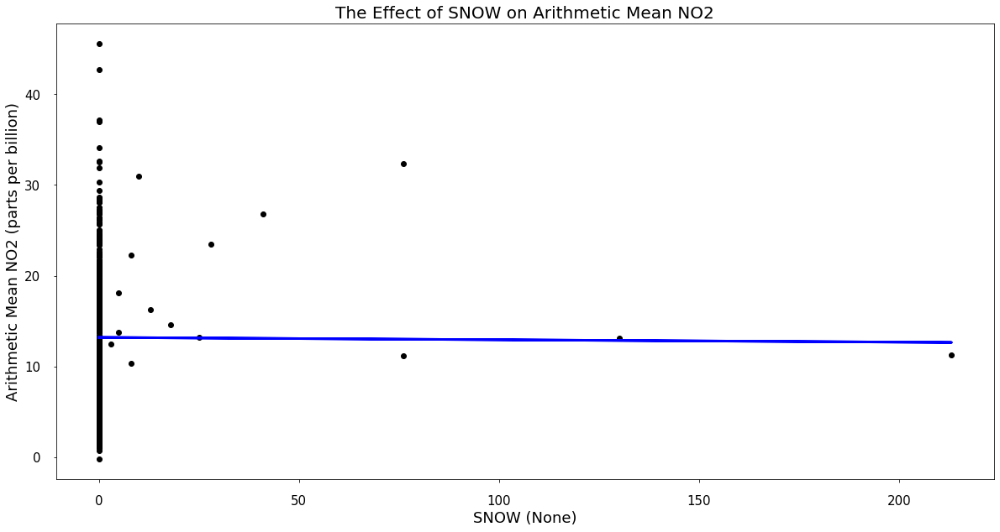

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMAX']
Coefficients [-0.0026024  -1.75204188  1.36177864]


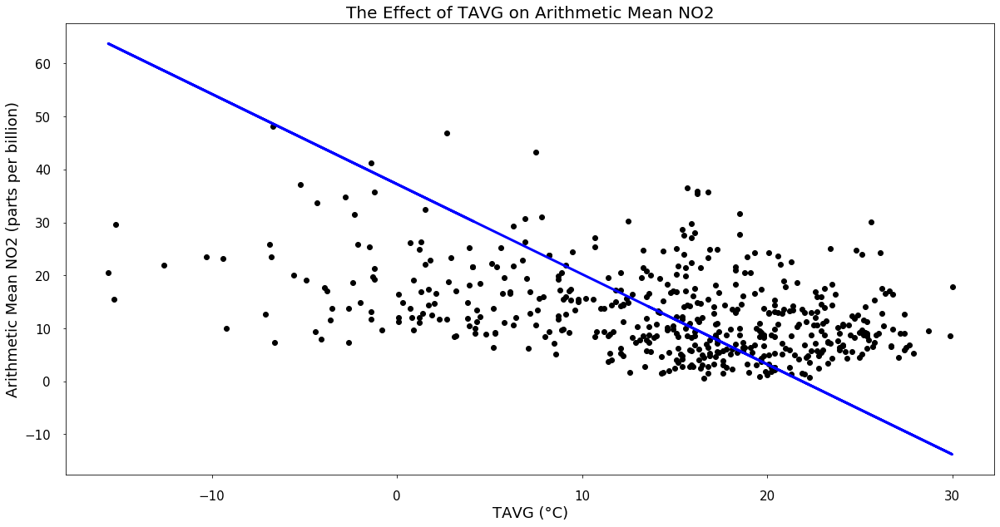

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMAX']
Coefficients [-1.70112431  1.32257735]


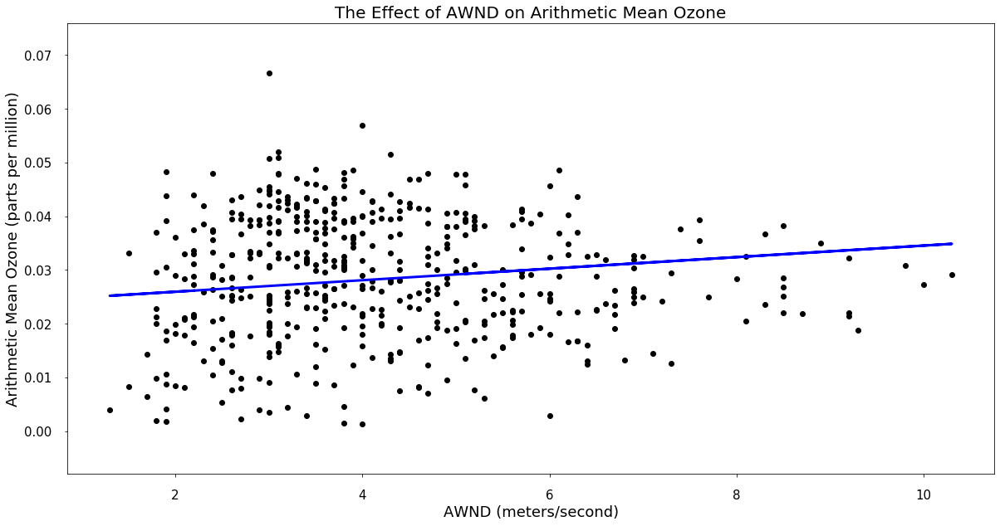

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 1.07455510e-03  8.33416443e-06  1.22681836e-05  9.61850630e-04
 -2.76799779e-04]


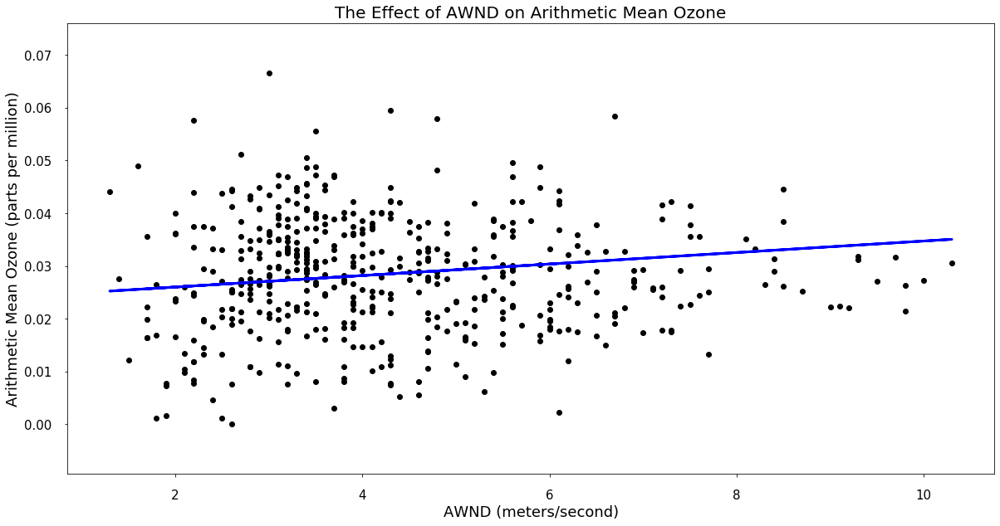

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMIN']
Coefficients [ 0.00108989  0.00103559 -0.00036688]


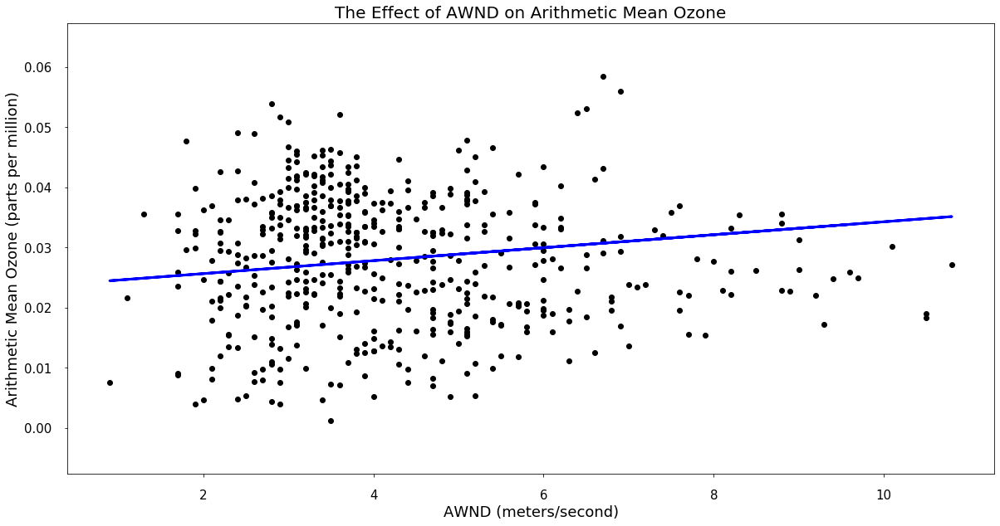

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 1.07836559e-03  1.37824472e-05  9.77017977e-04 -3.10848834e-04]


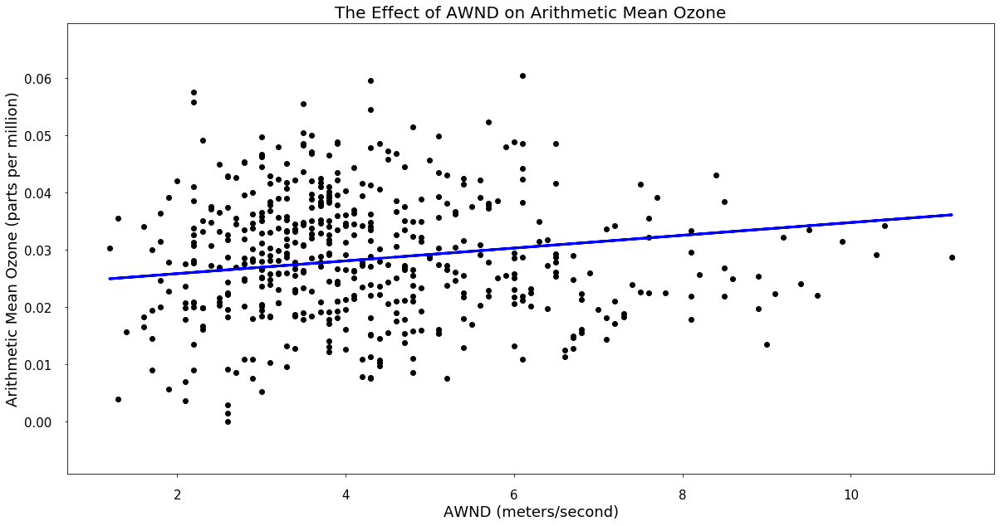

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [ 1.11546382e-03  5.98482810e-06  9.97297709e-04 -3.17269380e-04]


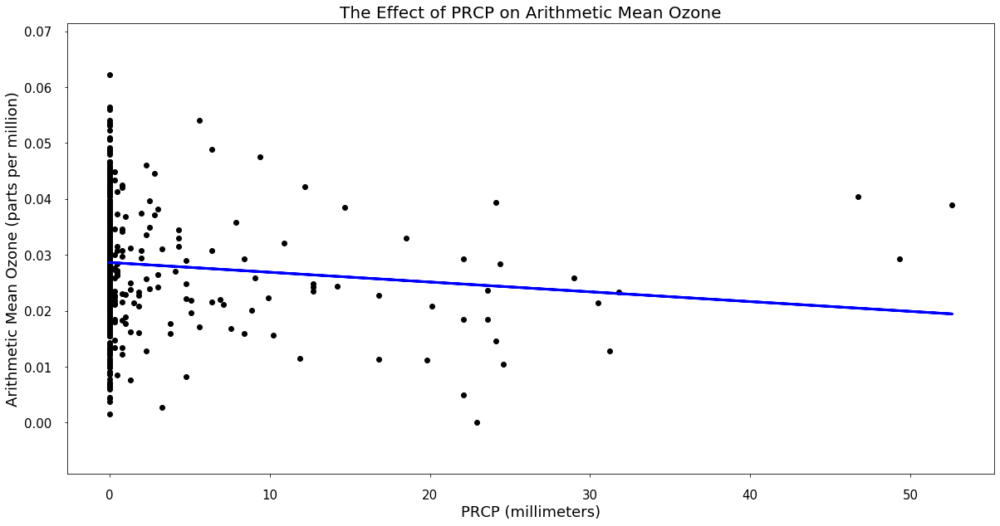

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-1.74860216e-04  3.90392941e-05  5.64048193e-04  4.33944723e-05]


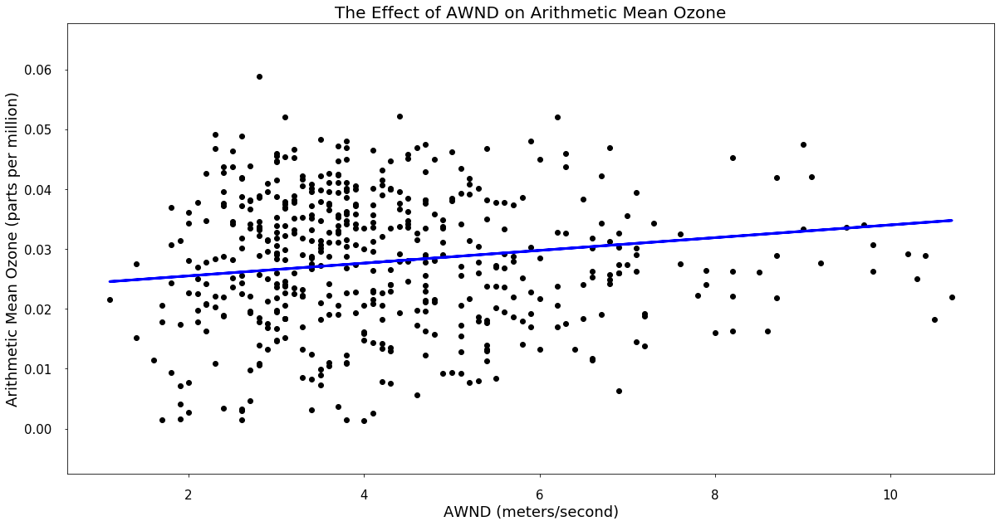

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG']
Coefficients [1.06413569e-03 9.80641300e-06 8.23259635e-06 6.82069050e-04]


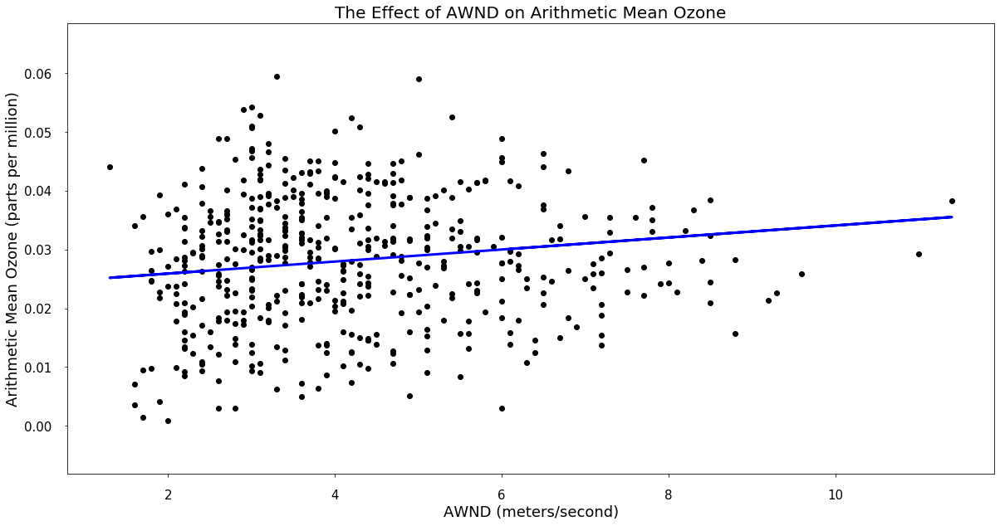

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG']
Coefficients [1.02236934e-03 1.17334088e-05 6.78369023e-04]


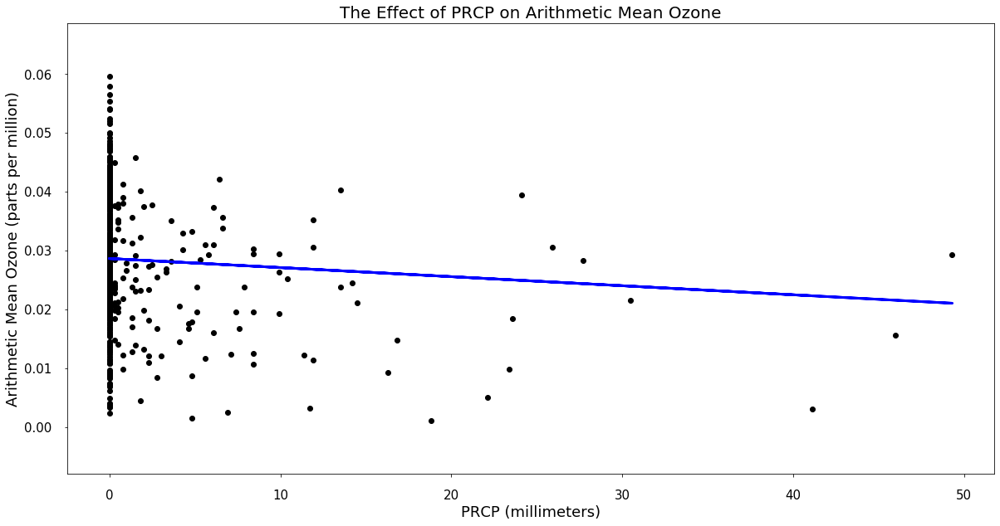

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-1.54106884e-04  4.25687225e-06  3.91077913e-05  5.92937324e-04
  1.57609647e-05]


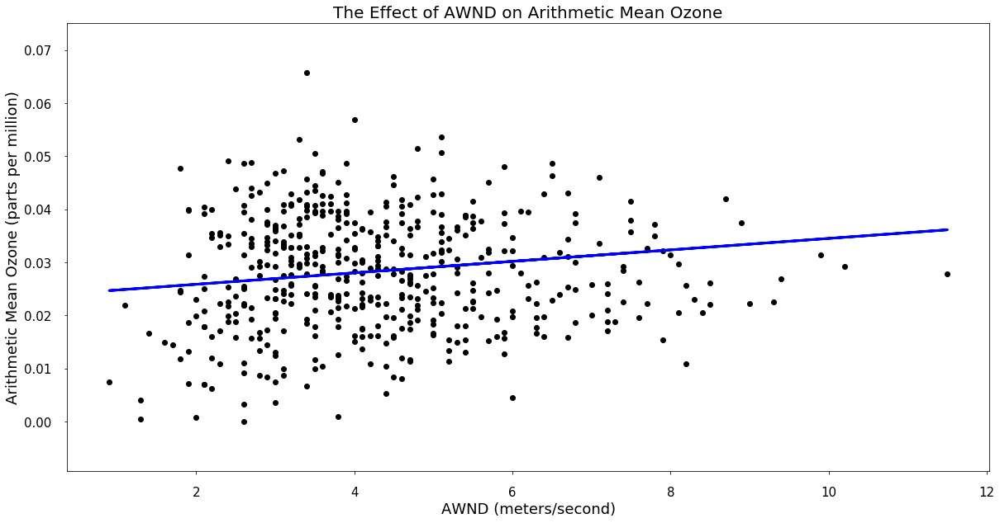

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG']
Coefficients [1.08034074e-03 9.56574540e-06 6.80221650e-04]


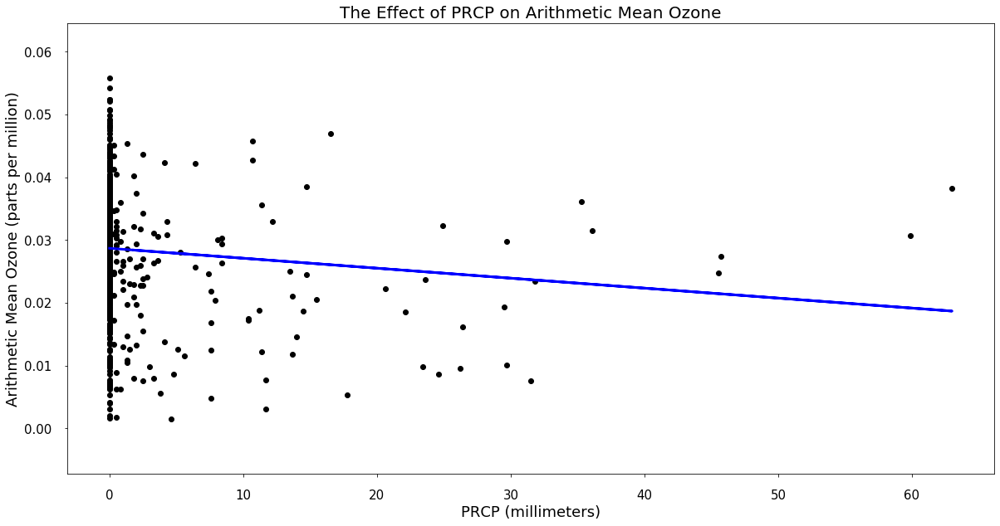

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.58724480e-04  3.87475039e-05 -1.66899170e-05  5.86233870e-04
  3.14282339e-05]


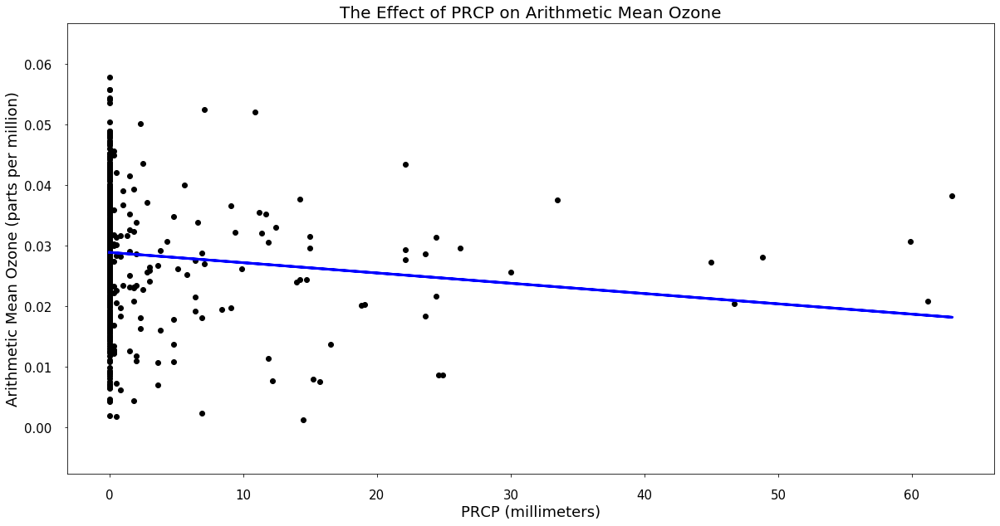

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMAX']
Coefficients [-1.69910450e-04  4.21789604e-05  6.03263018e-04]


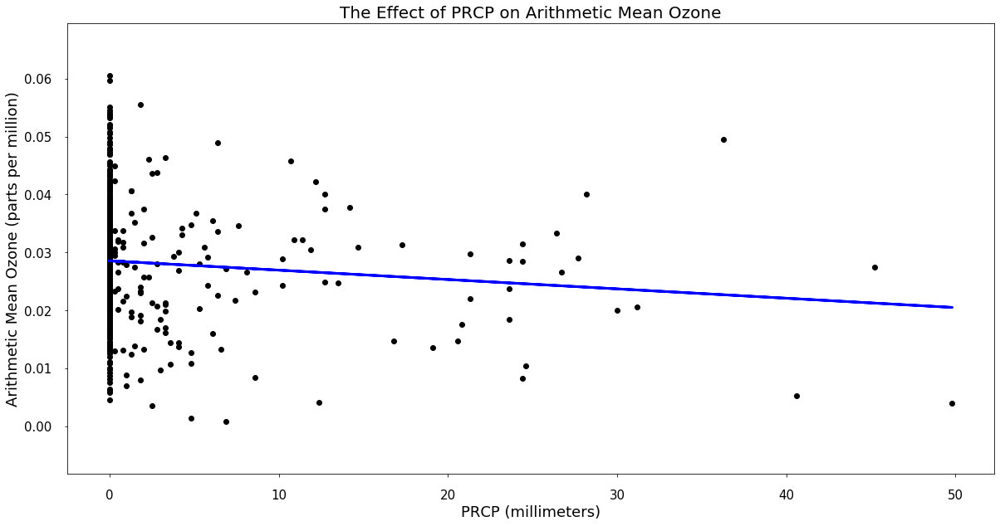

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-1.61422734e-04  4.26957667e-05  2.20611846e-05  5.83570995e-04]


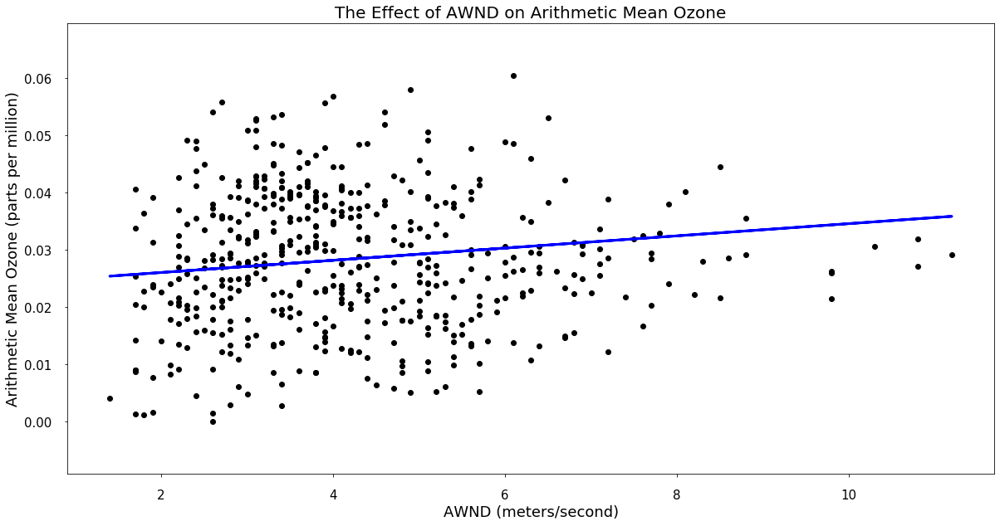

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG']
Coefficients [0.00106574 0.00066117]


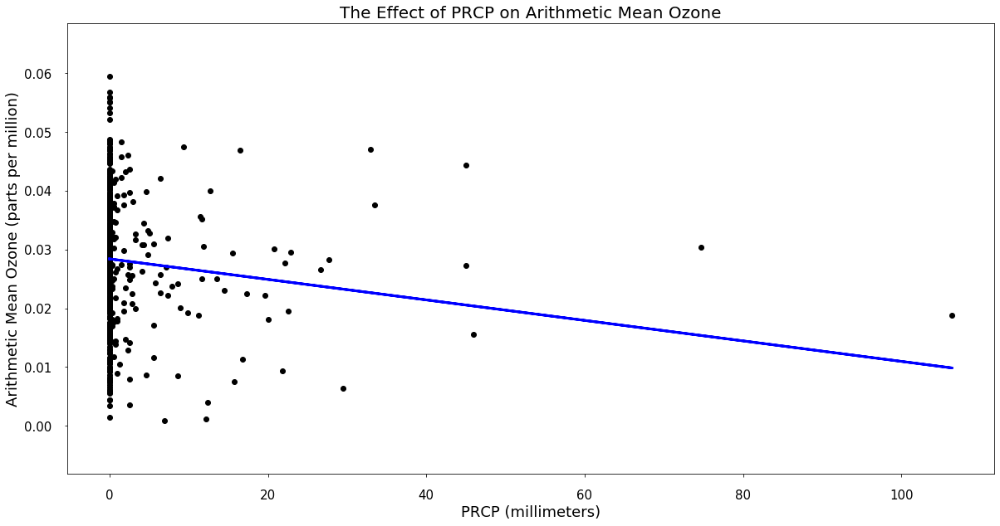

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMAX']
Coefficients [-1.74340376e-04  1.03430369e-05  3.94531952e-05  6.13733474e-04]


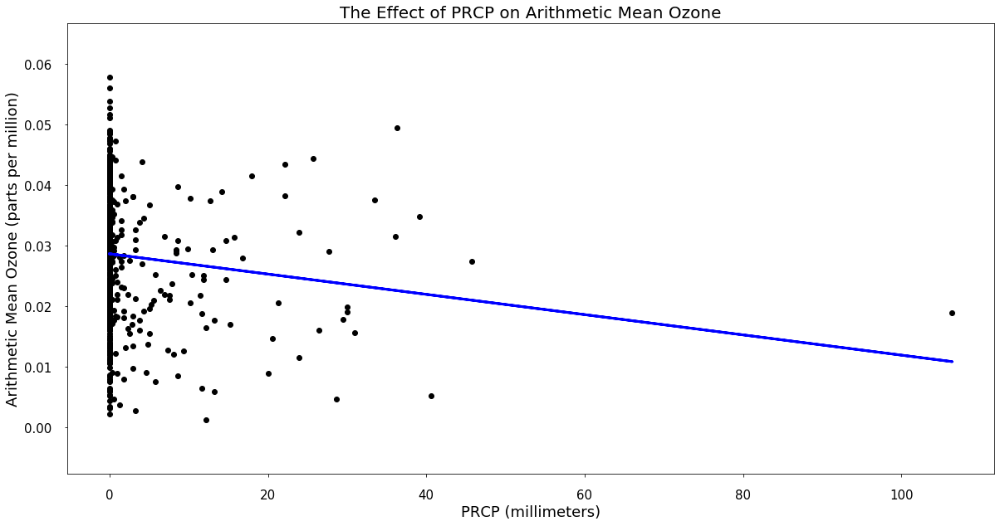

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-1.67249200e-04  4.81376446e-06  4.08927437e-05  2.05581155e-05
  5.93431179e-04]


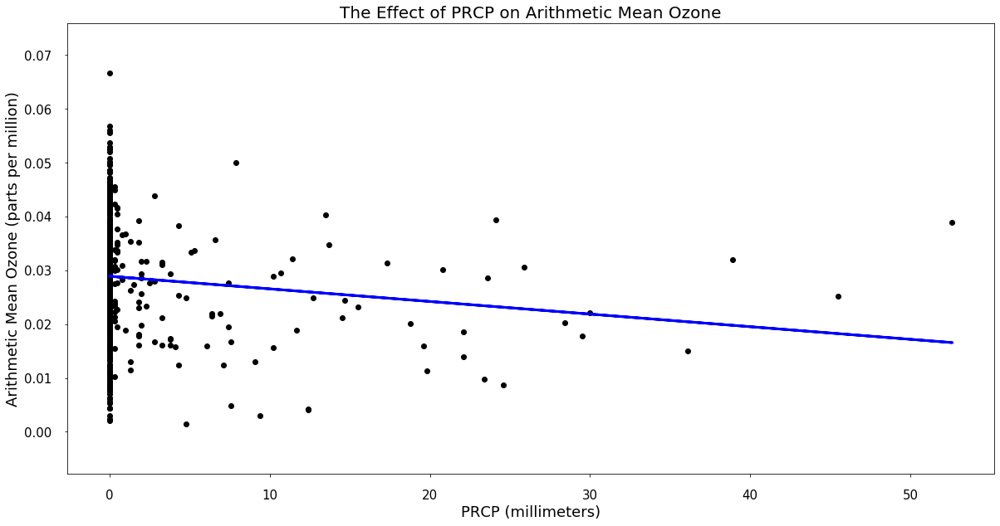

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [-2.34521685e-04  1.15202418e-03  8.68531148e-06  2.48562966e-05
  6.61558622e-04]


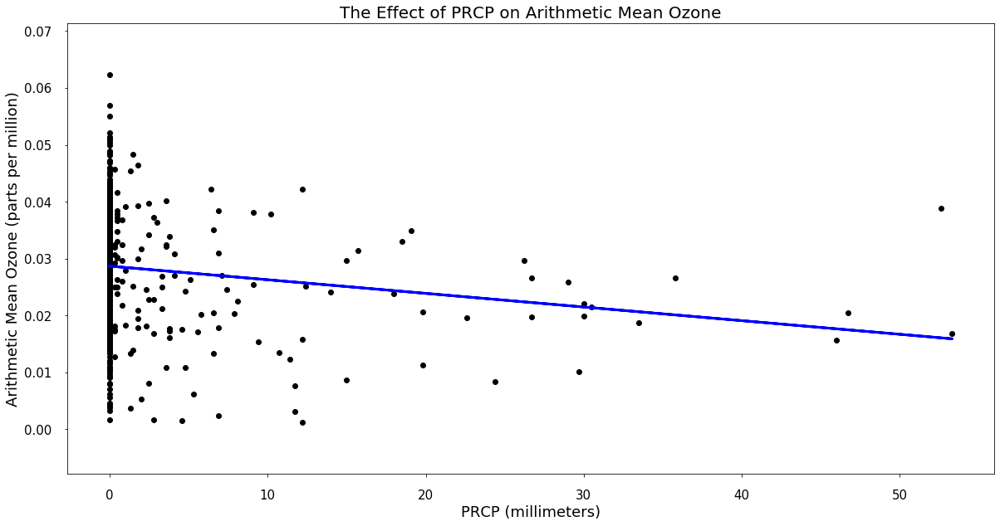

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMIN']
Coefficients [-2.39849533e-04  1.16775088e-03  2.79657188e-05  6.49313453e-04]


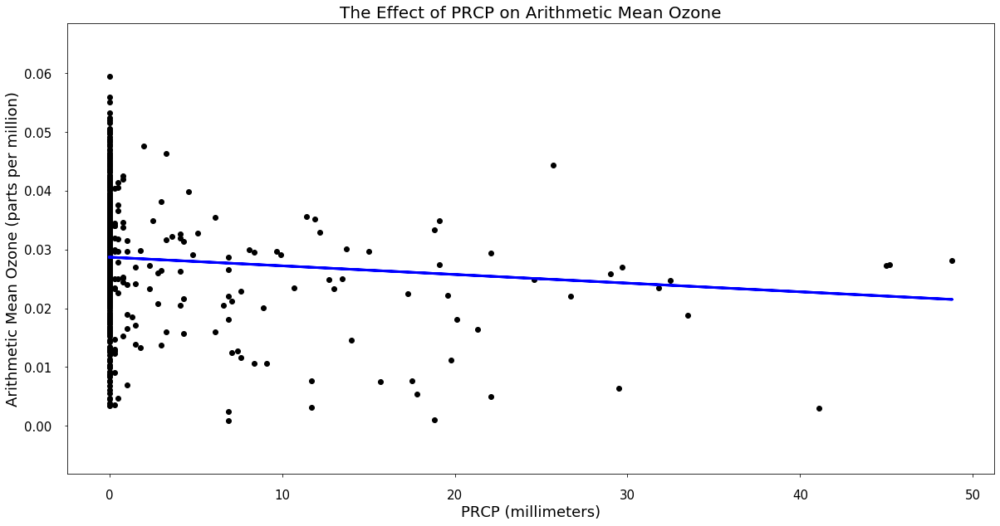

Explained Variance 0.27
Correlation Coefficient 0.52
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.47217605e-04  4.39008802e-06  3.93770527e-05  3.62329671e-05
  5.59311060e-04  1.75418373e-05]


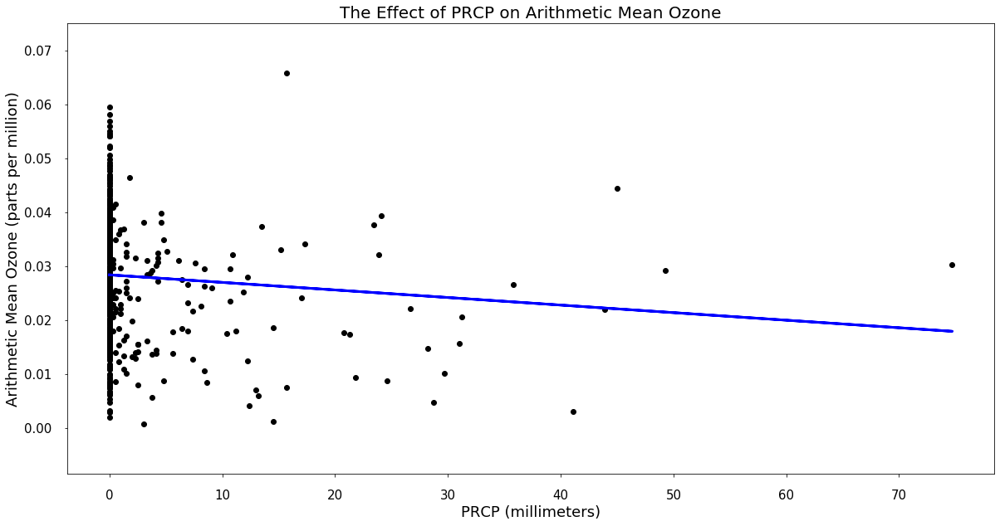

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMAX']
Coefficients [-0.00014018  0.00058296]


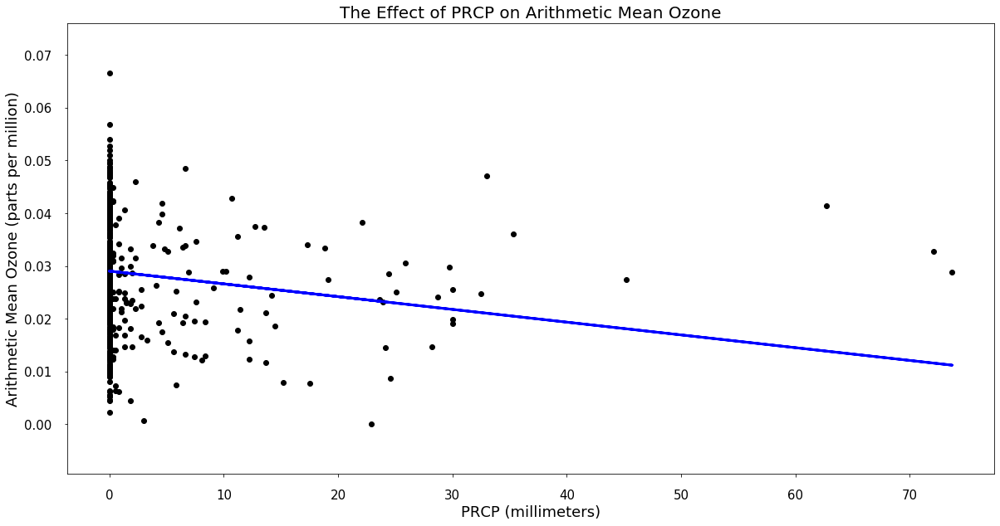

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMIN']
Coefficients [-2.41784185e-04  1.24082483e-03  8.67010453e-06  6.57960690e-04]


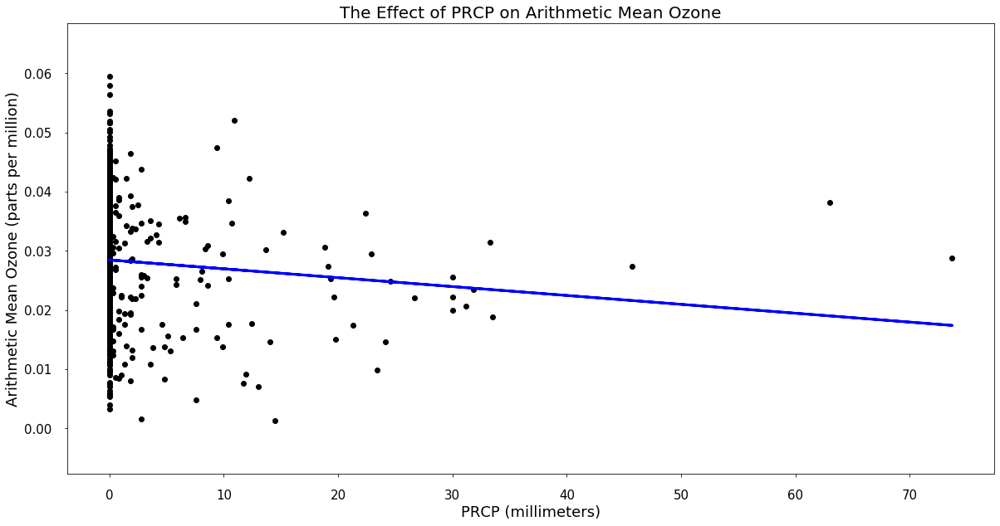

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMAX', 'TMIN']
Coefficients [-1.50218369e-04  5.78830681e-04  1.15001052e-05]


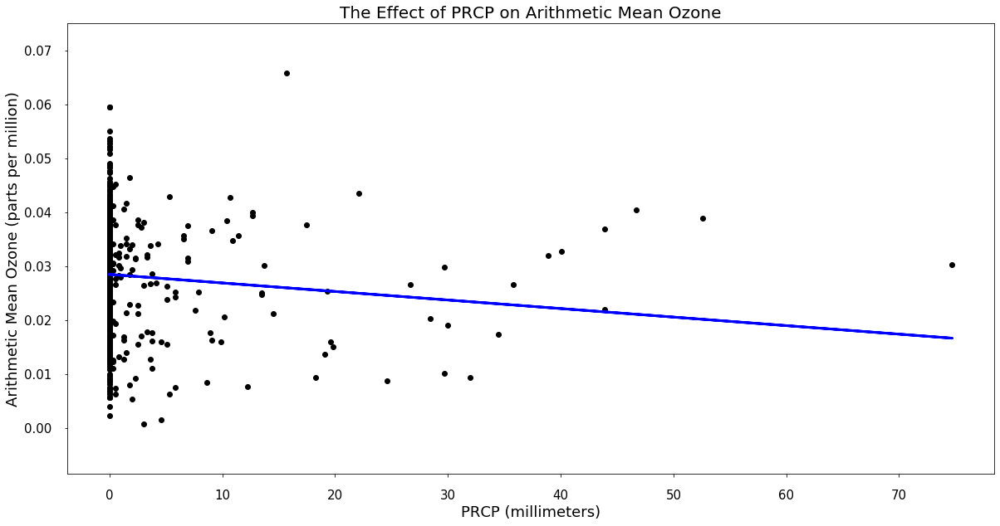

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMAX']
Coefficients [-1.58292421e-04  8.38924709e-06  5.88898024e-05  5.38608568e-04]


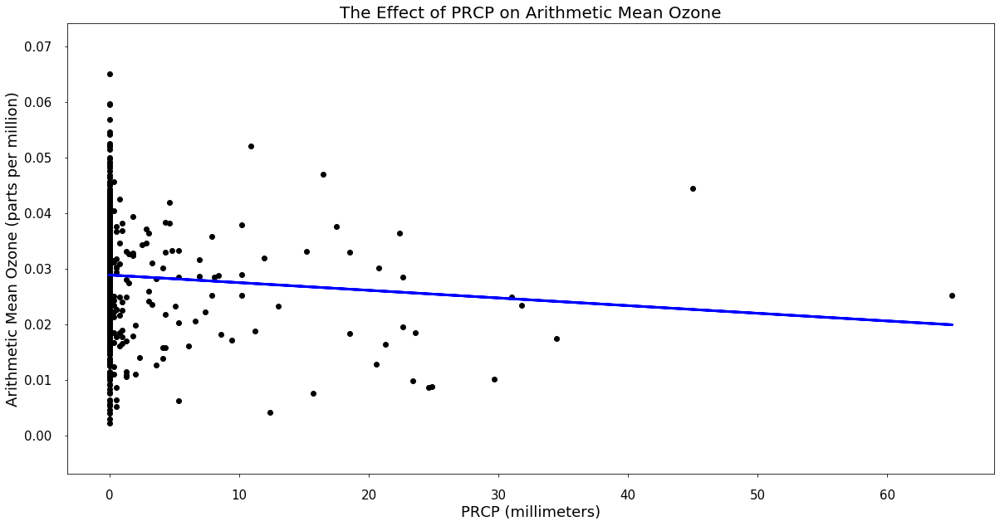

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMAX']
Coefficients [-1.37866188e-04  5.89715781e-05  5.41114276e-04]


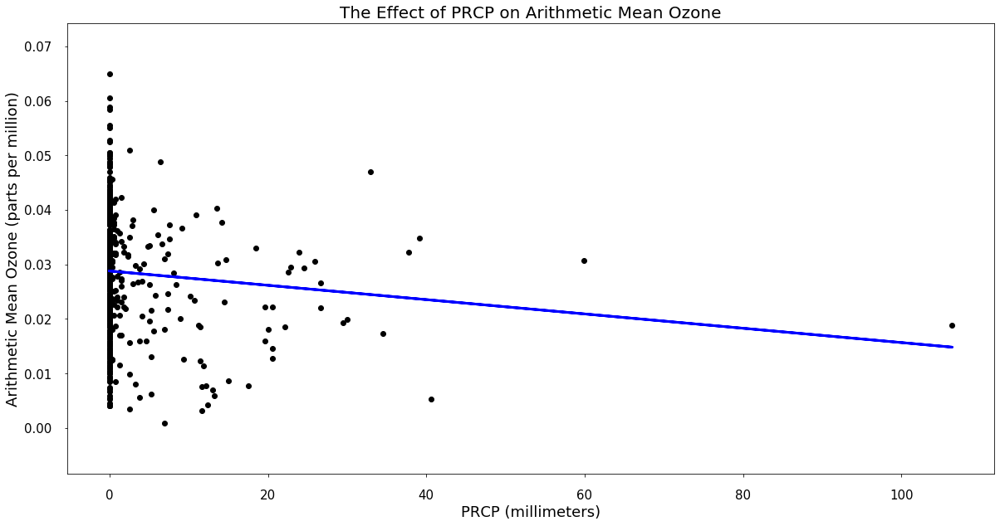

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.31341229e-04  7.36458174e-06 -4.06529068e-05  5.86695478e-04
  5.09147248e-05]


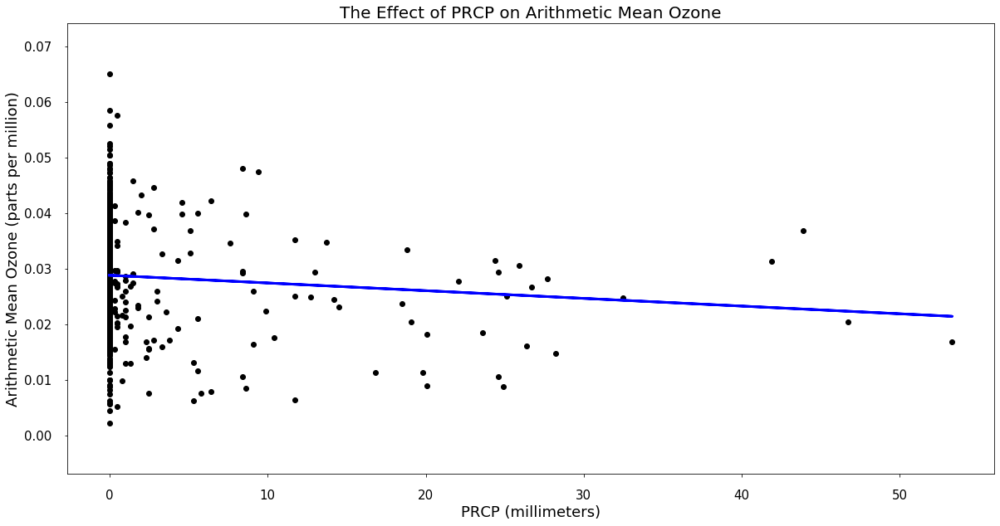

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-1.38705149e-04 -5.79822634e-05  6.07270651e-04  5.90323348e-05]


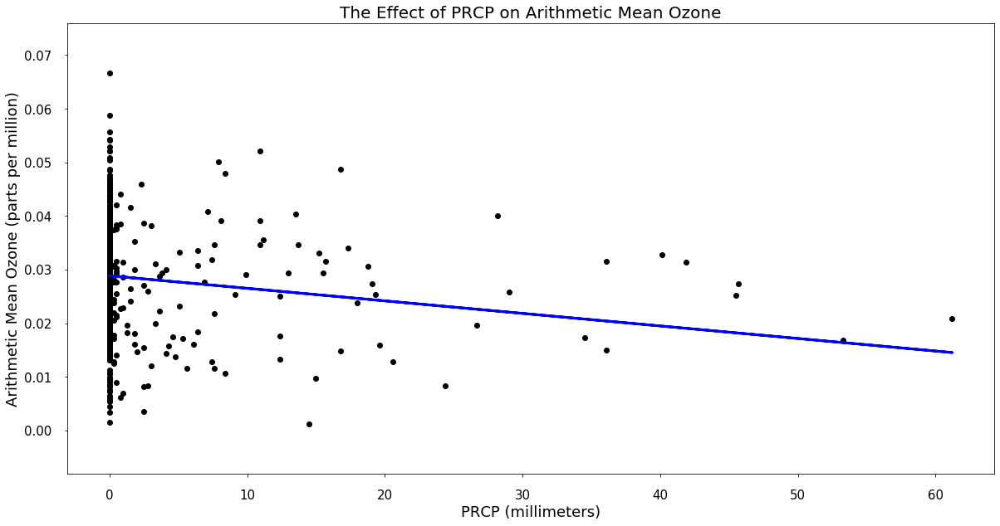

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMIN']
Coefficients [-0.00023391  0.00119156  0.00063902]


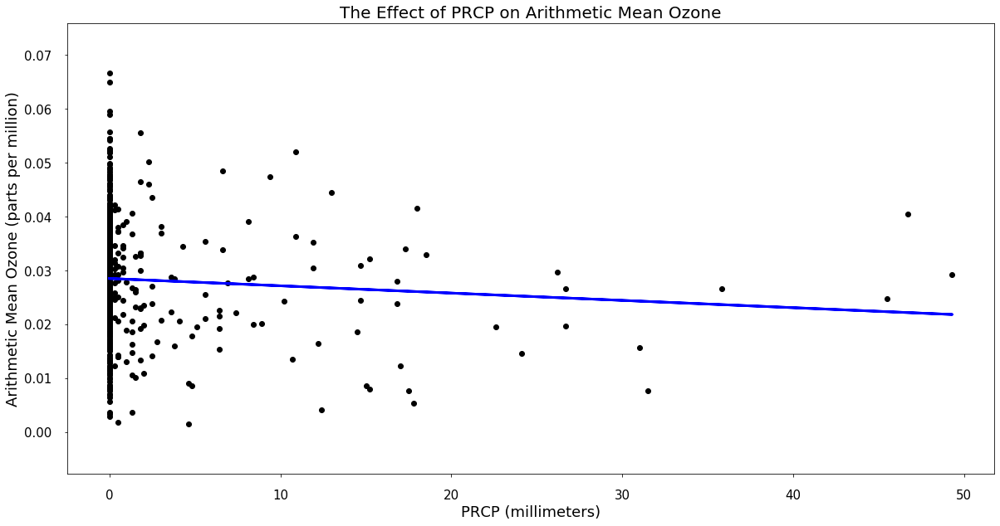

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMAX']
Coefficients [-1.35539527e-04  4.87595009e-06  5.97779731e-04]


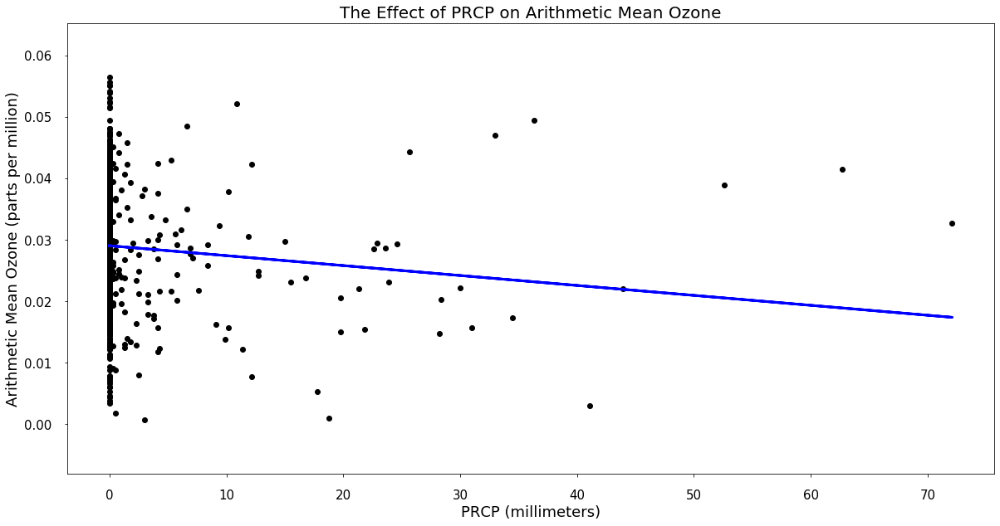

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMAX', 'TMIN']
Coefficients [-1.61548611e-04  6.15903897e-06  5.81577185e-04  6.60523043e-06]


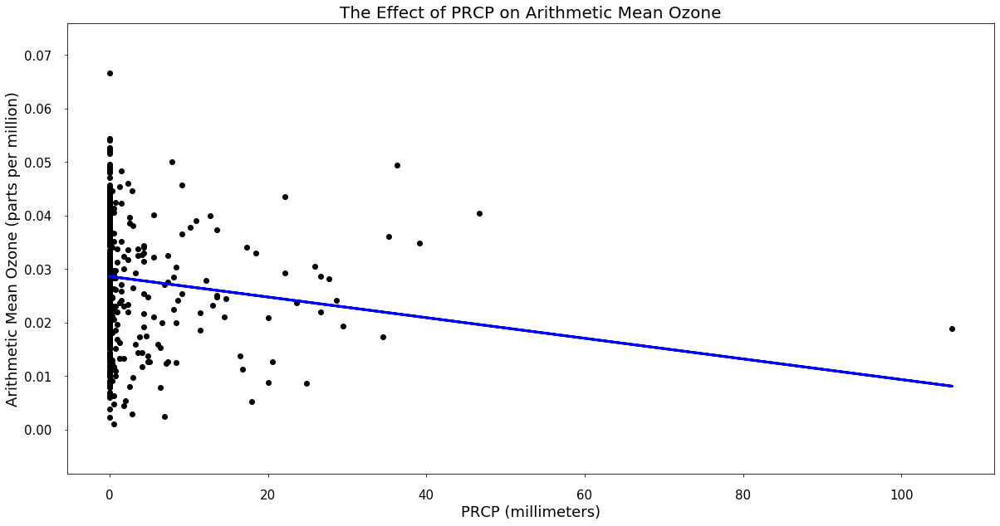

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-1.92831905e-04  4.08312516e-05  9.27825198e-04 -3.00749010e-04]


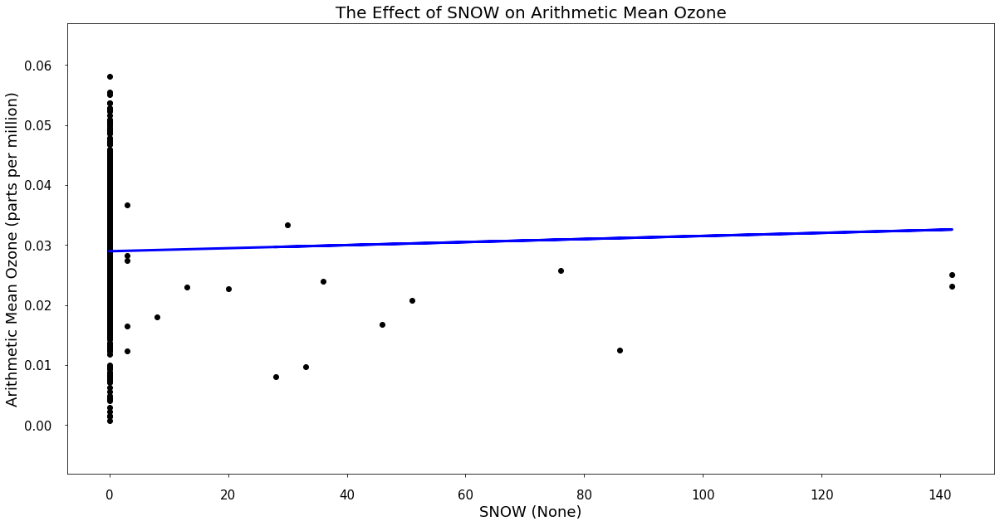

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMAX']
Coefficients [2.54917935e-05 5.90559172e-04]


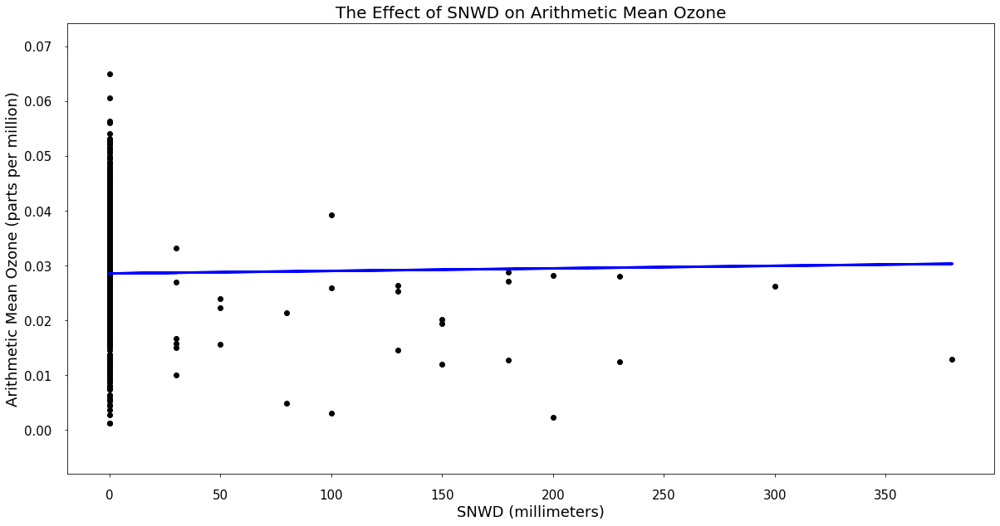

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 4.64407505e-06  3.38990699e-05 -5.86168775e-06  6.28392255e-04
 -2.27763039e-05]


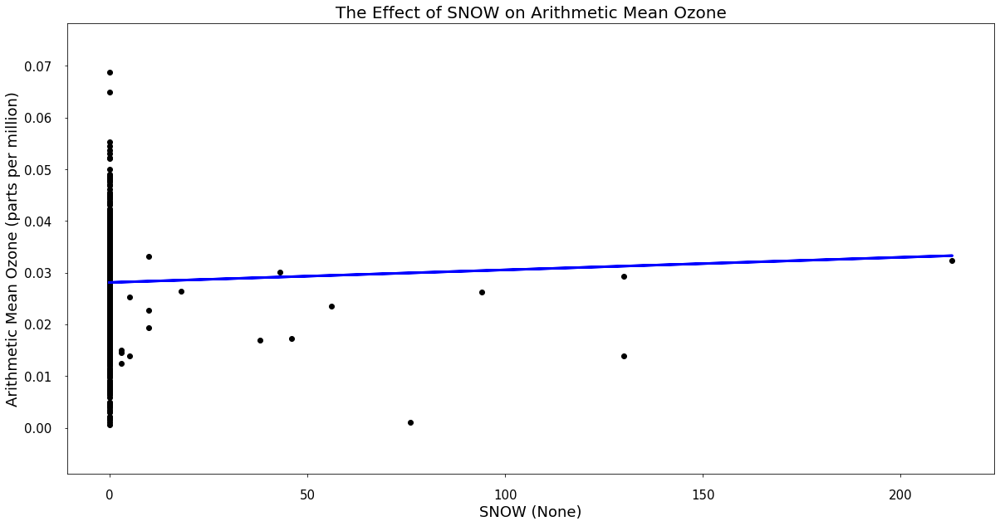

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 2.43350399e-05 -1.18717509e-05  6.40402862e-04 -3.92200350e-05]


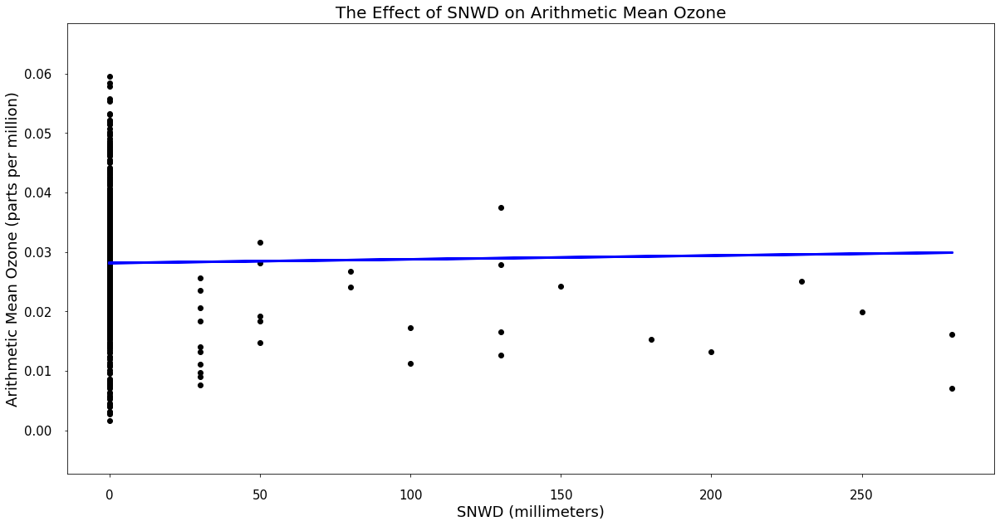

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [6.25799265e-06 2.43728238e-05 2.78379444e-06 6.05104916e-04]


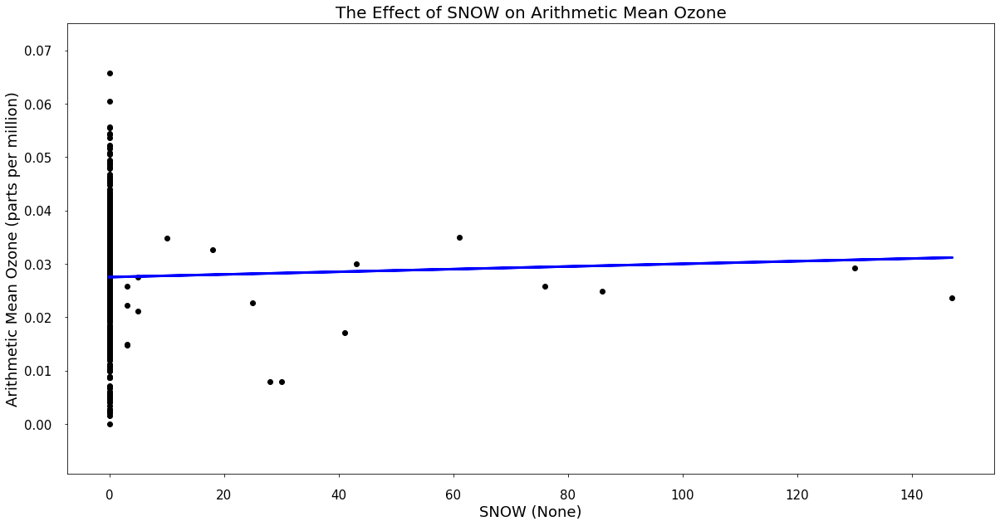

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMAX']
Coefficients [ 2.48204205e-05 -4.85031933e-05  6.44641150e-04]


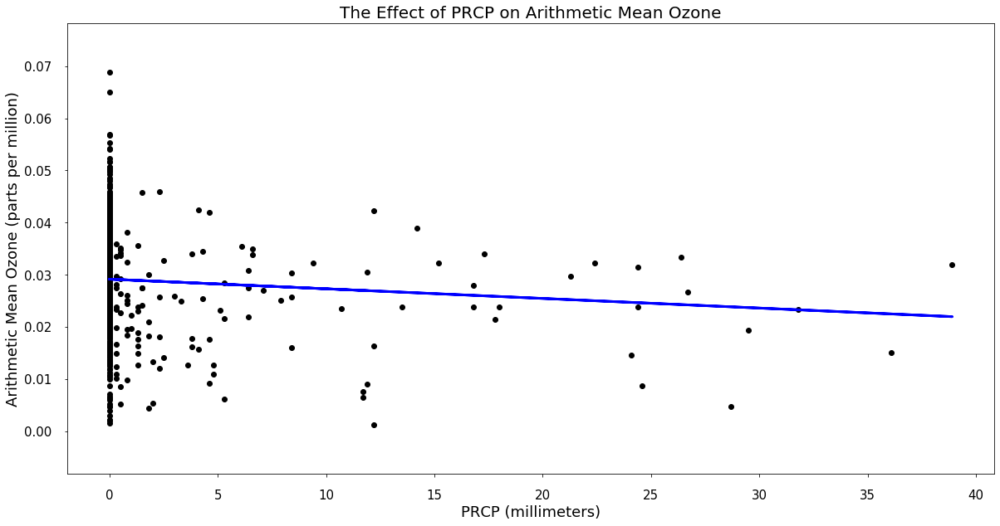

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG']
Coefficients [-1.84808947e-04  3.50418182e-05  6.23463695e-04]


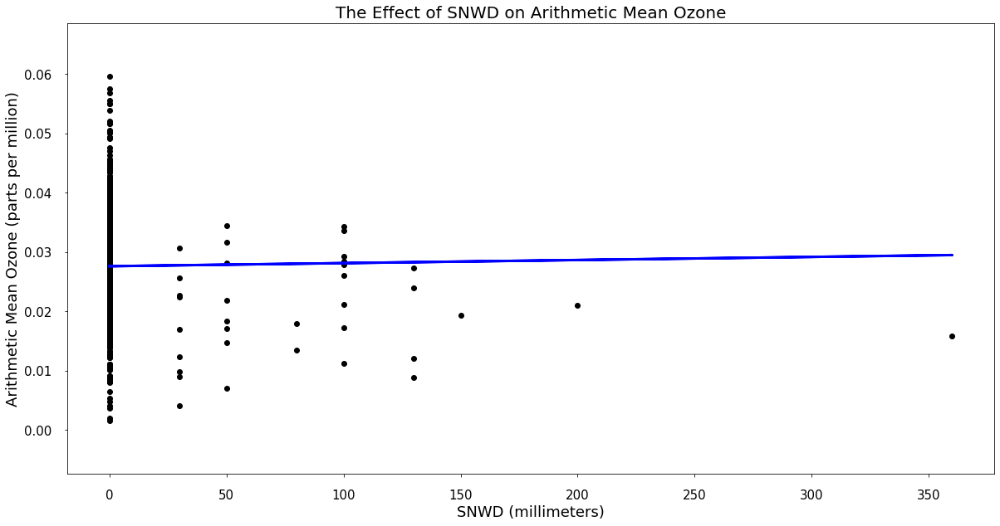

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMAX']
Coefficients [5.22538143e-06 2.48813442e-05 6.17238532e-04]


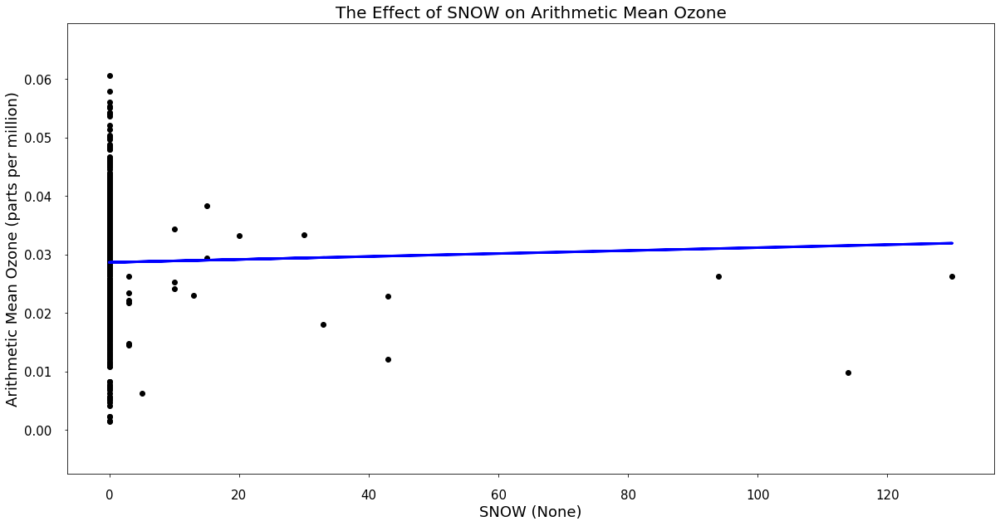

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMAX', 'TMIN']
Coefficients [ 2.52063222e-05  6.13835302e-04 -2.57771878e-05]


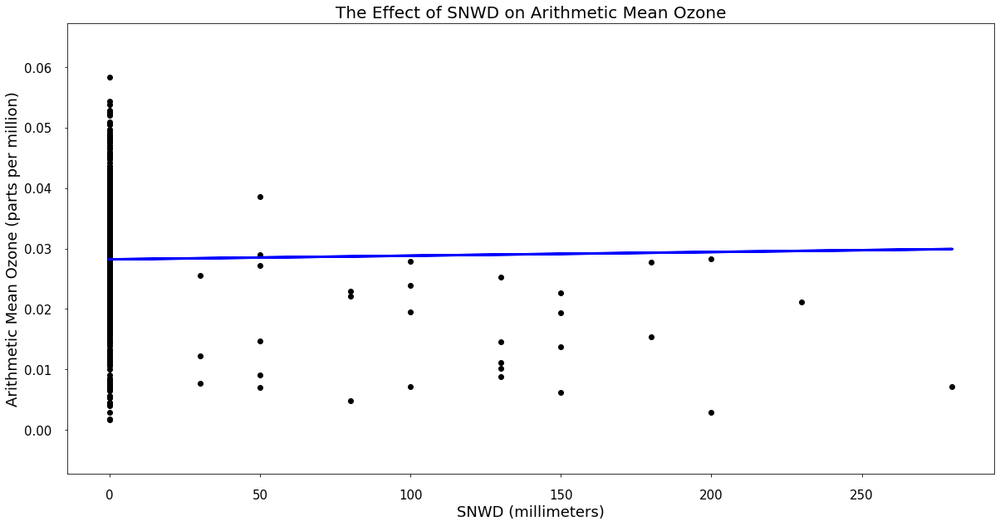

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 6.09400885e-06  2.26202344e-05  6.21211063e-04 -2.54460914e-05]


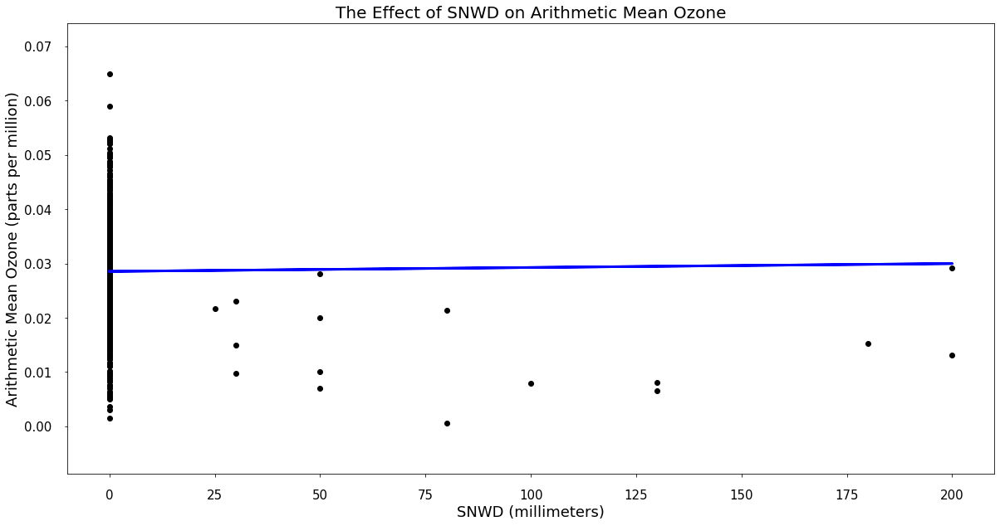

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMAX']
Coefficients [ 7.21172845e-06 -8.99728965e-05  6.76745120e-04]


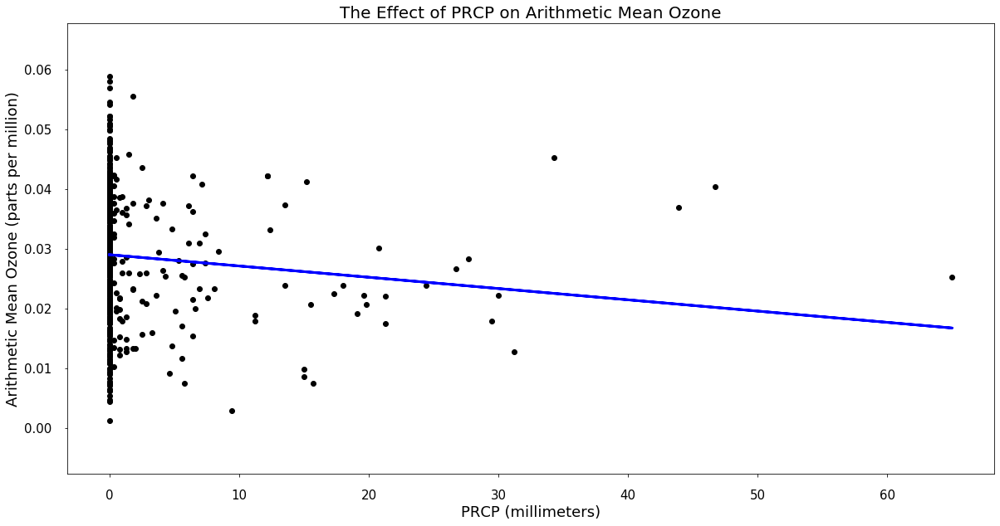

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-1.88752706e-04  3.68701870e-06  3.89153987e-05  8.75130171e-04
 -2.50657151e-04]


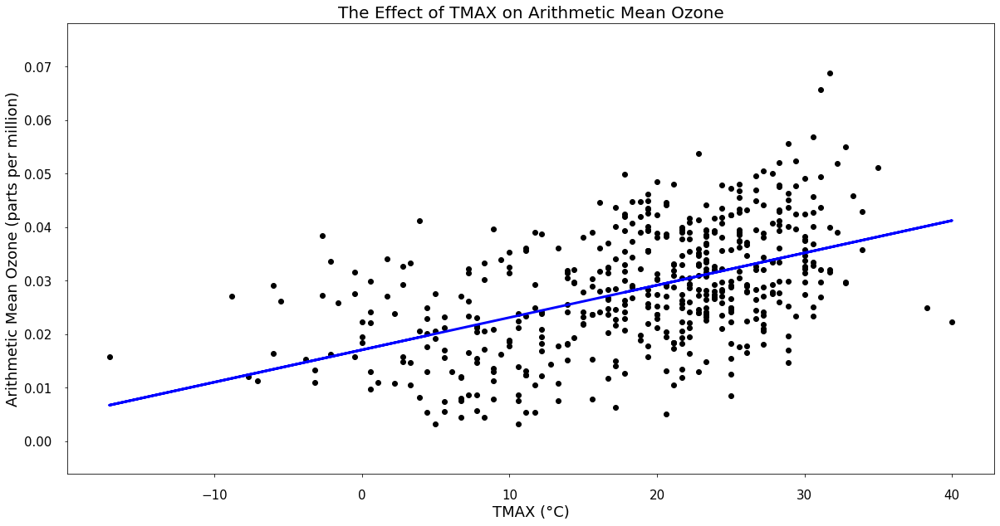

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display TMAX
All Features In Model ['TMAX', 'TMIN']
Coefficients [ 6.04273513e-04 -1.67710876e-05]


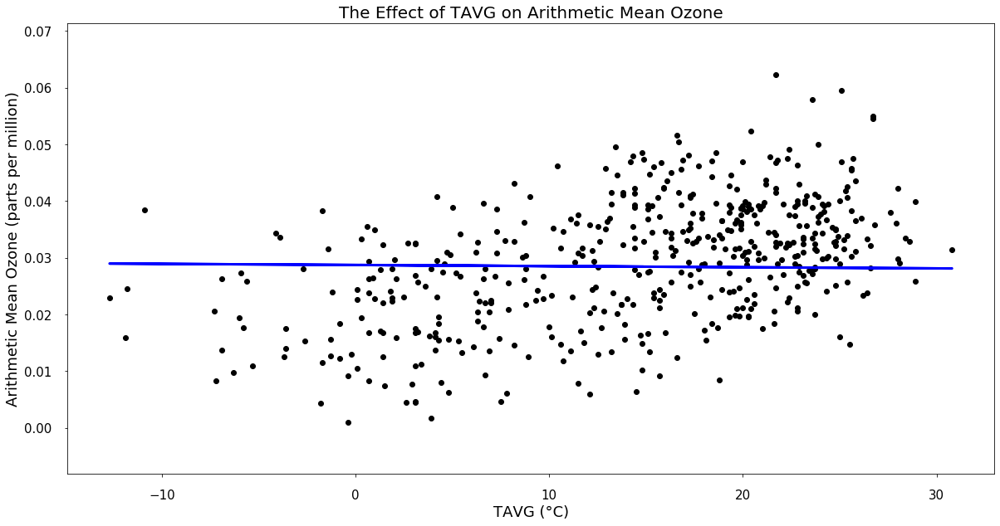

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMAX']
Coefficients [-1.99283650e-05  6.12479279e-04]


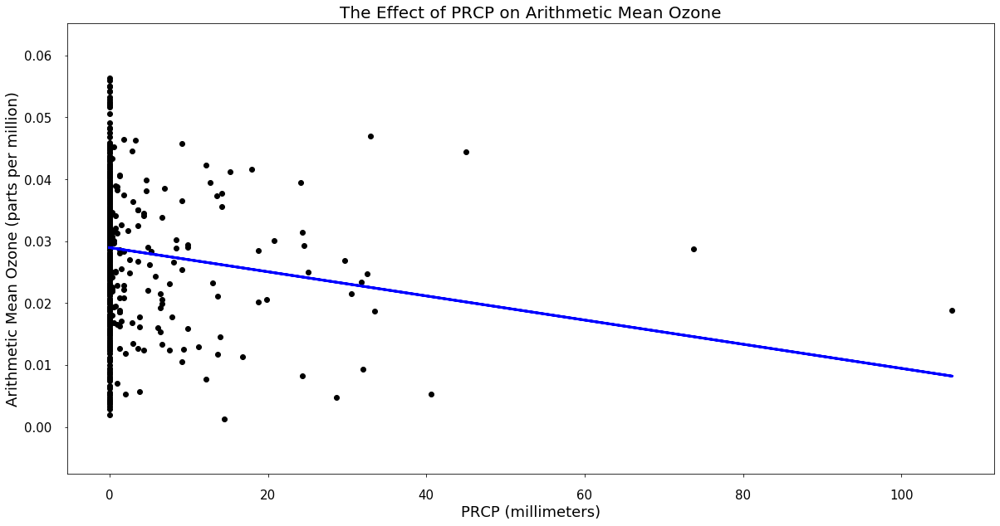

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG']
Coefficients [-1.95062811e-04  8.00782225e-06  4.15472201e-05  6.21540108e-04]


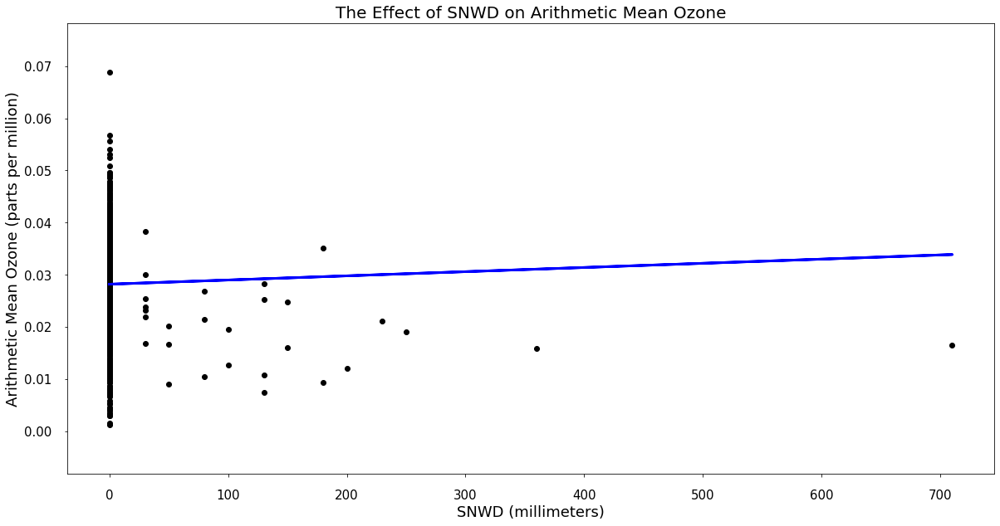

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMAX']
Coefficients [8.01040085e-06 5.99224505e-04]


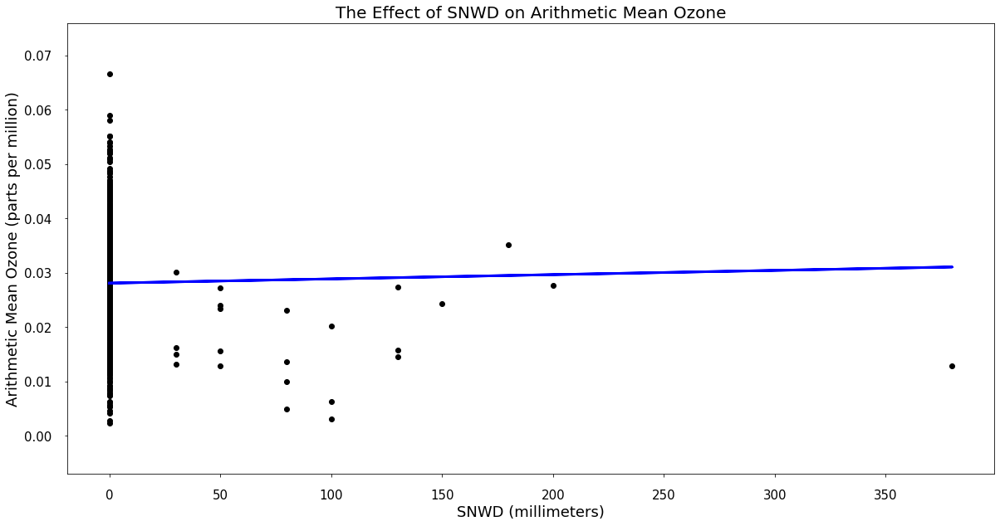

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMAX', 'TMIN']
Coefficients [ 7.80871064e-06  6.05592918e-04 -8.76976758e-06]


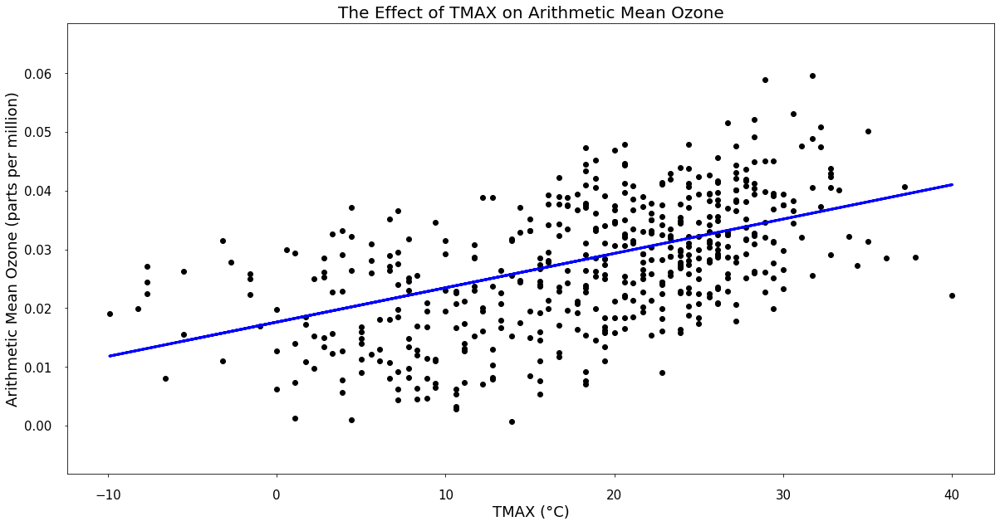

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display TMAX
All Features In Model ['TMAX']
Coefficients [0.00058473]


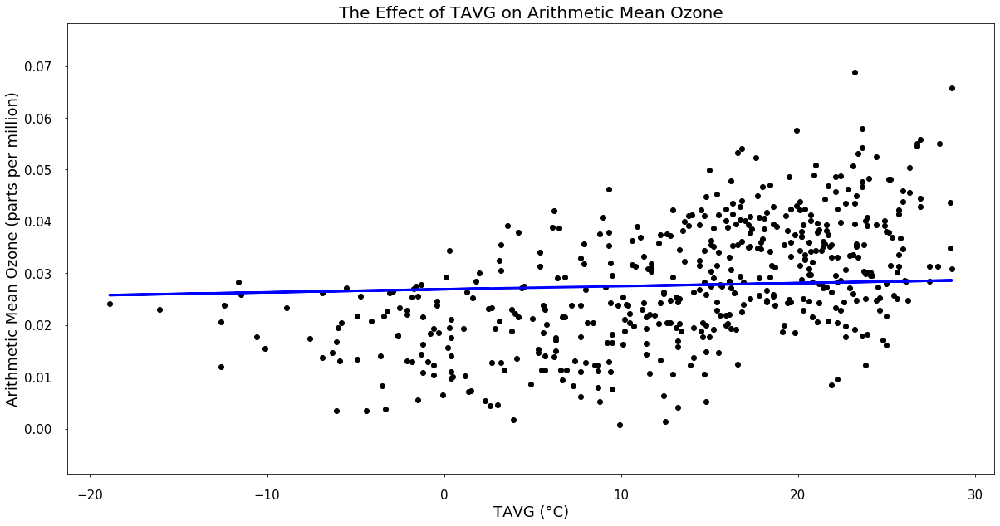

Explained Variance 0.26
Correlation Coefficient 0.51
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMAX', 'TMIN']
Coefficients [ 5.96909764e-05  5.57314062e-04 -3.54630469e-05]


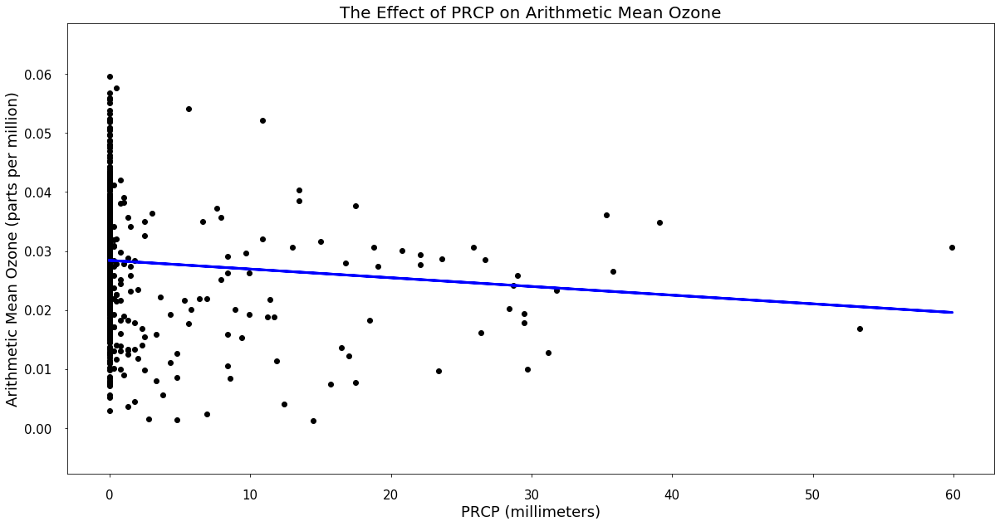

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMIN']
Coefficients [-1.47222484e-04  7.78021049e-06  8.60642503e-04 -2.38495111e-04]


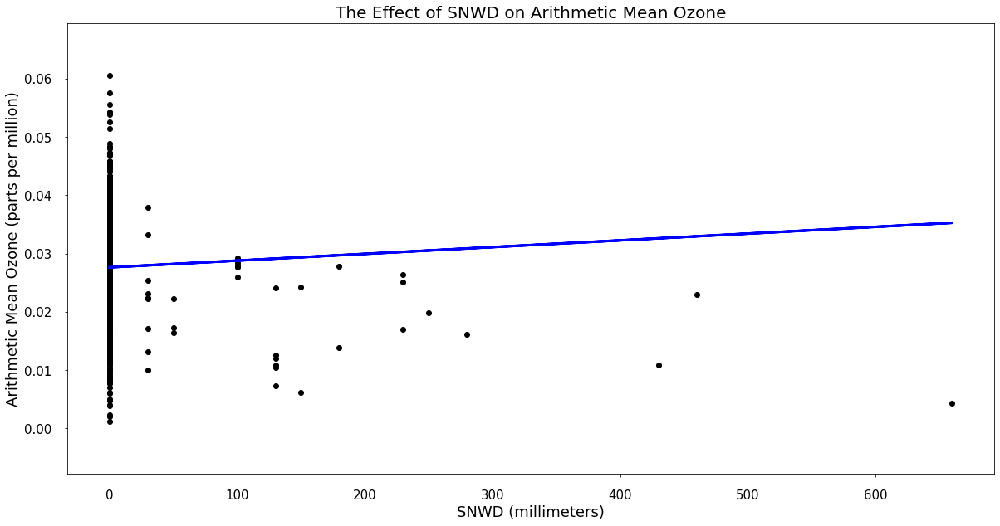

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 1.15781095e-05  2.92822700e-05  6.19217809e-04 -3.48261394e-05]


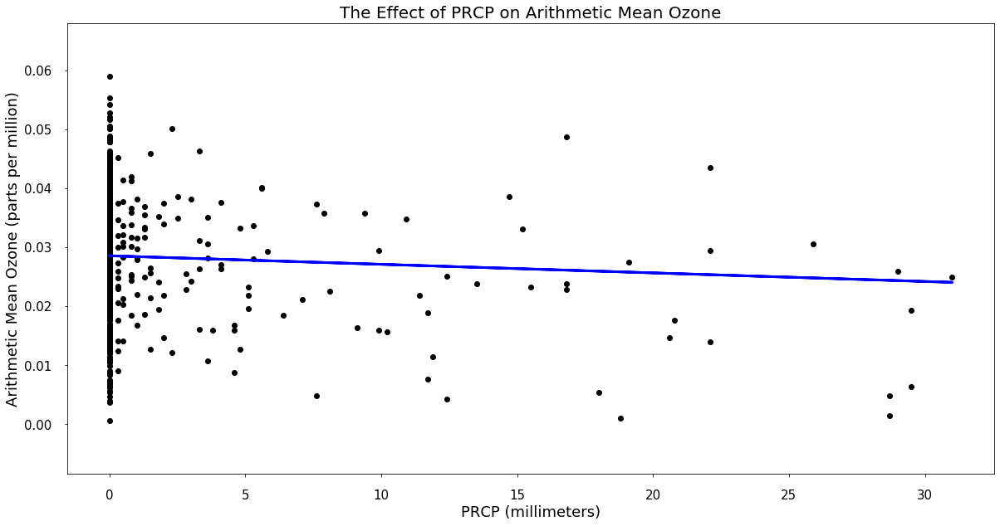

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMIN']
Coefficients [-0.00014527  0.00093956 -0.00033367]


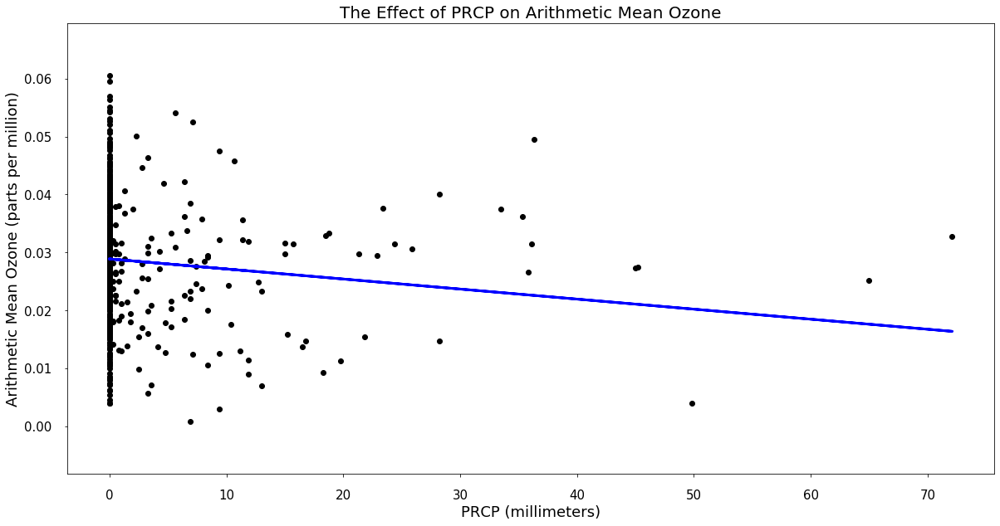

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG']
Coefficients [-0.00017329  0.00060586]


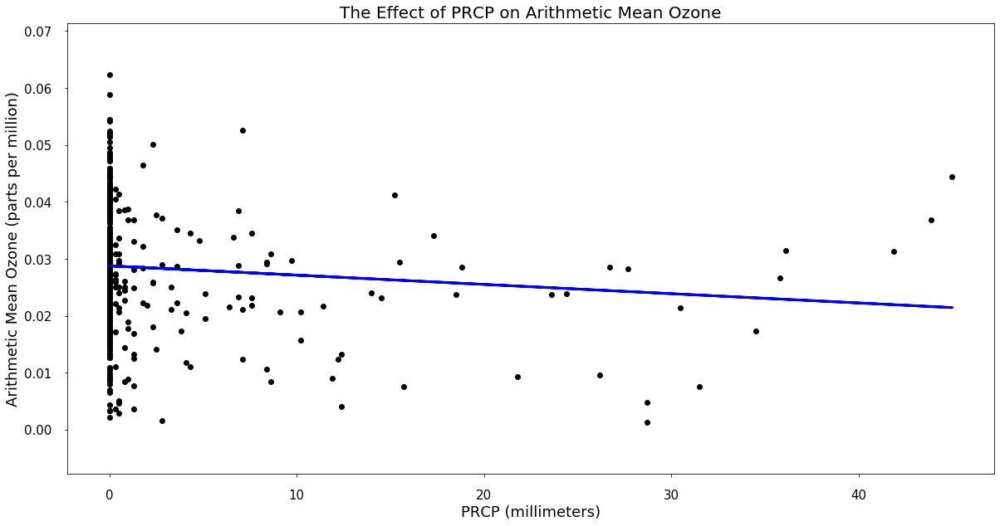

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG']
Coefficients [-1.62735877e-04  1.36962199e-05  6.37333523e-04]


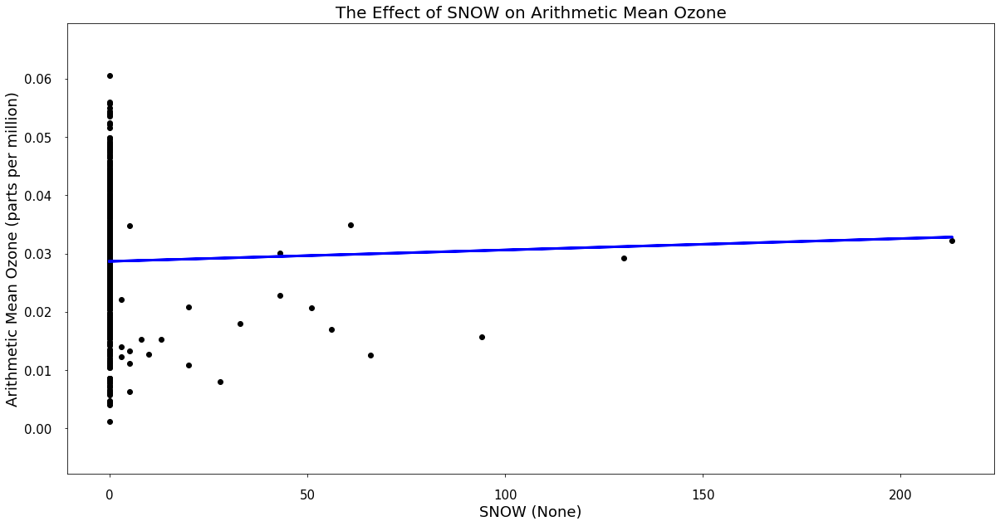

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMIN']
Coefficients [ 1.95242797e-05  9.16131926e-04 -3.16040748e-04]


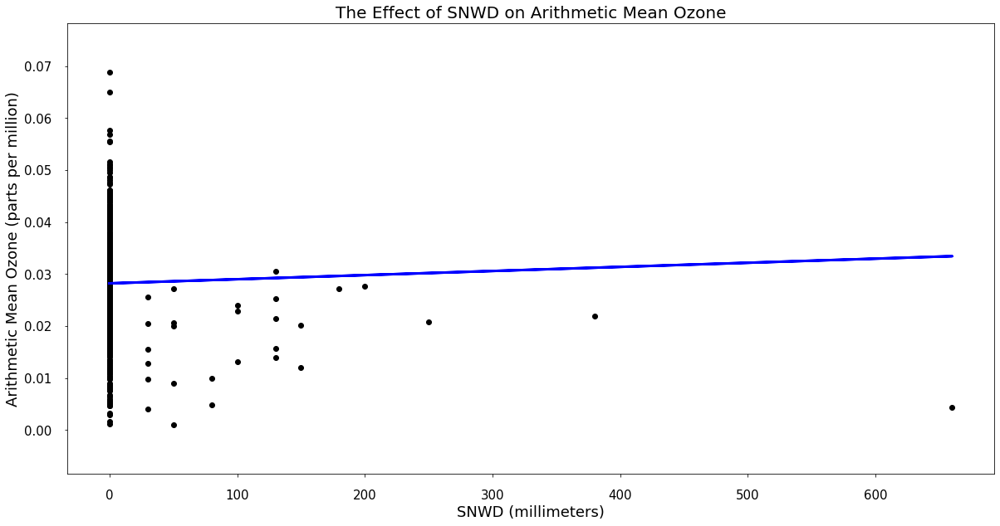

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 7.91589047e-06  2.31636418e-05  9.11851112e-04 -2.79931819e-04]


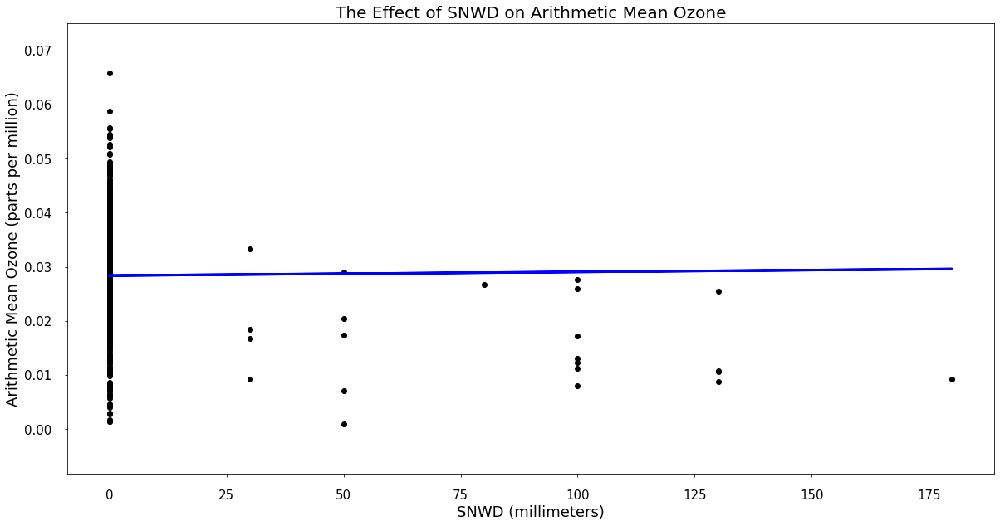

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMIN']
Coefficients [ 6.74341028e-06  9.03820052e-04 -2.96183140e-04]


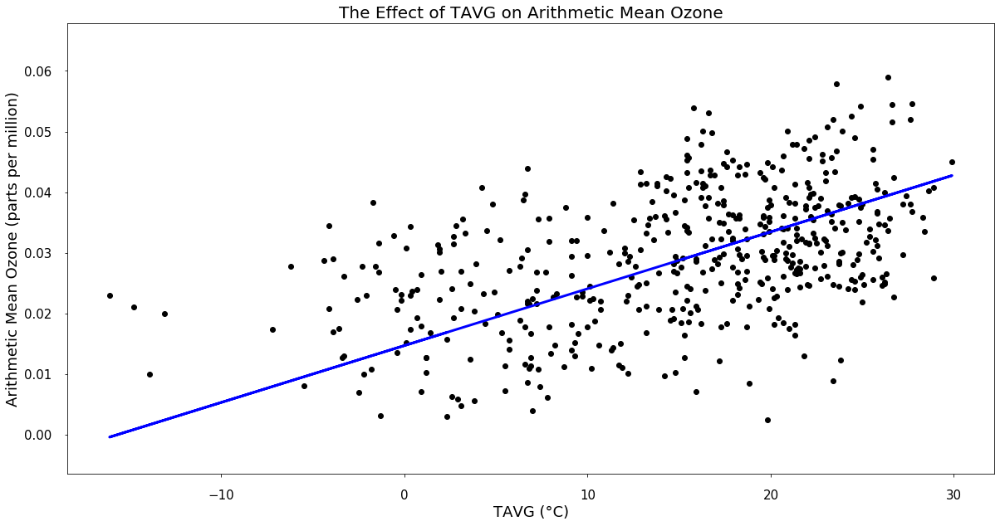

Explained Variance 0.25
Correlation Coefficient 0.50
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMIN']
Coefficients [ 0.00093792 -0.00033196]


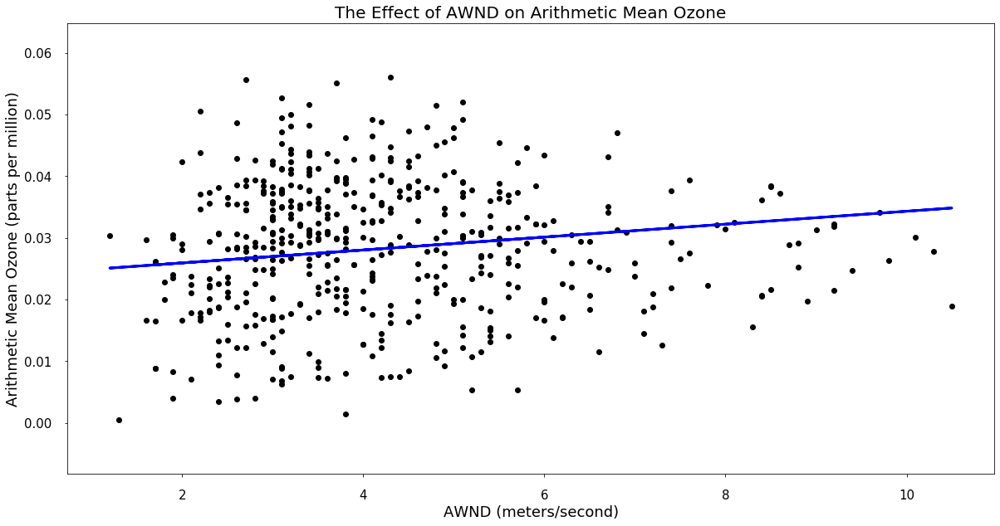

Explained Variance 0.25
Correlation Coefficient 0.49
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMIN']
Coefficients [0.00104791 0.0006356 ]


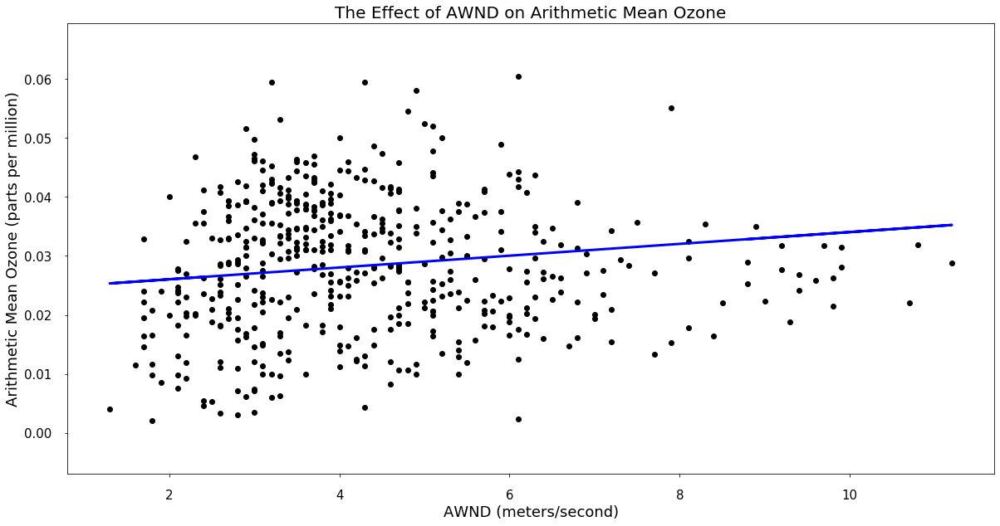

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [1.00152680e-03 7.12780933e-06 1.00682580e-05 6.39219162e-04]


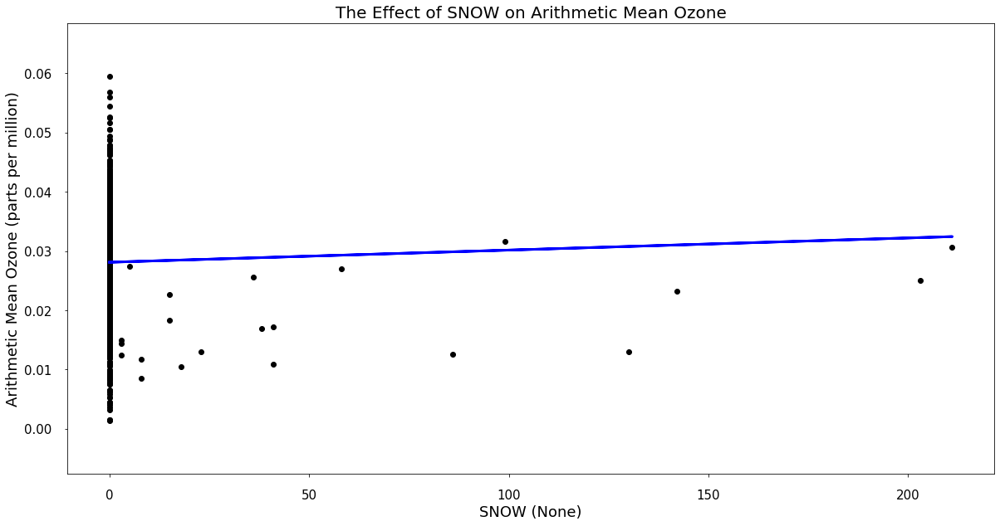

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG']
Coefficients [2.05006500e-05 6.12403006e-04]


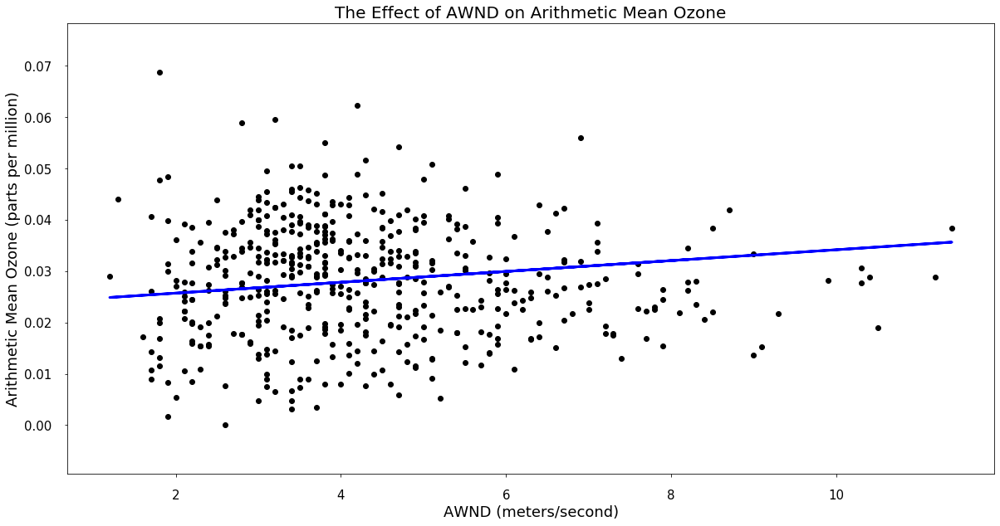

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMIN']
Coefficients [1.05629926e-03 1.06191842e-05 6.40831986e-04]


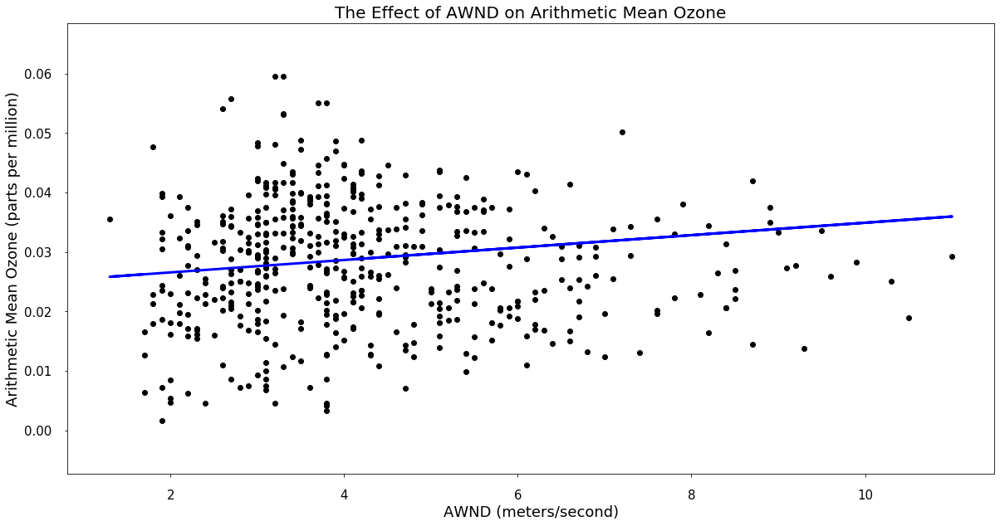

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMIN']
Coefficients [1.04460575e-03 5.40214778e-06 6.41377441e-04]


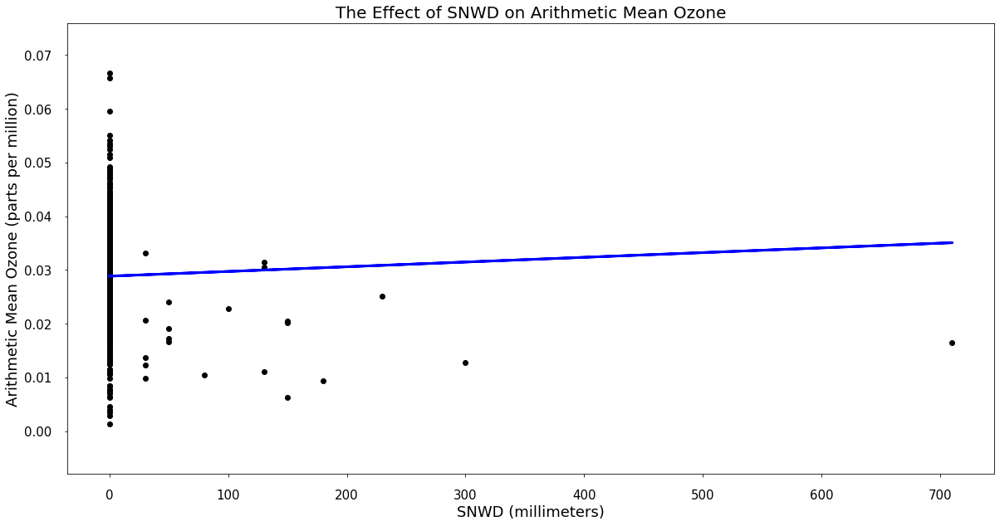

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG']
Coefficients [8.77520718e-06 2.03807720e-05 6.35027197e-04]


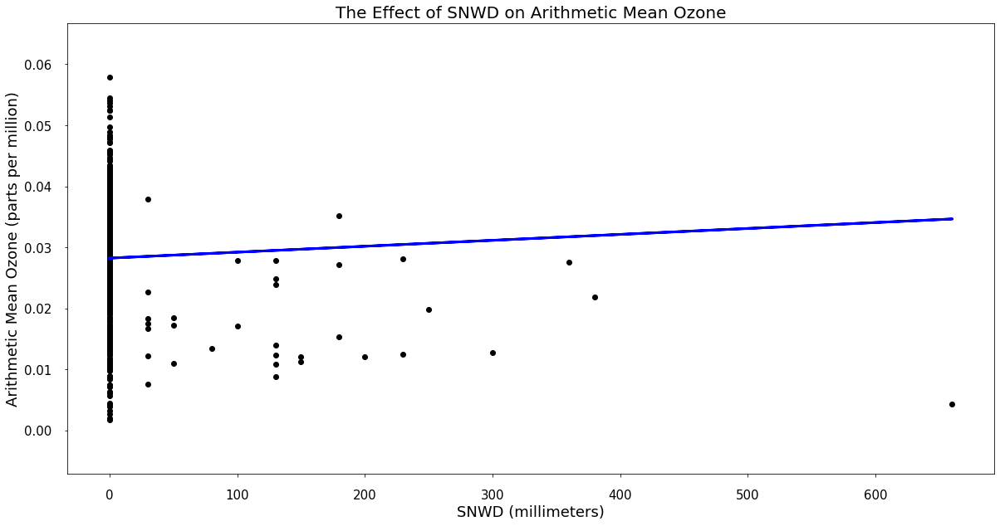

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG']
Coefficients [9.71018479e-06 6.21193200e-04]


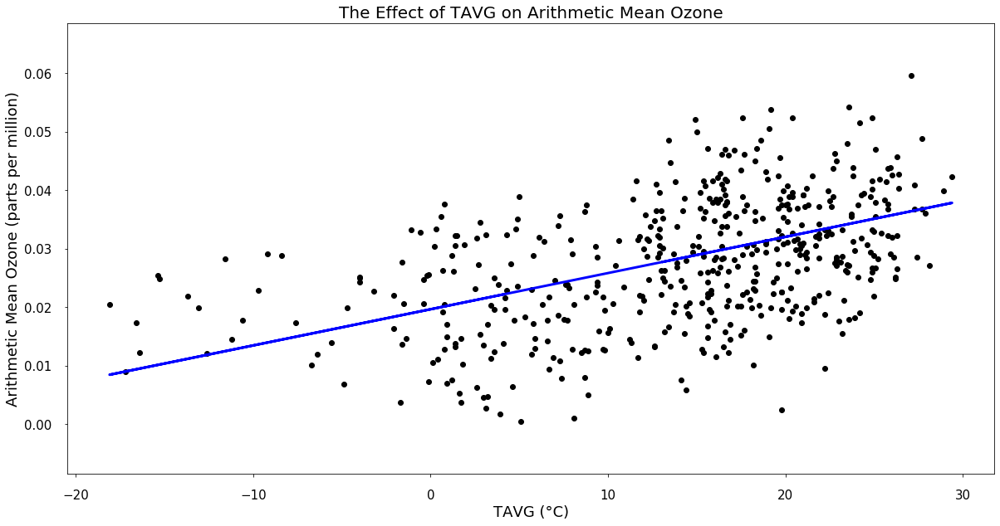

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display TAVG
All Features In Model ['TAVG']
Coefficients [0.00061812]


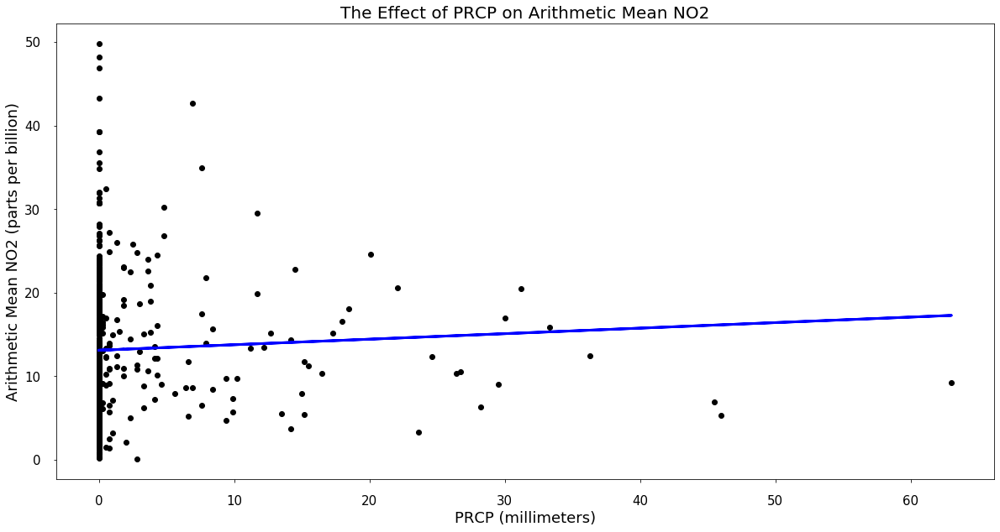

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMAX']
Coefficients [ 0.06617373 -1.73951972  0.02057434 -0.31865735]


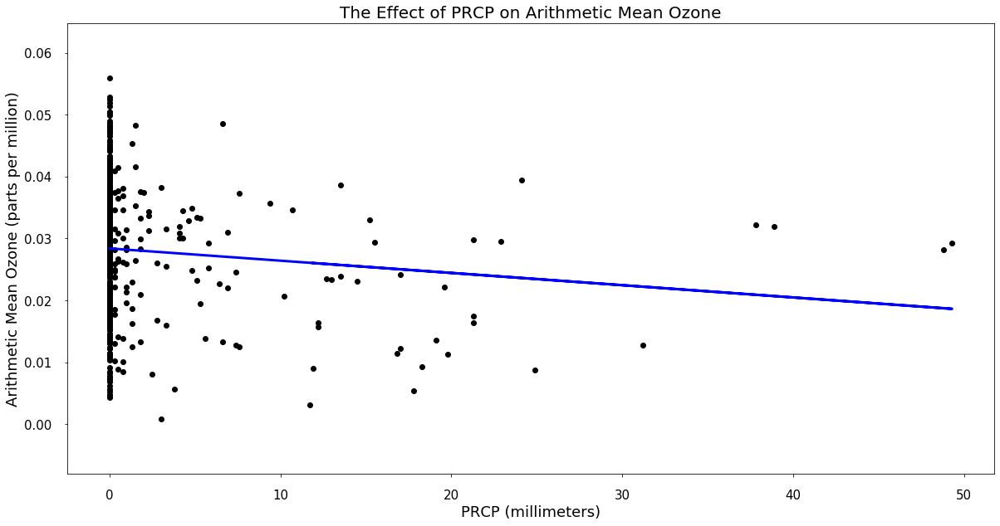

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMIN']
Coefficients [-1.98026567e-04  3.39585190e-05  5.96533402e-04]


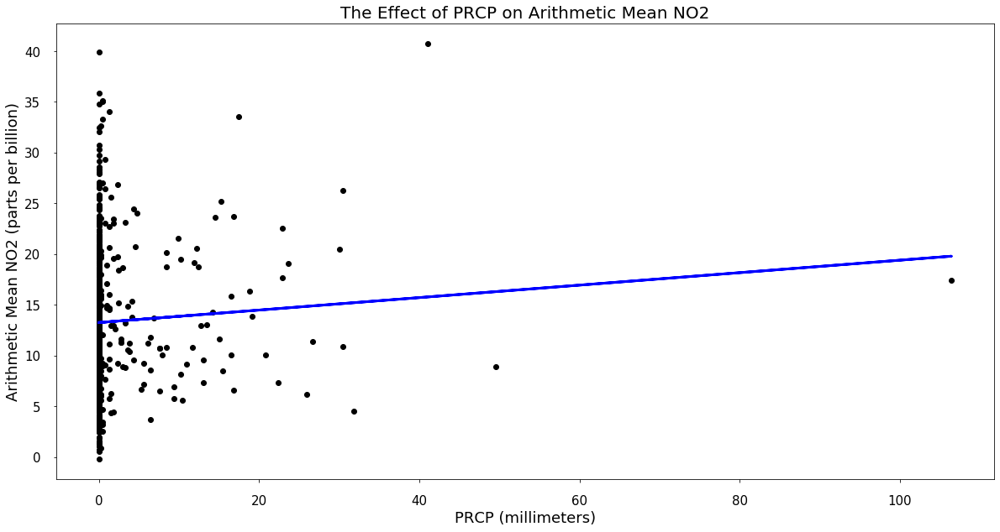

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX']
Coefficients [ 0.06147132 -1.76903266  0.02672003 -0.00546781 -0.31876728]


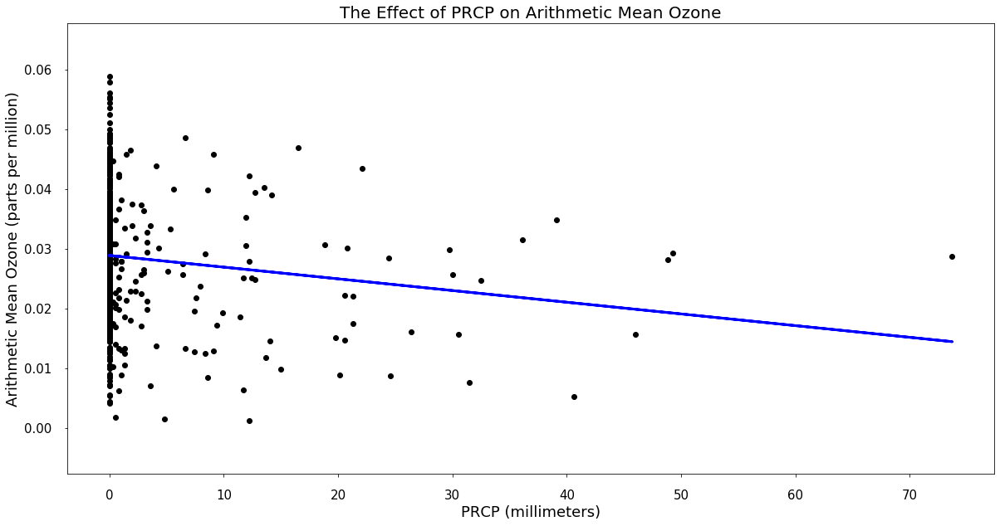

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMIN']
Coefficients [-1.95779432e-04  7.23922194e-06  3.66045897e-05  6.05194260e-04]


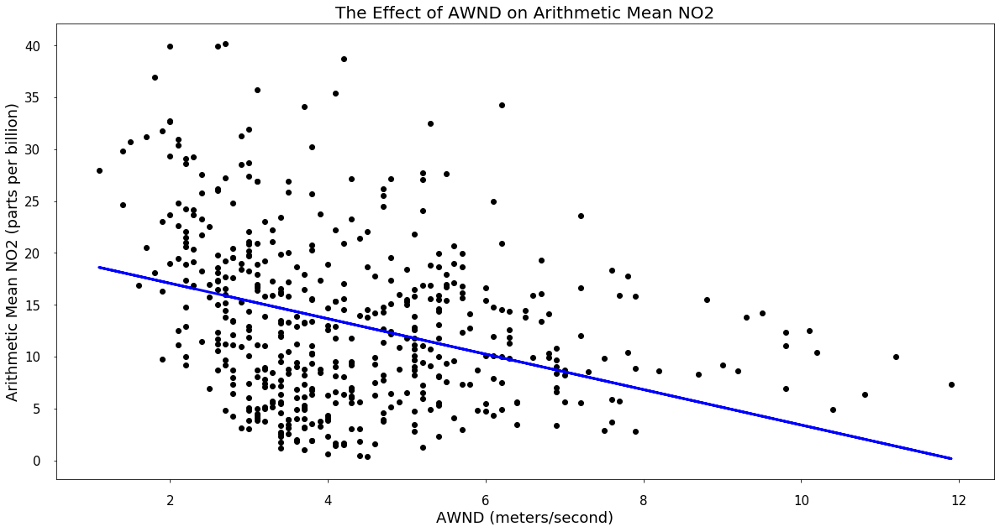

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMAX']
Coefficients [-1.70806685e+00  2.59782595e-02 -6.60864852e-04 -3.14865150e-01]


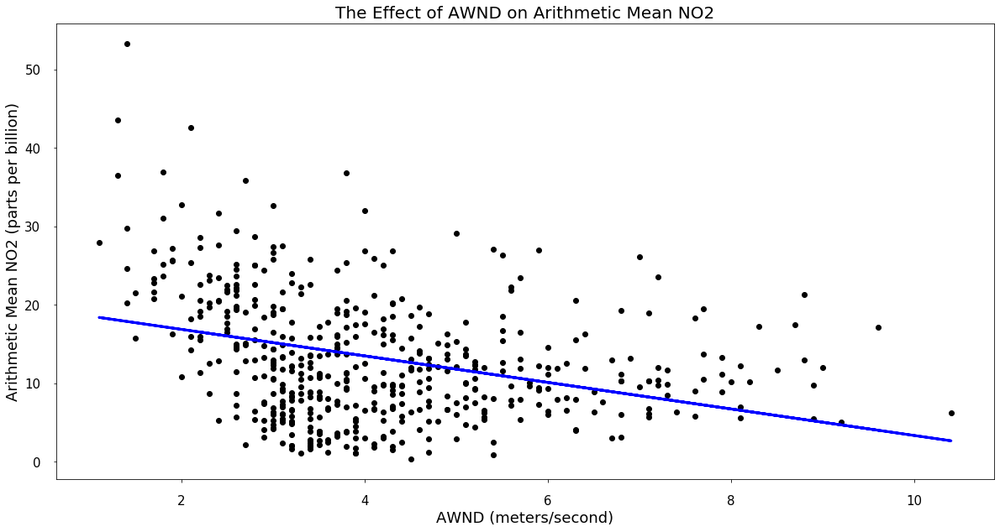

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX']
Coefficients [-1.69241439  0.02484048 -0.31534797]


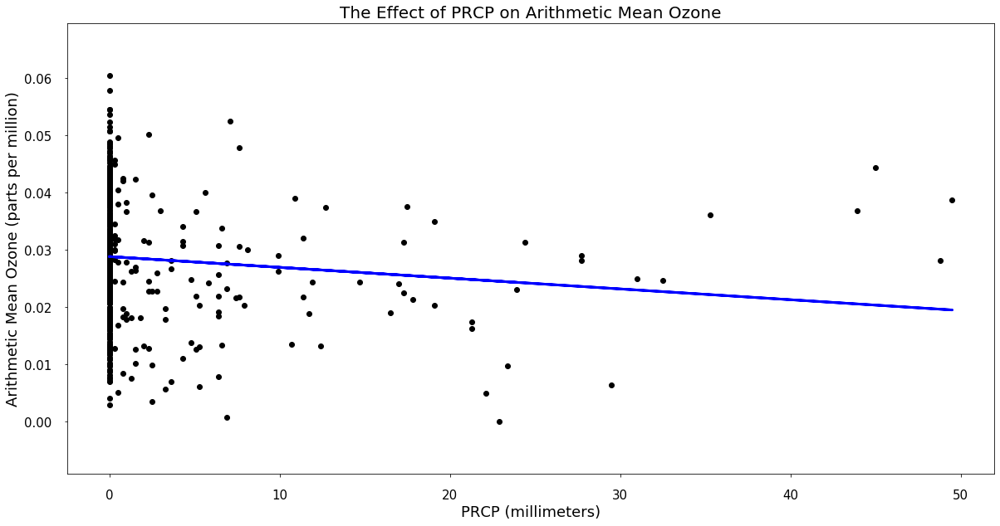

Explained Variance 0.24
Correlation Coefficient 0.49
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMIN']
Coefficients [-0.00018821  0.00058034]


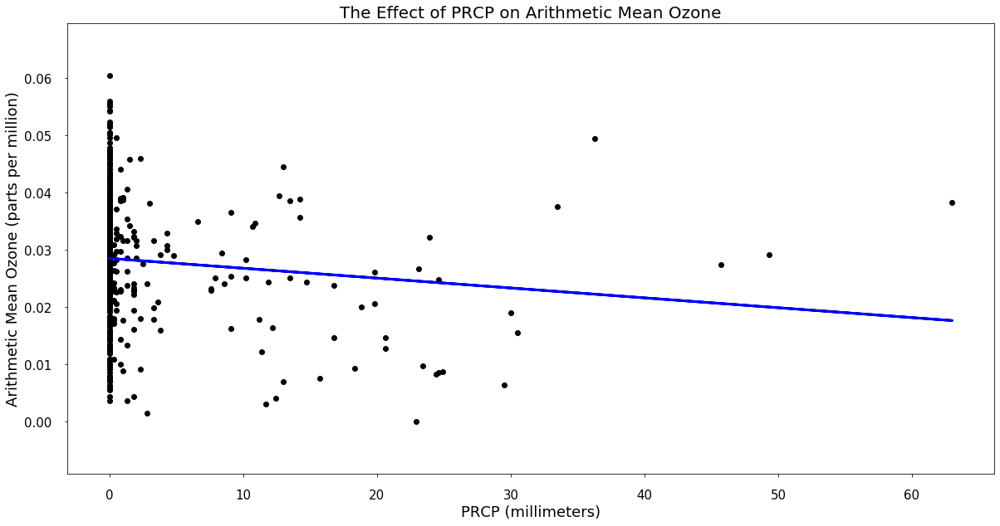

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMIN']
Coefficients [-1.72255901e-04  4.82906198e-06  5.84336160e-04]


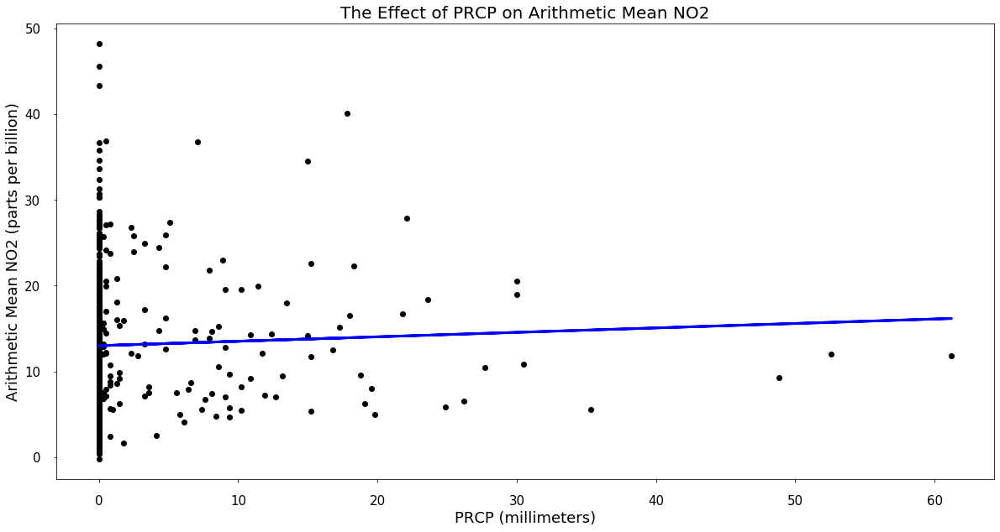

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.051799    0.01895316 -0.01994248  0.77653101 -1.09917969]


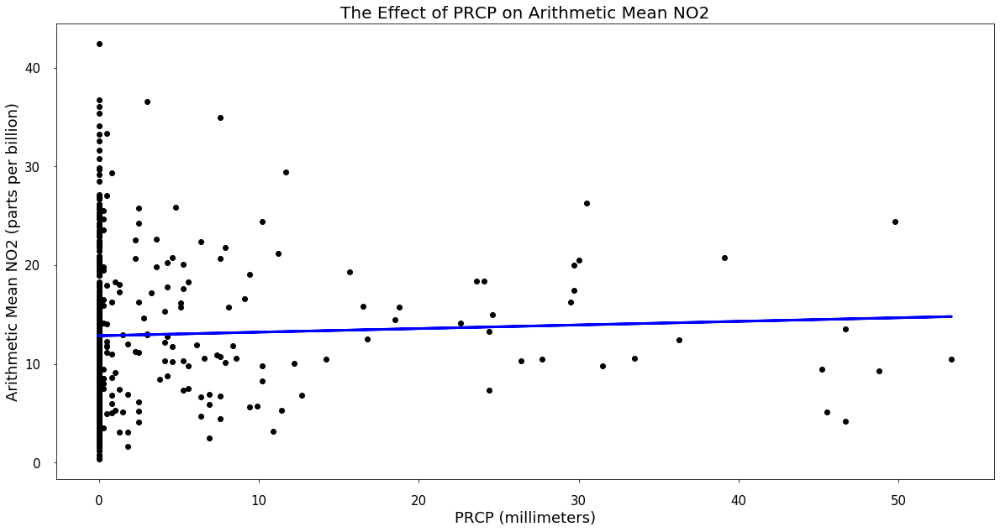

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMIN']
Coefficients [ 0.03646204  0.01593758  0.84353252 -1.16908433]


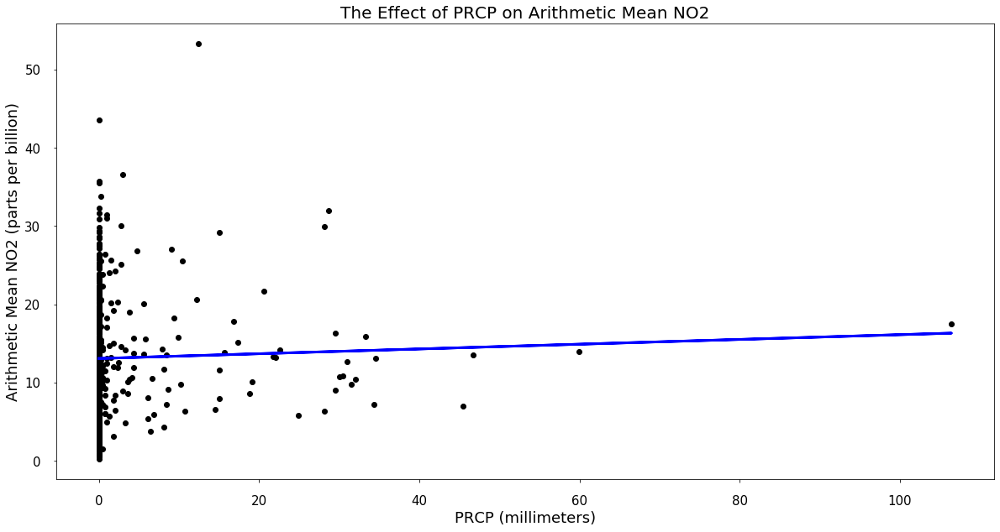

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMIN']
Coefficients [ 0.03042383  0.81085145 -1.15902009]


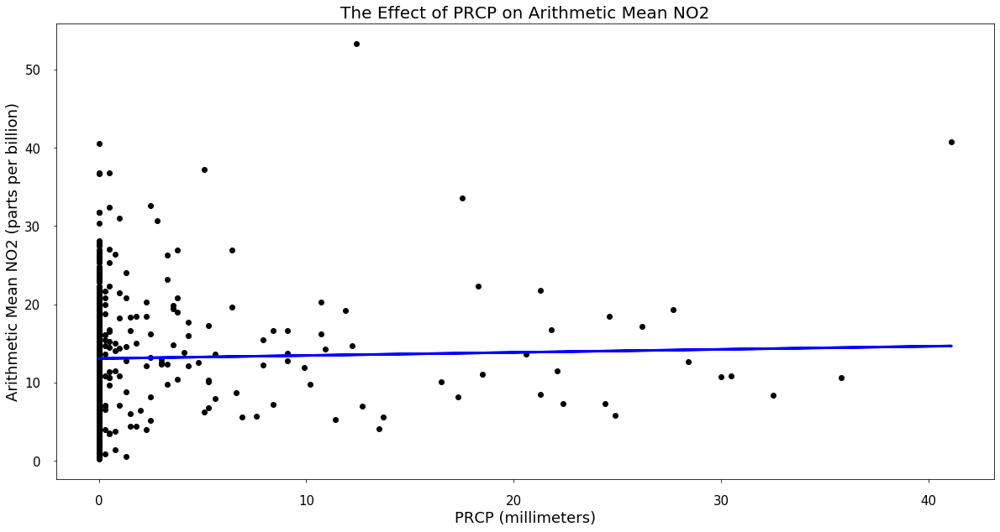

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.03907597 -0.01318205  0.79443602 -1.14396889]


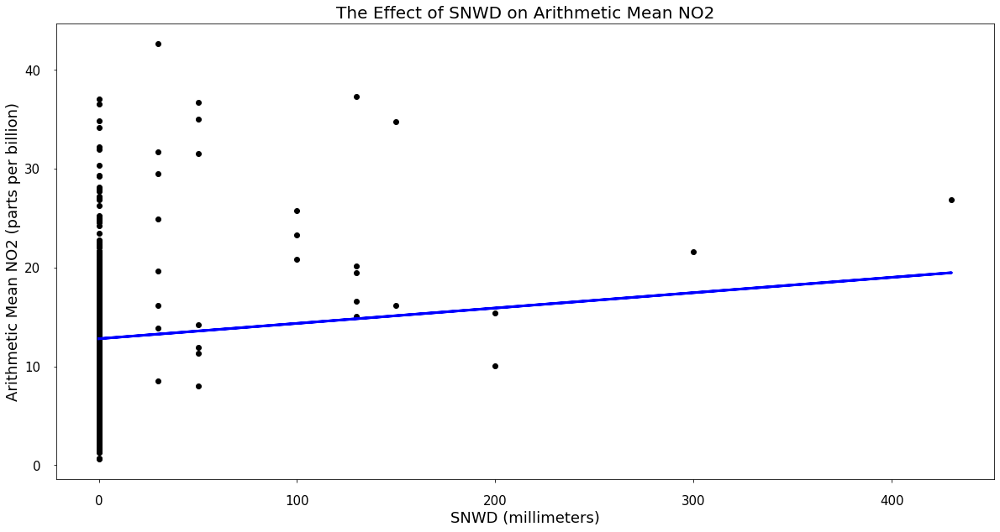

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.01551749 -0.01644717  0.80307091 -1.13977994]


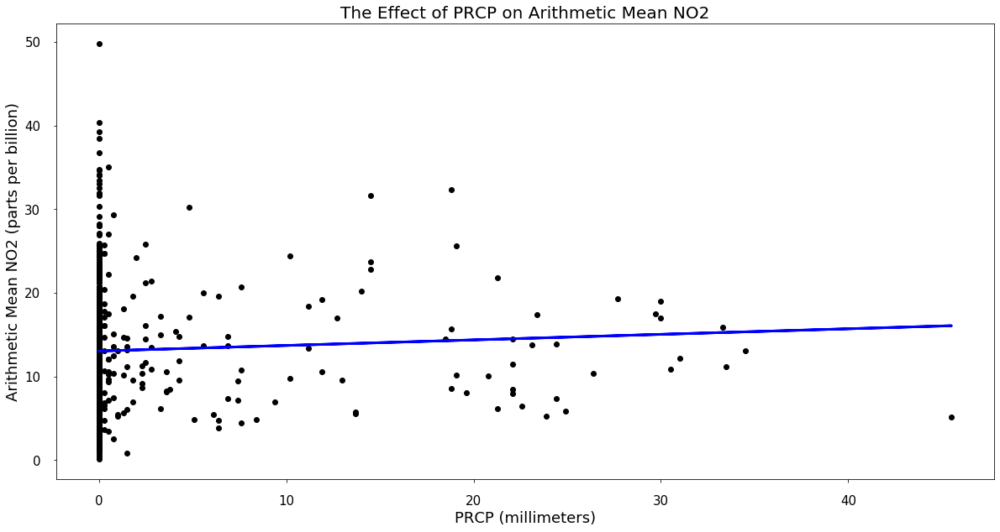

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMAX']
Coefficients [ 0.06652712 -1.79651886 -0.34987567]


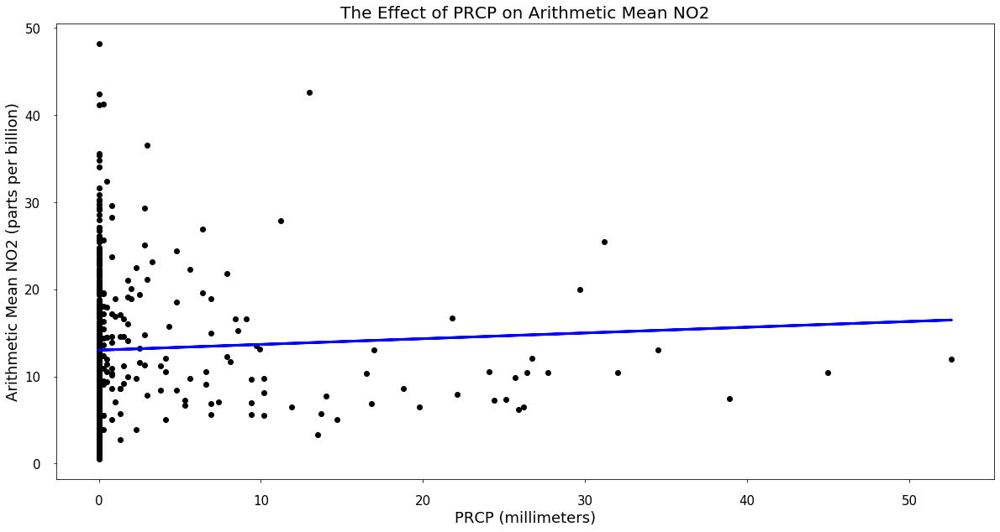

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMAX']
Coefficients [ 6.58464706e-02 -1.80716501e+00  5.53843376e-04 -3.54042361e-01]


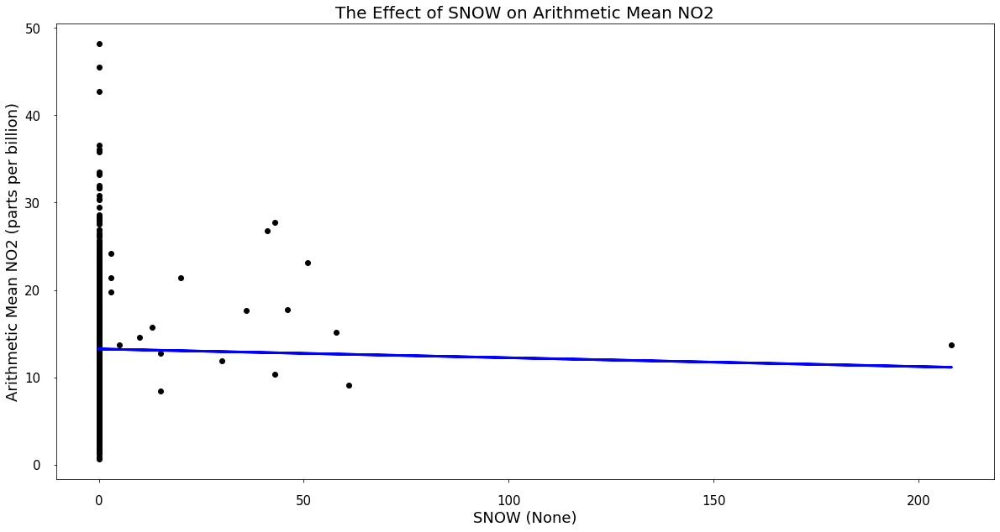

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMIN']
Coefficients [-0.01007652  0.75093076 -1.10403271]


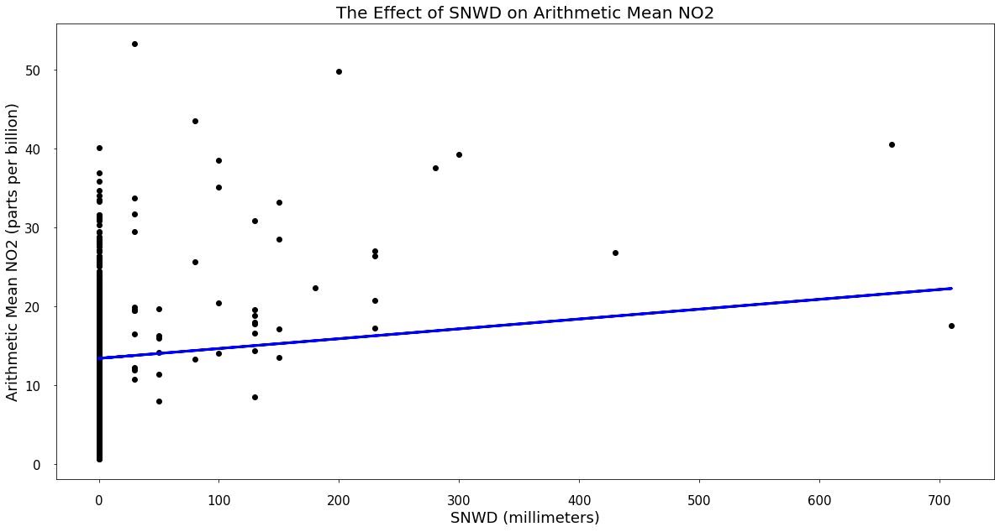

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMIN']
Coefficients [ 0.01247164  0.78561002 -1.11164901]


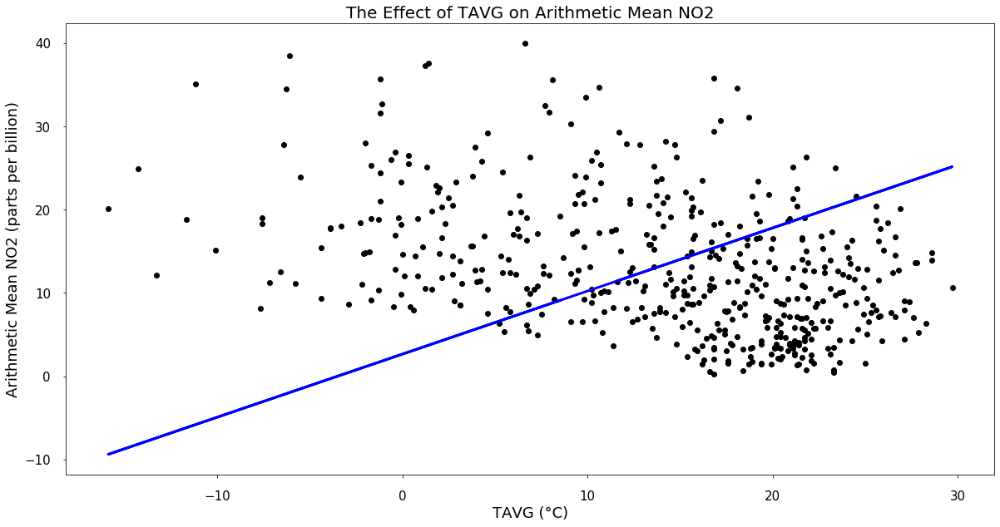

Explained Variance 0.23
Correlation Coefficient 0.48
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMIN']
Coefficients [ 0.75741528 -1.10344742]


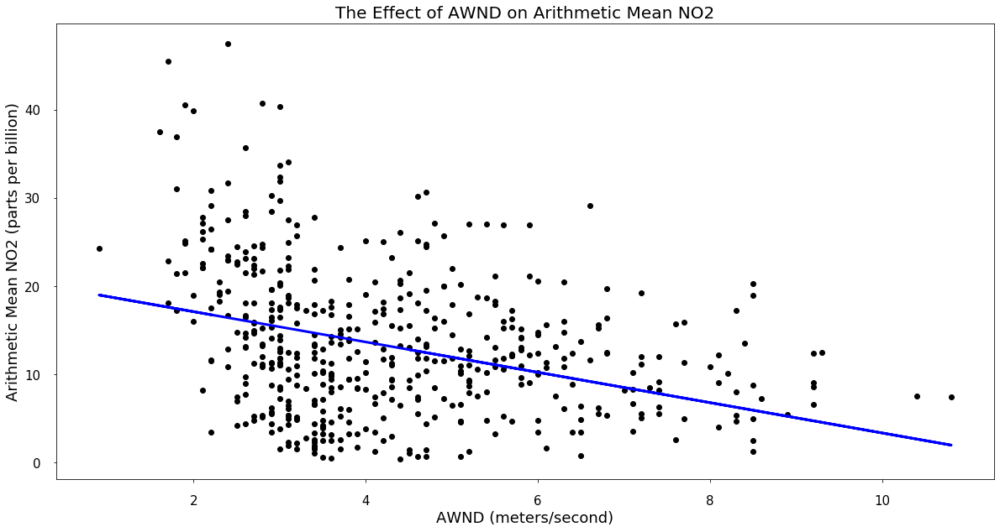

Explained Variance 0.22
Correlation Coefficient 0.47
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMAX']
Coefficients [-1.71946435  0.00636155 -0.35356312]


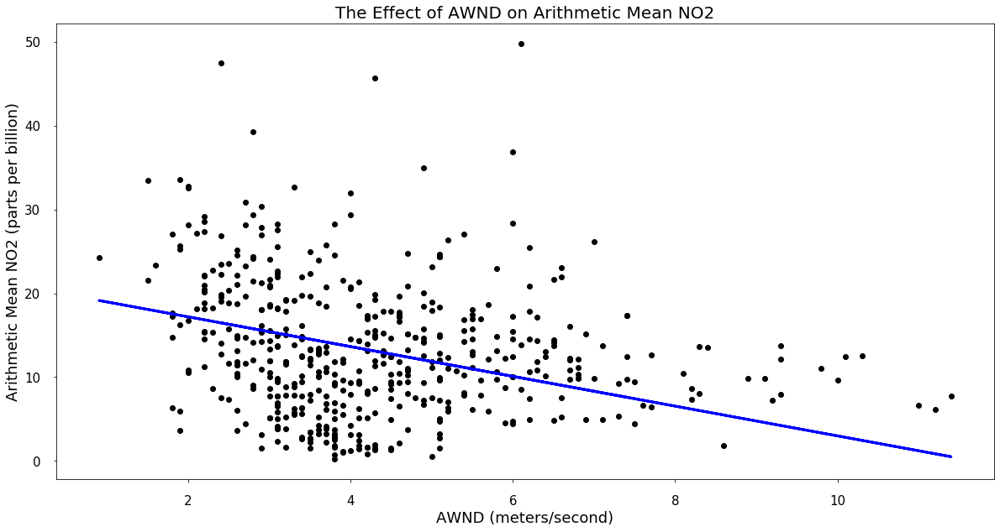

Explained Variance 0.22
Correlation Coefficient 0.47
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMAX']
Coefficients [-1.77601527 -0.35226114]


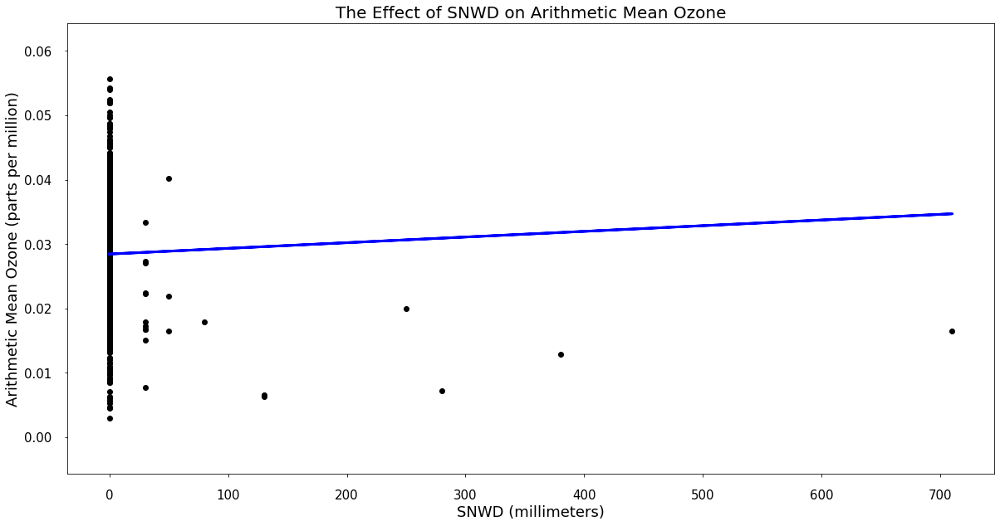

Explained Variance 0.22
Correlation Coefficient 0.47
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMIN']
Coefficients [8.80798889e-06 1.46868036e-05 5.92049993e-04]


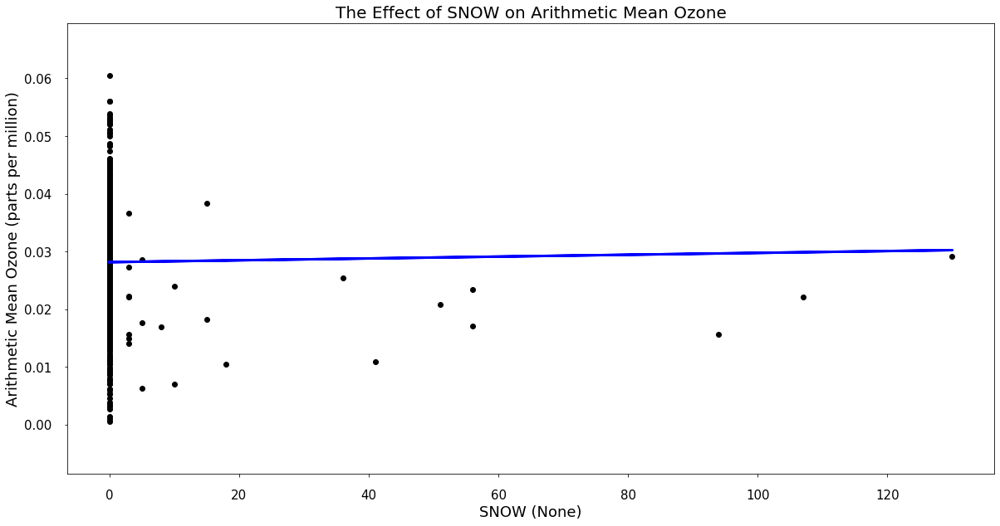

Explained Variance 0.22
Correlation Coefficient 0.47
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMIN']
Coefficients [1.60188112e-05 5.73122217e-04]


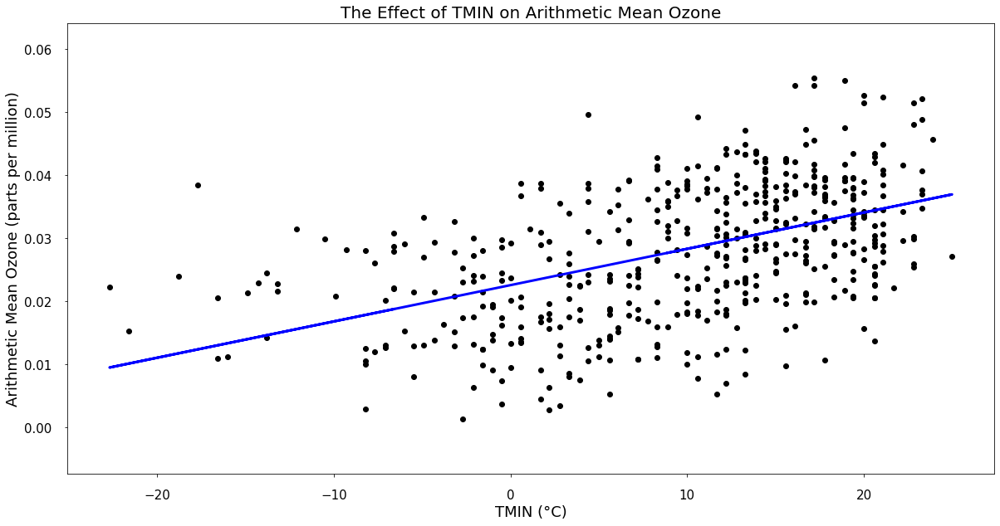

Explained Variance 0.22
Correlation Coefficient 0.47
Feature Selected for Display TMIN
All Features In Model ['TMIN']
Coefficients [0.00057523]


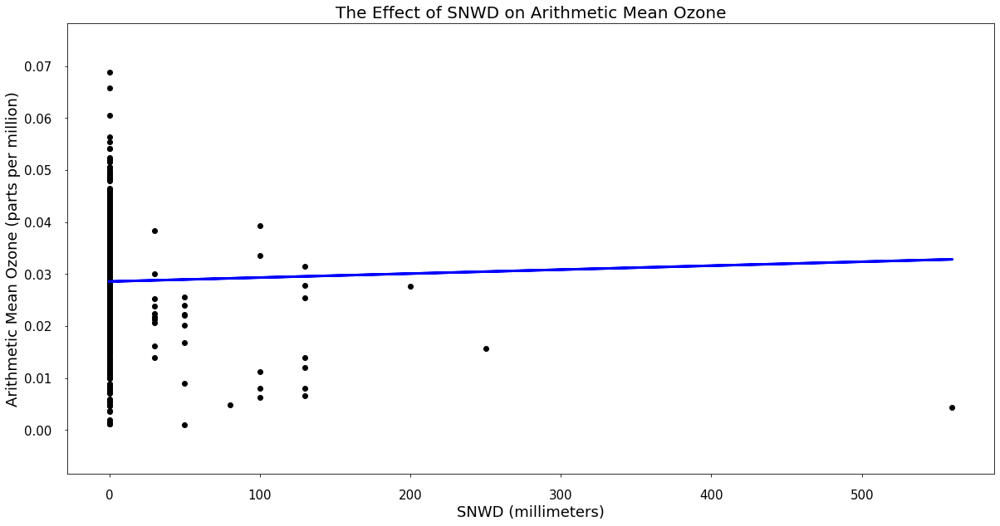

Explained Variance 0.22
Correlation Coefficient 0.47
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMIN']
Coefficients [7.60593700e-06 5.77423007e-04]


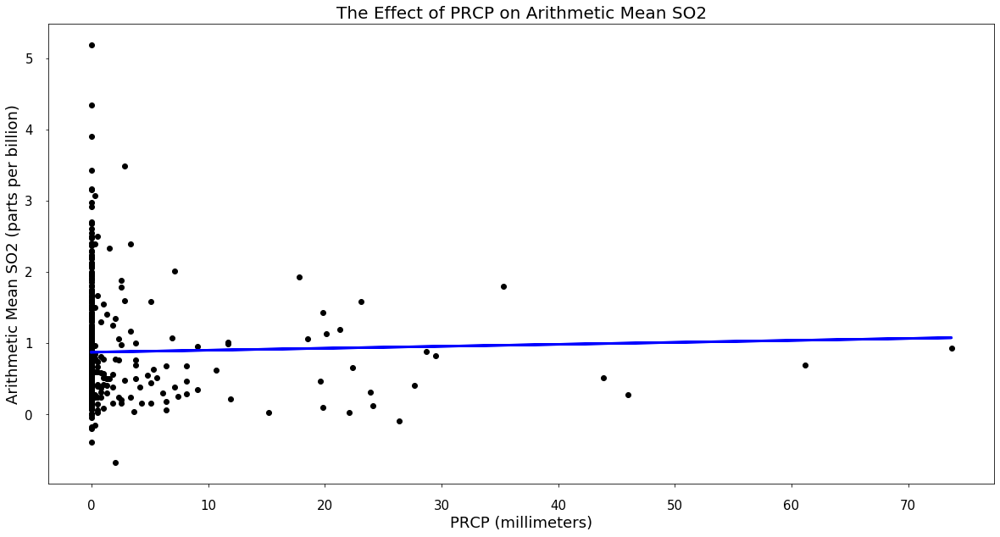

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.0027521  -0.04773042  0.00176822 -0.01704639  0.05519225 -0.0672527 ]


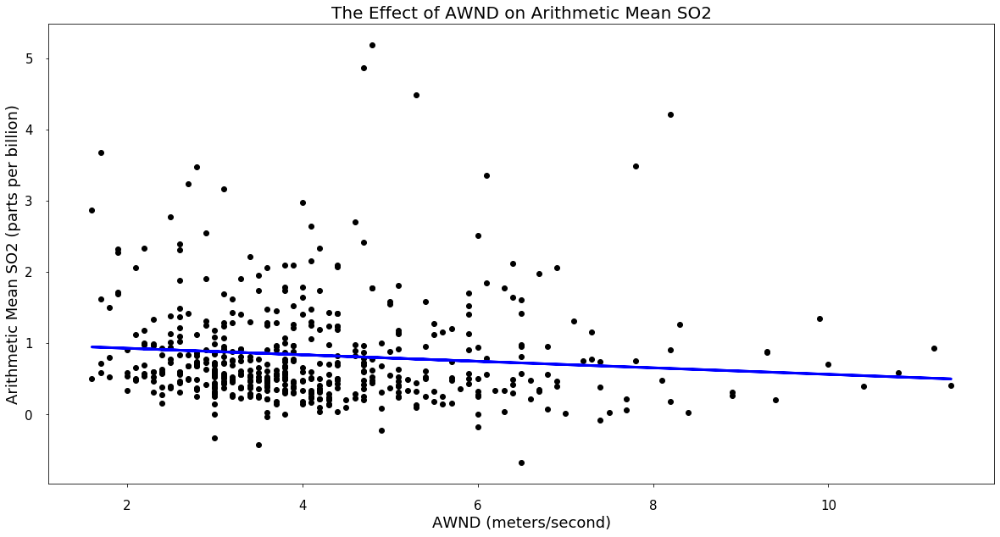

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [-0.04578264  0.00175876  0.04511823 -0.07287182]


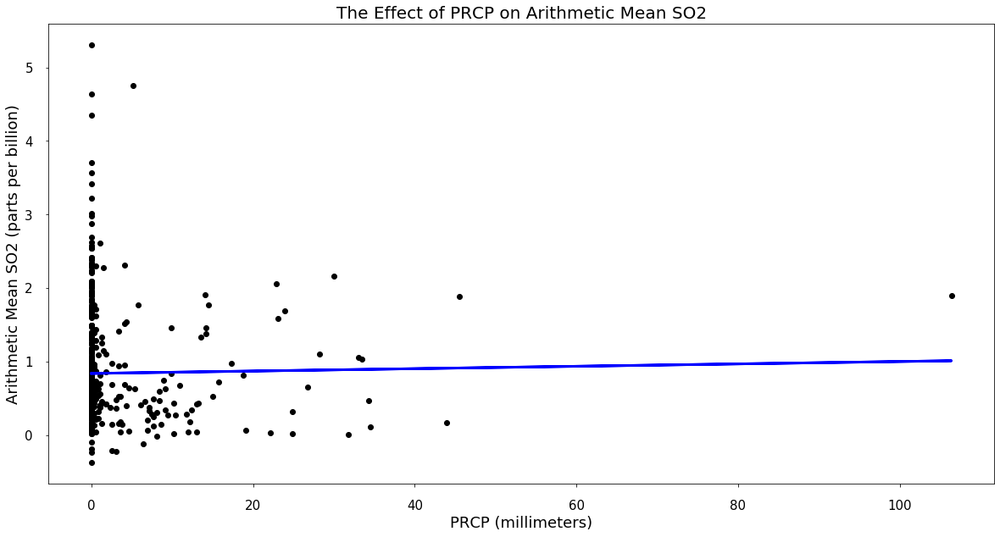

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 1.62117497e-03 -4.06741804e-02  1.27390016e-03 -7.02572498e-05
  4.70167228e-02 -7.51311493e-02]


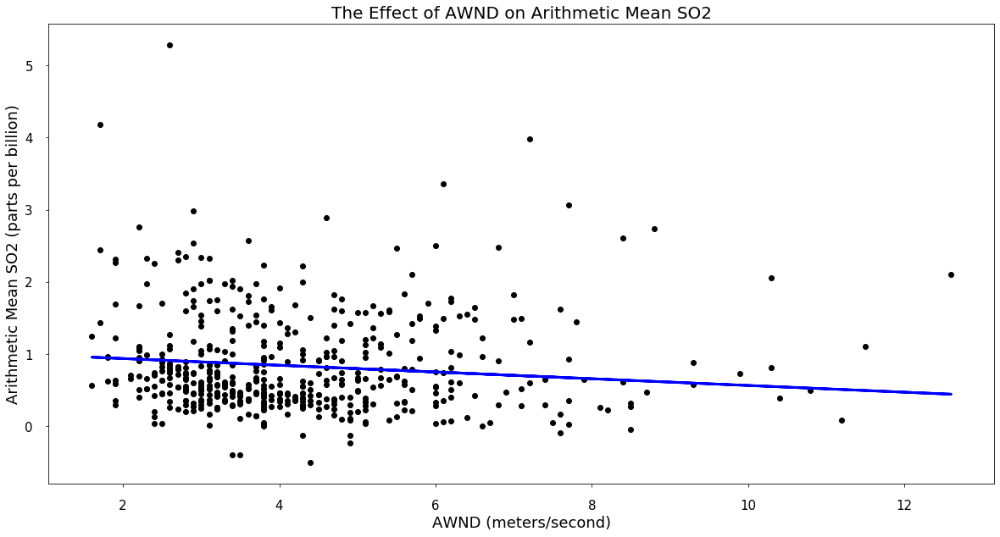

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-0.04657898  0.00200565 -0.00054691  0.04802659 -0.07606923]


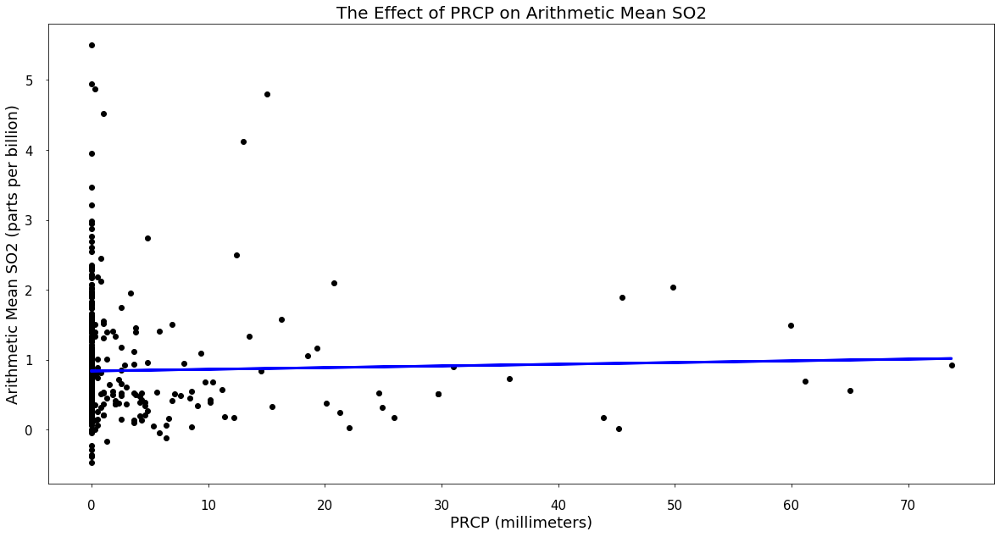

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00242401 -0.0443384   0.00185517 -0.00121012 -0.0280594   0.06121541
 -0.06167709]


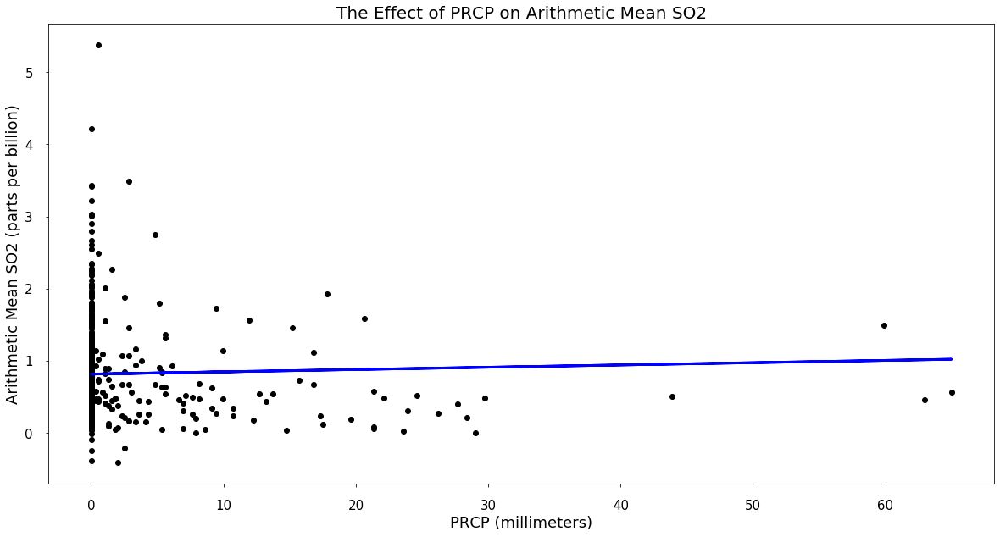

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.00316377 -0.05108727  0.00163653  0.0469809  -0.07569453]


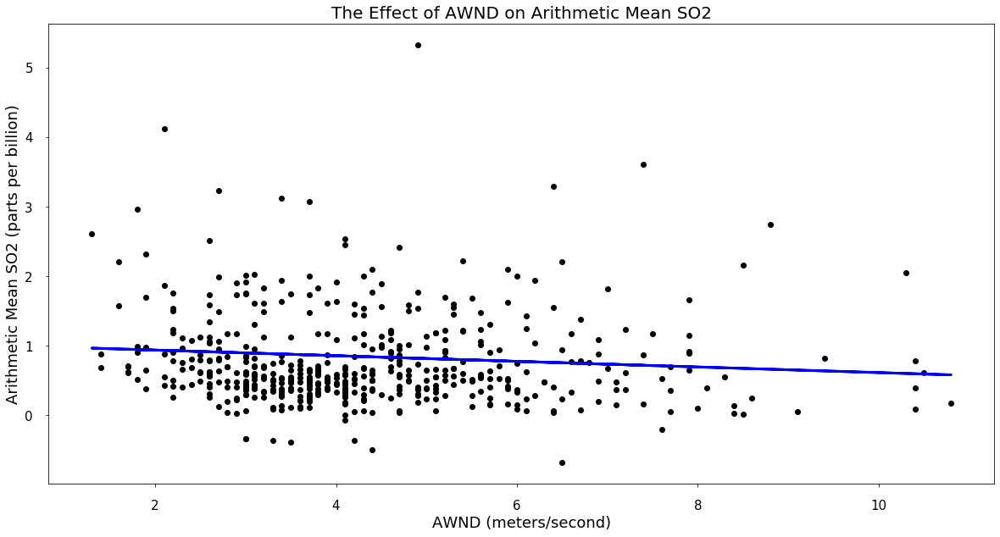

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.04044523  0.00154357 -0.03308191  0.0647775  -0.06102909]


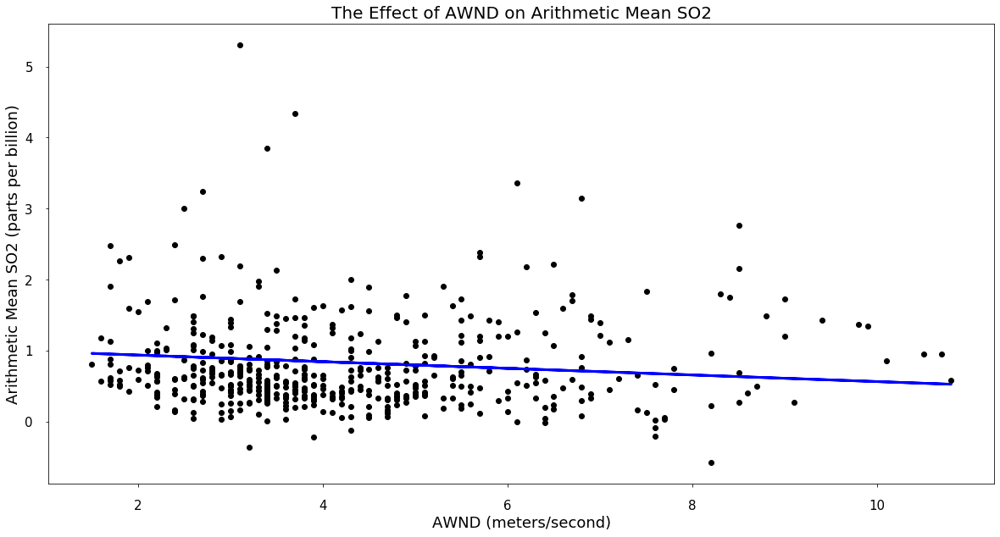

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.04672642  0.00176936  0.00032945 -0.02208673  0.05813067 -0.06553535]


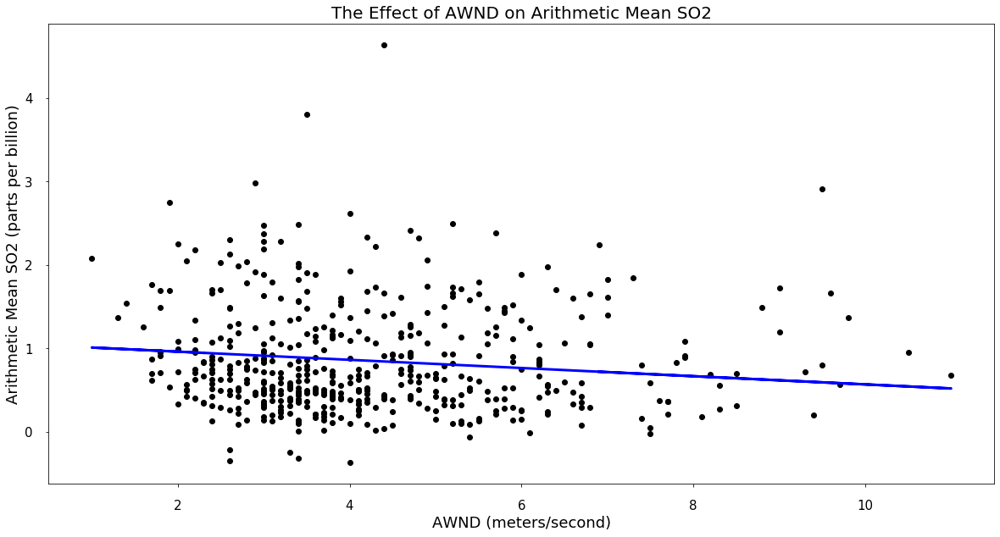

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMAX', 'TMIN']
Coefficients [-0.04906259  0.04620962 -0.07739102]


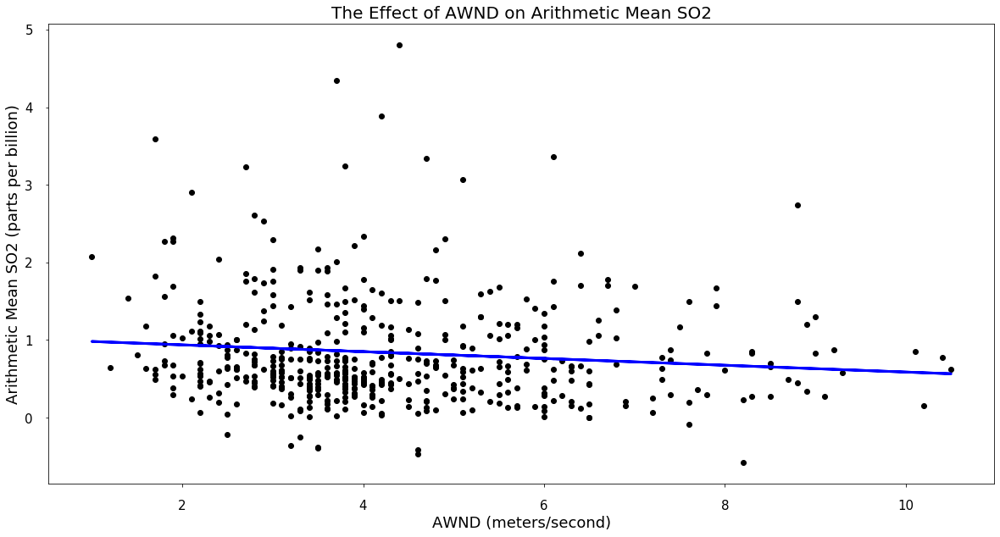

Explained Variance 0.21
Correlation Coefficient 0.46
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.04380456  0.00033903 -0.02537497  0.0575607  -0.06325147]


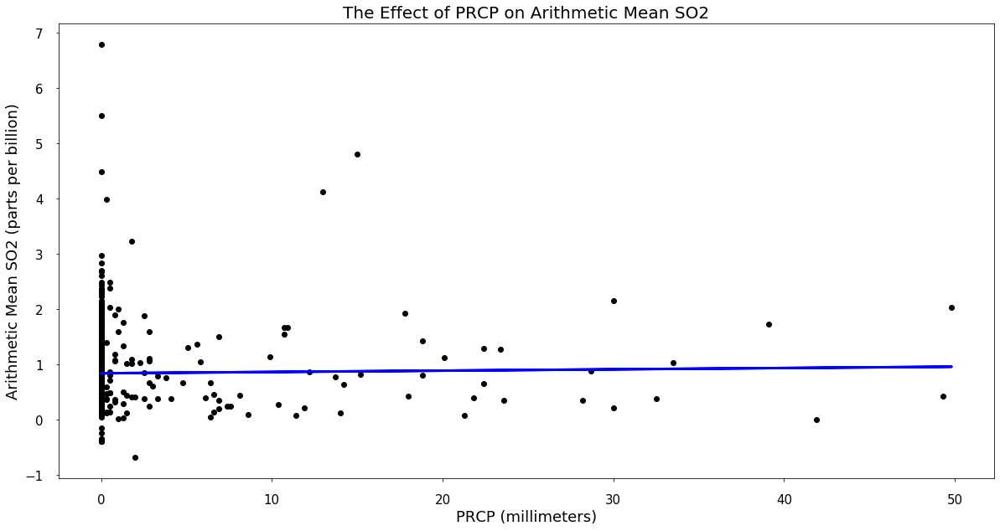

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.00238035 -0.04622083 -0.00048529  0.04729818 -0.07767374]


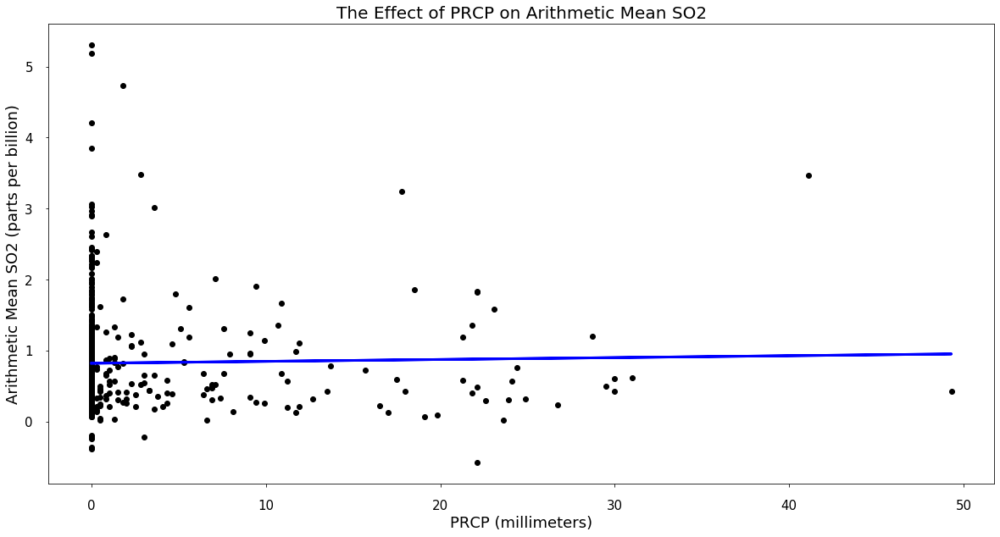

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMAX', 'TMIN']
Coefficients [ 0.00264503 -0.05297978  0.04490653 -0.07600346]


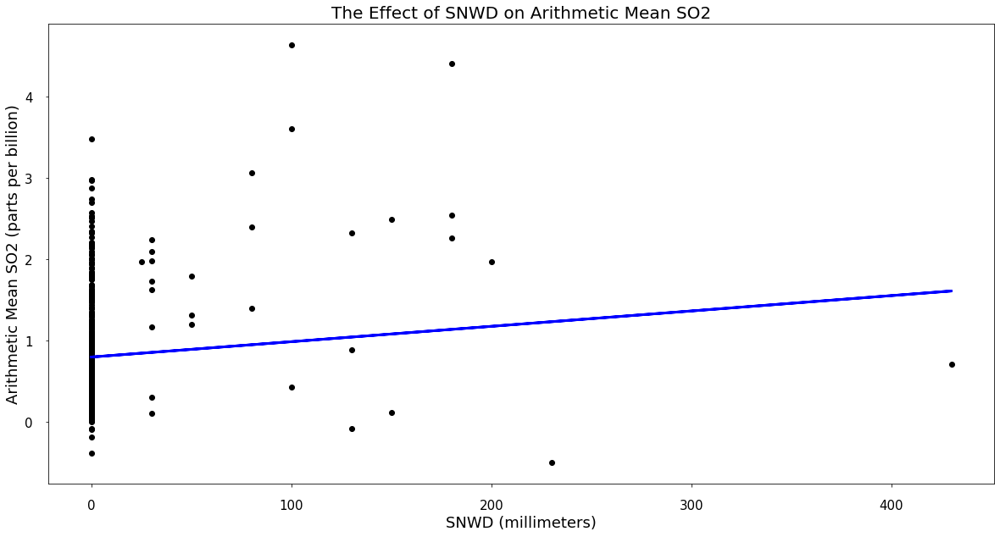

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00188845 -0.00116794 -0.04019816  0.06835405 -0.05463262]


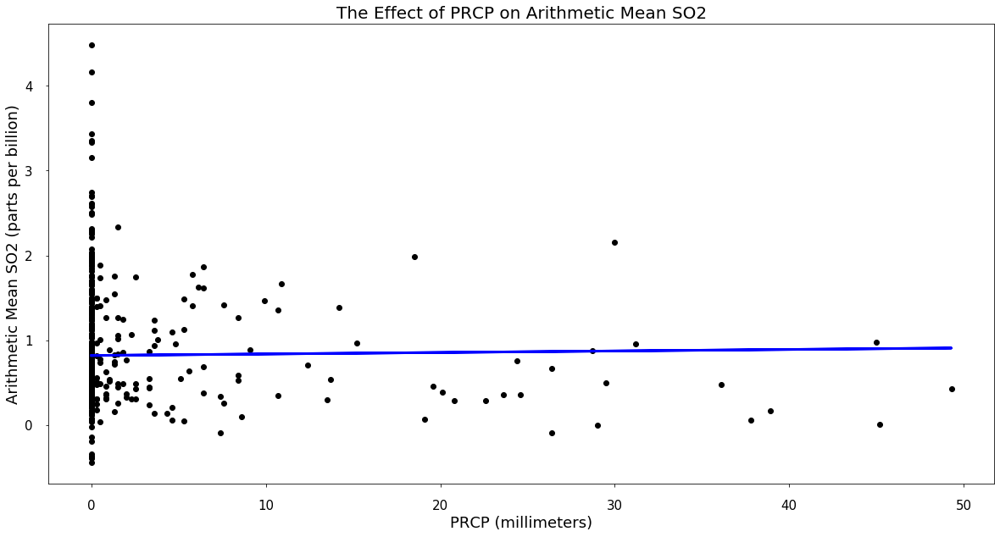

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00177488  0.00171769 -0.04410097  0.06948488 -0.05150567]


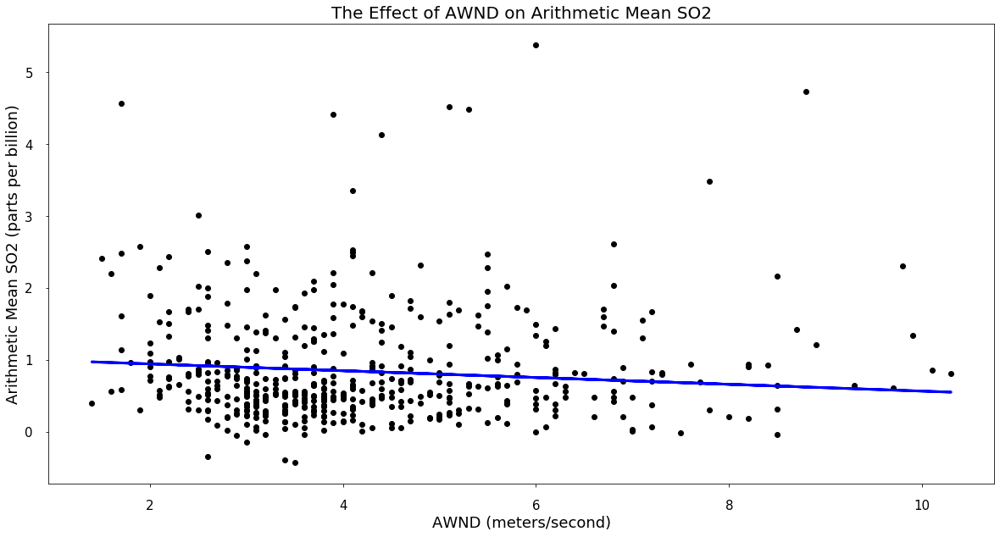

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.04728392 -0.01827352  0.0535046  -0.06566173]


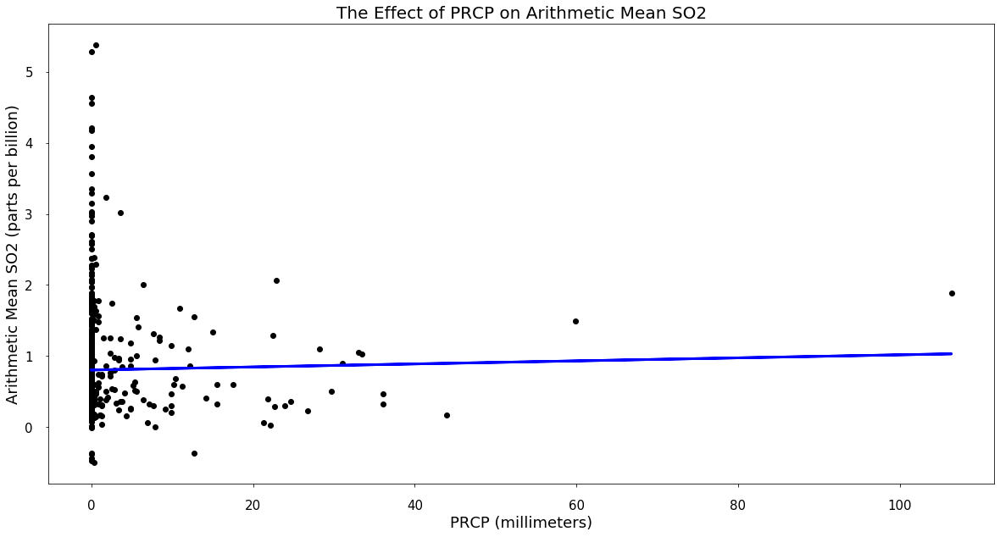

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00213468 -0.04619051  0.0002386  -0.0223754   0.05550839 -0.06402604]


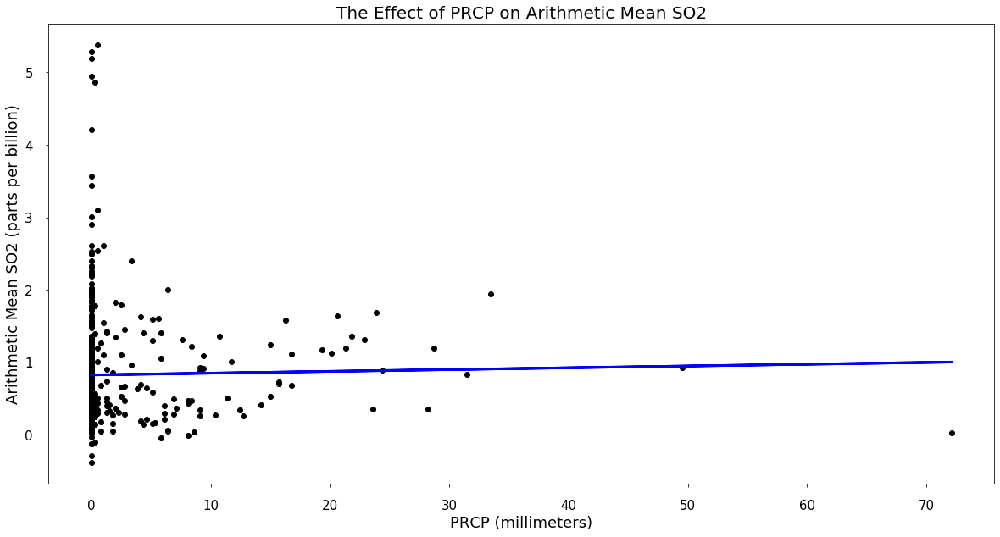

Explained Variance 0.21
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00246531 -0.0467876  -0.02293683  0.05943087 -0.06670342]


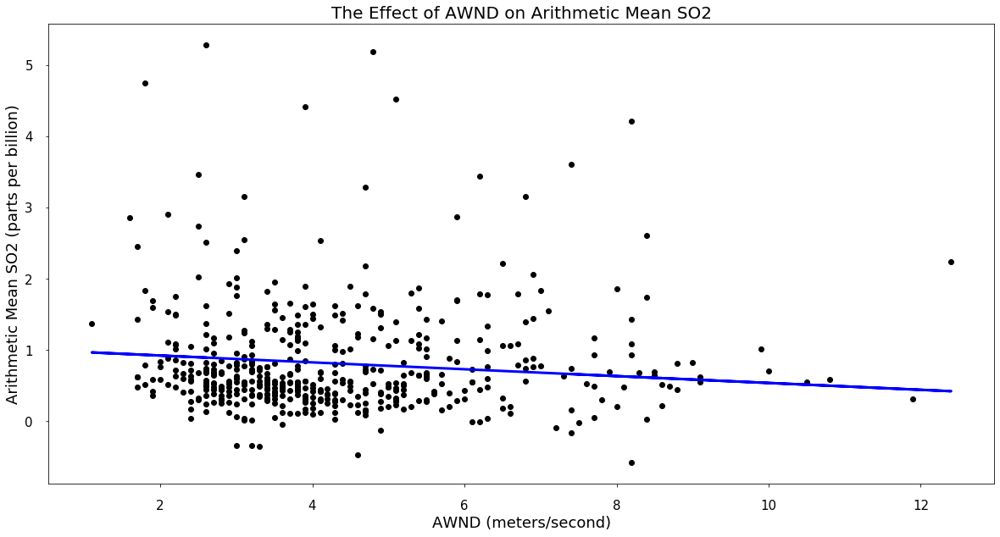

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-0.0481211   0.00095376  0.04535104 -0.07488048]


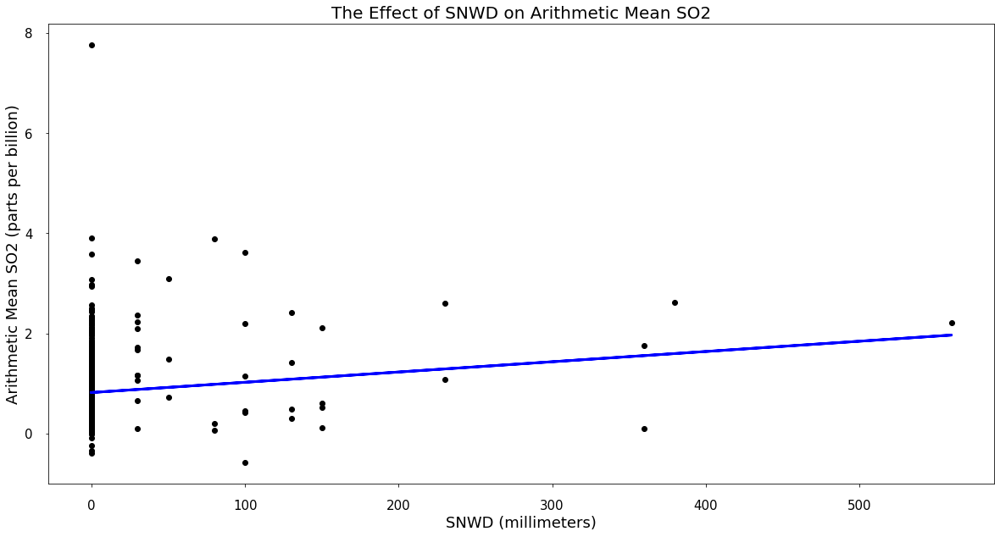

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.0020469  -0.0375823   0.06407624 -0.05243036]


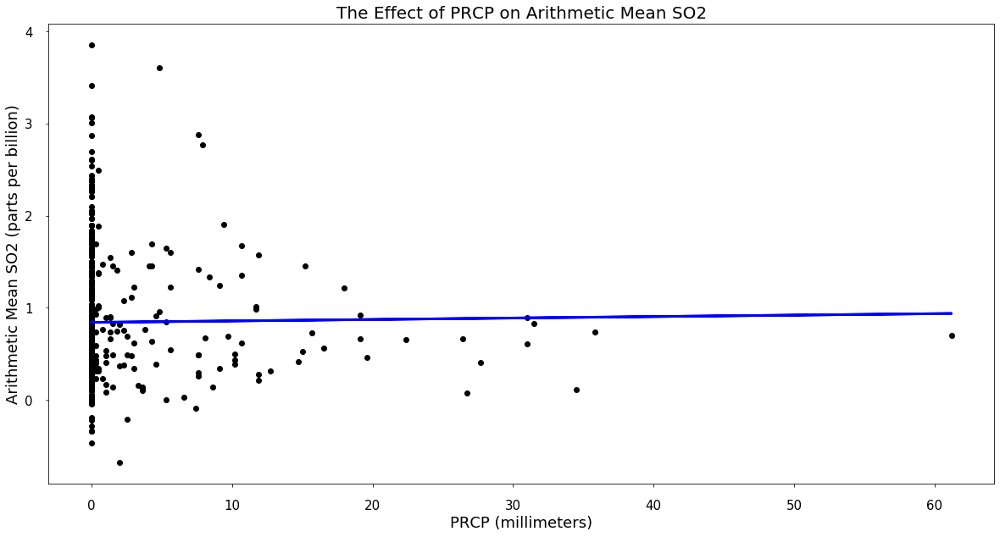

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00157726  0.00161805 -0.00100167 -0.0408997   0.07021706 -0.05654453]


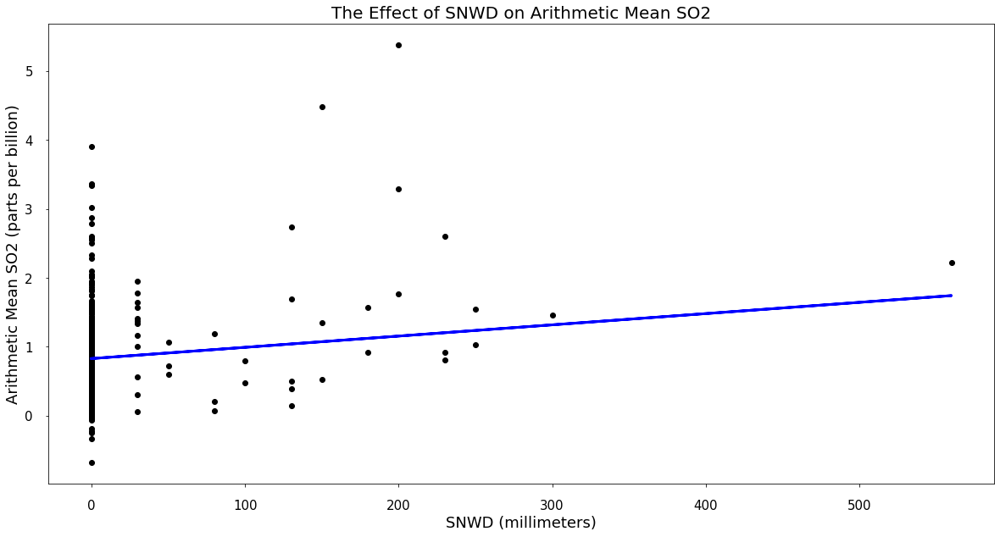

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.00163045  0.05119158 -0.07765364]


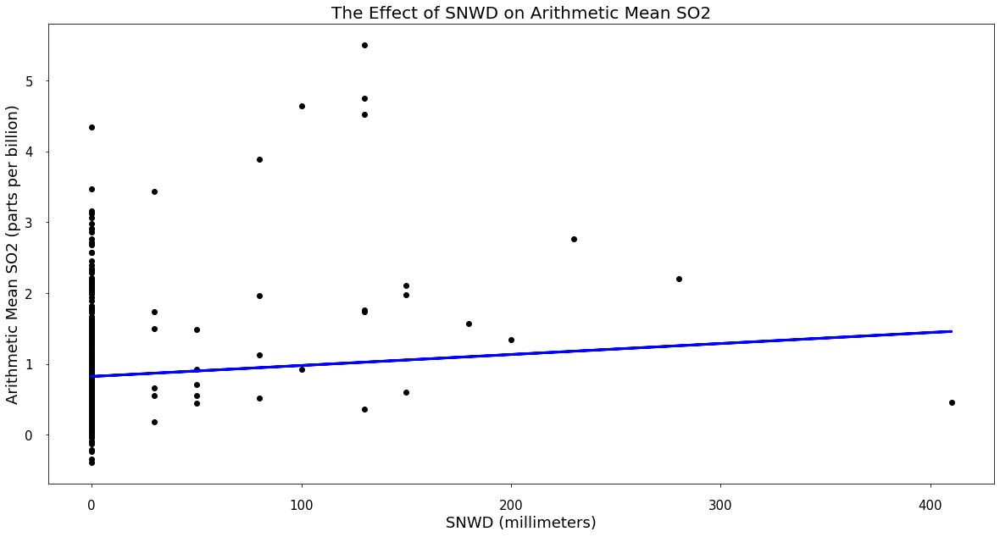

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.0015501  -0.00074094  0.04847323 -0.07453299]


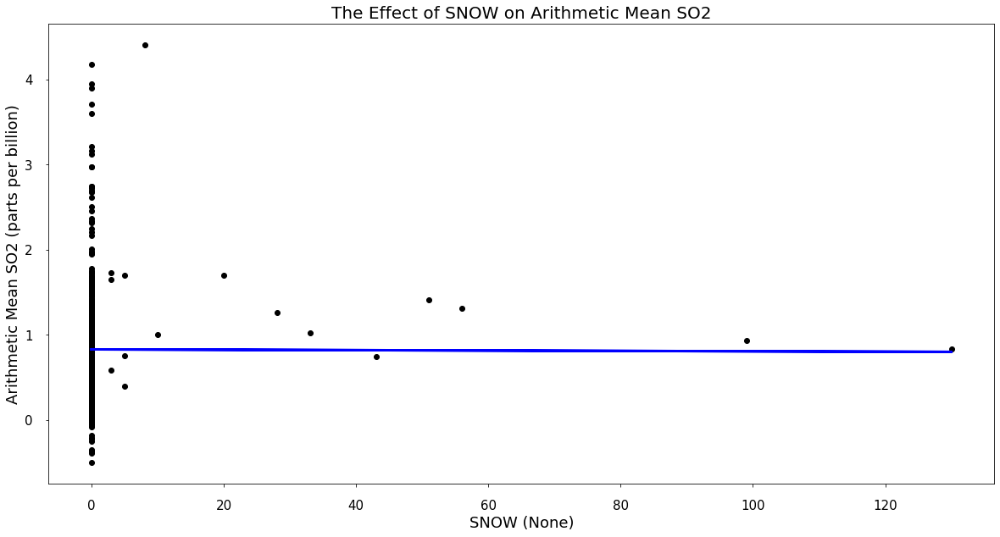

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.00022739 -0.03384035  0.06654783 -0.06199893]


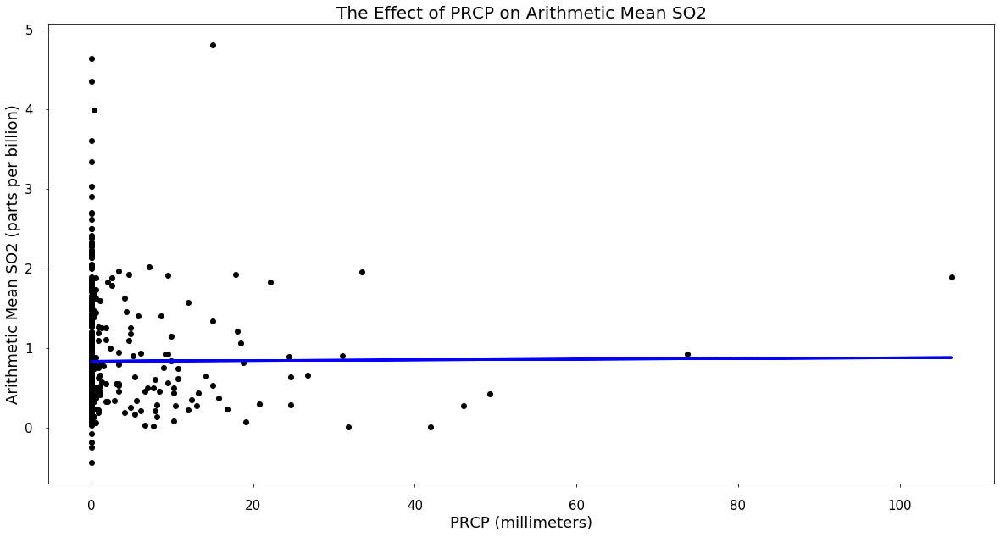

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.00043333  0.00196643  0.05064804 -0.07553215]


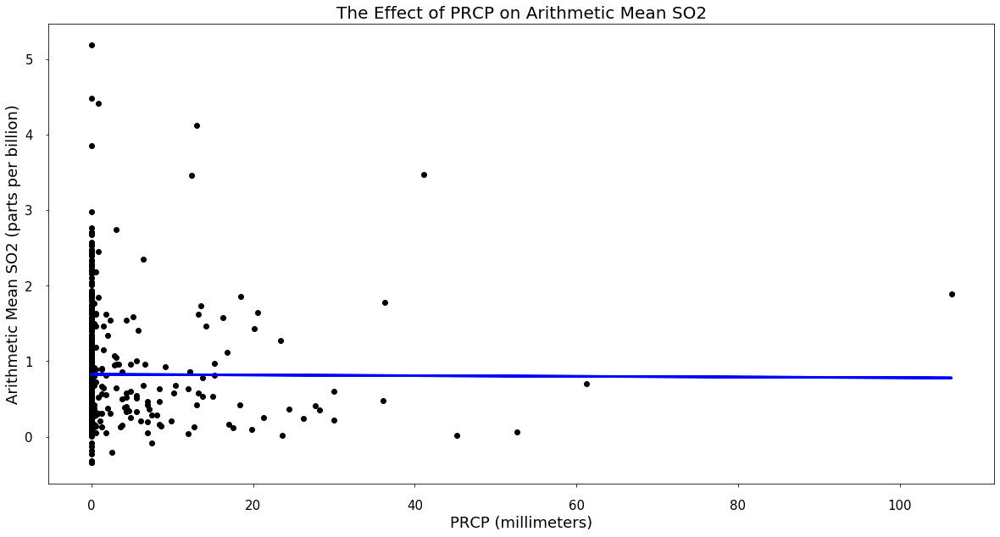

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-0.00044512  0.00165503 -0.00063927  0.04839085 -0.07425708]


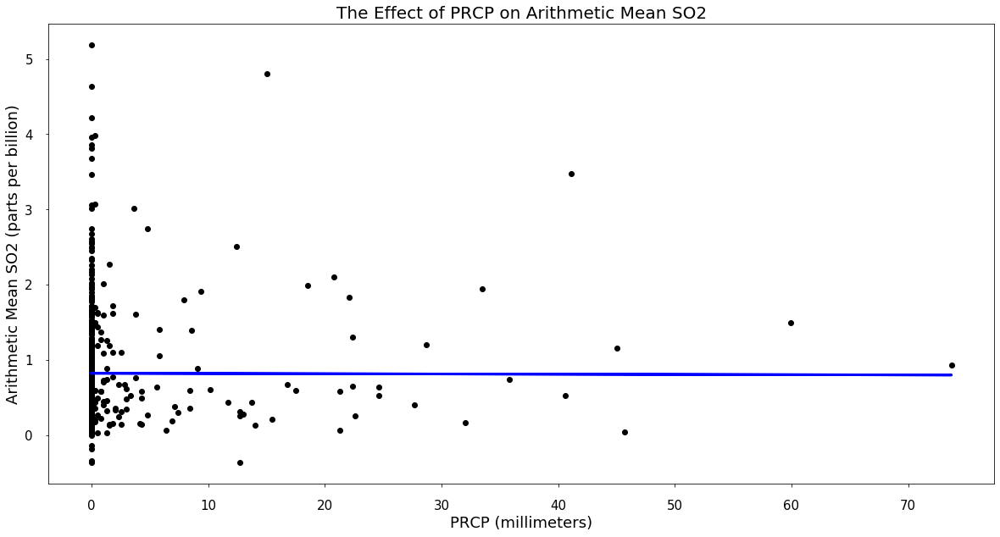

Explained Variance 0.20
Correlation Coefficient 0.45
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMAX', 'TMIN']
Coefficients [-0.00031119  0.04874282 -0.07699278]


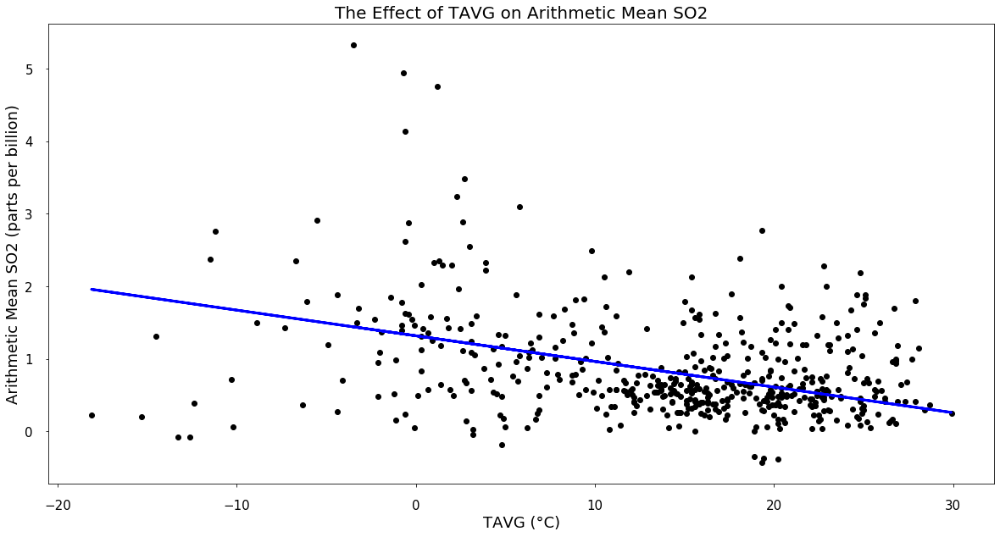

Explained Variance 0.20
Correlation Coefficient 0.44
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMAX', 'TMIN']
Coefficients [-0.03534121  0.06704539 -0.06090757]


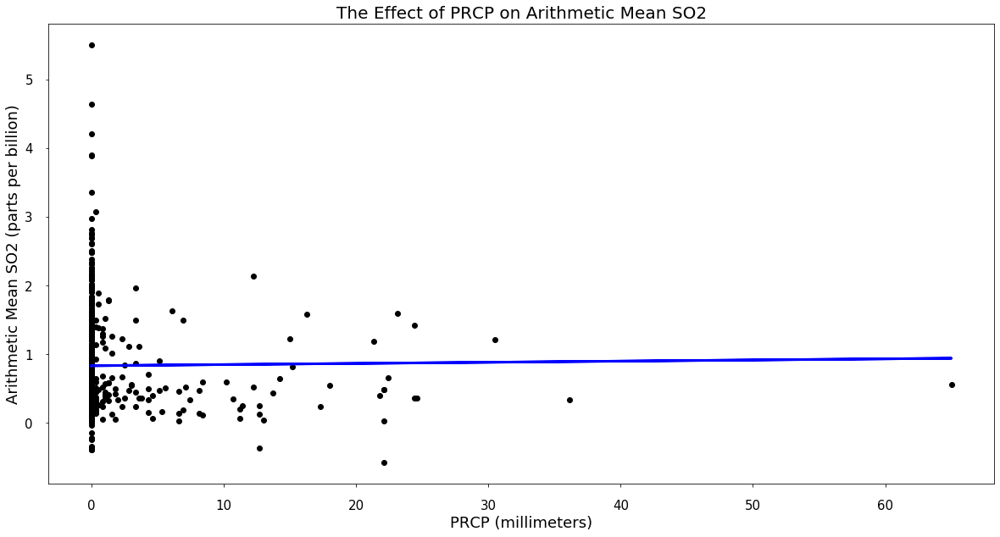

Explained Variance 0.20
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00166856 -0.03755284  0.06705176 -0.057659  ]


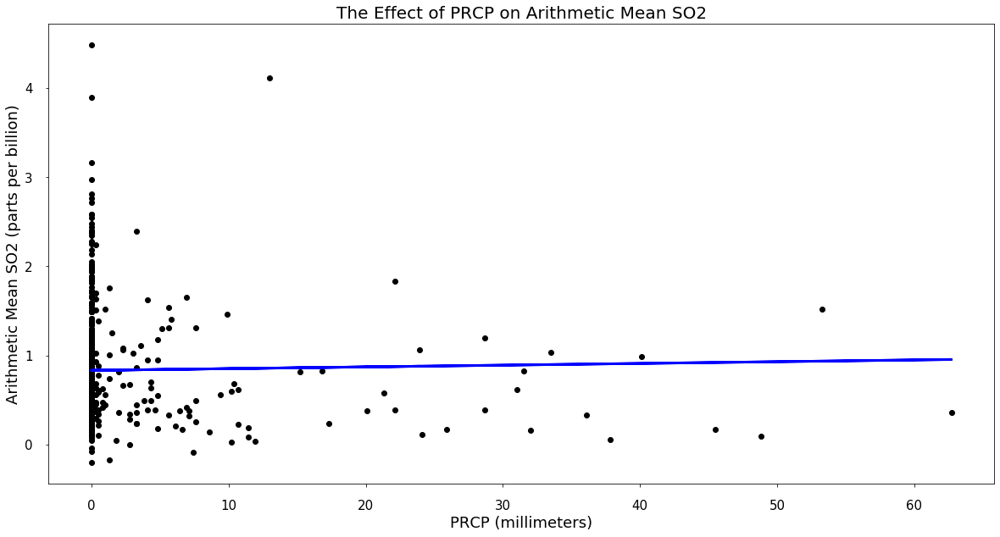

Explained Variance 0.20
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00194776 -0.00041503 -0.04199134  0.07148802 -0.05915717]


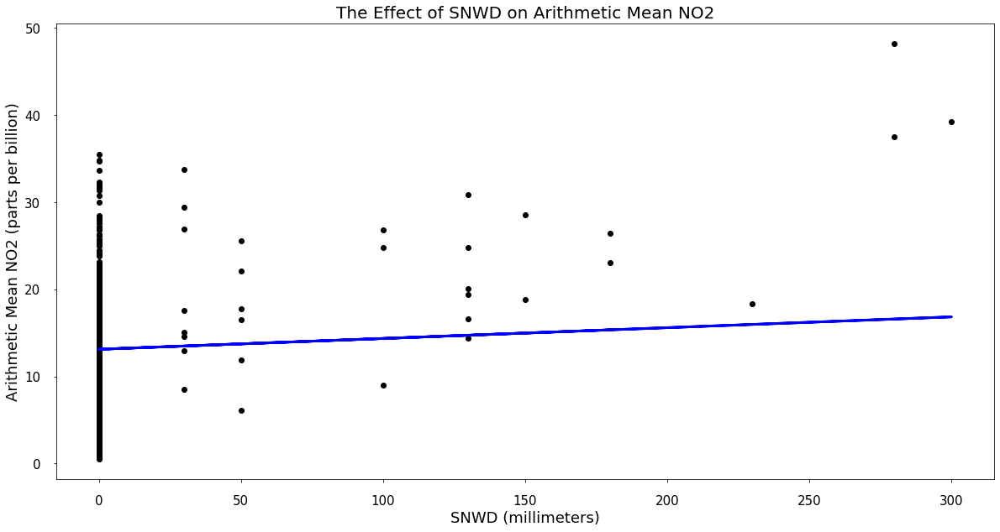

Explained Variance 0.20
Correlation Coefficient 0.44
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMIN']
Coefficients [ 0.012399   -0.01794145 -0.35512592]


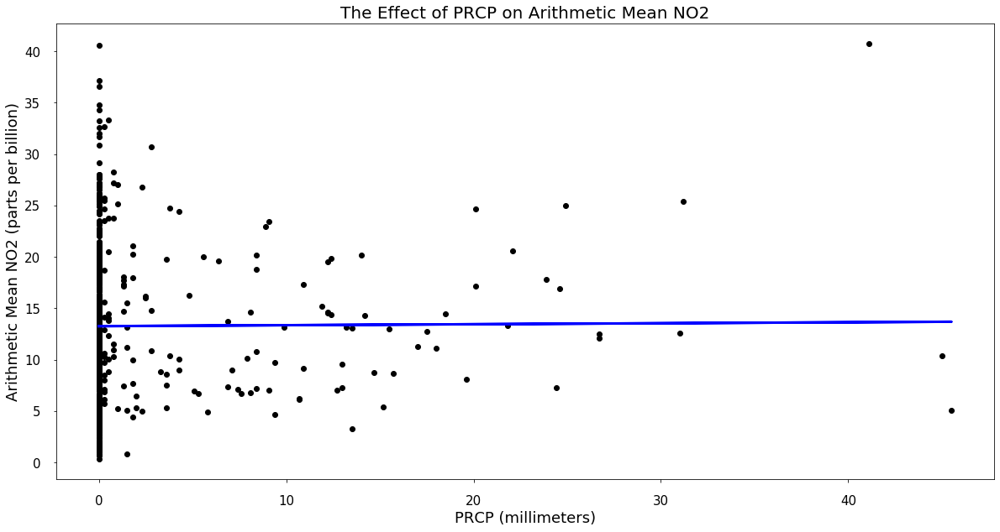

Explained Variance 0.20
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMIN']
Coefficients [ 0.00948979  0.01136991 -0.37097906]


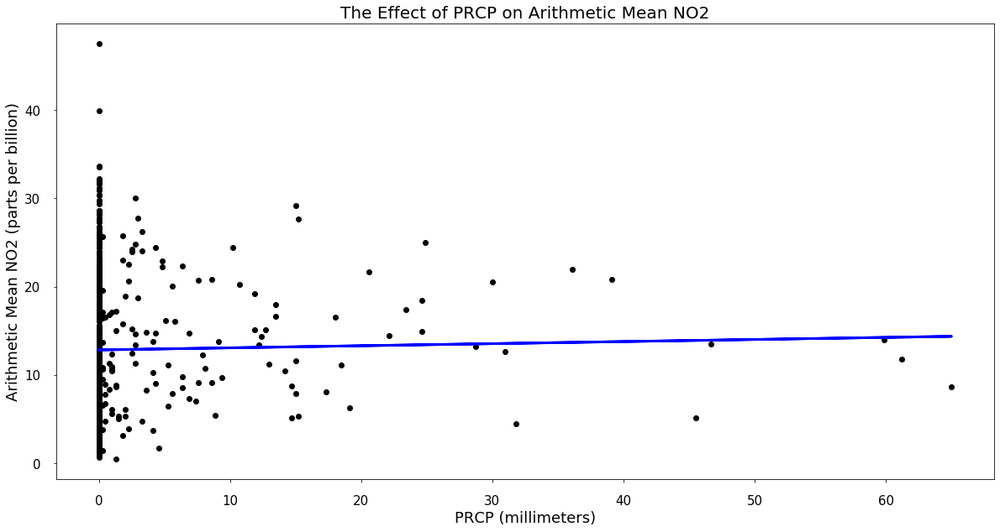

Explained Variance 0.20
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMIN']
Coefficients [ 0.02362978  0.01579456 -0.02111675 -0.36228588]


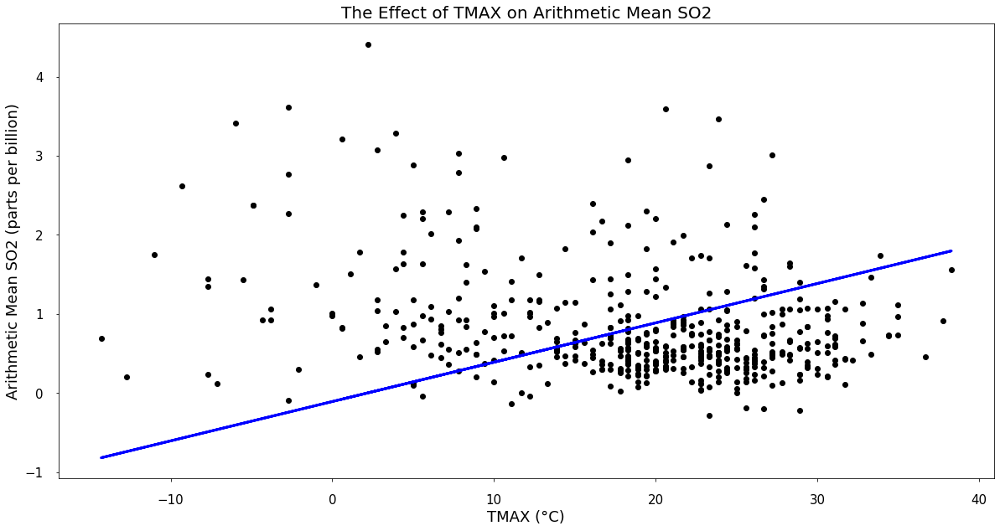

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display TMAX
All Features In Model ['TMAX', 'TMIN']
Coefficients [ 0.04970577 -0.07754196]


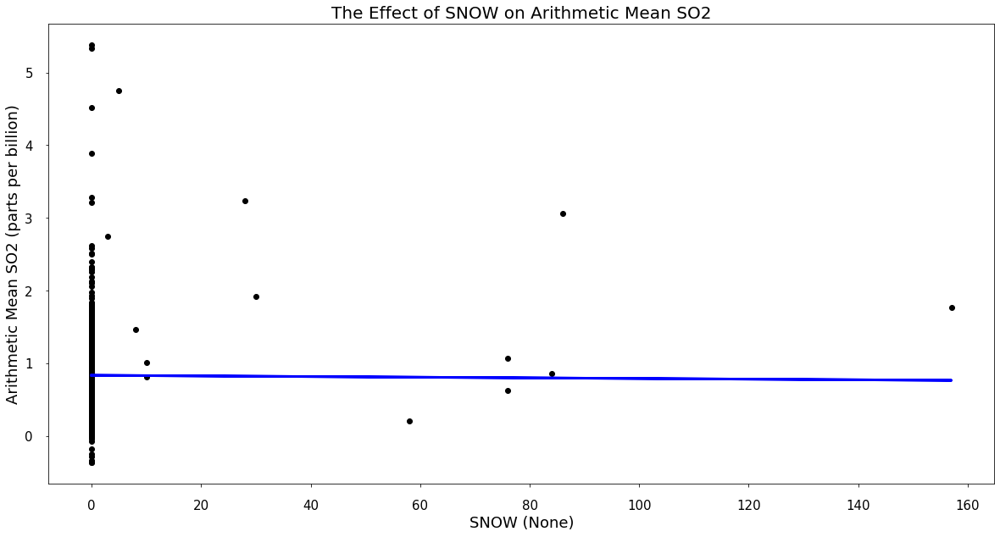

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMAX', 'TMIN']
Coefficients [-0.00044154  0.05003964 -0.07793757]


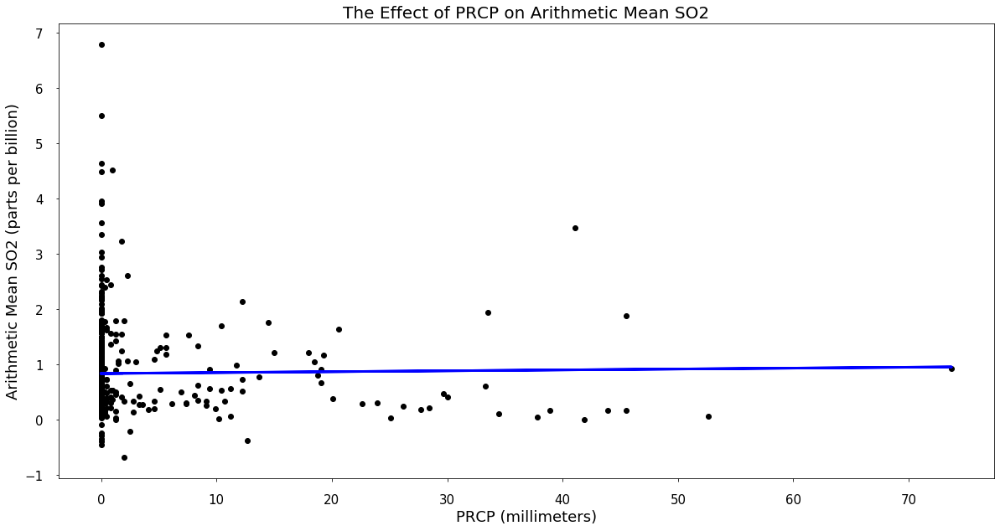

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 1.61110455e-03  5.71944112e-05  5.19449882e-02 -7.90945966e-02]


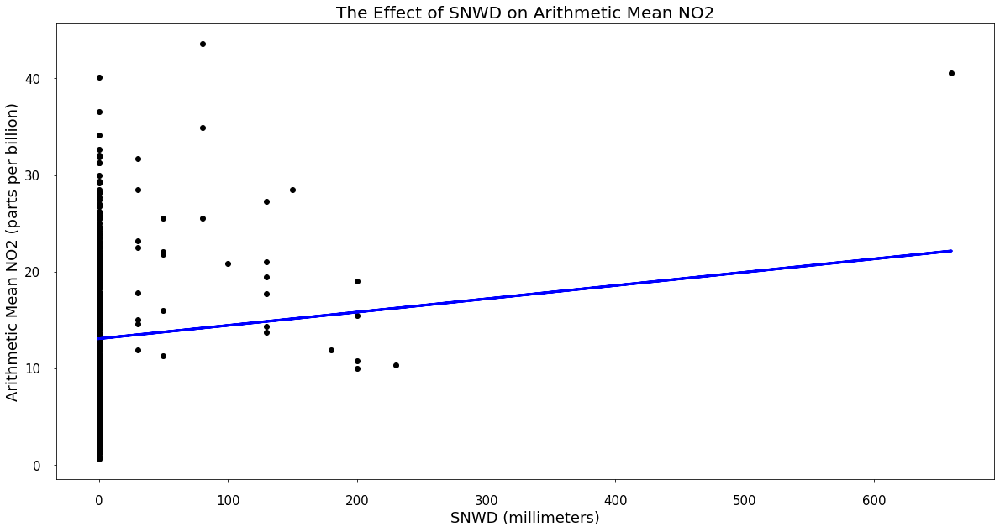

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMIN']
Coefficients [ 0.01375619 -0.35108637]


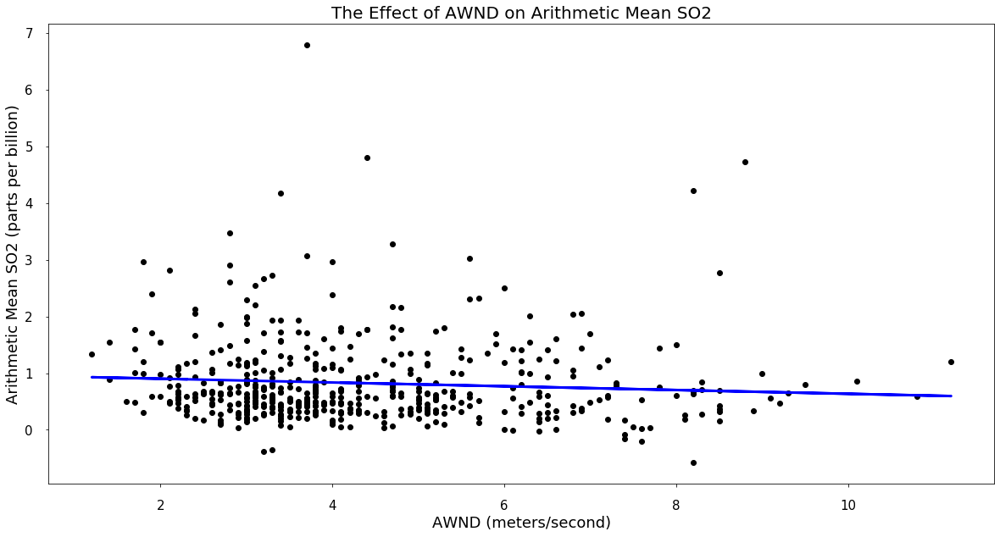

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [-0.03321353  0.00182561 -0.11242745  0.08490173]


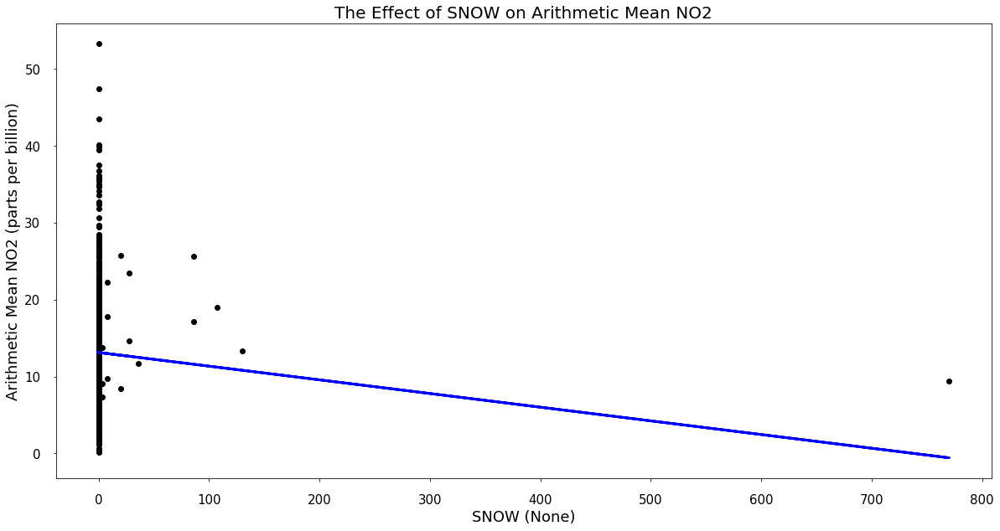

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMIN']
Coefficients [-0.01779009 -0.37991915]


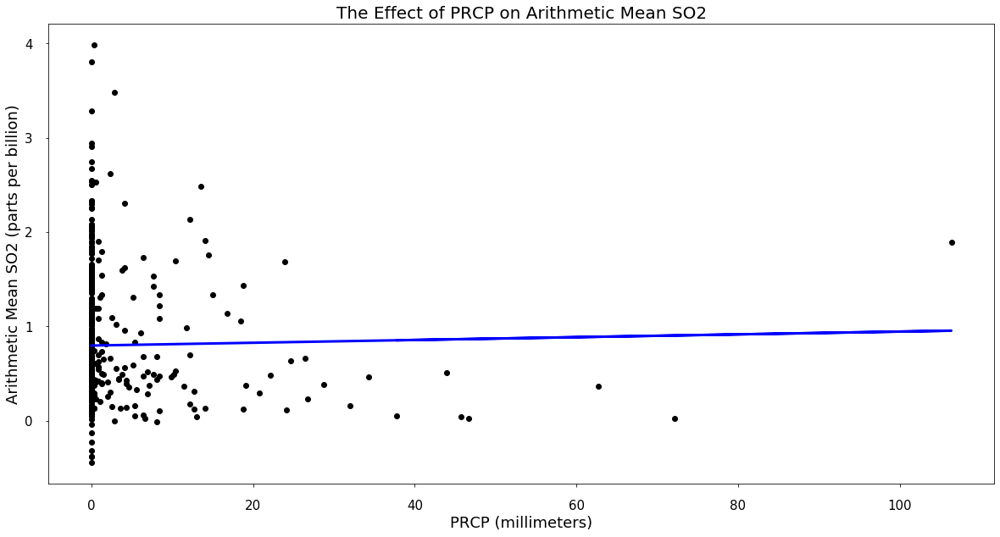

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.00148241 -0.03622291  0.00188923 -0.00051296 -0.11638867  0.08834568]


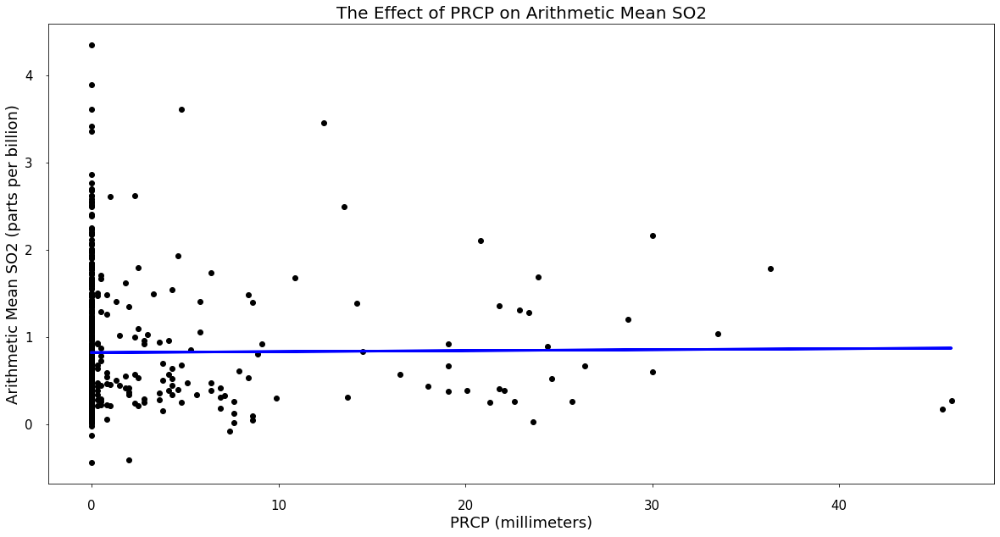

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [ 0.00110465 -0.05748068  0.00166622  0.06290464 -0.09121657]


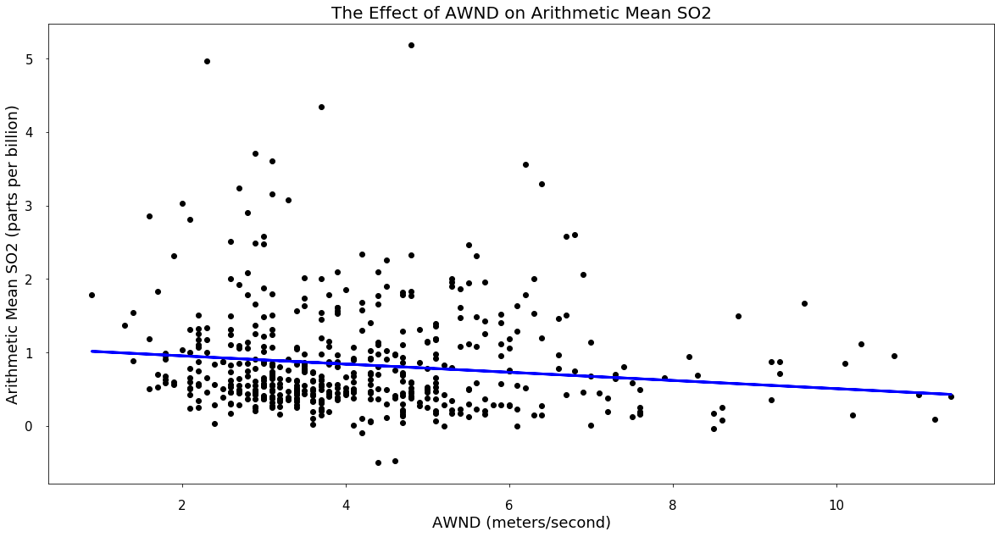

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [-0.05586668  0.0016819   0.06507176 -0.09286019]


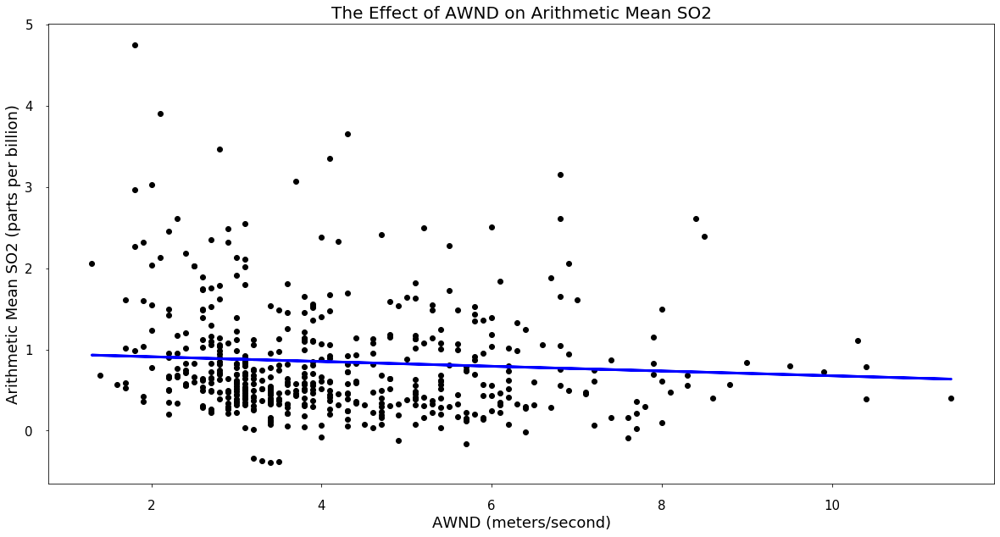

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-0.02926285  0.00195631 -0.00031465 -0.11619527  0.08819753]


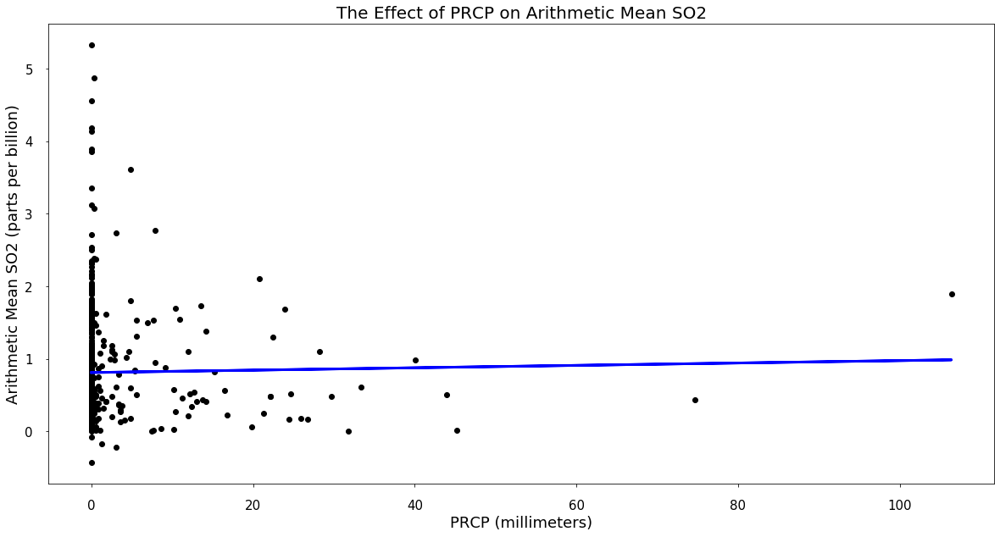

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.00164448 -0.0573491   0.00184059 -0.00077637  0.06294309 -0.0904414 ]


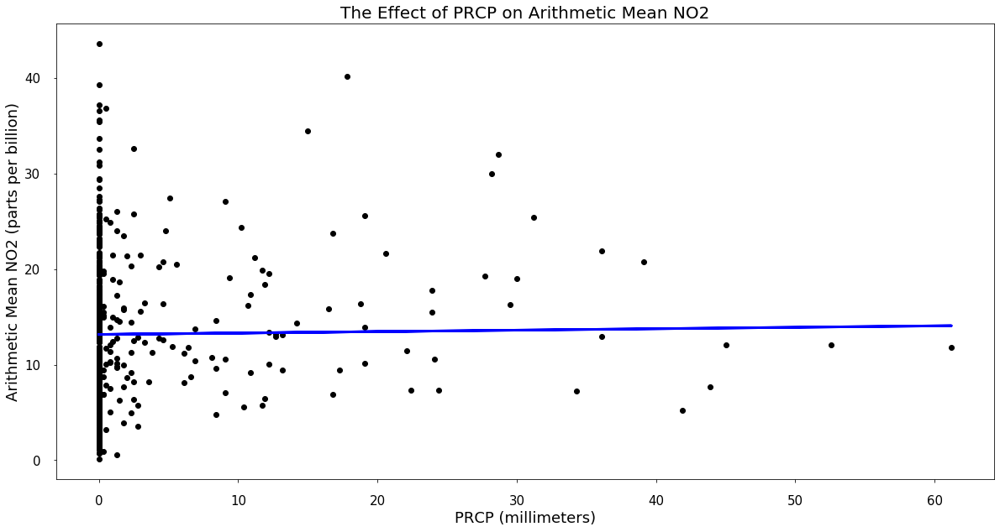

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMIN']
Coefficients [ 0.01499266 -0.01851324 -0.37917669]


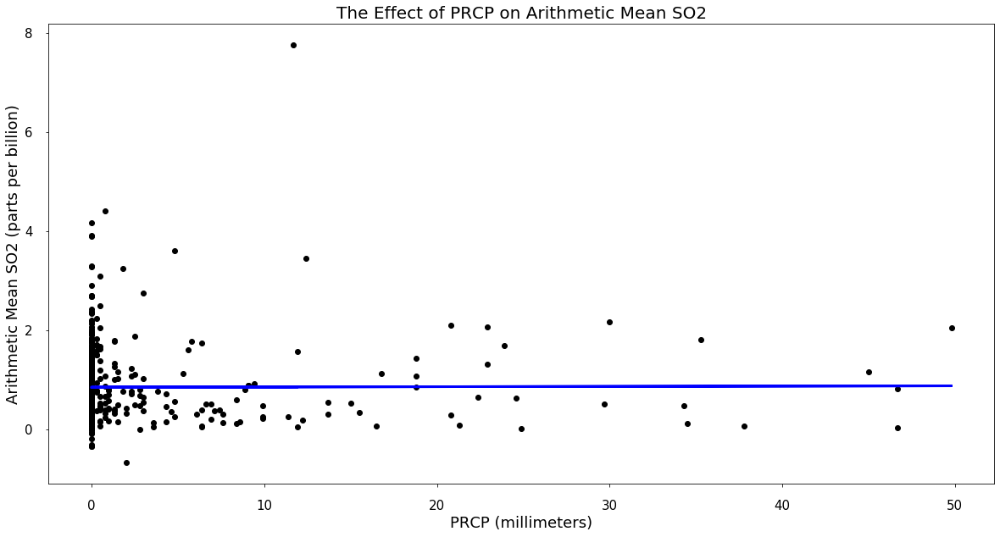

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [ 0.00058111 -0.03672249  0.00193796 -0.11209551  0.08422931]


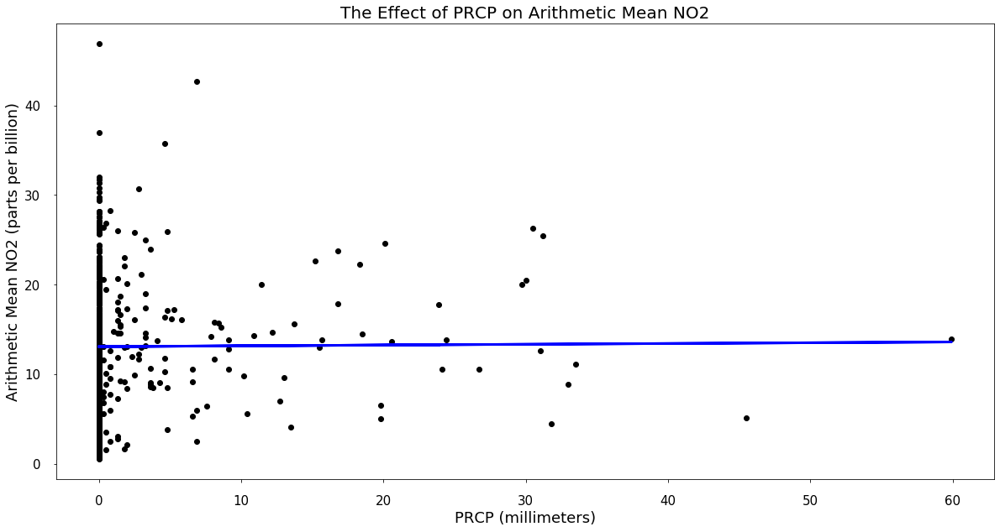

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMIN']
Coefficients [ 0.00869511 -0.37947578]


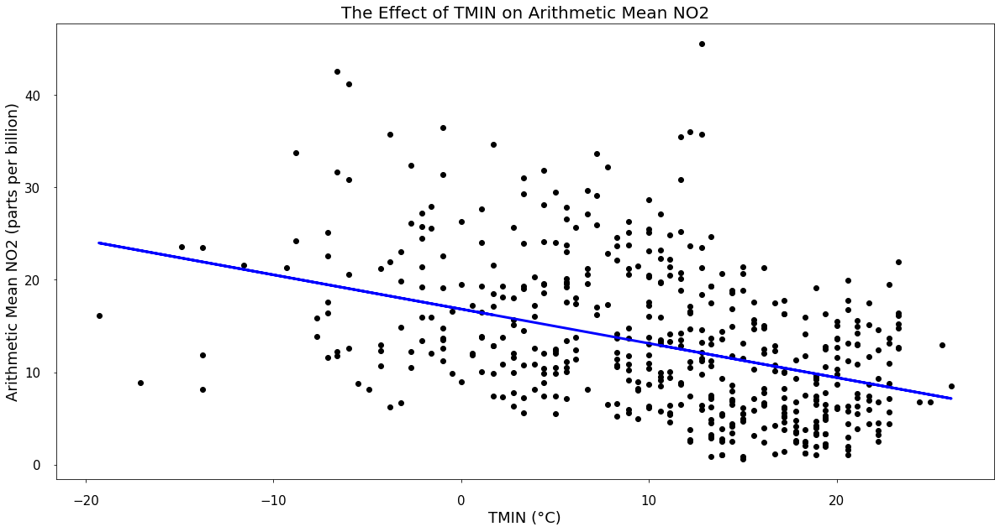

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display TMIN
All Features In Model ['TMIN']
Coefficients [-0.37093453]


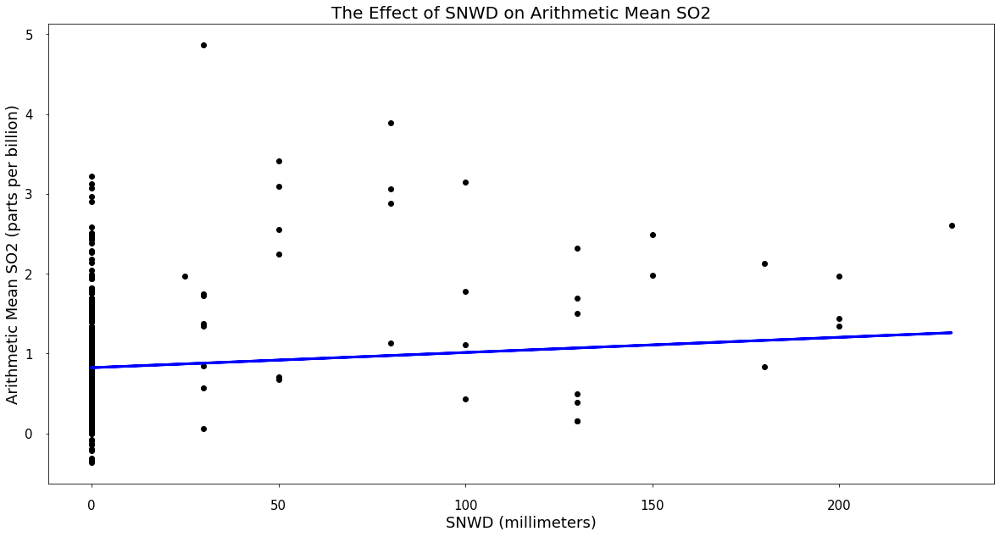

Explained Variance 0.19
Correlation Coefficient 0.44
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.00190137 -0.00053771 -0.11748535  0.09170686]


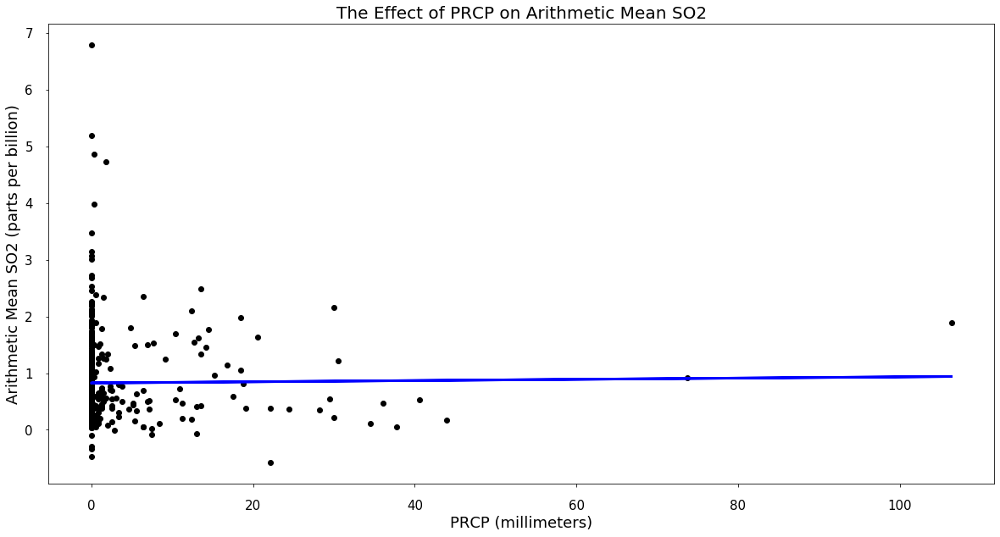

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMIN']
Coefficients [ 0.00107889 -0.06474584  0.06414474 -0.0951368 ]


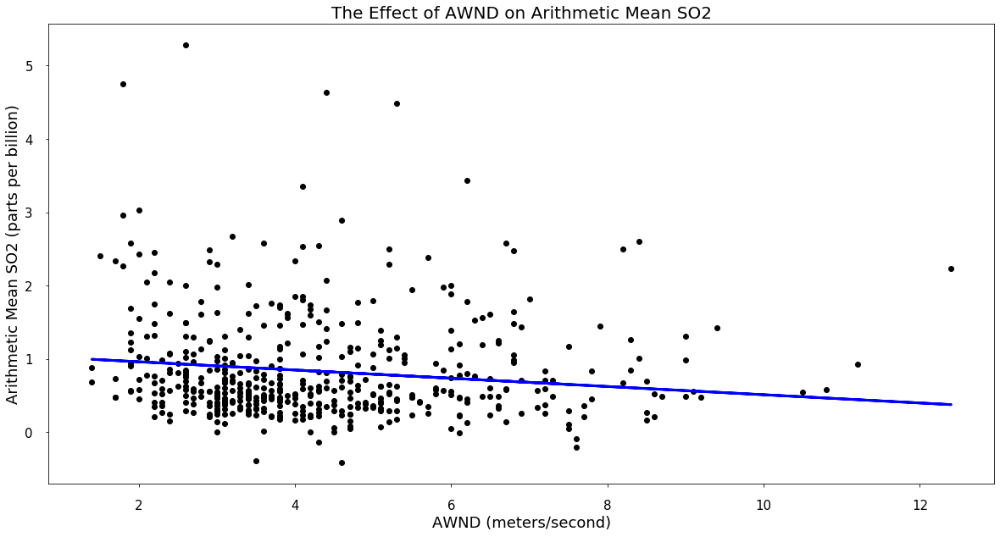

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-0.05617882  0.00151942 -0.00093648  0.06515837 -0.09261506]


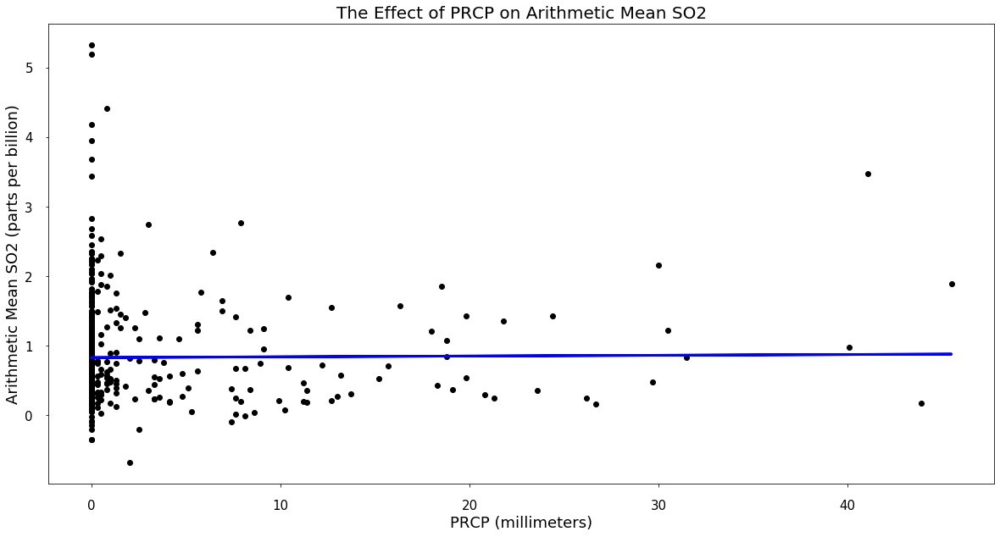

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX']
Coefficients [ 0.00109233 -0.03398153 -0.12190211  0.09096794]


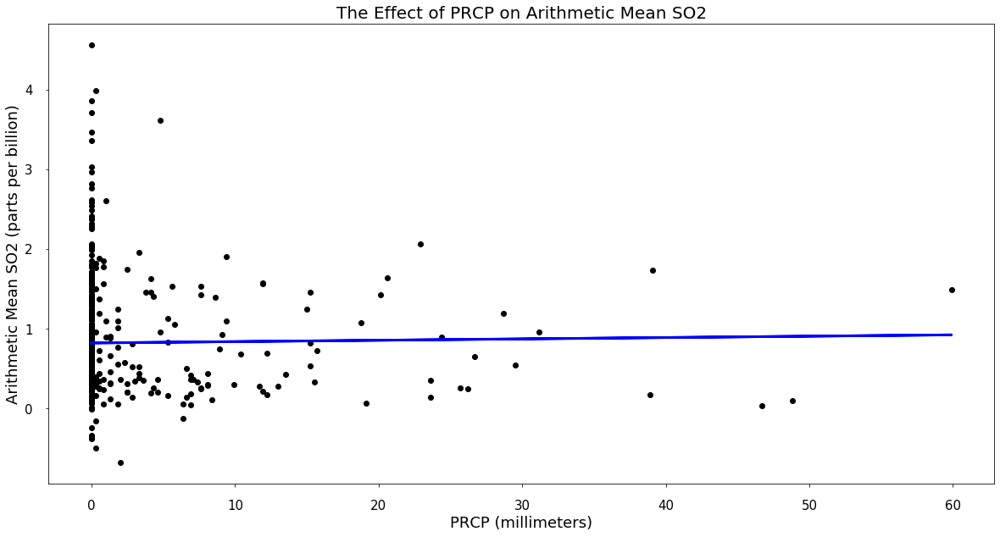

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.00169784 -0.06200136 -0.00033859  0.06058548 -0.09205866]


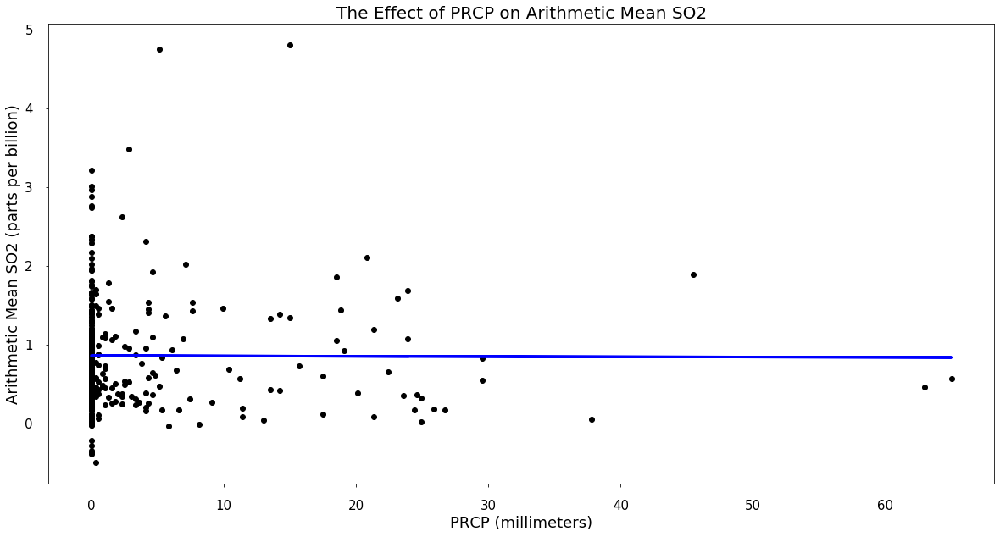

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMAX']
Coefficients [-0.00032869  0.00195237 -0.12298434  0.09615426]


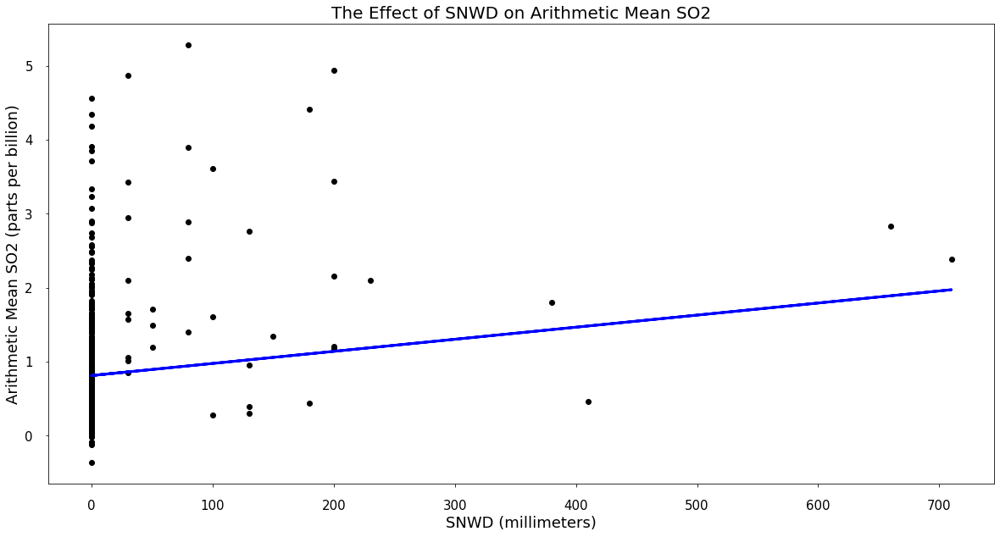

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMAX']
Coefficients [ 0.00163437 -0.11521172  0.08978771]


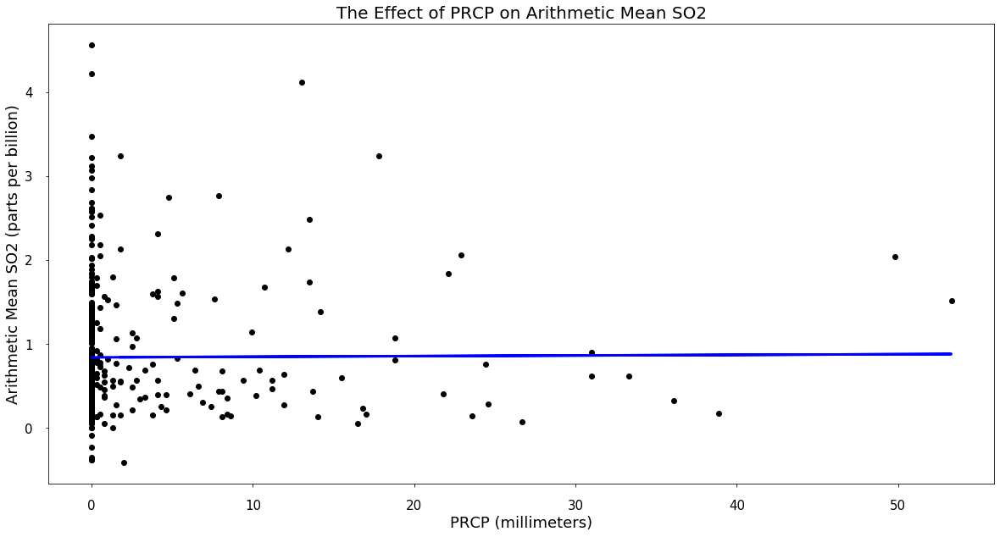

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.00074274 -0.03622936 -0.0002293  -0.11726866  0.08542102]


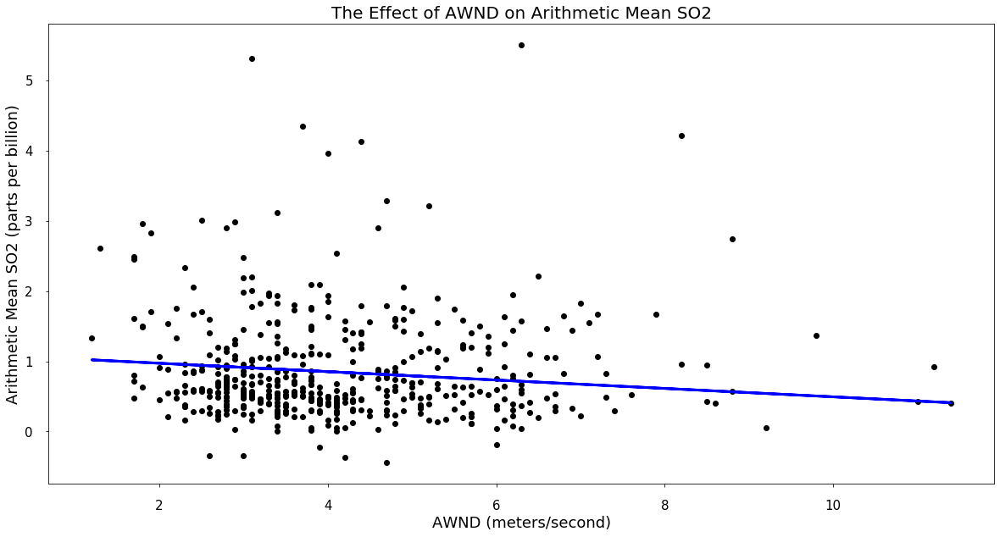

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-0.05977349 -0.00013612  0.06197414 -0.09251878]


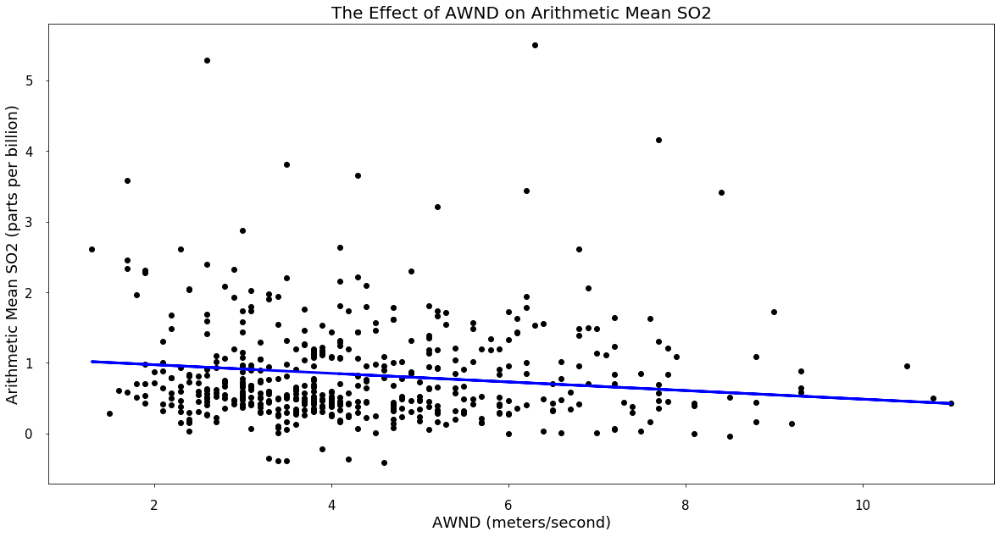

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMIN']
Coefficients [-0.06105097  0.06168472 -0.09193228]


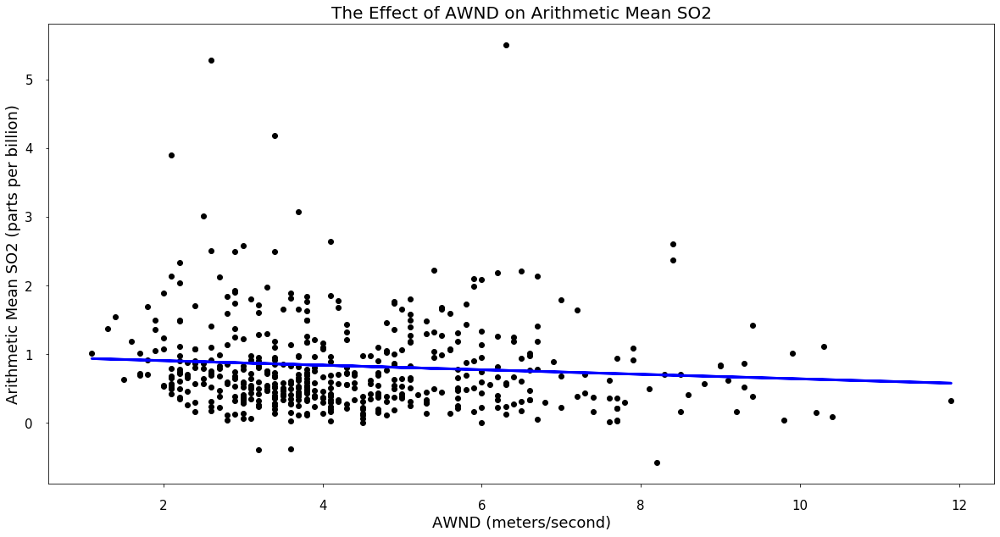

Explained Variance 0.19
Correlation Coefficient 0.43
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX']
Coefficients [-0.03315234 -0.11995311  0.08901431]


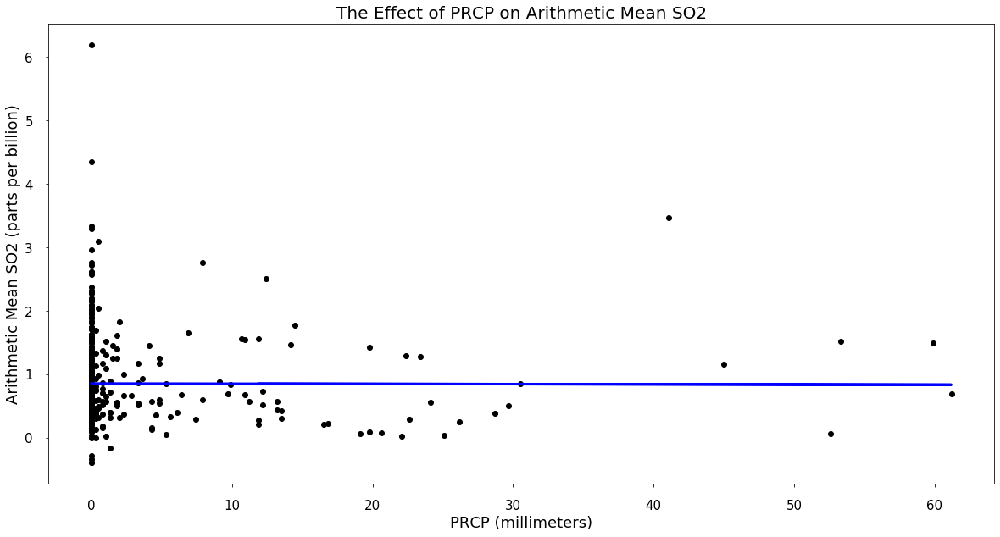

Explained Variance 0.18
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-0.00031795  0.00241884 -0.00057857 -0.11670434  0.09051668]


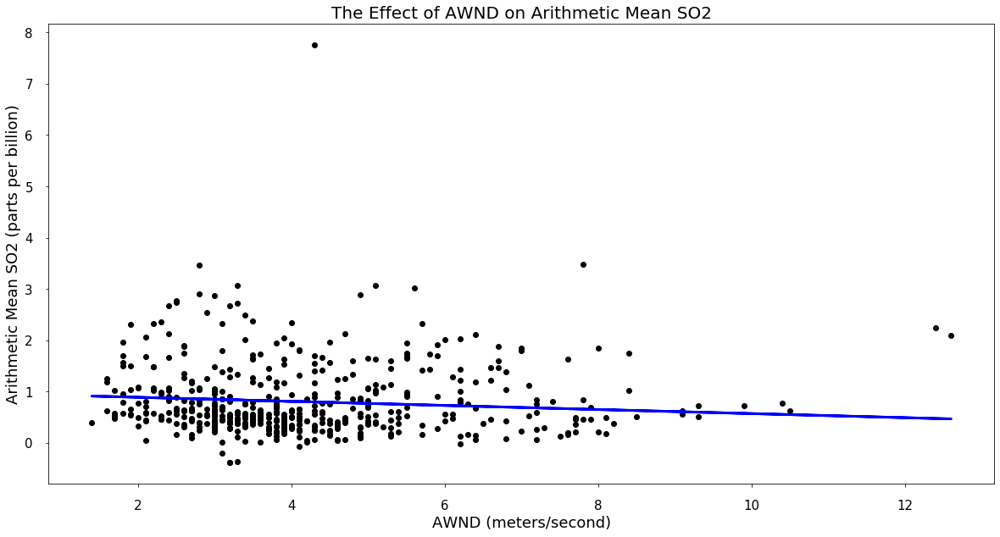

Explained Variance 0.18
Correlation Coefficient 0.43
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-0.0397462  -0.00016444 -0.11630268  0.08503195]


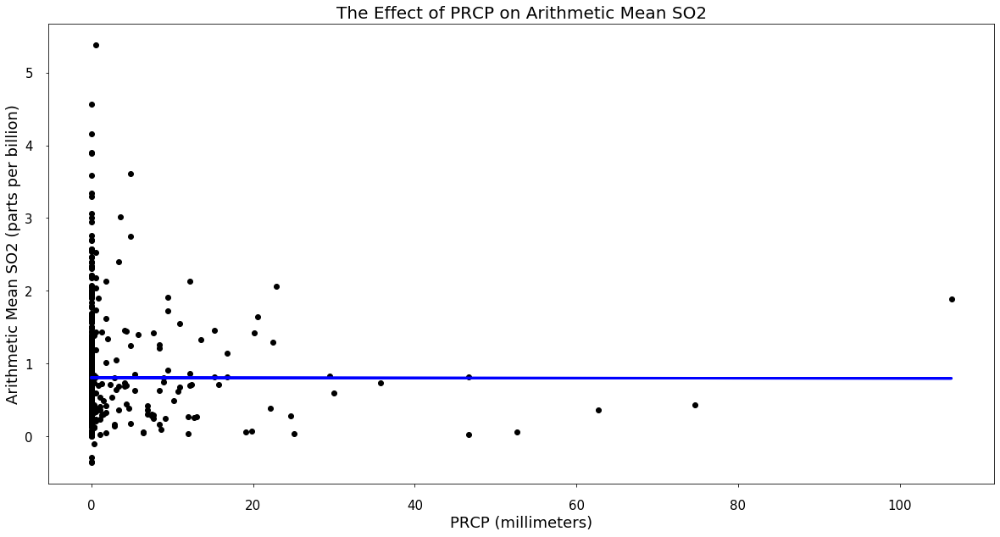

Explained Variance 0.18
Correlation Coefficient 0.43
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMAX']
Coefficients [-8.74080534e-05 -1.18137161e-01  8.97408437e-02]


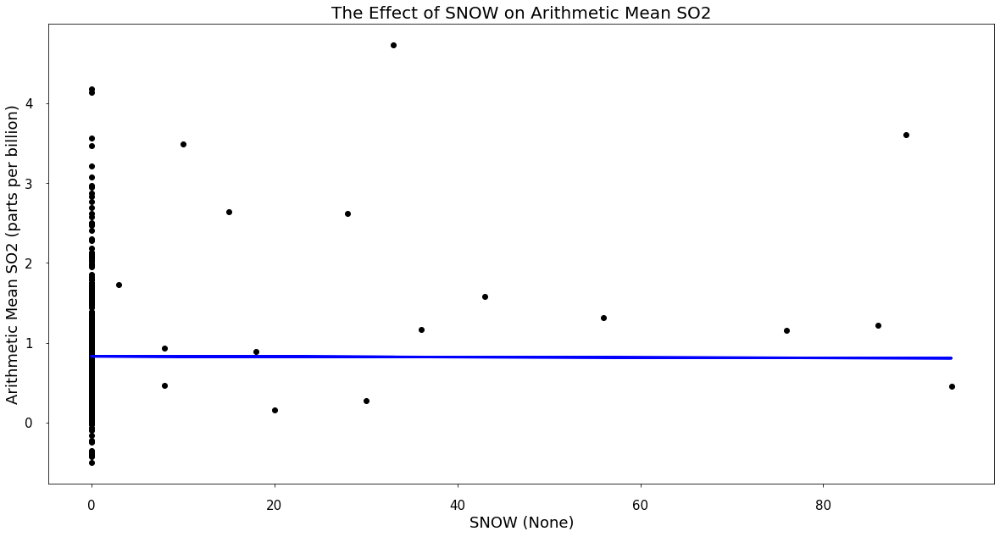

Explained Variance 0.18
Correlation Coefficient 0.42
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMAX']
Coefficients [-0.00025966 -0.12365753  0.09413974]


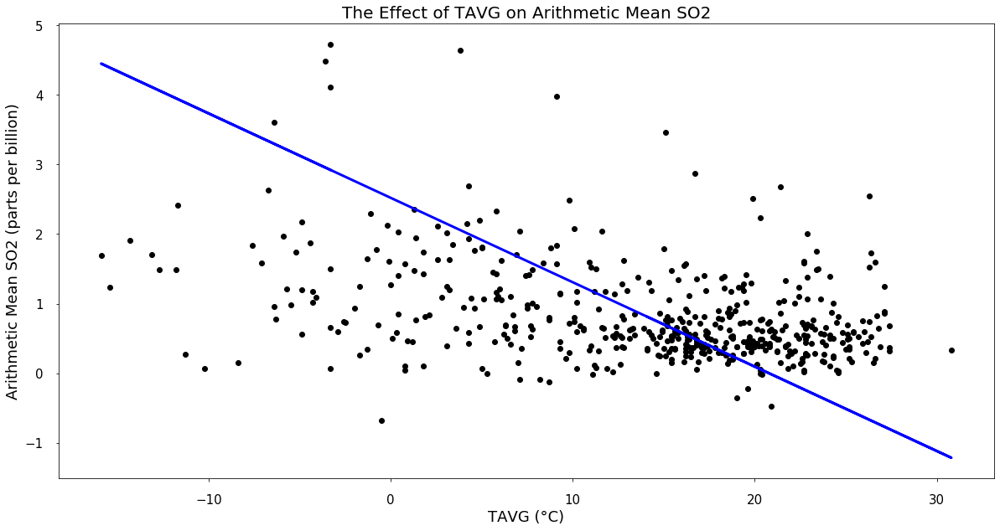

Explained Variance 0.18
Correlation Coefficient 0.42
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMAX']
Coefficients [-0.12138227  0.0922658 ]


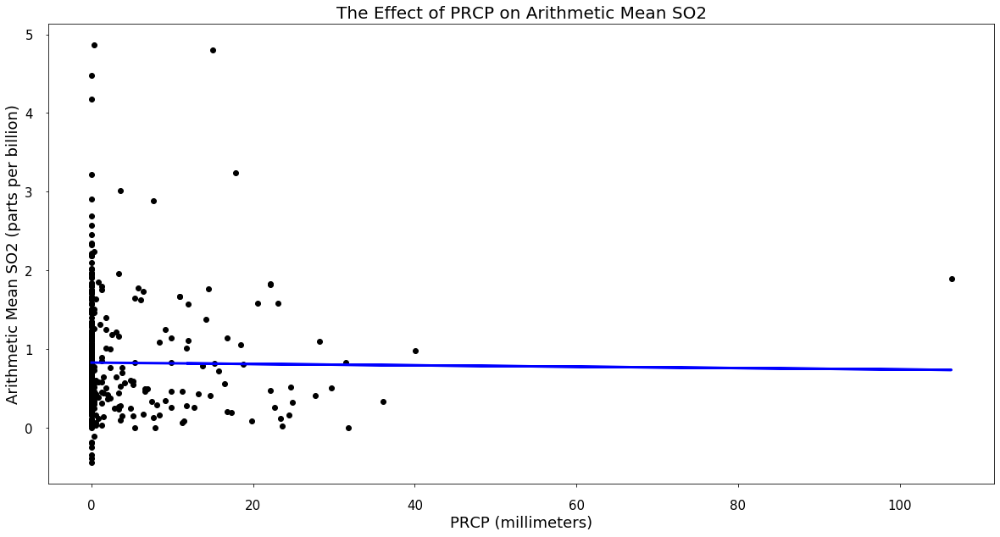

Explained Variance 0.18
Correlation Coefficient 0.42
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-0.00087111 -0.00013702 -0.12133407  0.09161176]


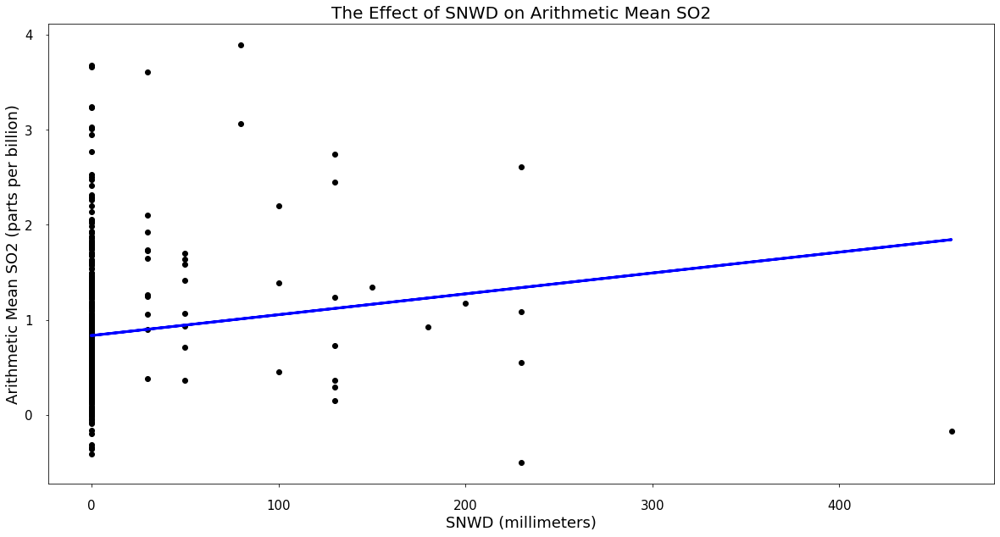

Explained Variance 0.18
Correlation Coefficient 0.42
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG', 'TMIN']
Coefficients [ 0.00219237  0.06851857 -0.09263778]


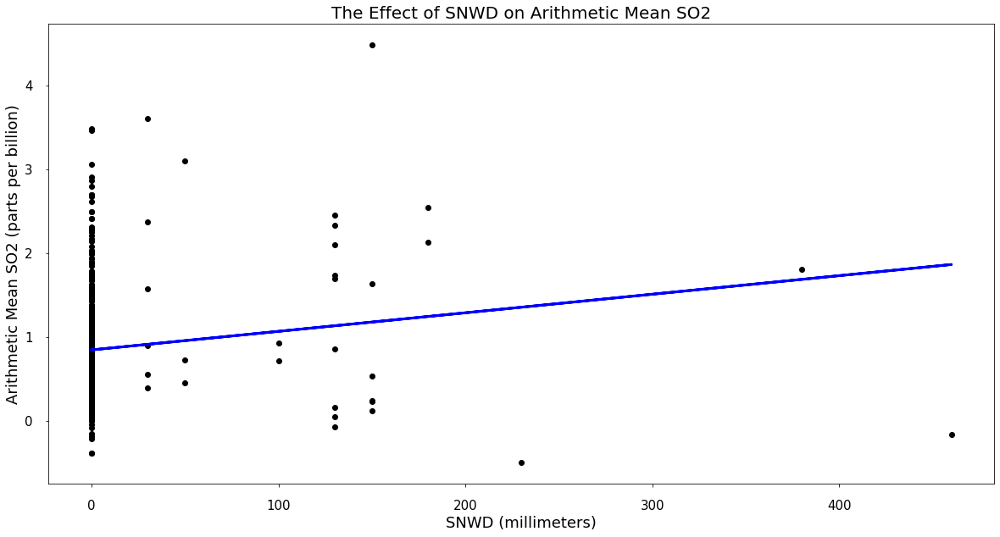

Explained Variance 0.18
Correlation Coefficient 0.42
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.00221487 -0.00124898  0.0643614  -0.09002227]


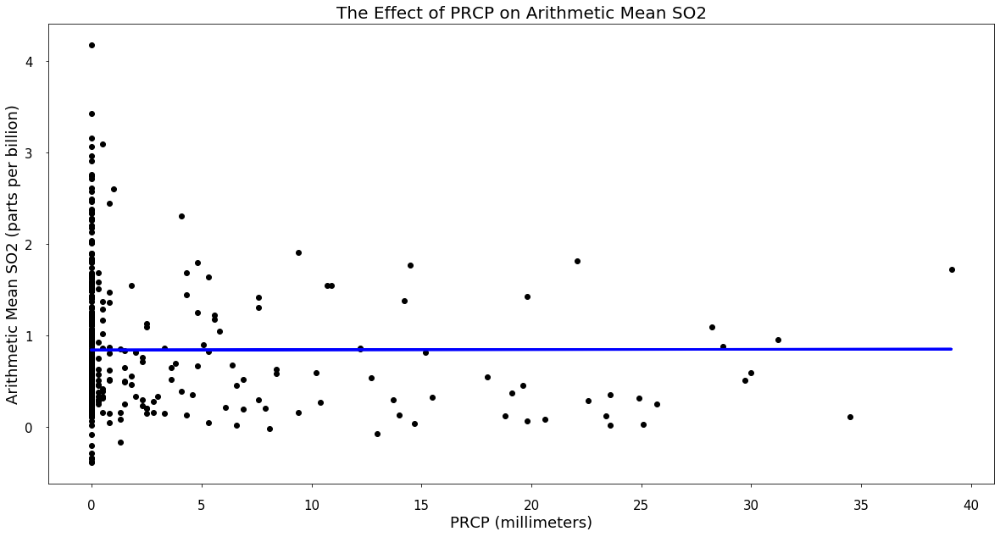

Explained Variance 0.17
Correlation Coefficient 0.42
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.00023315  0.00225463 -0.00096135  0.06508738 -0.09039566]


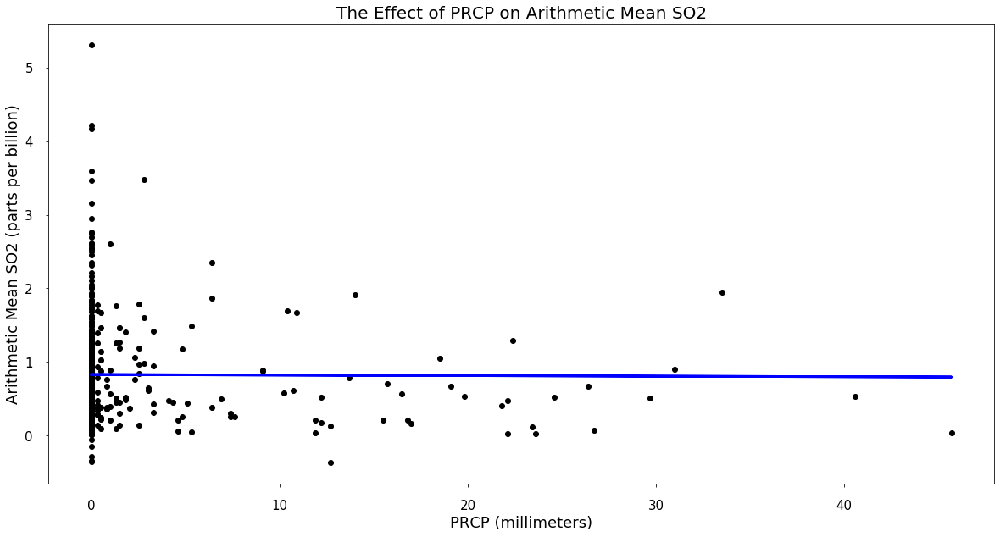

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG', 'TMIN']
Coefficients [-0.00074034  0.00182944  0.06161248 -0.08644112]


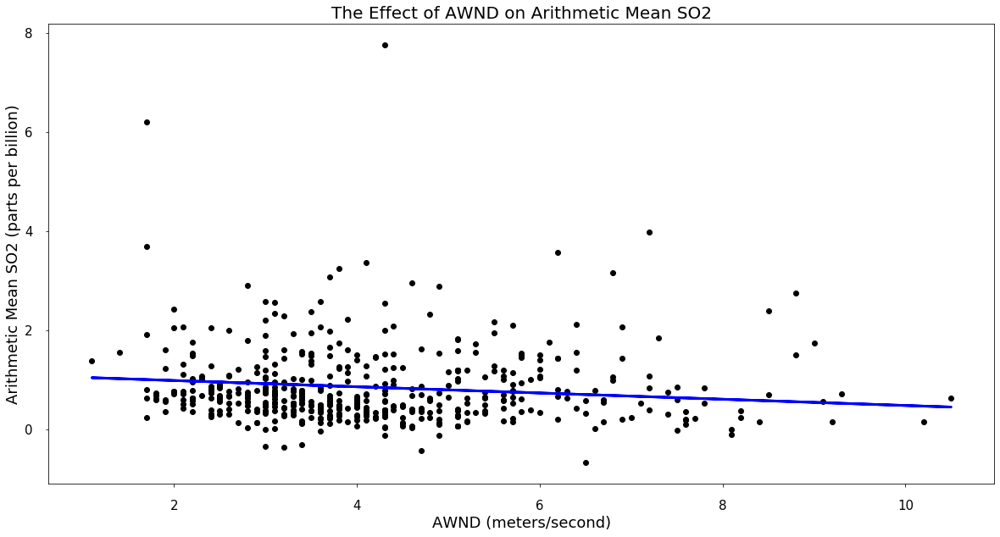

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMIN']
Coefficients [-0.06302634  0.0016103  -0.03114283]


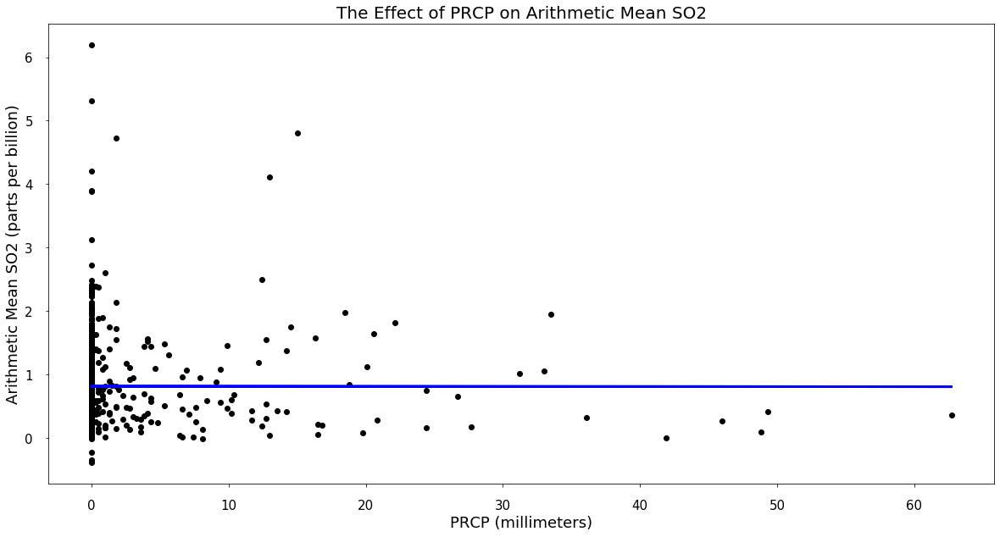

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-0.00011718 -0.00114867  0.06187691 -0.08955502]


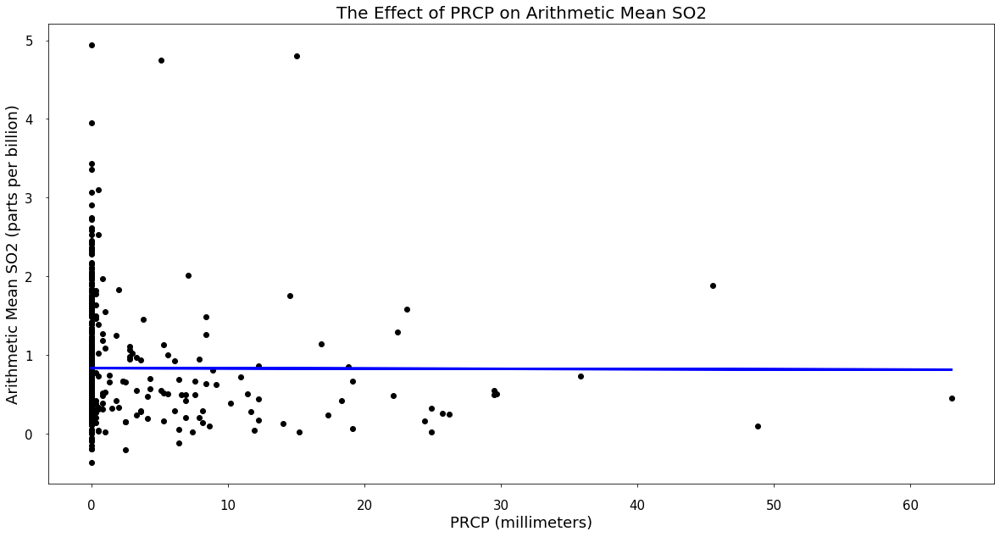

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG', 'TMIN']
Coefficients [-0.00033247  0.06323104 -0.08973114]


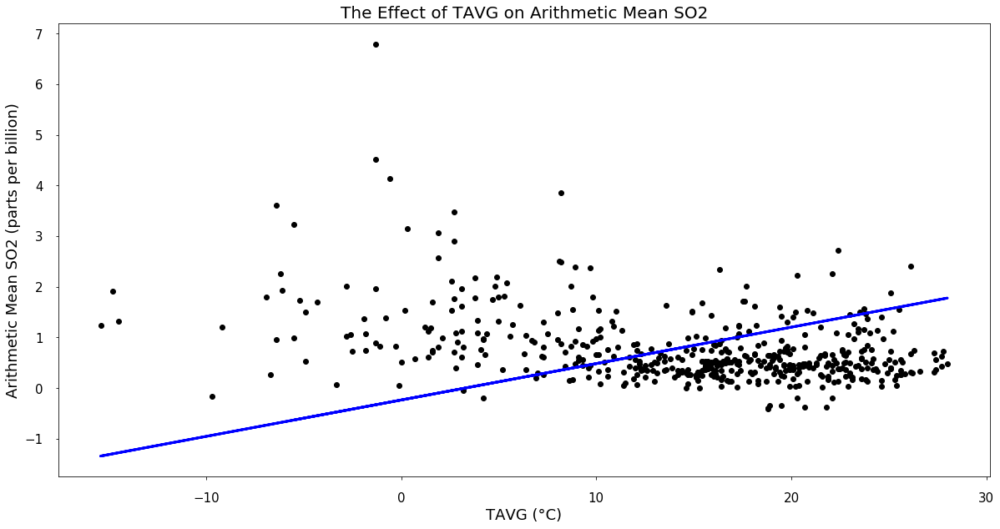

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display TAVG
All Features In Model ['TAVG', 'TMIN']
Coefficients [ 0.0718656  -0.09804507]


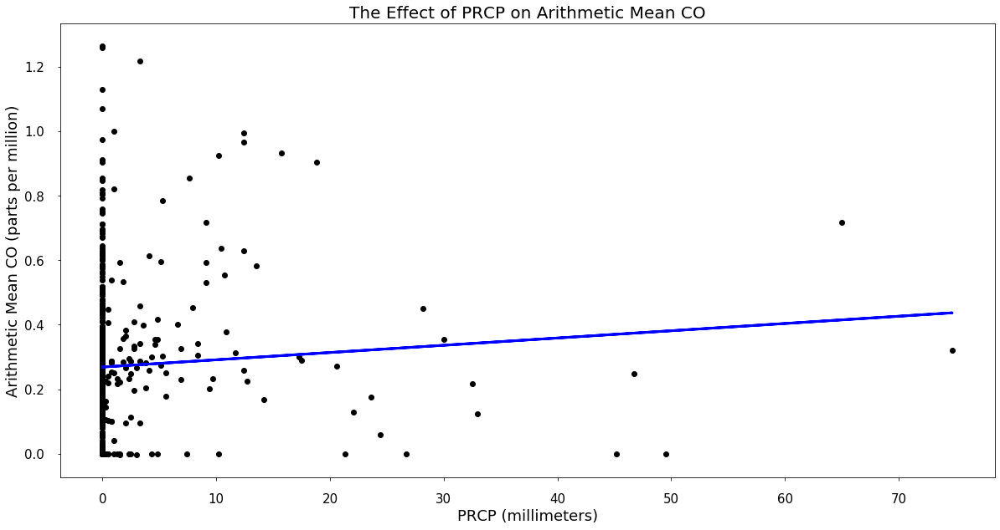

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00224966 -0.03563587  0.00046553  0.00984851  0.0089134  -0.02376883]


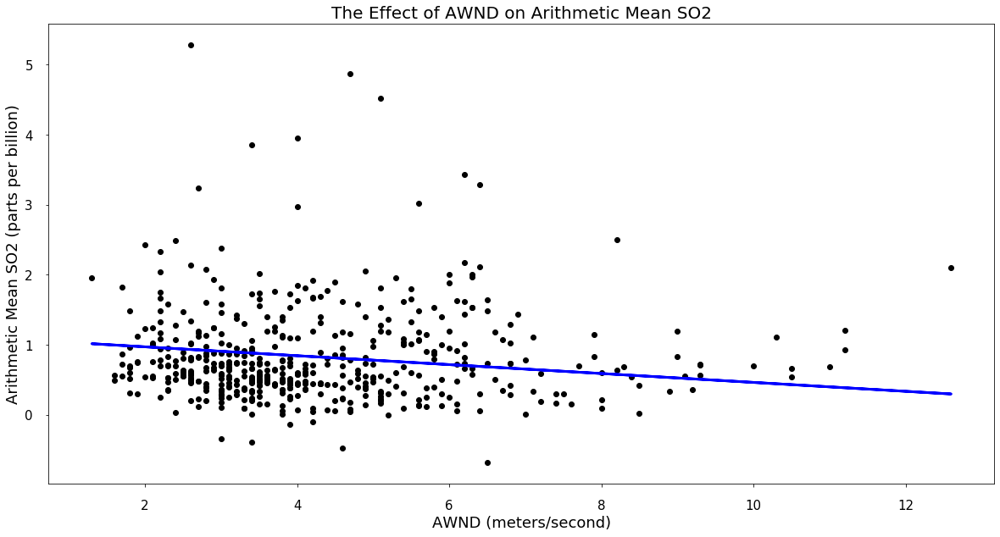

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [-0.06347726  0.00144613 -0.00132845 -0.03151034]


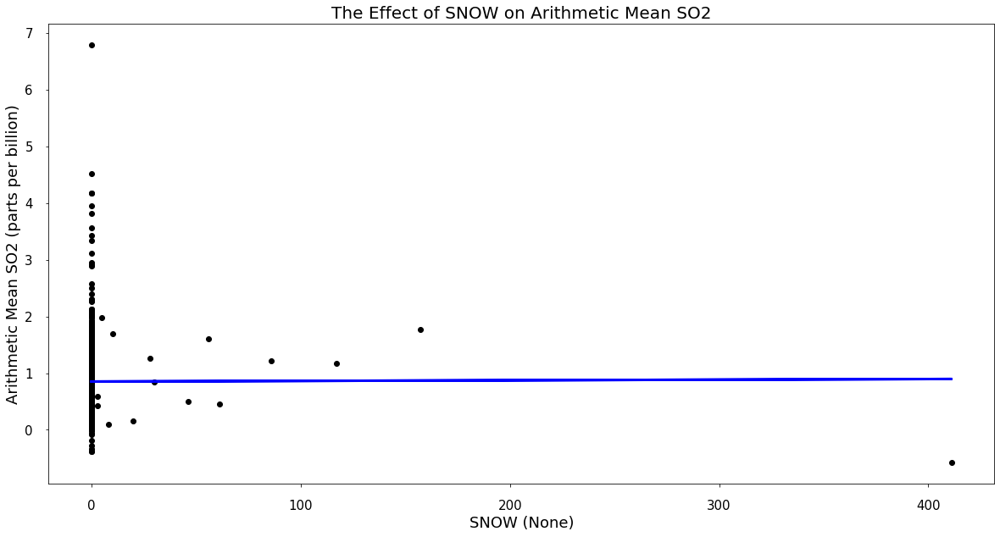

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.00010983  0.06621567 -0.09269279]


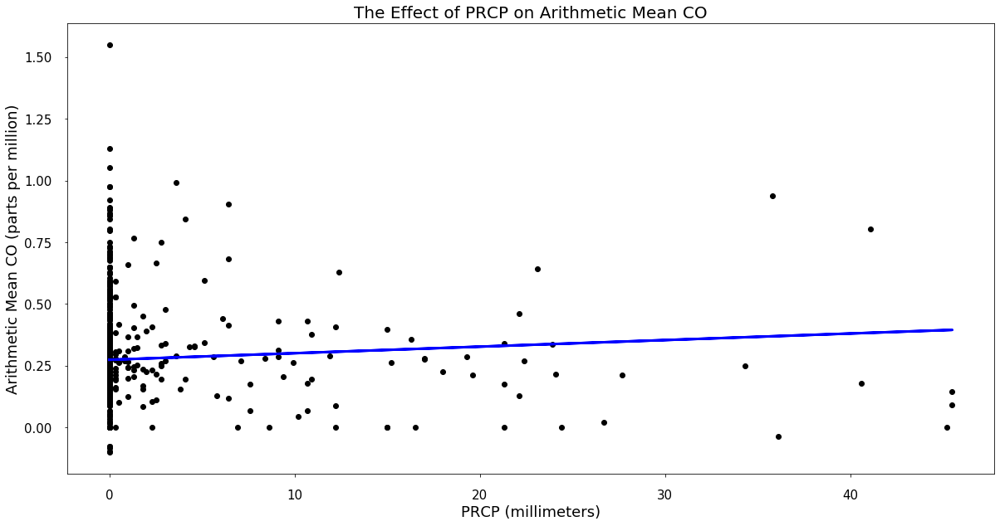

Explained Variance 0.17
Correlation Coefficient 0.41
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [ 0.00265923 -0.03421698  0.00044491  0.01332397 -0.01833374]


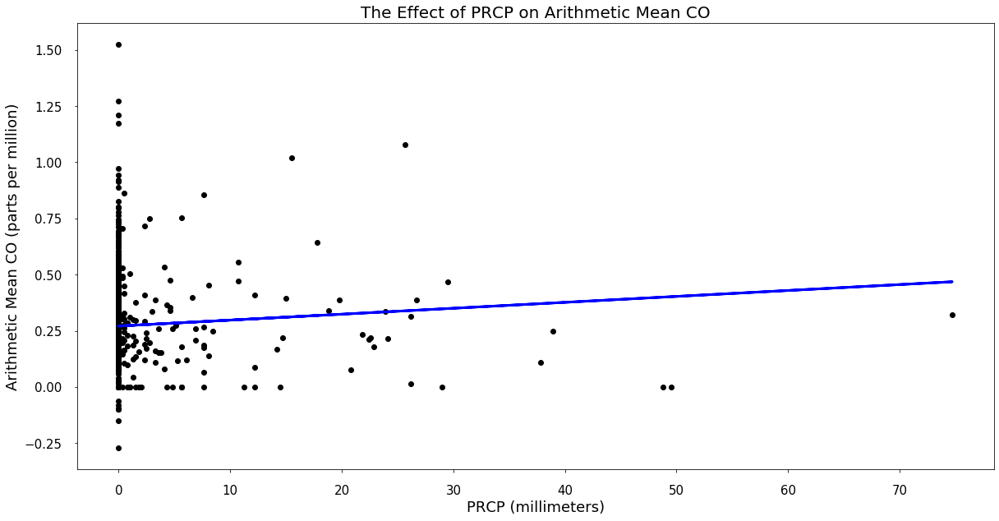

Explained Variance 0.16
Correlation Coefficient 0.41
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 2.63724650e-03 -3.47294980e-02  4.07432845e-04  6.25038241e-05
  1.37035281e-02 -1.87807334e-02]


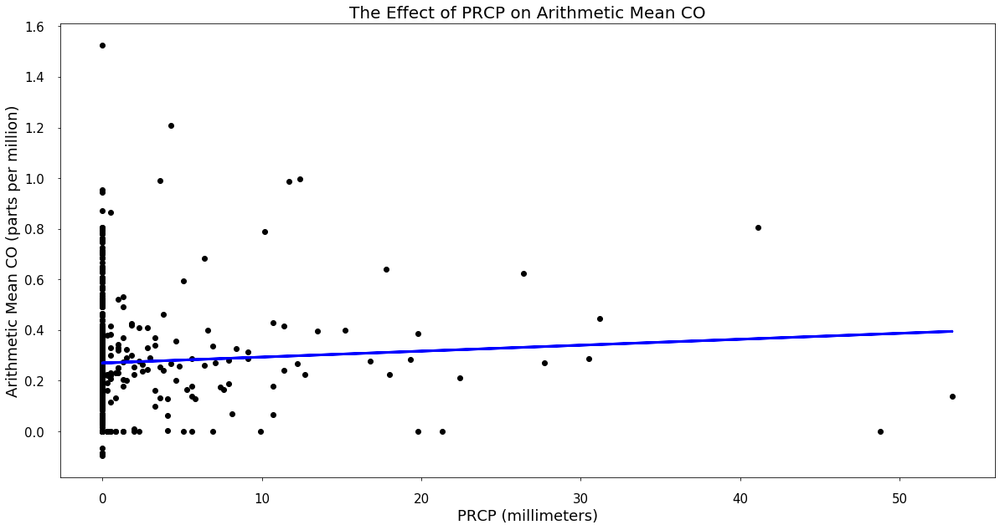

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00234352 -0.03533427  0.00043476  0.00011925  0.01078966  0.00861288
 -0.02395899]


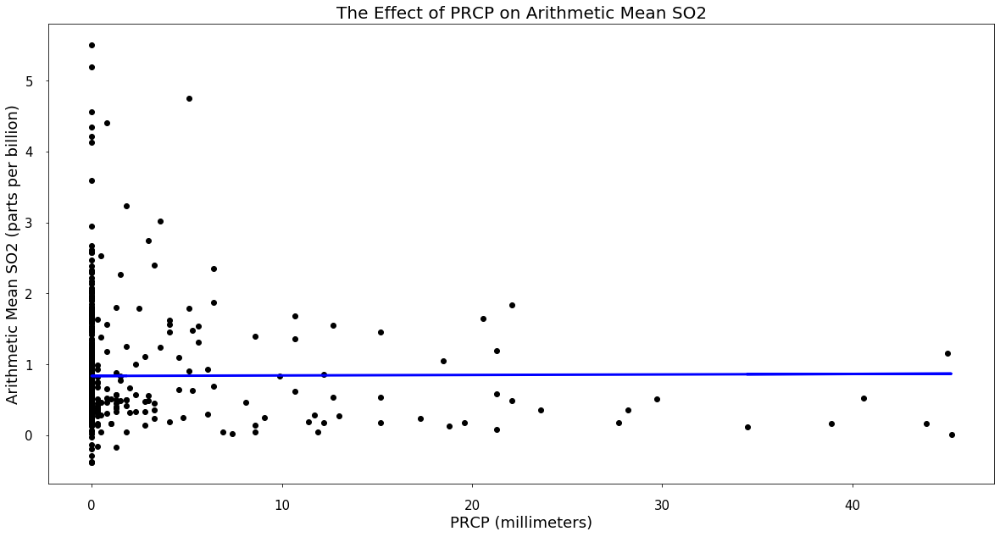

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [ 0.00069998 -0.05592178  0.00187882 -0.0008587  -0.02944736]


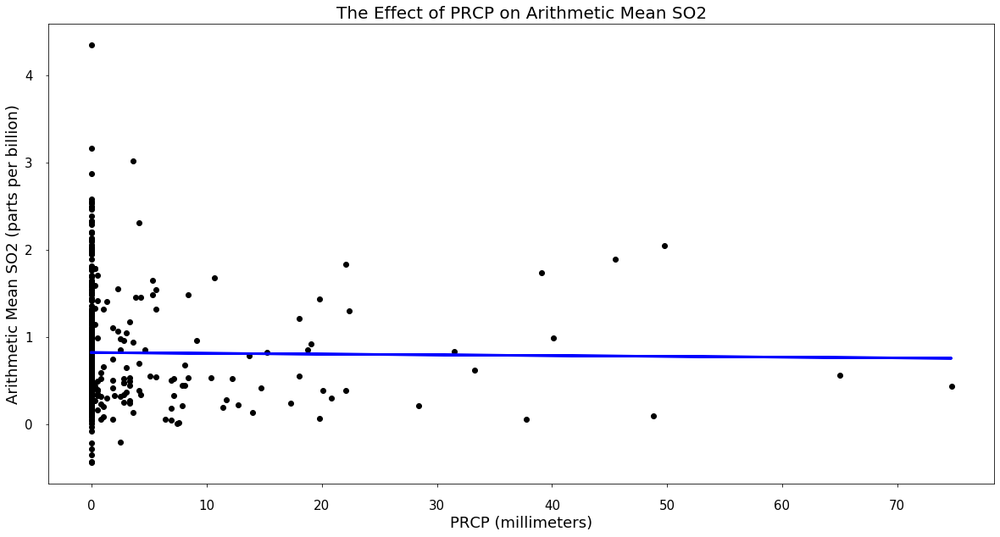

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMIN']
Coefficients [-0.00087384 -0.06064758  0.00165056 -0.03139788]


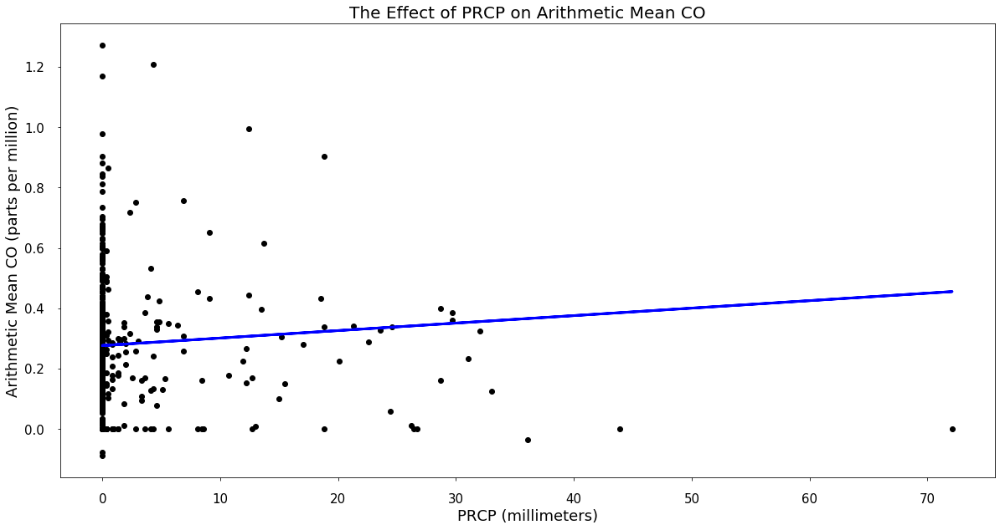

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.002478   -0.0346187   0.00032902  0.01233698  0.00814648 -0.0258476 ]


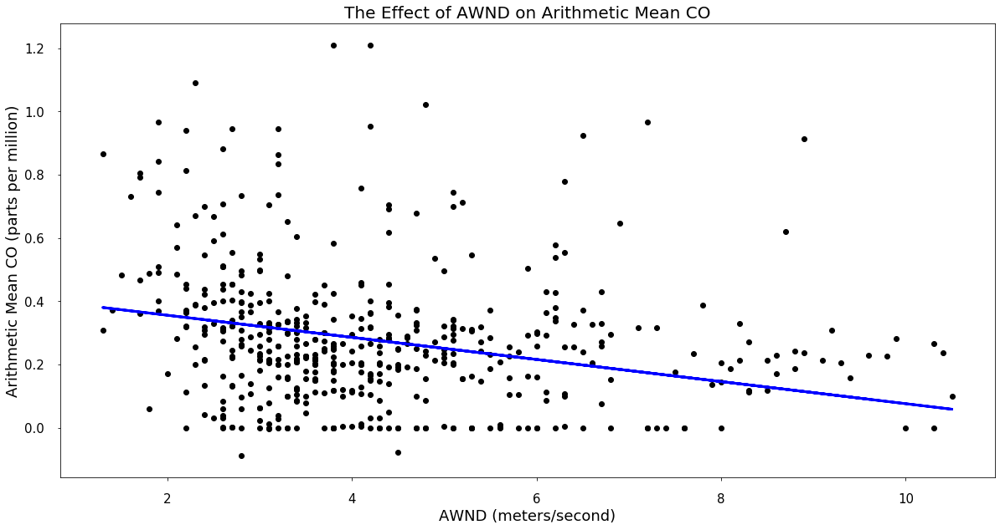

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.03496308  0.00048536  0.0003028   0.01163485  0.00774965 -0.02386415]


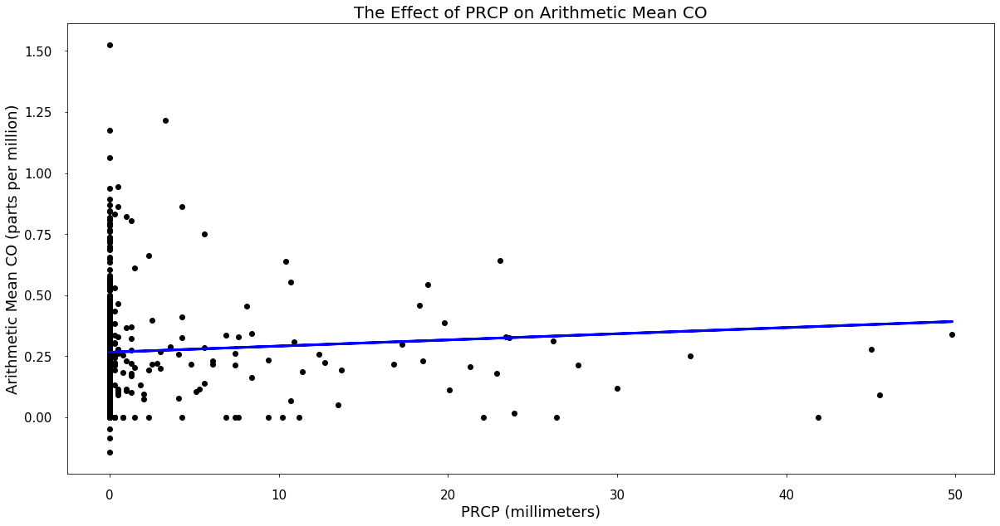

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [ 0.00251998 -0.03813472  0.00046612  0.022695   -0.02748271]


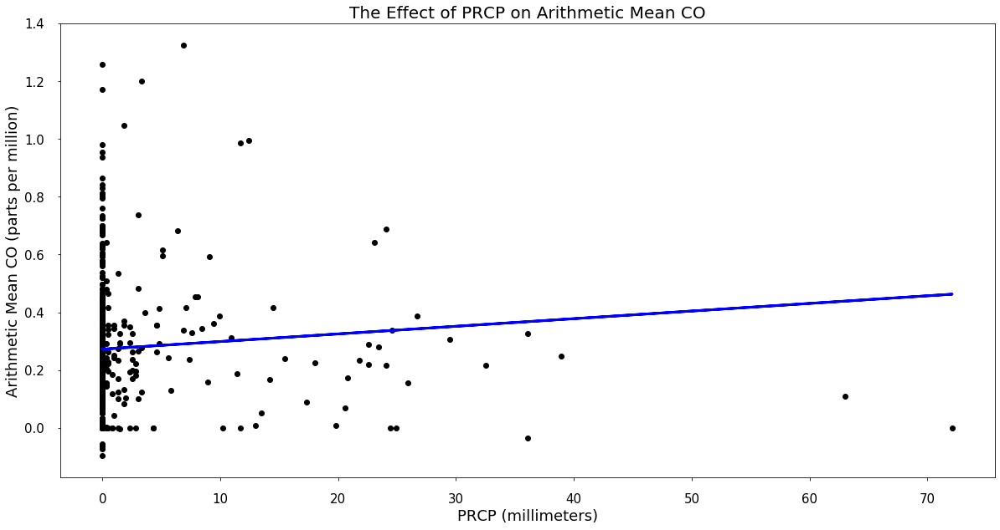

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [ 0.00263874 -0.03535308  0.01142341  0.00840873 -0.02523578]


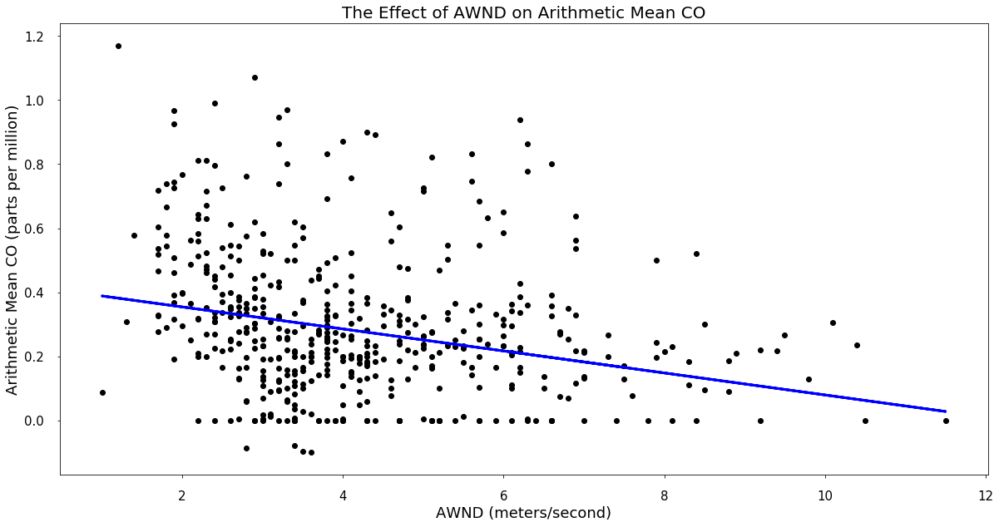

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.03433143  0.00045517  0.01105745  0.00661277 -0.02239555]


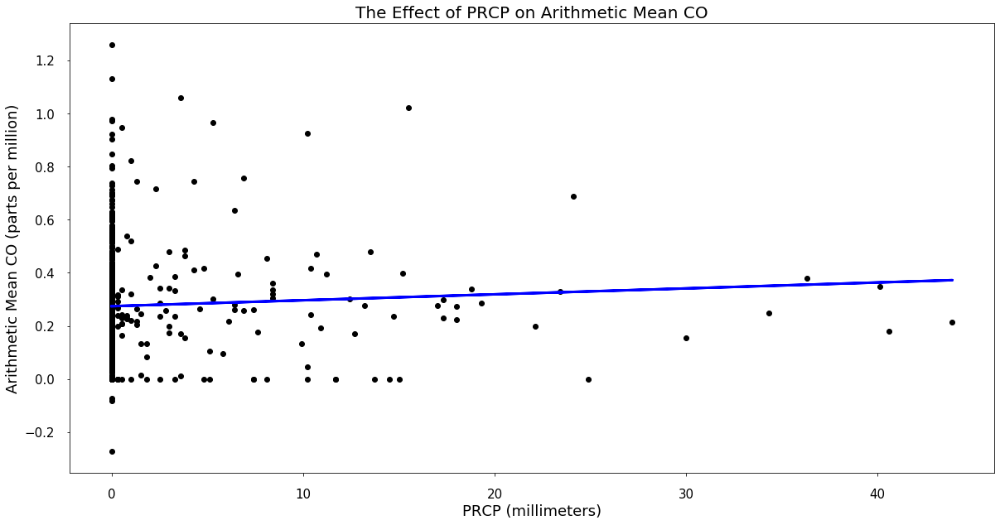

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 2.23143606e-03 -3.67312666e-02  4.48749293e-04 -7.41985217e-05
  2.45120160e-02 -2.91746254e-02]


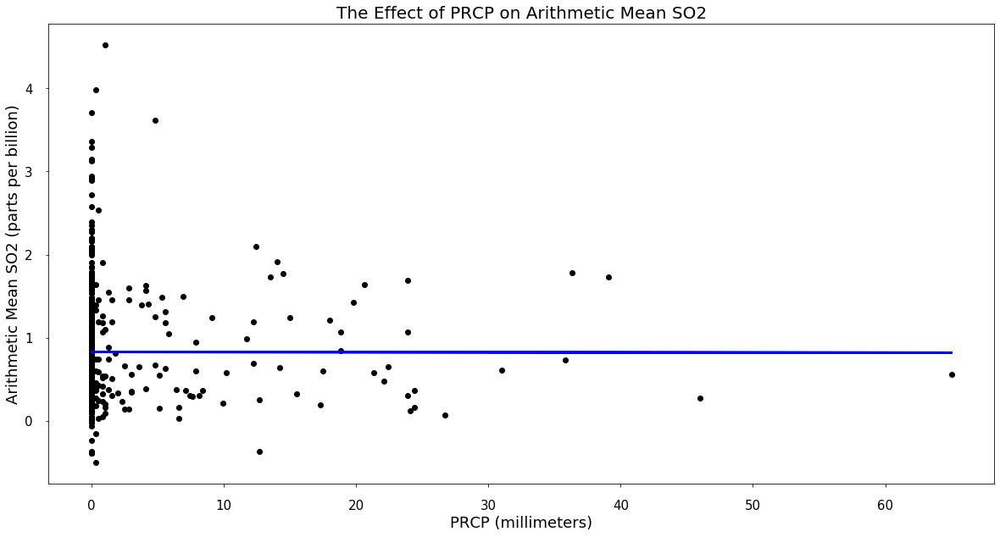

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMIN']
Coefficients [-0.00015096 -0.06604505 -0.03299612]


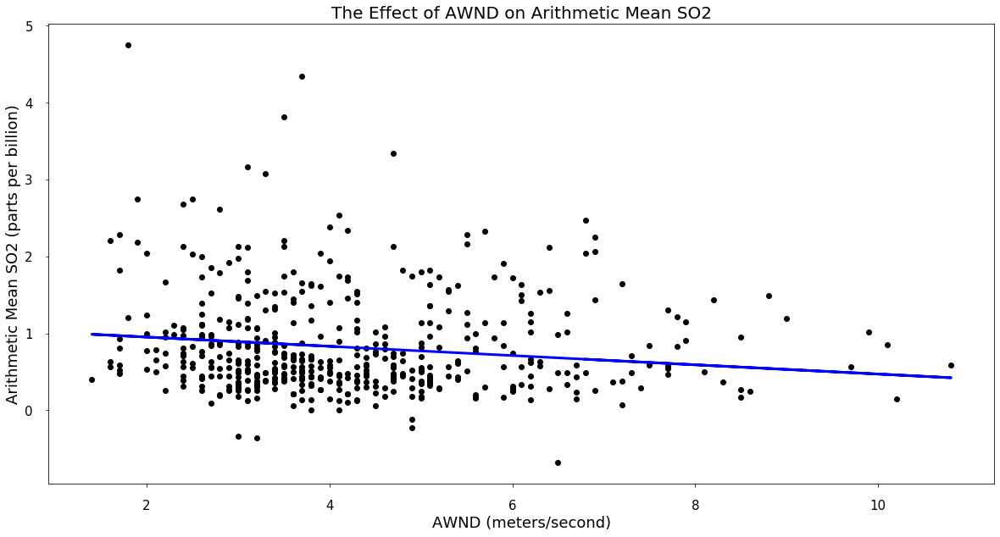

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMIN']
Coefficients [-0.06007523 -0.00027463 -0.03407421]


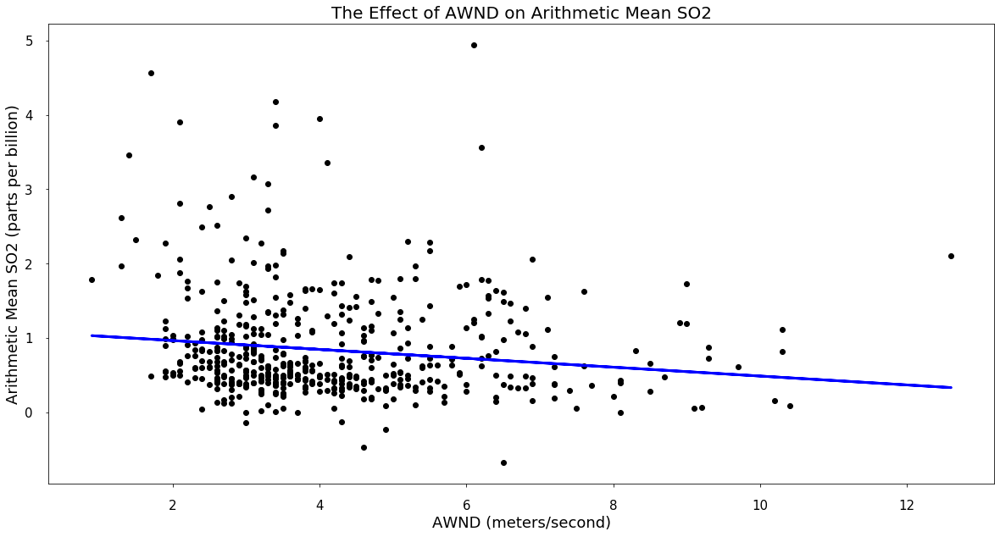

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMIN']
Coefficients [-0.05974588 -0.03278605]


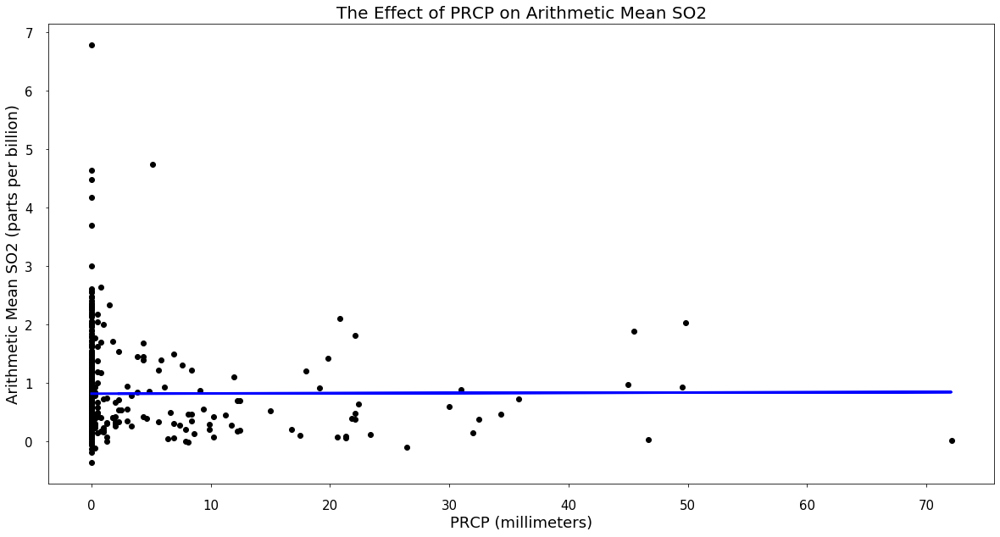

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMIN']
Coefficients [ 0.00037901 -0.06041061 -0.00033928 -0.0325391 ]


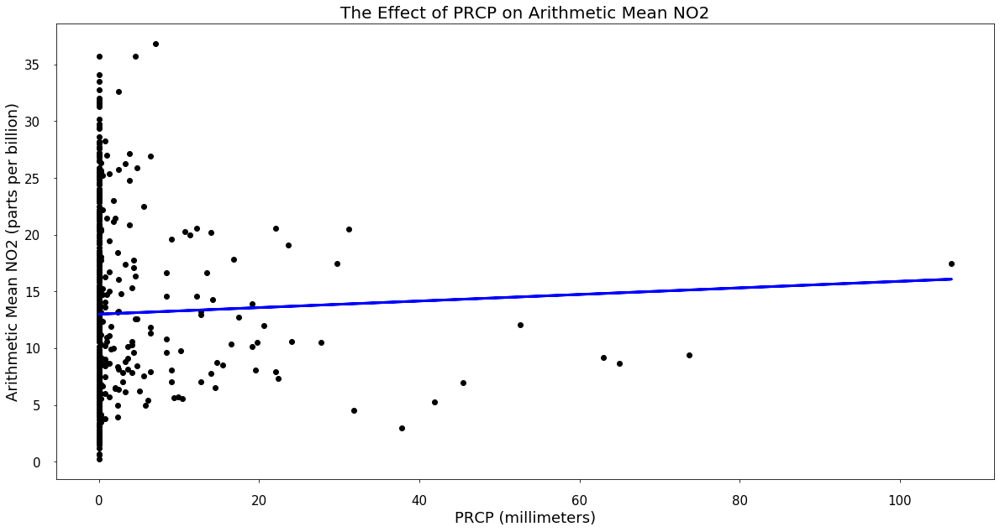

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG']
Coefficients [ 0.02894752  0.02104263 -0.02233136 -0.31487641]


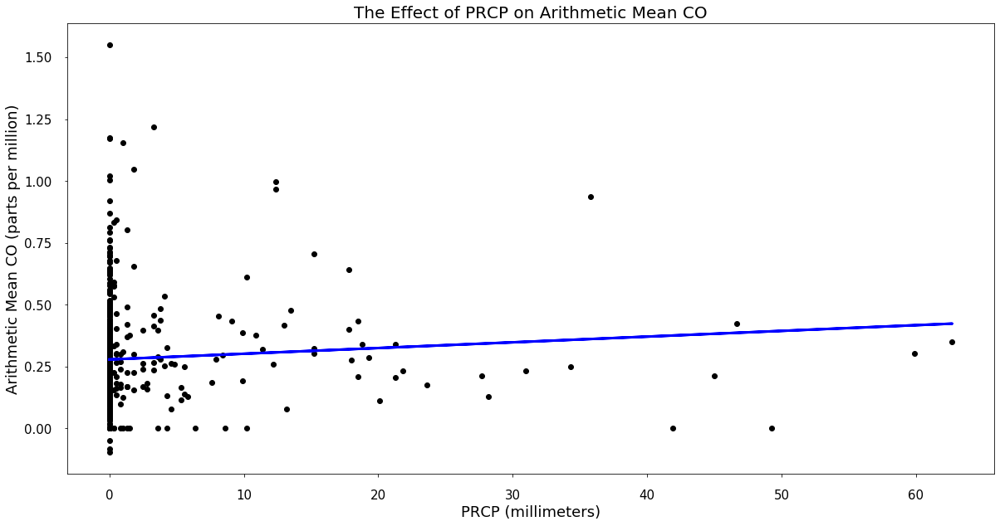

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [ 0.00230719 -0.0350416   0.00026862  0.01338159 -0.01905006]


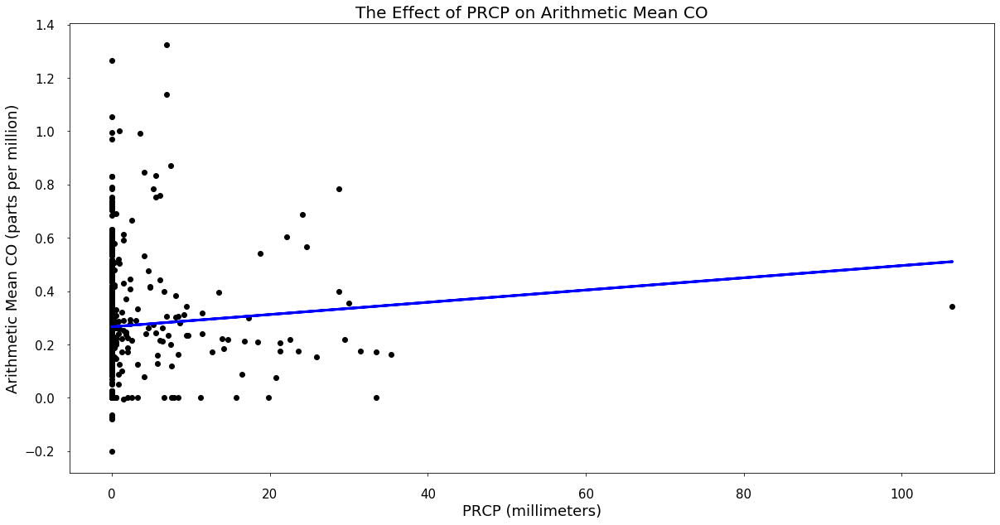

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [ 0.00229471 -0.03843496  0.000119    0.02176736 -0.0271053 ]


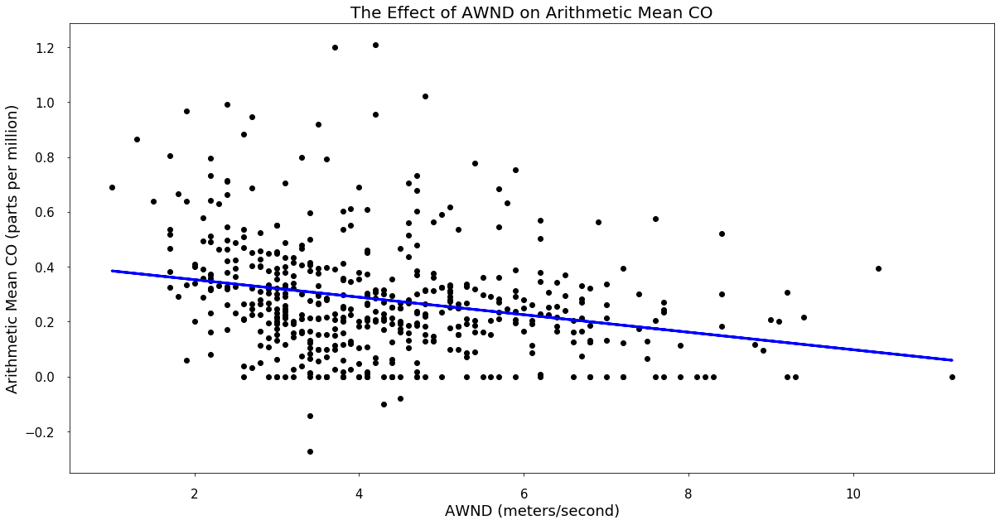

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX', 'TMIN']
Coefficients [-0.03190314  0.00050885  0.01311759 -0.01775379]


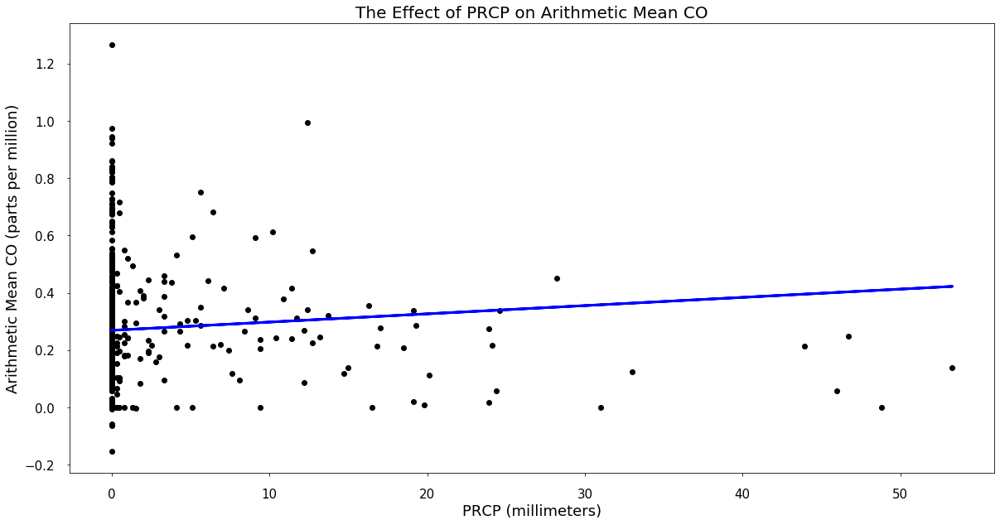

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMAX', 'TMIN']
Coefficients [ 0.002875   -0.03482144  0.01374943 -0.01935584]


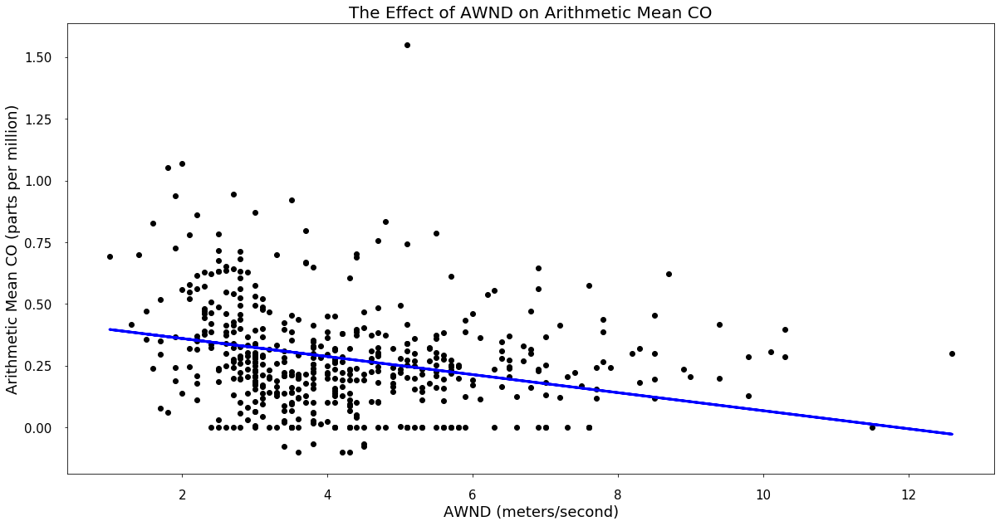

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-0.03656181  0.00045052  0.00024685  0.02310505 -0.02740984]


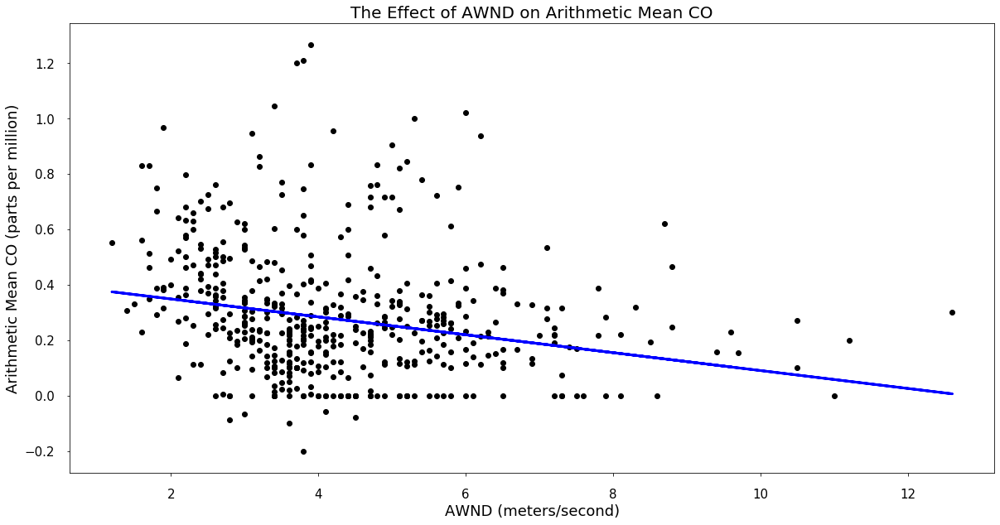

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-0.03228463  0.0005487   0.00045214  0.01253218 -0.01671349]


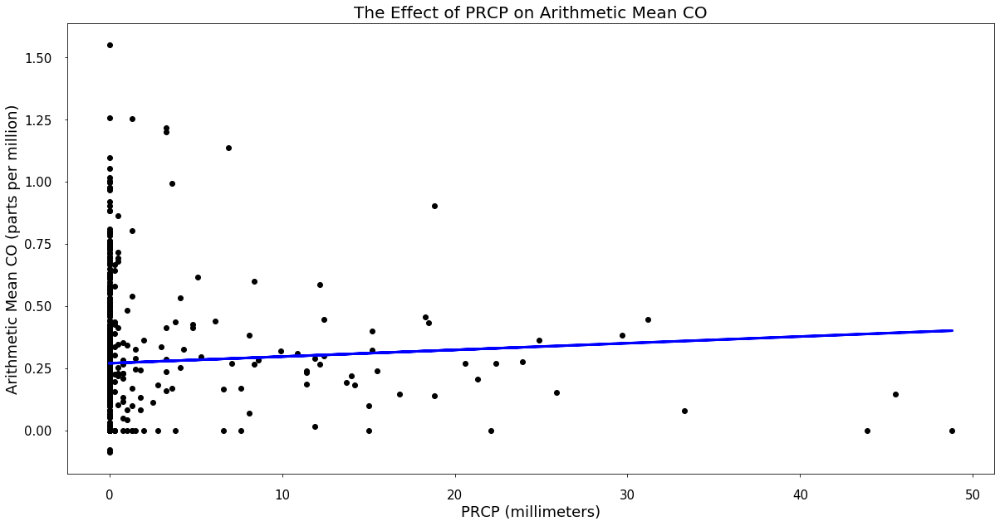

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMIN']
Coefficients [ 0.00268513 -0.03843892  0.02331443 -0.02870735]


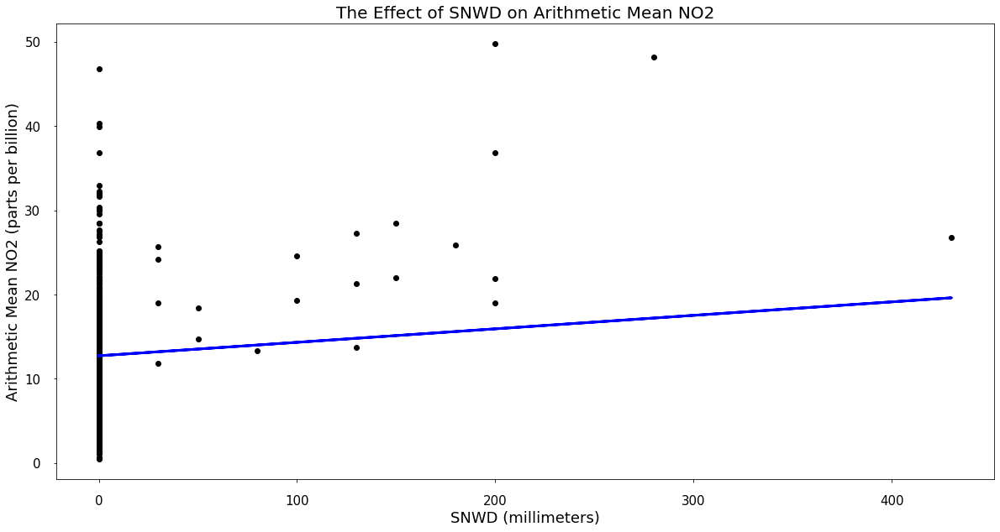

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG']
Coefficients [ 0.01601059 -0.01539407 -0.31594889]


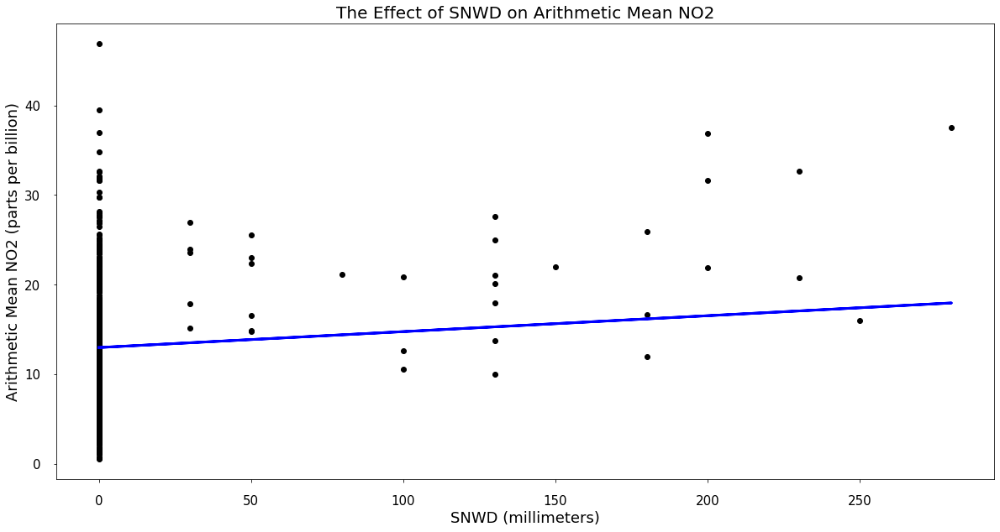

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG']
Coefficients [ 0.01776061 -0.30679949]


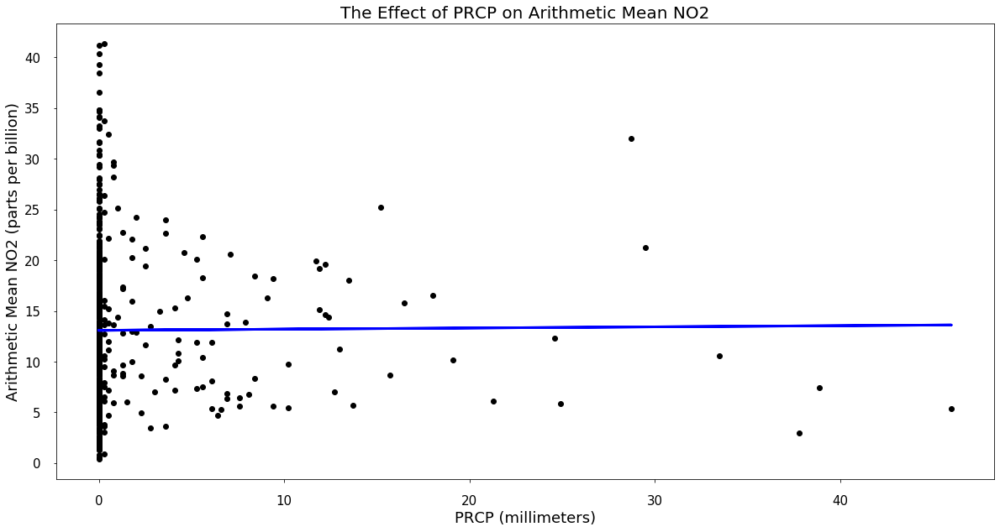

Explained Variance 0.16
Correlation Coefficient 0.40
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG']
Coefficients [ 0.01148058  0.01953356 -0.30293544]


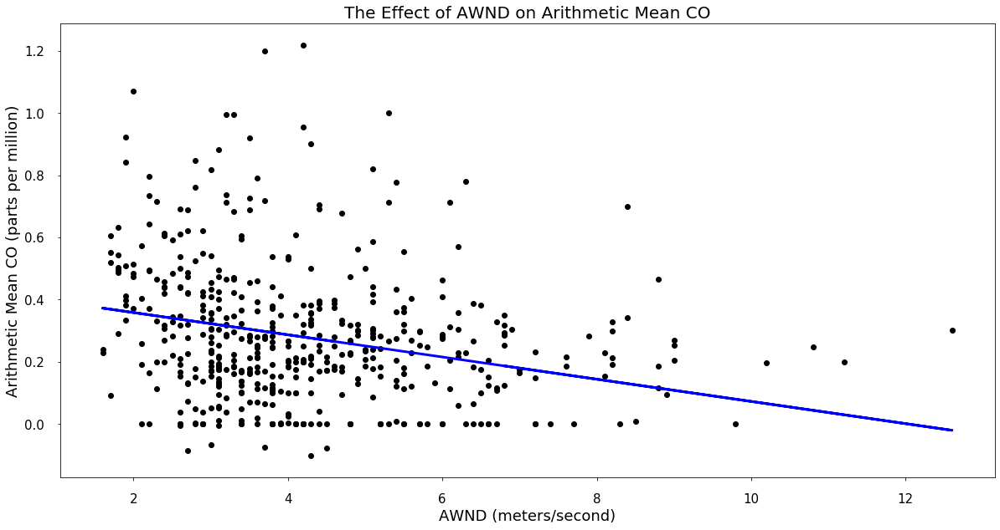

Explained Variance 0.16
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMIN']
Coefficients [-0.03569658  0.00046757  0.0221992  -0.02648422]


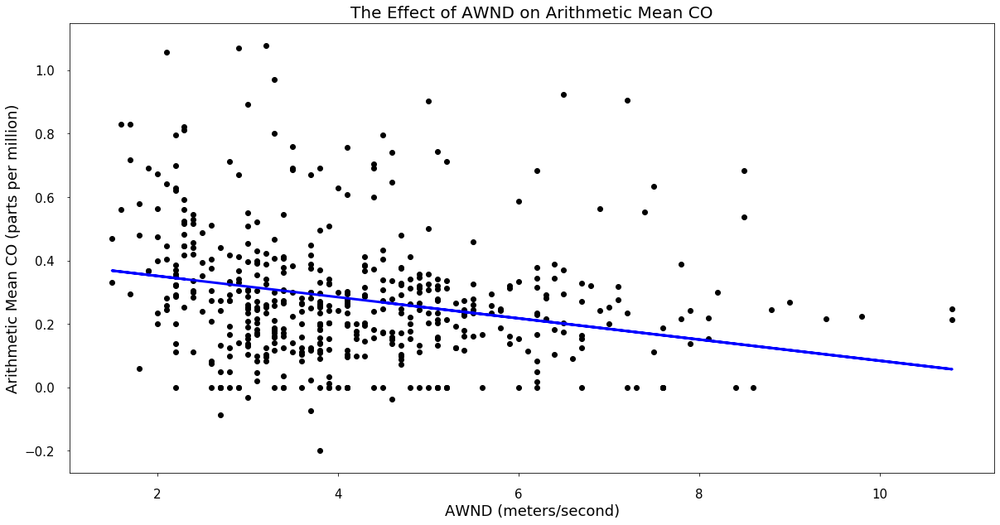

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMAX', 'TMIN']
Coefficients [-0.03342378  0.01410457 -0.01954359]


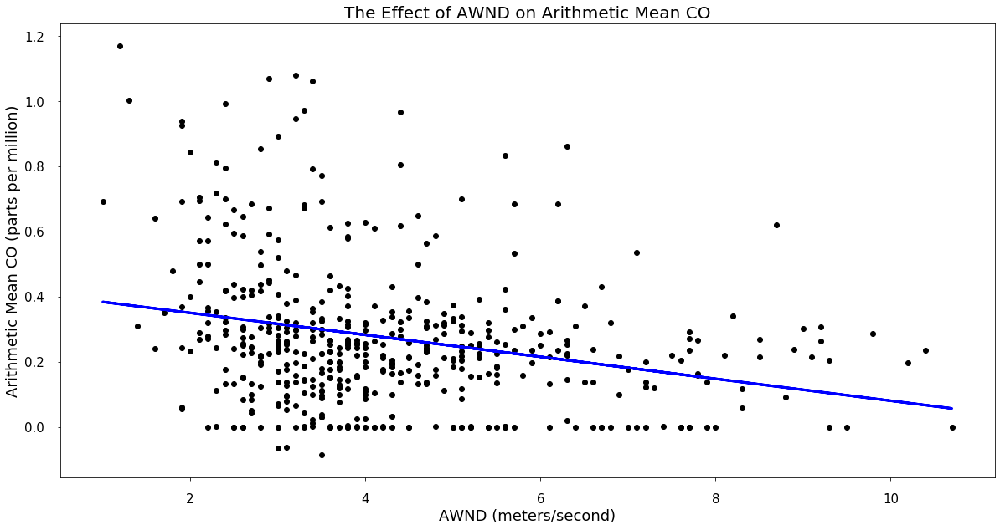

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.03372781  0.0125166   0.00656476 -0.02432752]


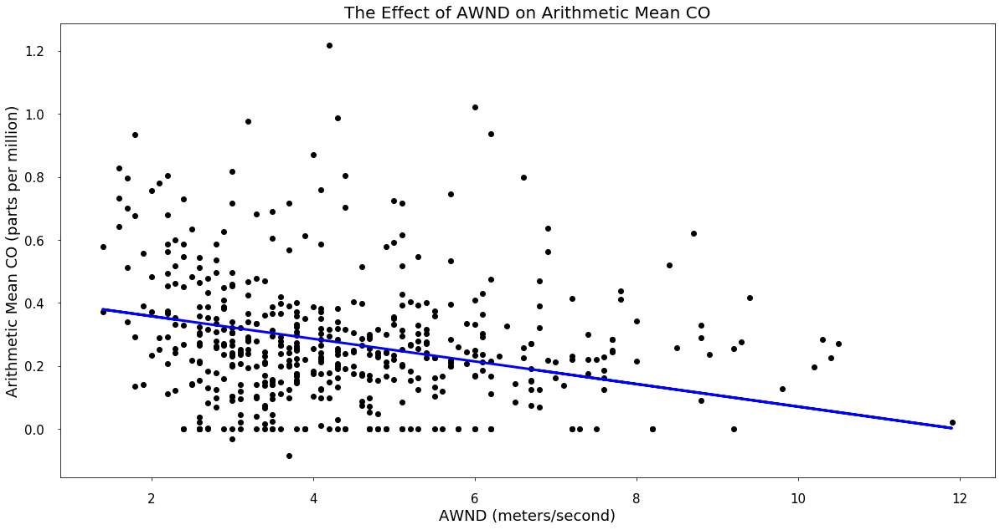

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX', 'TMIN']
Coefficients [-0.03588631  0.00041004  0.01046579  0.00821043 -0.02406693]


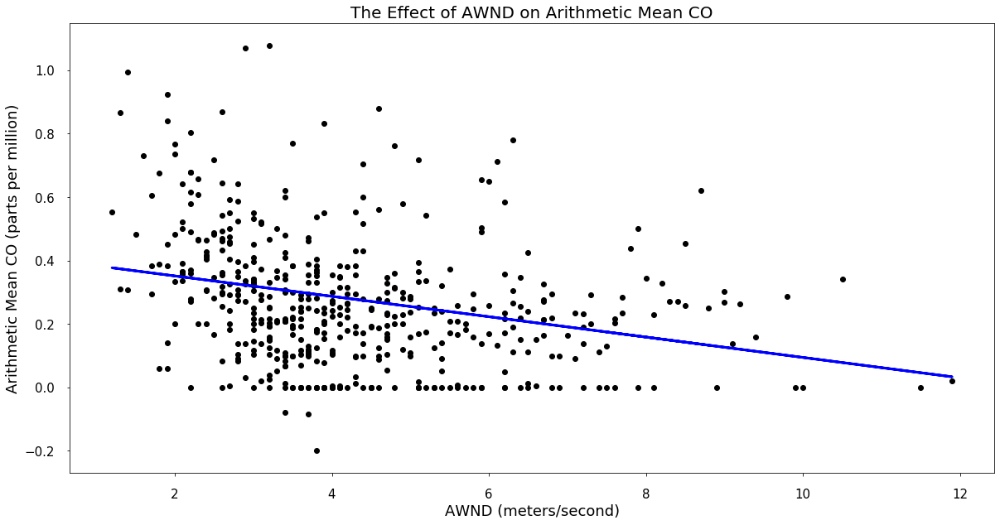

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMAX', 'TMIN']
Coefficients [-0.03212212  0.00038494  0.01298746 -0.01840335]


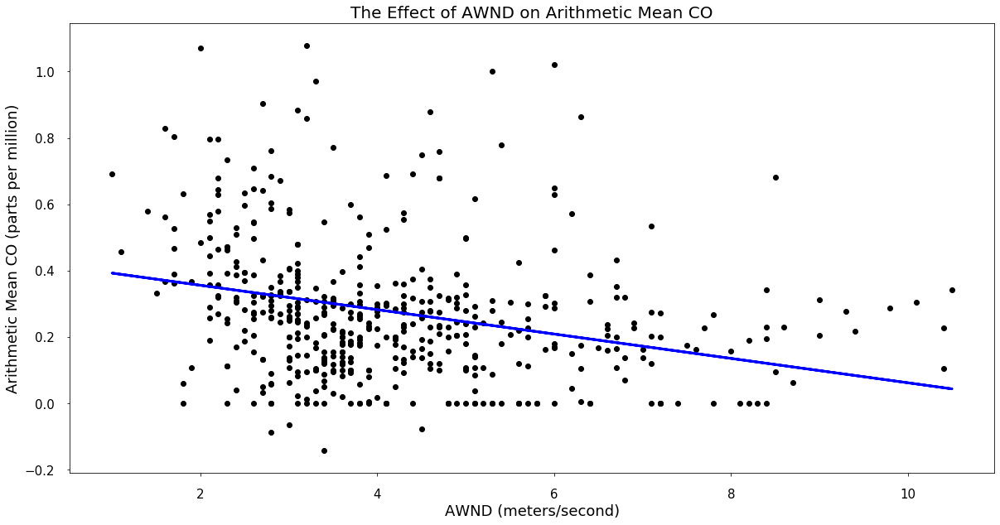

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMIN']
Coefficients [-0.03672637  0.00039198  0.02294544 -0.02809449]


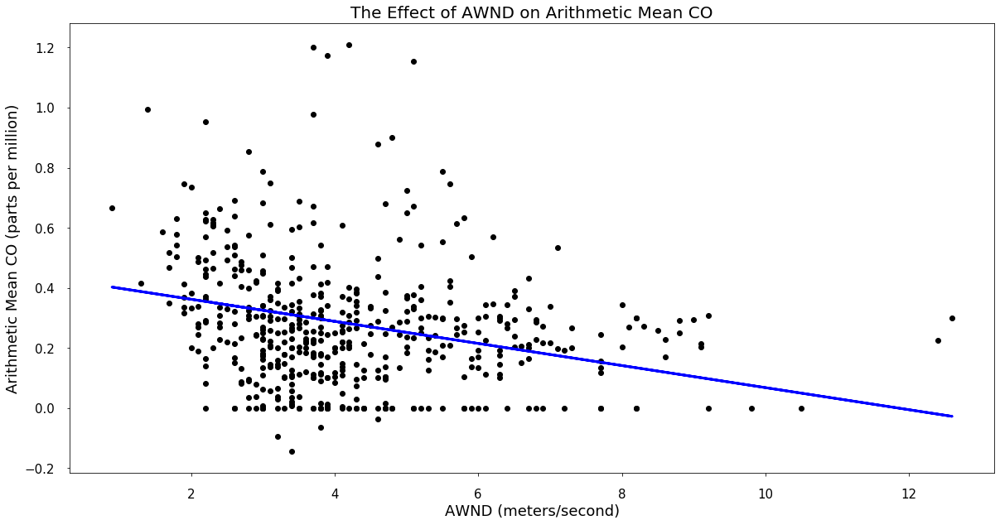

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMIN']
Coefficients [-0.03677866  0.022739   -0.02801125]


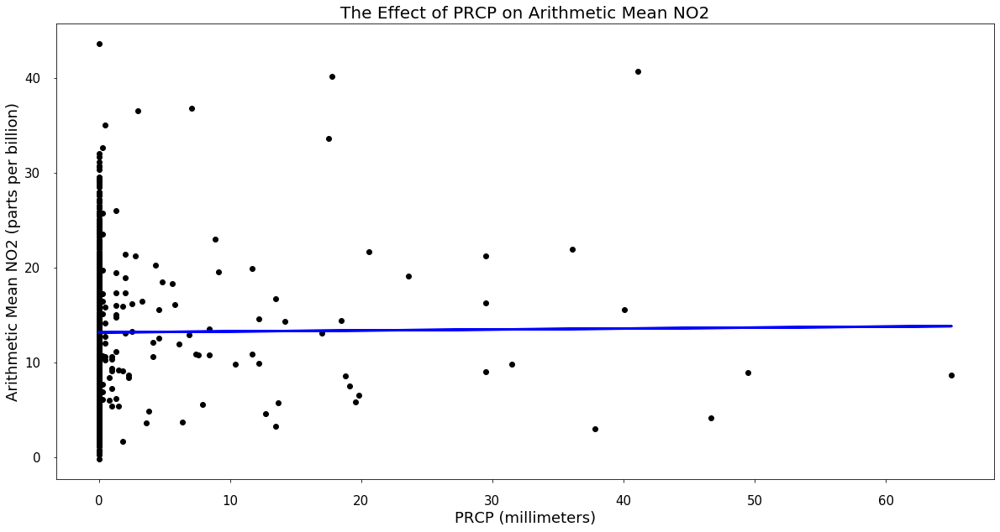

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG']
Coefficients [ 0.01012764 -0.01227216 -0.34677259]


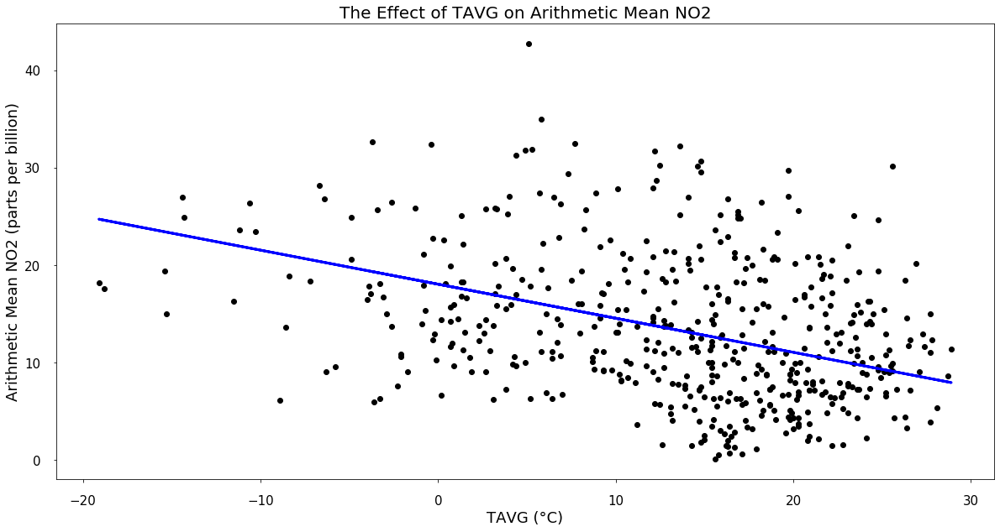

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display TAVG
All Features In Model ['TAVG']
Coefficients [-0.34937378]


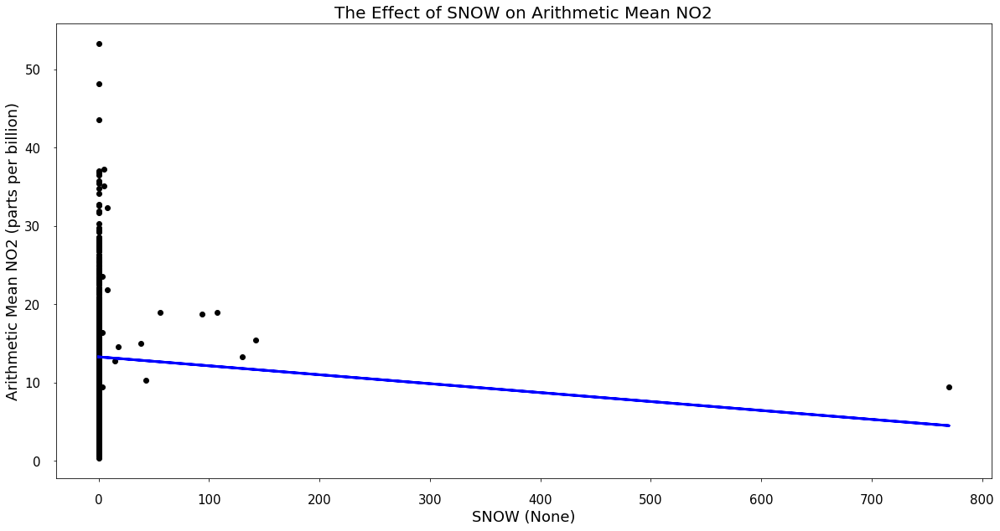

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG']
Coefficients [-0.0114068  -0.33397713]


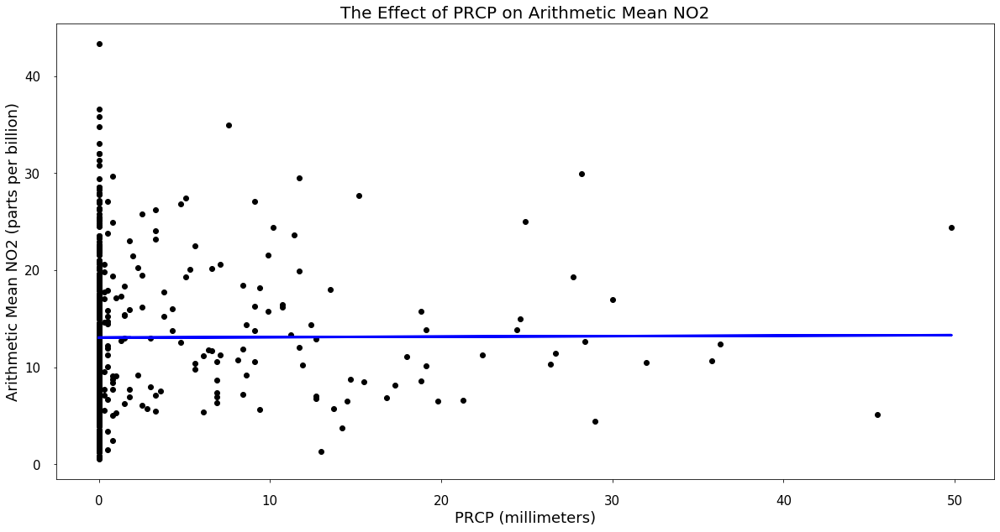

Explained Variance 0.15
Correlation Coefficient 0.39
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG']
Coefficients [ 0.00515532 -0.34209122]


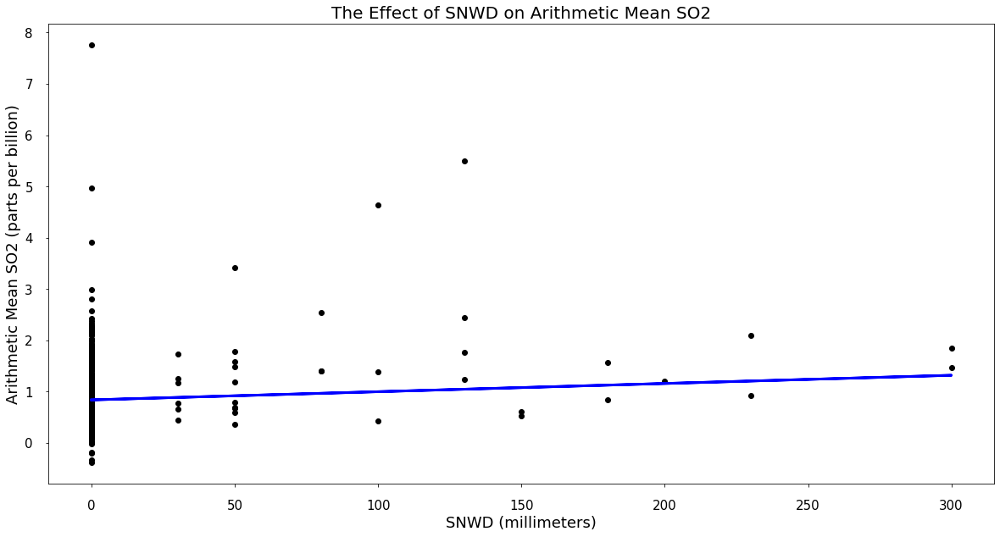

Explained Variance 0.15
Correlation Coefficient 0.38
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMIN']
Coefficients [ 0.00159864 -0.02745747]


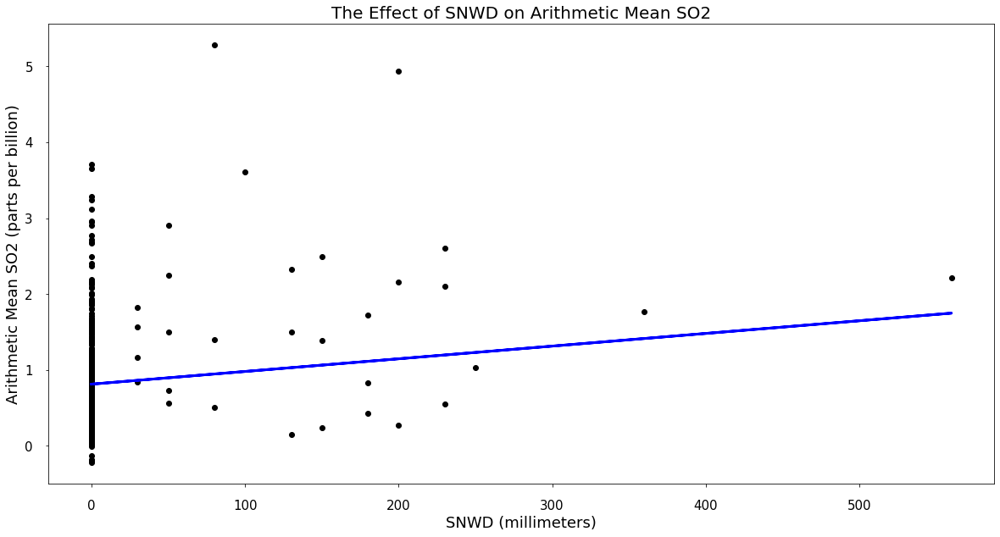

Explained Variance 0.15
Correlation Coefficient 0.38
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMIN']
Coefficients [ 0.00166975 -0.00149849 -0.02730886]


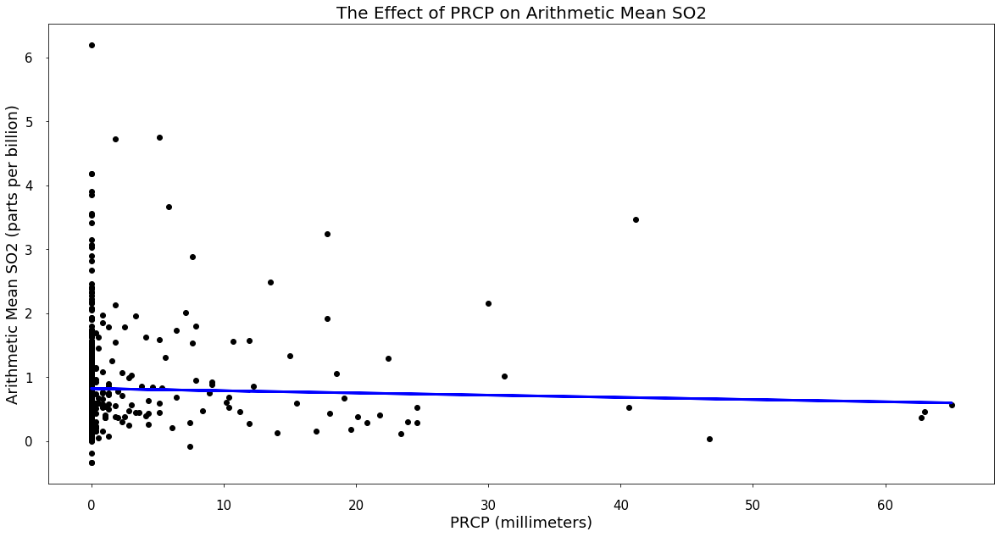

Explained Variance 0.15
Correlation Coefficient 0.38
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMIN']
Coefficients [-0.00344051  0.001735   -0.0252241 ]


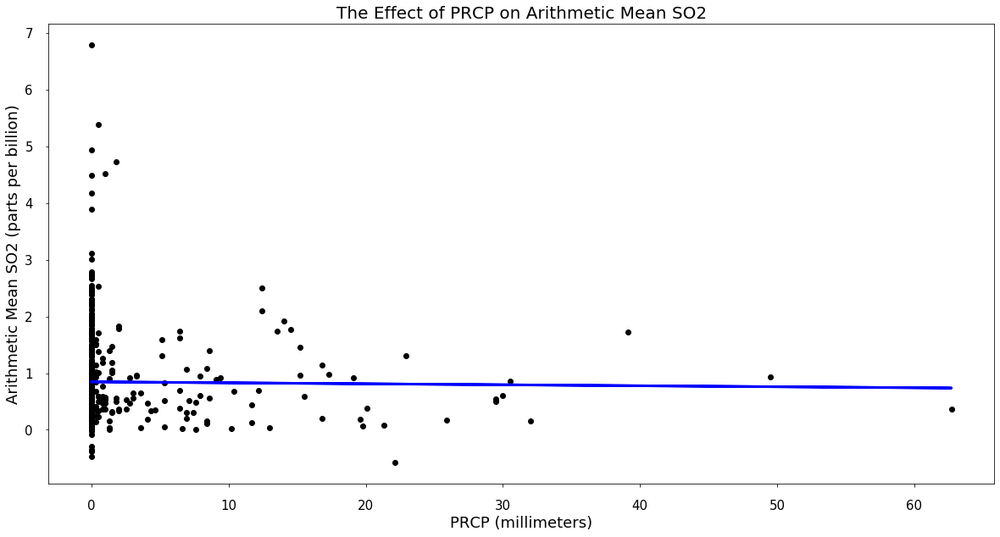

Explained Variance 0.14
Correlation Coefficient 0.38
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMIN']
Coefficients [-0.0017391   0.0010707  -0.00064337 -0.0266143 ]


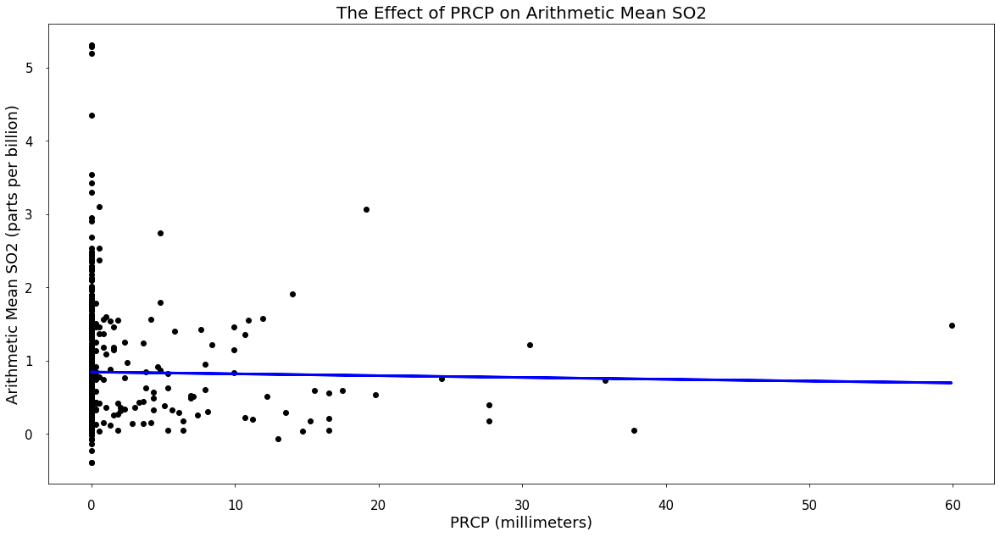

Explained Variance 0.14
Correlation Coefficient 0.38
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TMIN']
Coefficients [-0.00246618 -0.03019341]


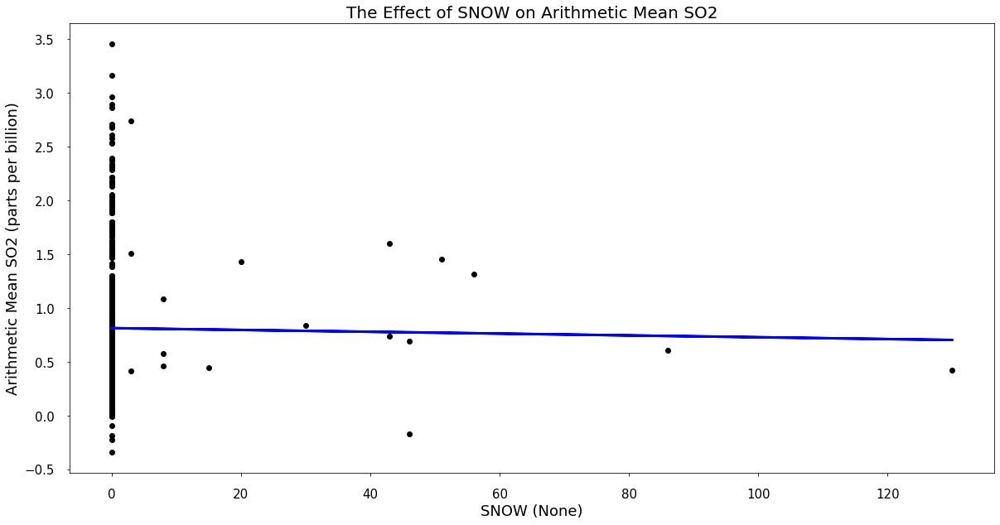

Explained Variance 0.14
Correlation Coefficient 0.38
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TMIN']
Coefficients [-0.00084626 -0.03141045]


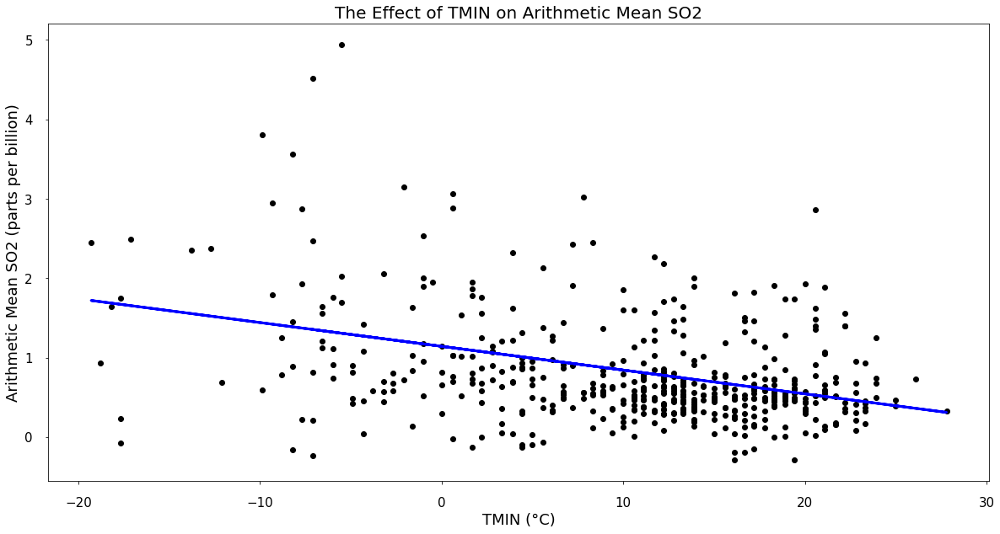

Explained Variance 0.14
Correlation Coefficient 0.37
Feature Selected for Display TMIN
All Features In Model ['TMIN']
Coefficients [-0.02991126]


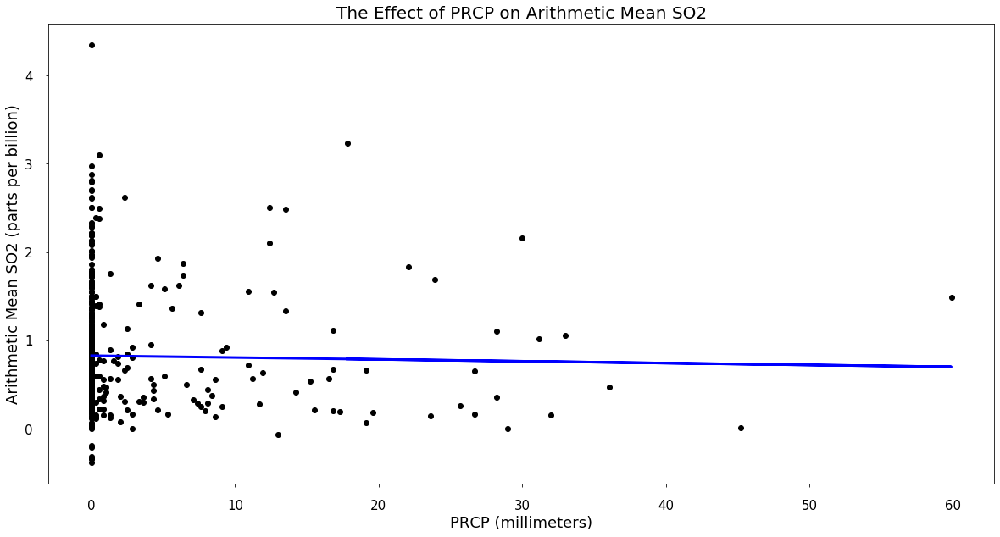

Explained Variance 0.14
Correlation Coefficient 0.37
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TMIN']
Coefficients [-0.00209934 -0.00105459 -0.02984873]


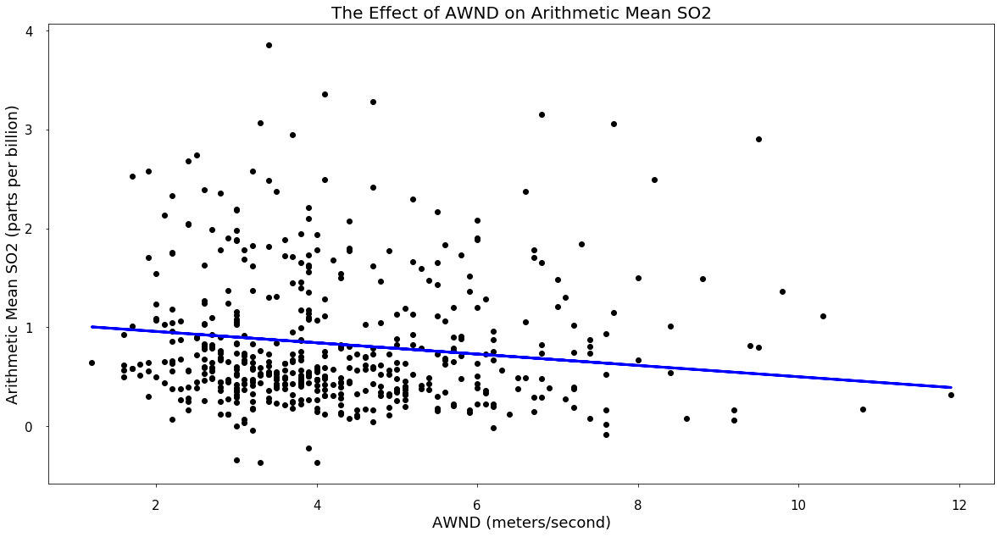

Explained Variance 0.14
Correlation Coefficient 0.37
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG']
Coefficients [-0.05726344  0.00199482 -0.02660868]


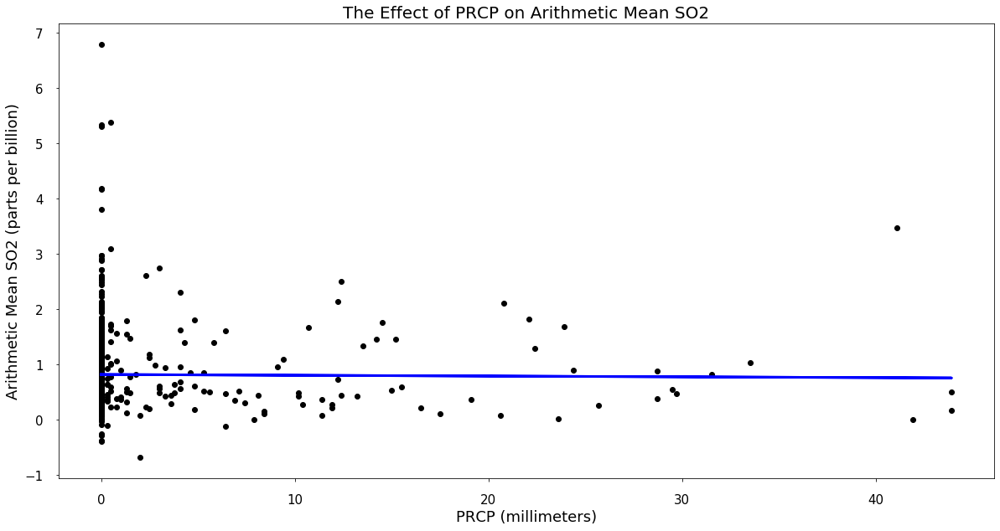

Explained Variance 0.14
Correlation Coefficient 0.37
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG']
Coefficients [-0.00141641 -0.05366805  0.00177247 -0.02586467]


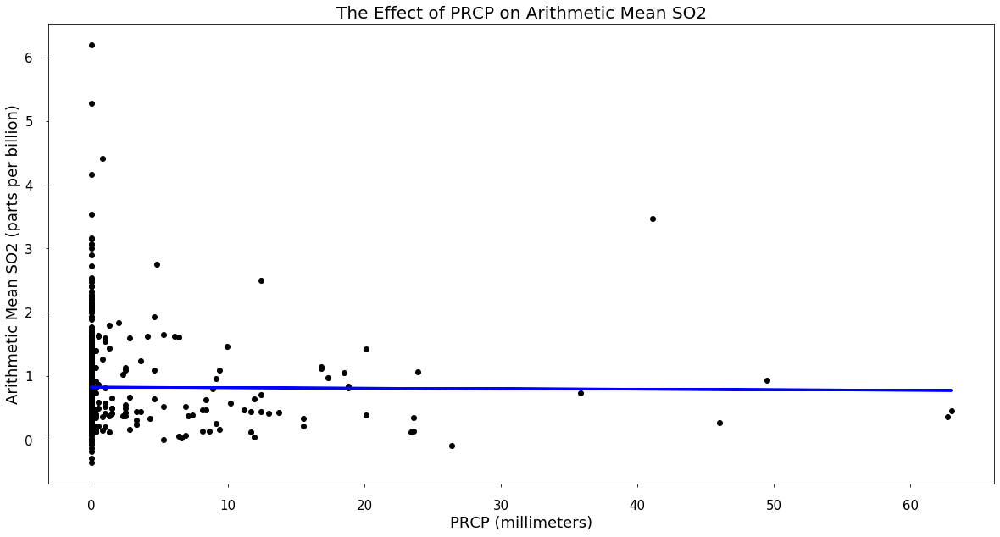

Explained Variance 0.13
Correlation Coefficient 0.37
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG']
Coefficients [-0.0008008  -0.0520983   0.00199874 -0.00079045 -0.02671012]


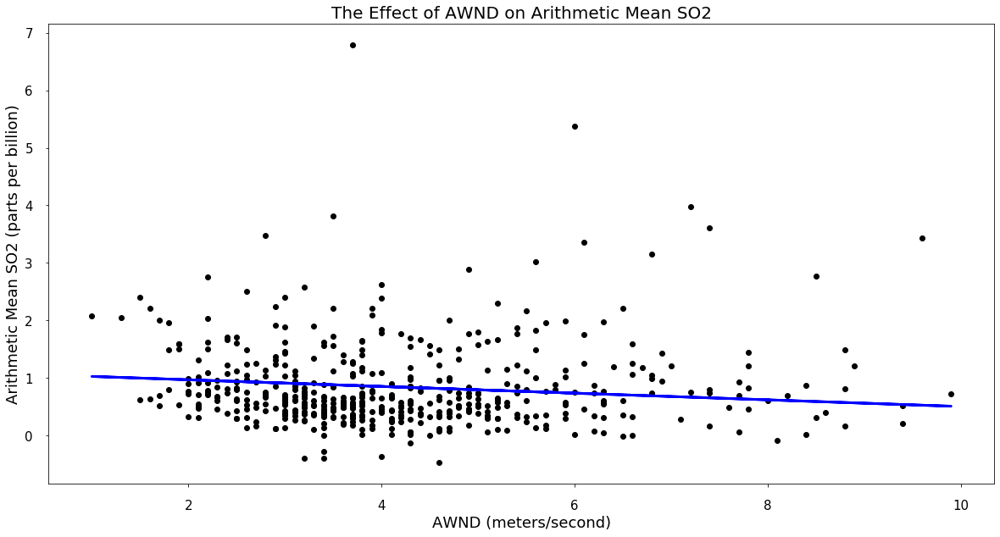

Explained Variance 0.13
Correlation Coefficient 0.37
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG']
Coefficients [-0.05814315  0.0017215  -0.00072702 -0.02706172]


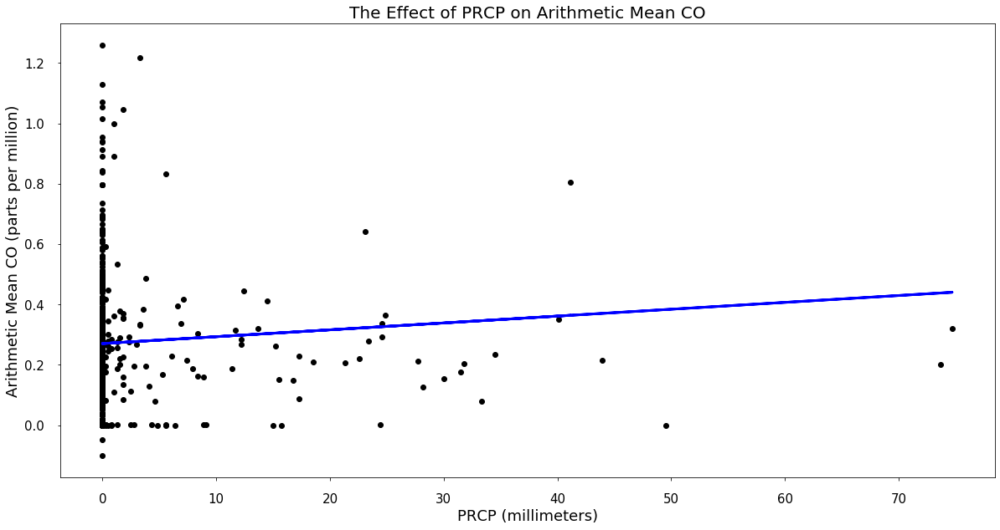

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 0.00227407 -0.03359478  0.00051126  0.00048031 -0.0234513   0.0191098 ]


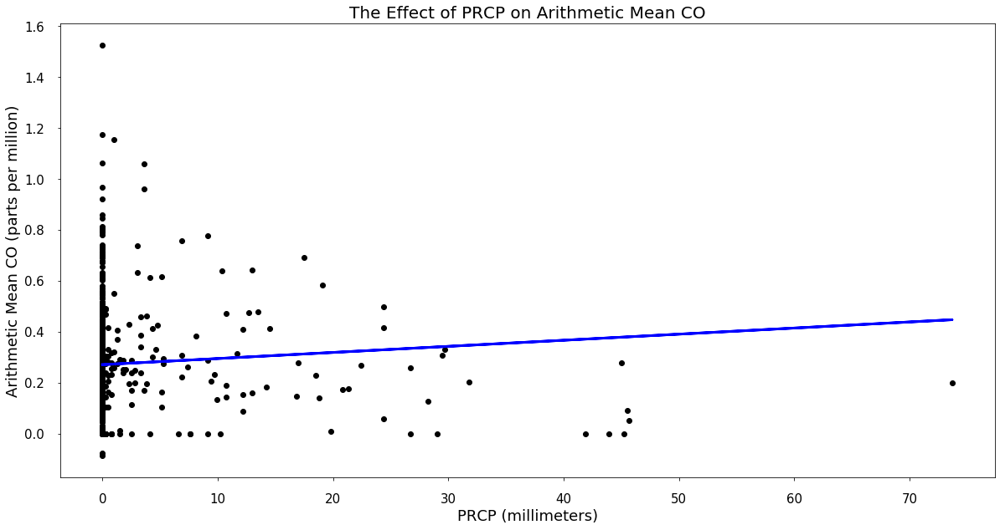

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [ 0.00239394 -0.03101489  0.00059823 -0.02239894  0.01801199]


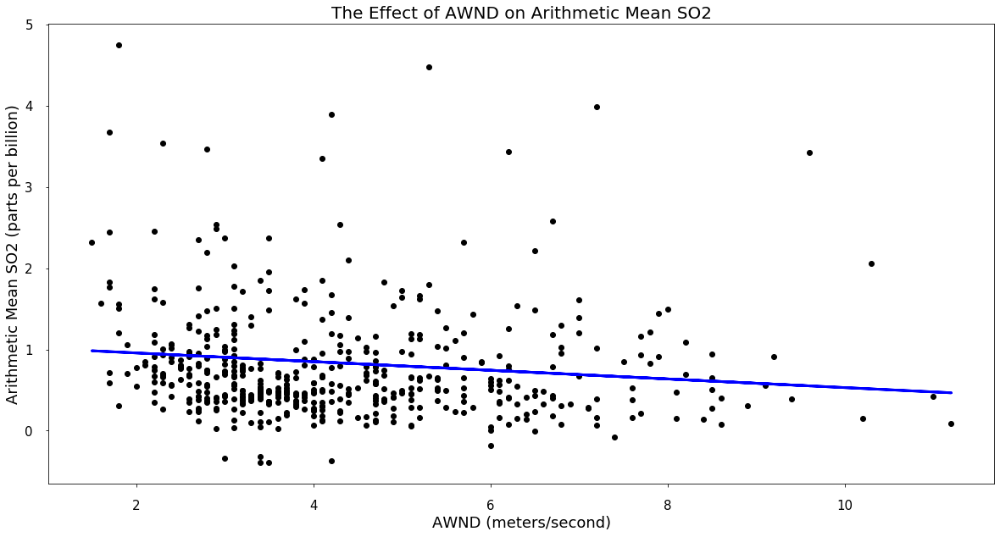

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG']
Coefficients [-0.05332868 -0.03009608]


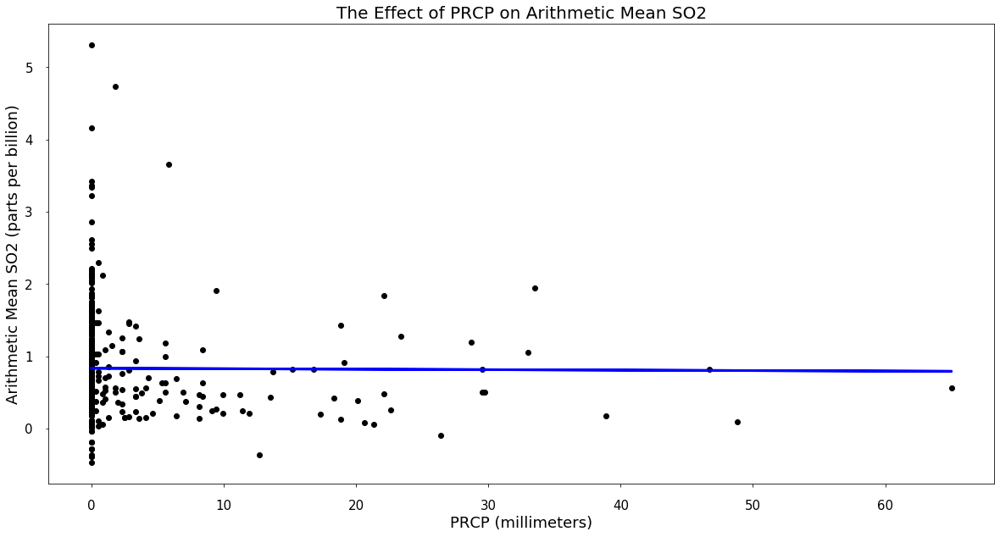

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG']
Coefficients [-0.0006455  -0.06109414 -0.03006996]


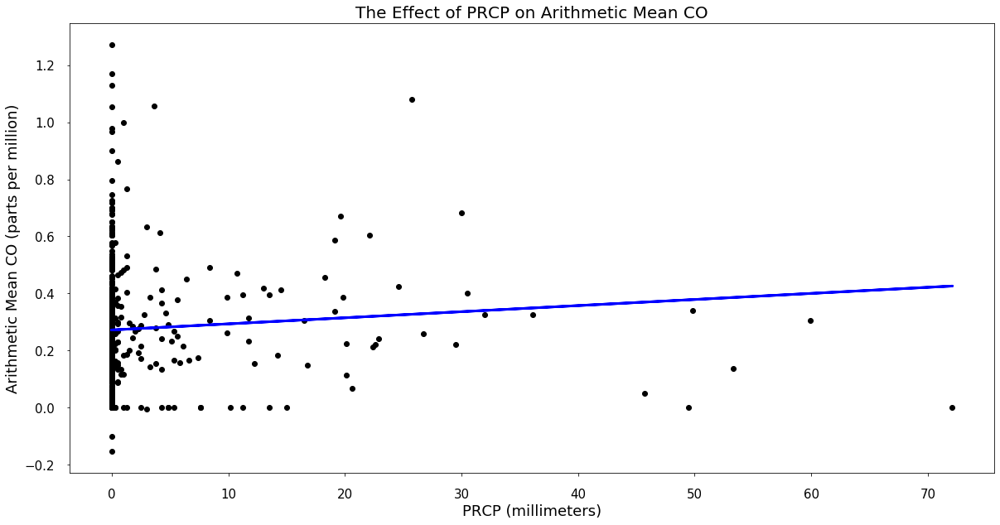

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [ 2.13469129e-03 -3.16576065e-02  5.39677615e-05 -2.40474386e-02
  1.89102555e-02]


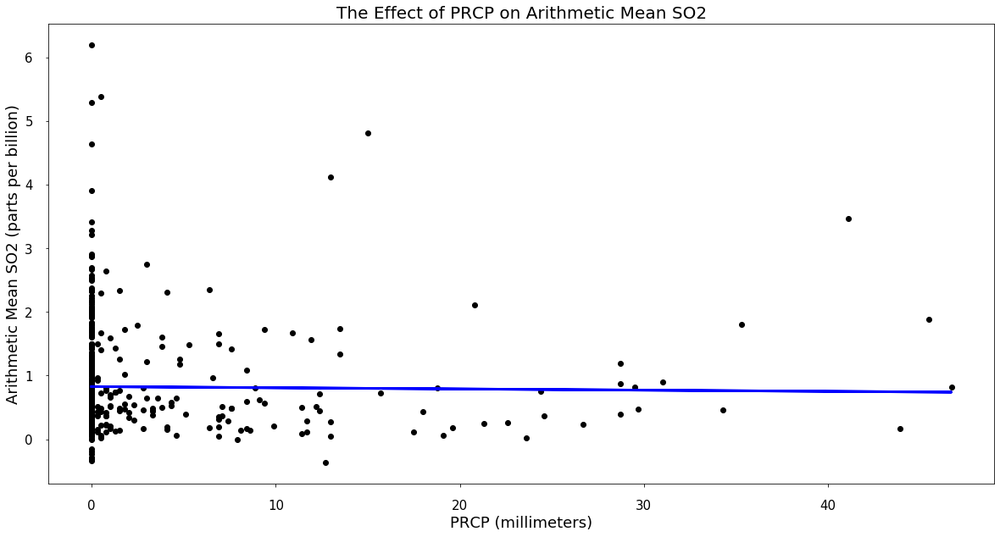

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TAVG']
Coefficients [-0.00187318 -0.05409177 -0.00042973 -0.02853369]


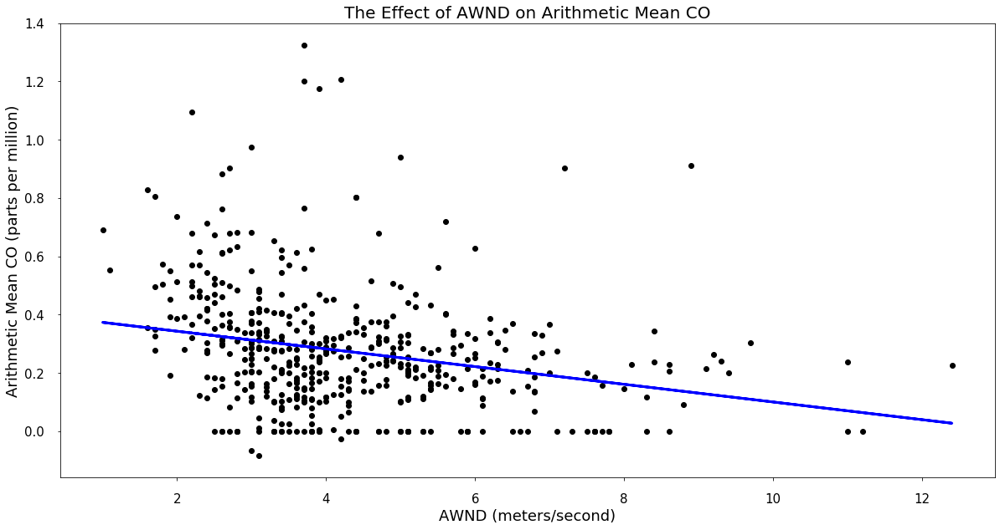

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TAVG', 'TMAX']
Coefficients [-0.0303511   0.0005371  -0.02271214  0.0181085 ]


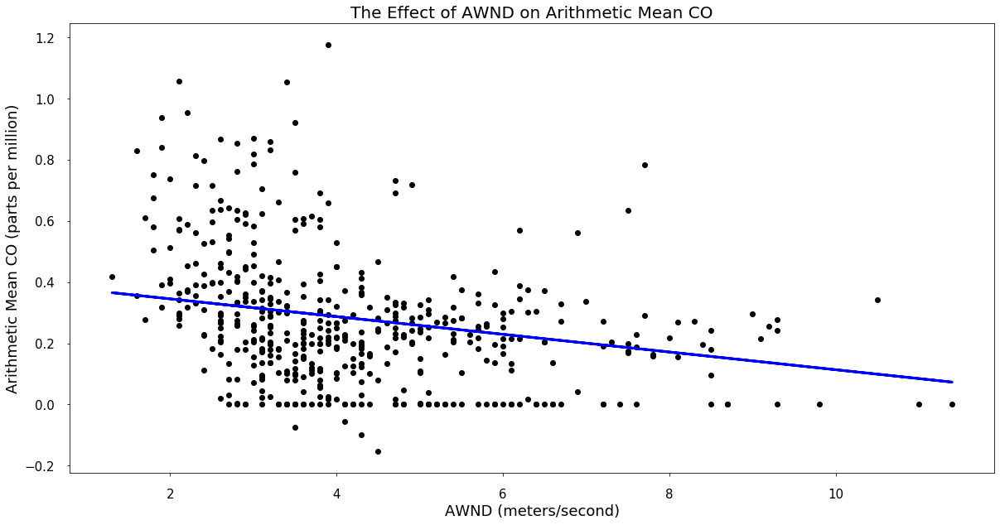

Explained Variance 0.13
Correlation Coefficient 0.36
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-0.02895414  0.00051297  0.00027875 -0.02307789  0.01883565]


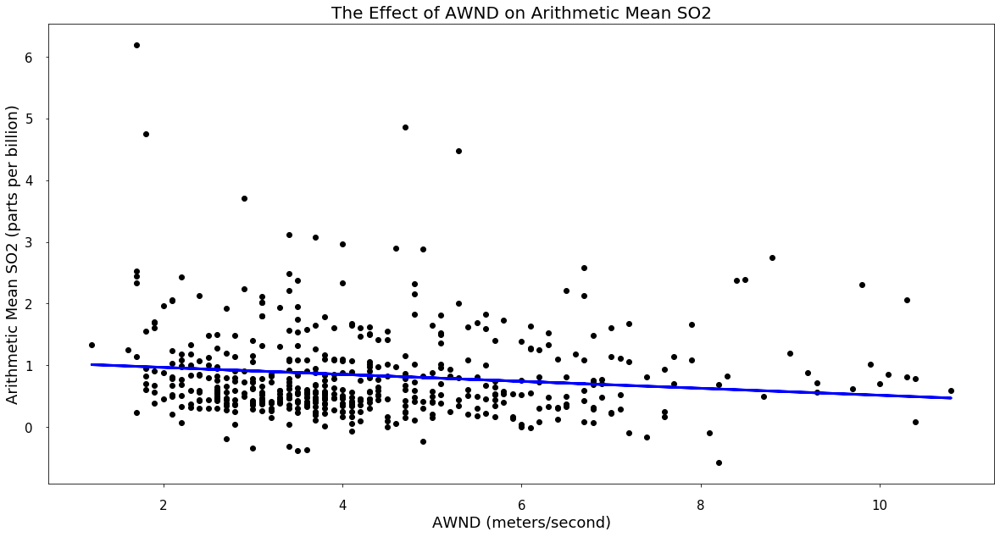

Explained Variance 0.13
Correlation Coefficient 0.35
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG']
Coefficients [-0.05639714  0.00064265 -0.02904552]


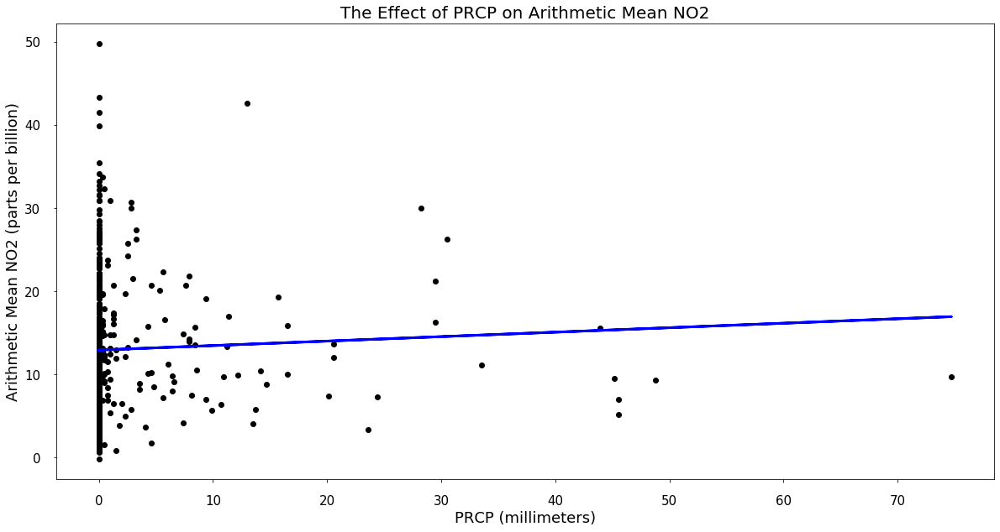

Explained Variance 0.13
Correlation Coefficient 0.35
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW']
Coefficients [ 0.05381945 -1.28420261  0.05110328  0.00807981]


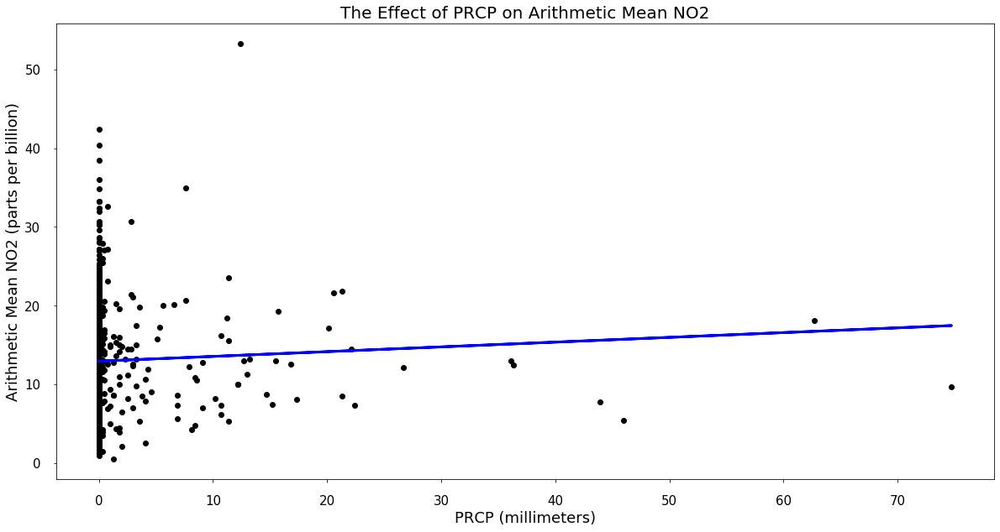

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD']
Coefficients [ 0.06056343 -1.2808494   0.05515779]


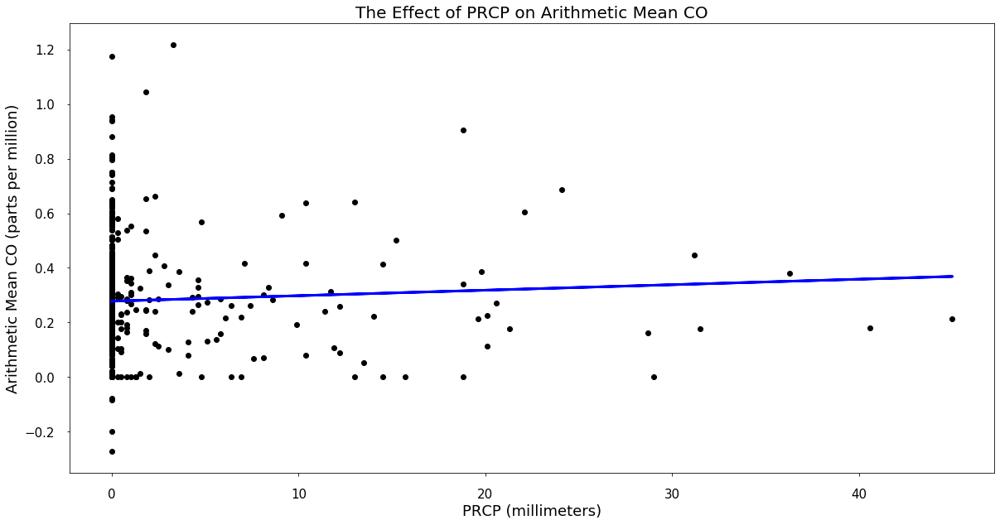

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TAVG', 'TMAX']
Coefficients [ 0.00201248 -0.03184833 -0.02598268  0.02061931]


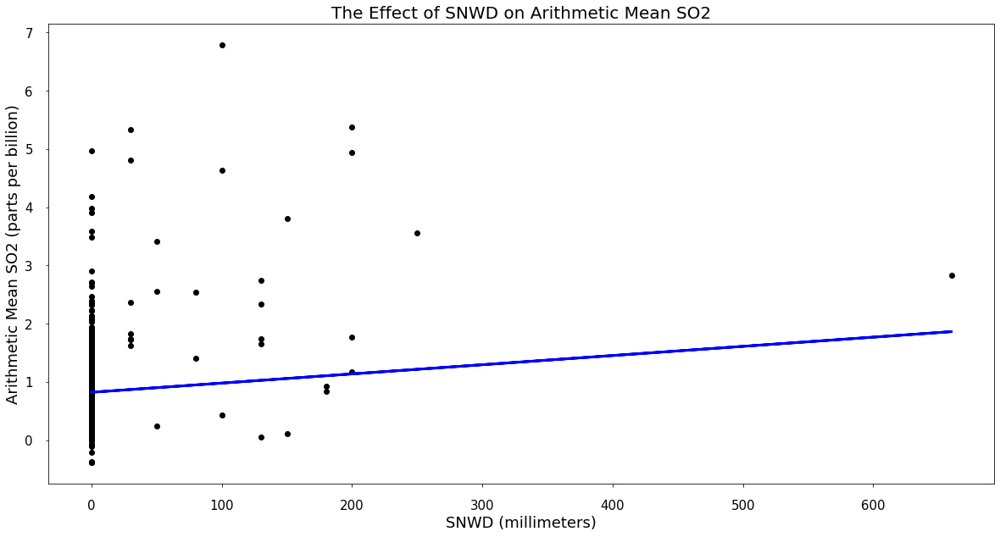

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TAVG']
Coefficients [ 0.001578   -0.00174348 -0.02223698]


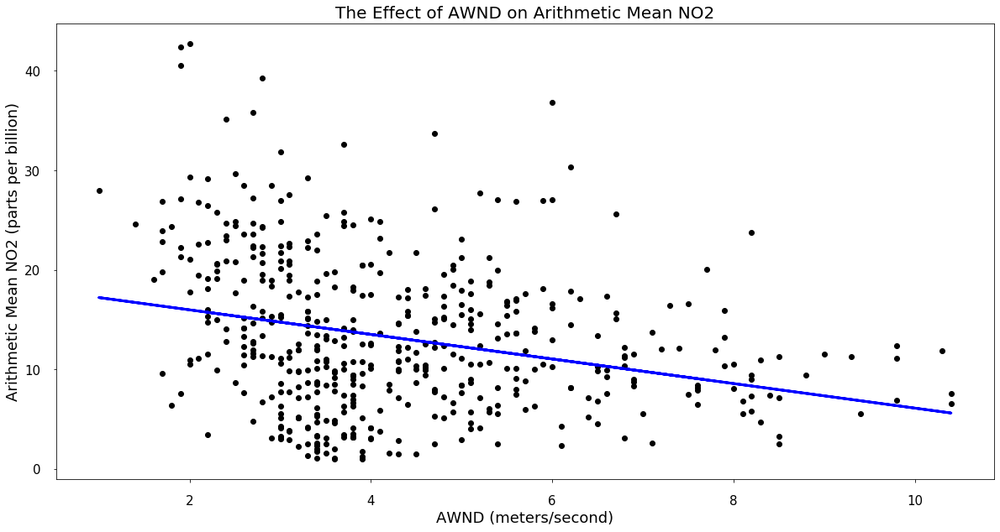

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD']
Coefficients [-1.23454568  0.05679182]


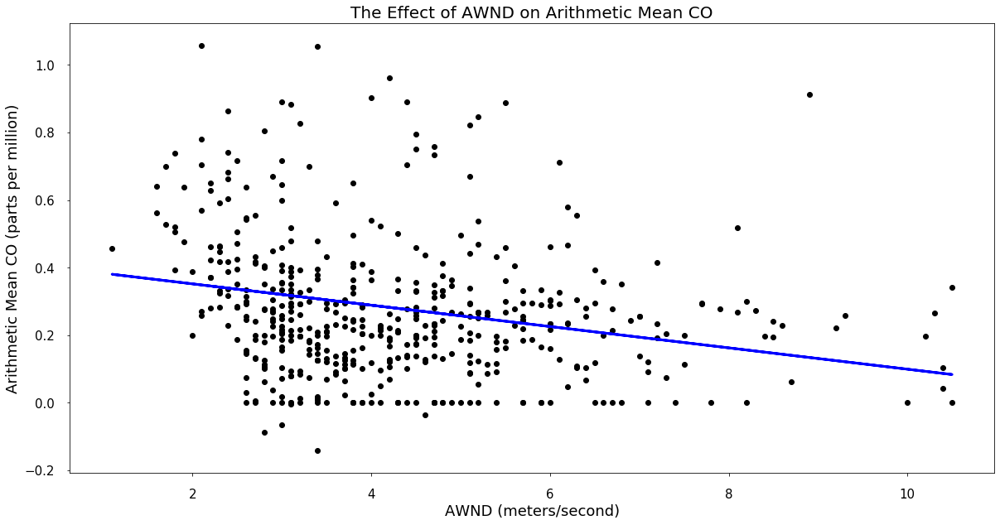

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TAVG', 'TMAX']
Coefficients [-0.03159524  0.00046018 -0.02366093  0.01868238]


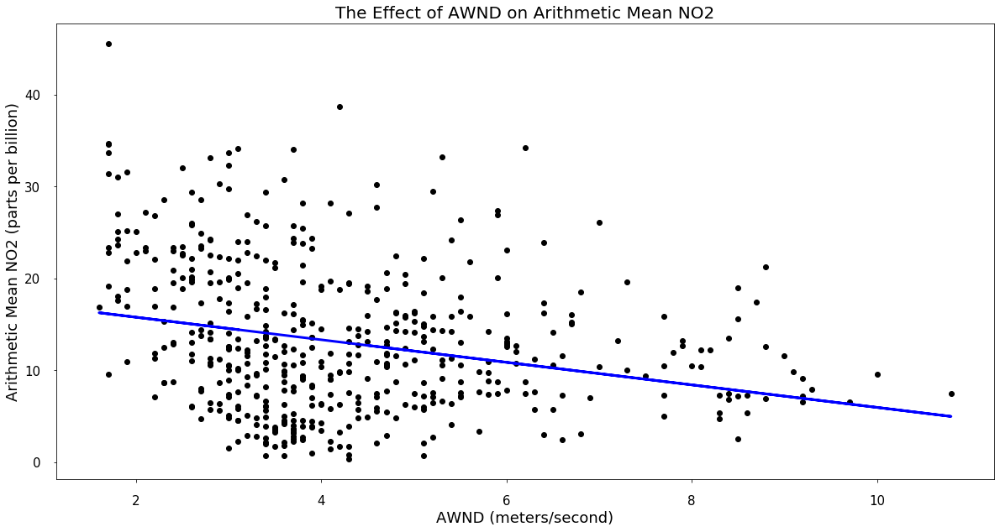

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW']
Coefficients [-1.22701101  0.0506703   0.01310787]


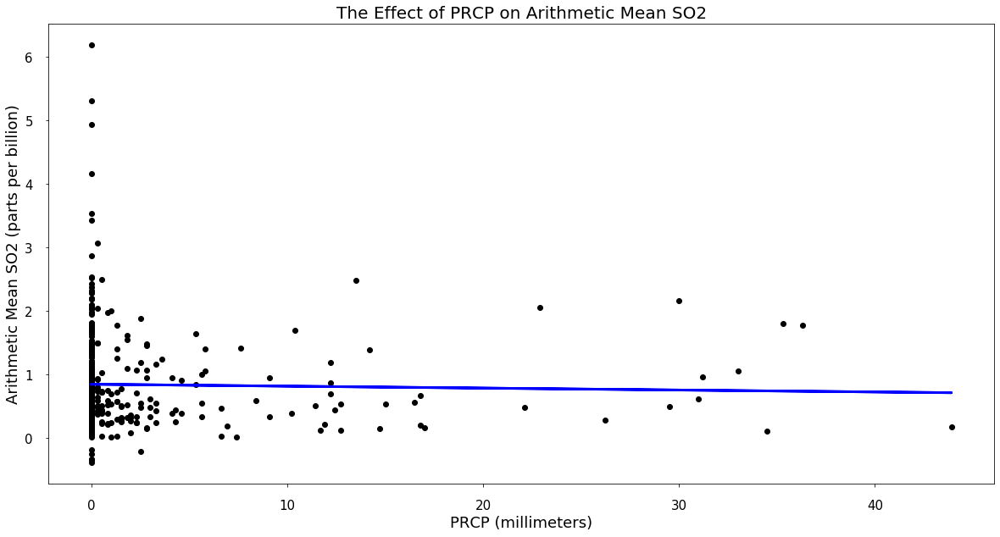

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TAVG']
Coefficients [-0.0030468   0.00207082 -0.00112549 -0.02413027]


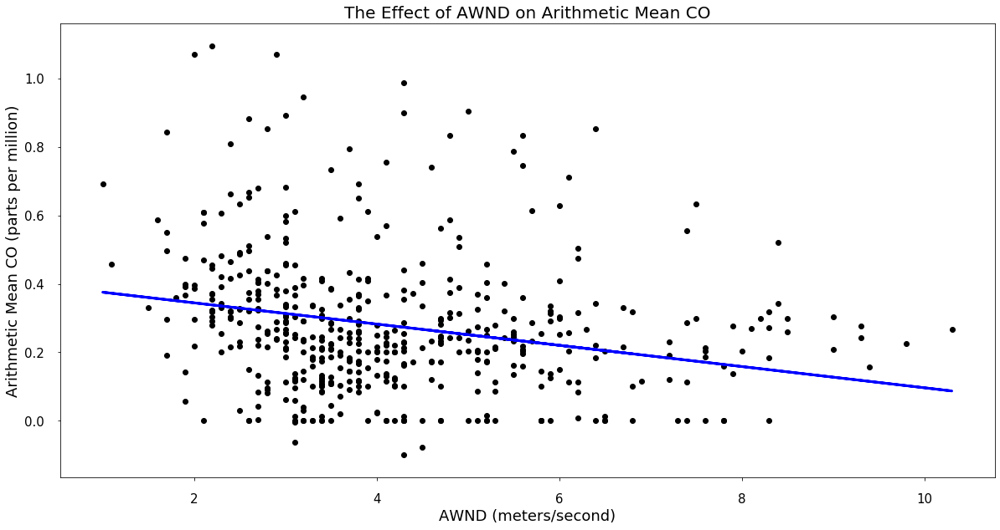

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display AWND
All Features In Model ['AWND', 'TAVG', 'TMAX']
Coefficients [-0.0310251  -0.02391889  0.01893664]


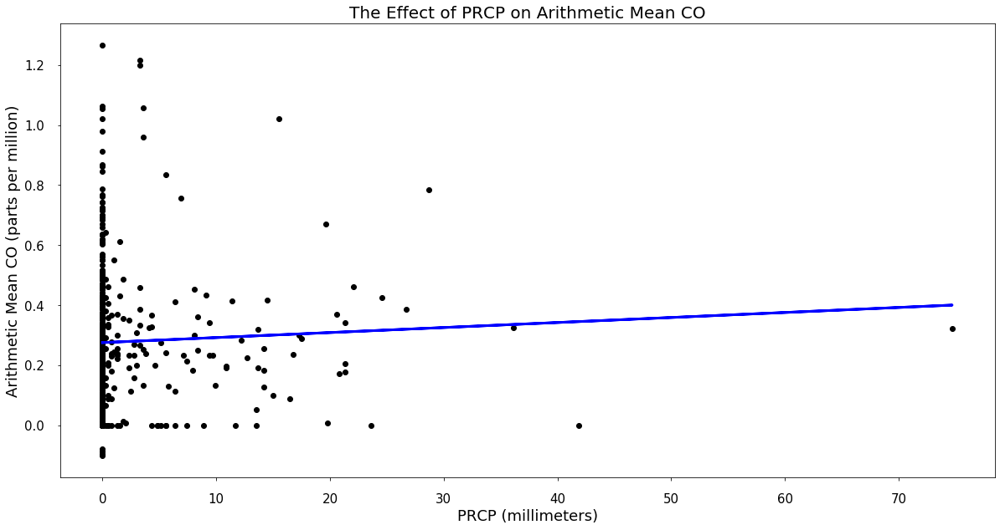

Explained Variance 0.12
Correlation Coefficient 0.35
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [ 1.67198180e-03 -3.85571707e-02  4.15891779e-04 -2.51957129e-06
 -5.51546360e-03]


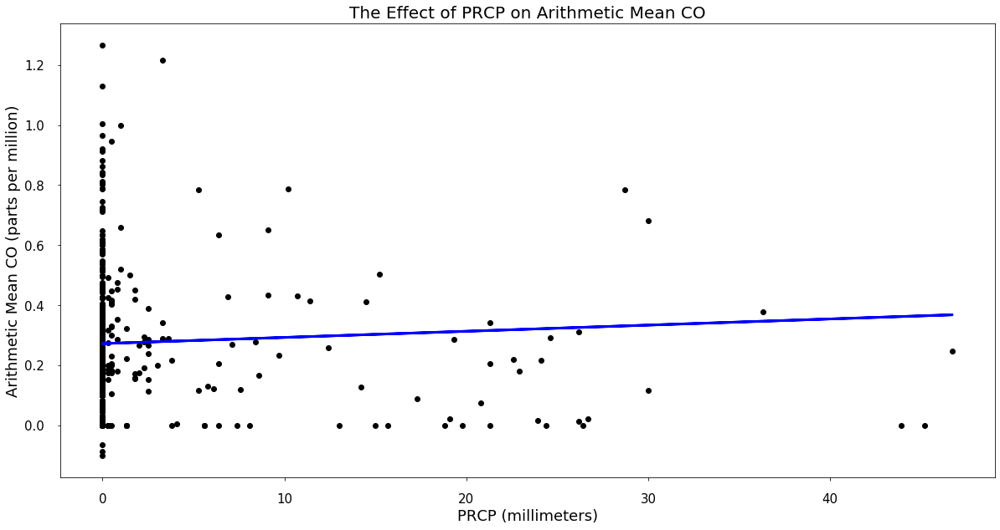

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TMIN']
Coefficients [ 0.00205243 -0.03751774  0.00045224 -0.0055507 ]


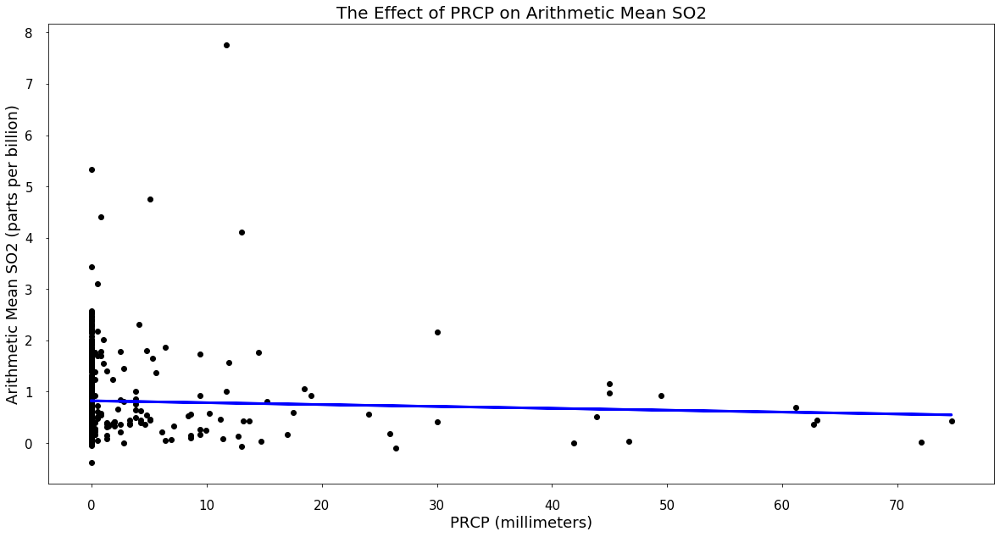

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TAVG']
Coefficients [-0.00365744  0.00188896 -0.02314308]


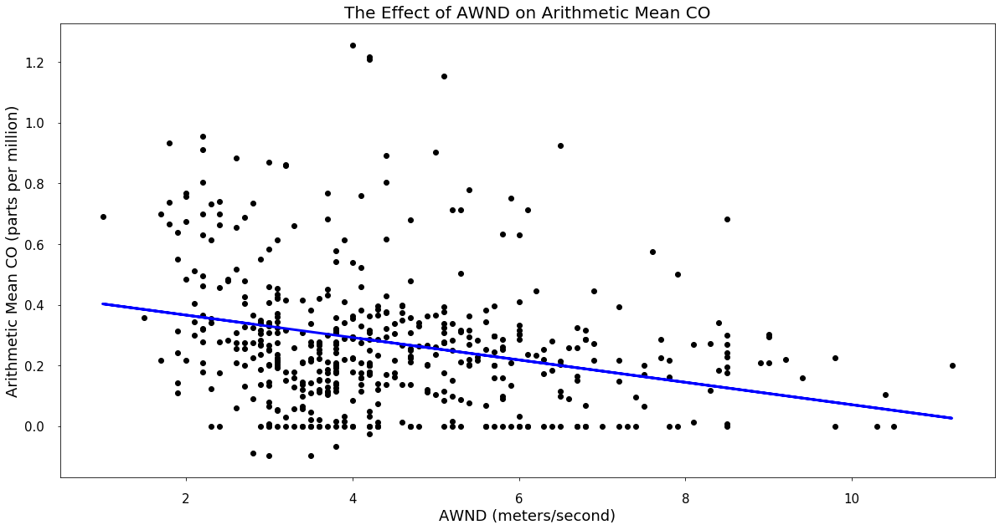

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'SNOW', 'TMIN']
Coefficients [-0.03691345  0.00042772  0.0002394  -0.00524251]


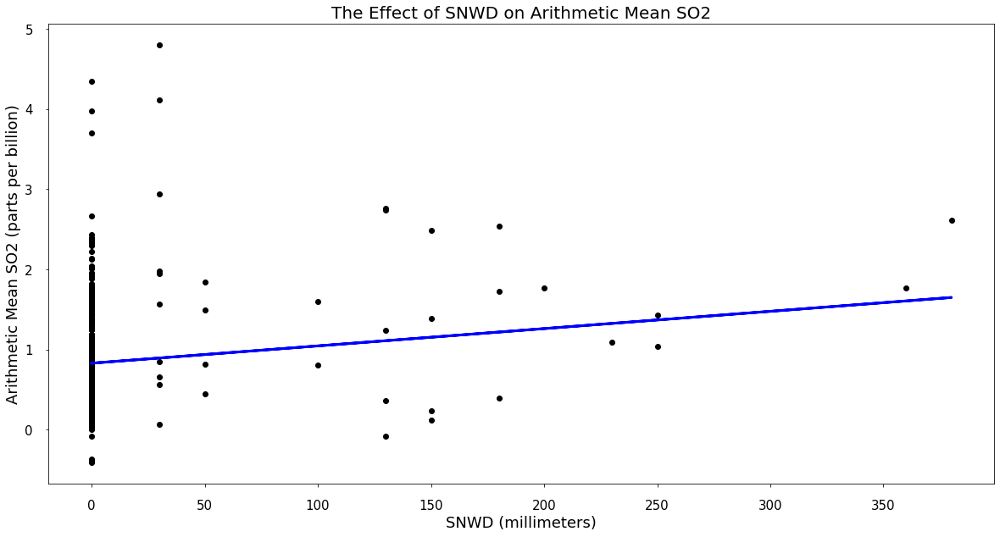

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TAVG']
Coefficients [ 0.00215969 -0.02386395]


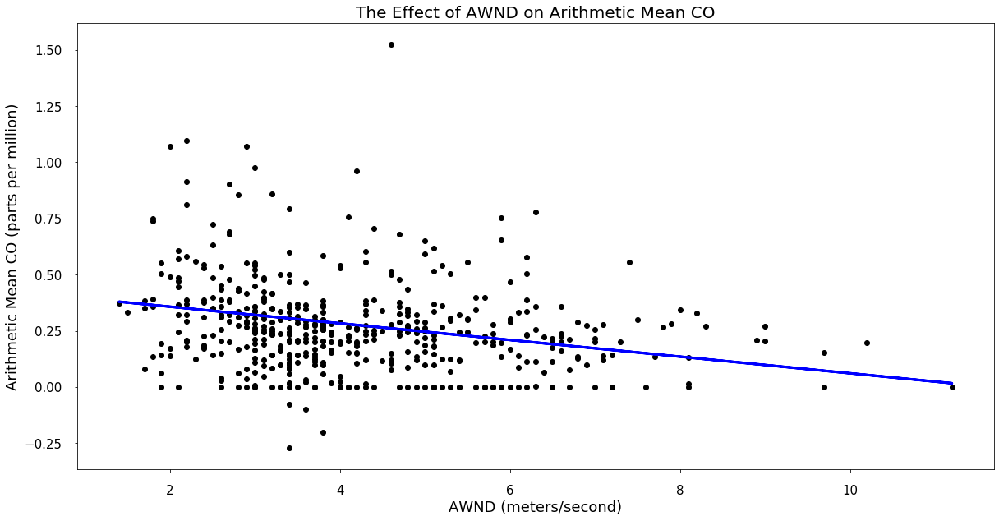

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMIN']
Coefficients [-0.03704164  0.00045176 -0.00526781]


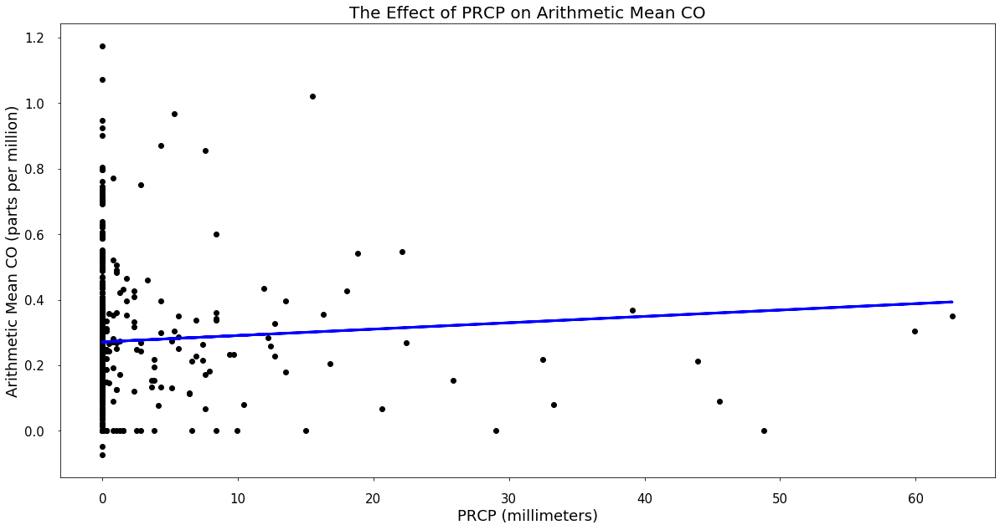

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNOW', 'TMIN']
Coefficients [ 1.94258601e-03 -3.96332696e-02  7.53008695e-05 -6.43925433e-03]


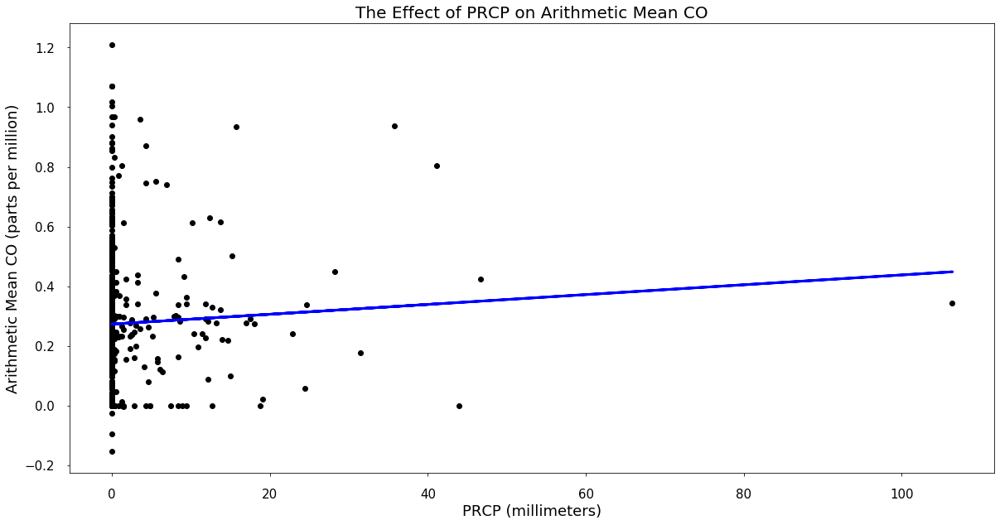

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'TMIN']
Coefficients [ 0.00164766 -0.03800802 -0.00611612]


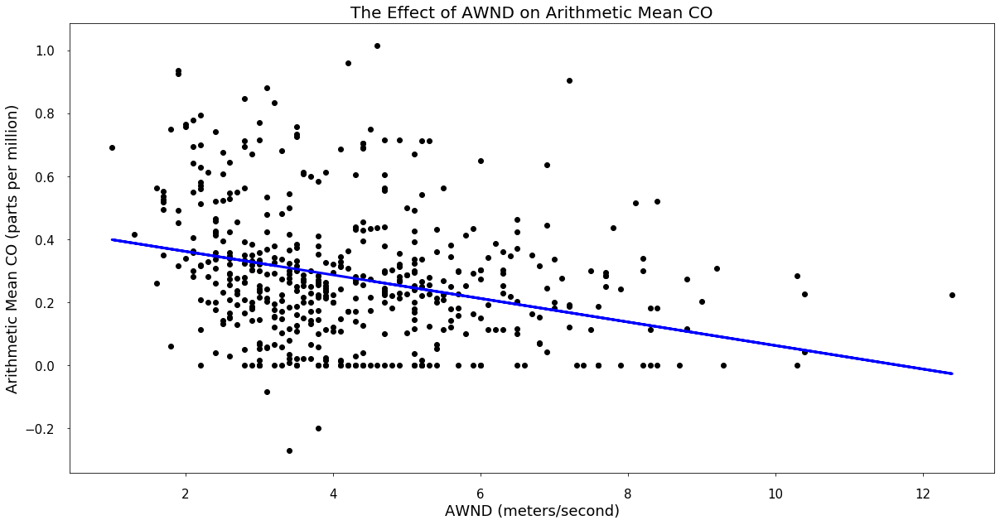

Explained Variance 0.12
Correlation Coefficient 0.34
Feature Selected for Display AWND
All Features In Model ['AWND', 'TMIN']
Coefficients [-0.03733083 -0.00607012]


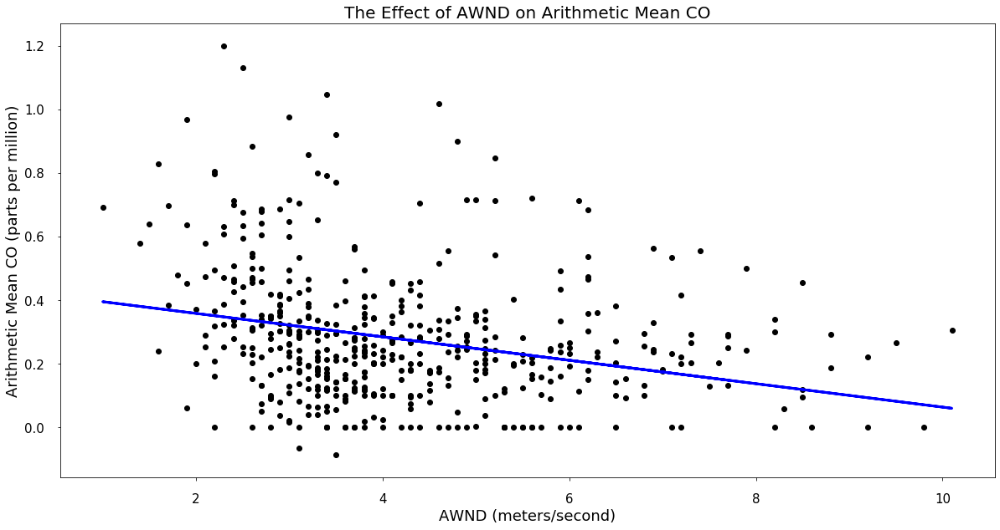

Explained Variance 0.11
Correlation Coefficient 0.34
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNOW', 'TMIN']
Coefficients [-0.03680576  0.00023712 -0.00586676]


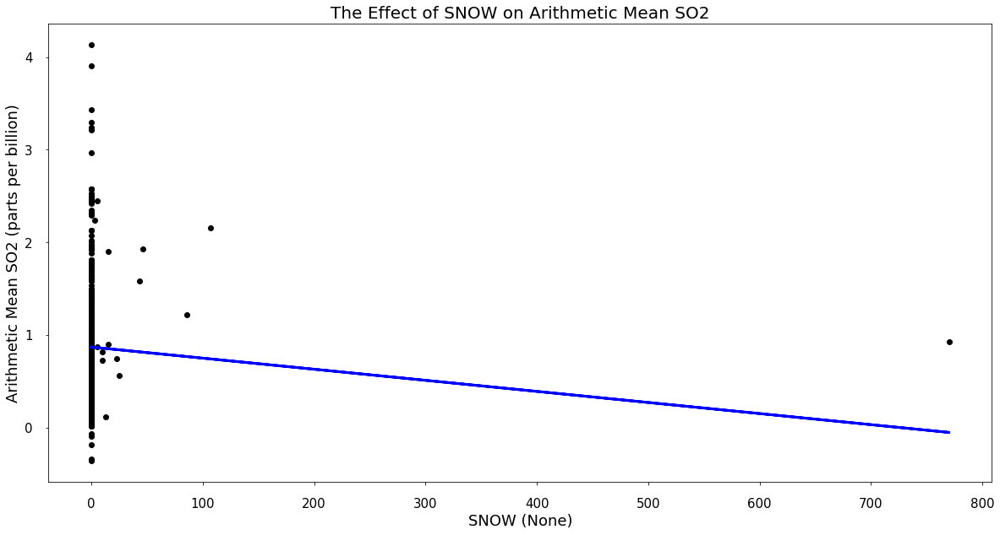

Explained Variance 0.11
Correlation Coefficient 0.34
Feature Selected for Display SNOW
All Features In Model ['SNOW', 'TAVG']
Coefficients [-0.00119721 -0.02635428]


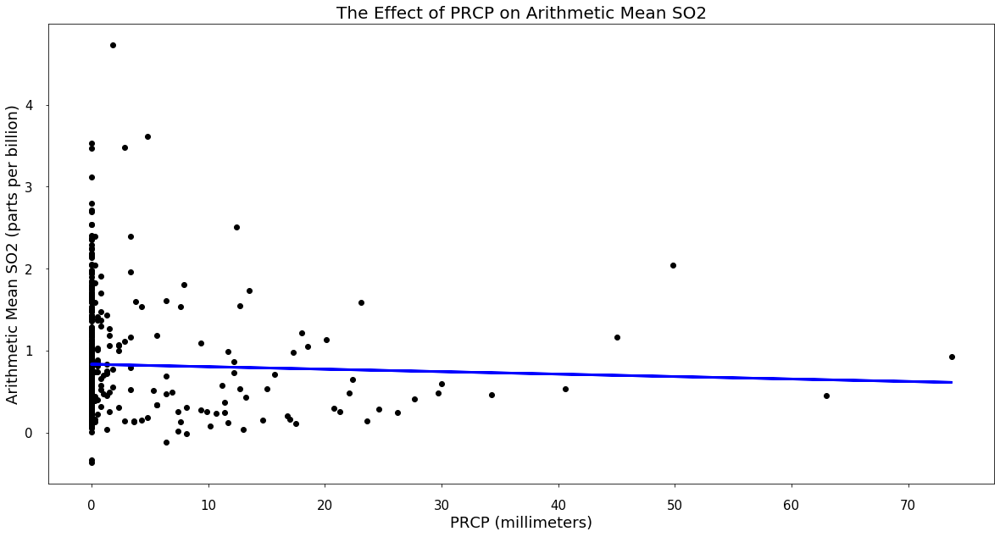

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNOW', 'TAVG']
Coefficients [-0.00299662 -0.00109337 -0.02701324]


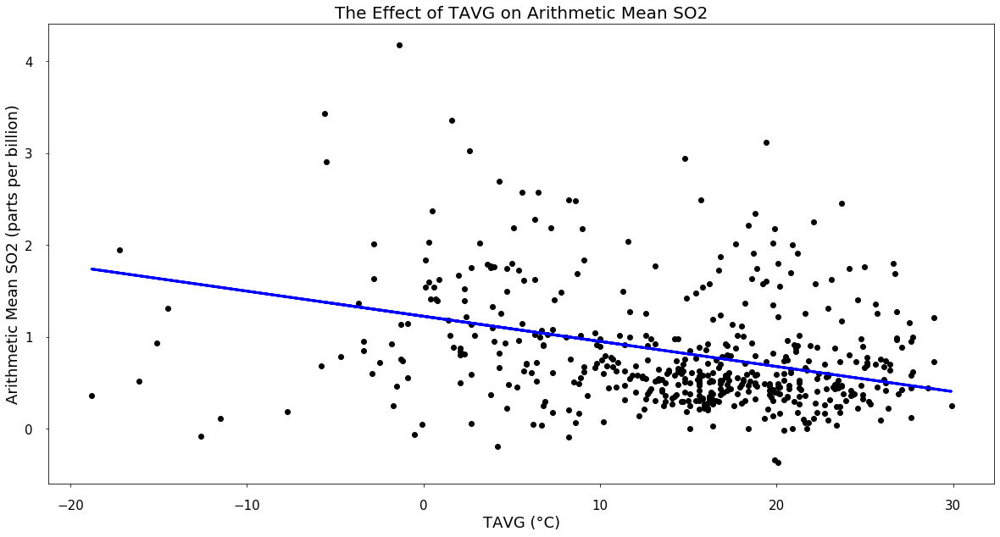

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display TAVG
All Features In Model ['TAVG']
Coefficients [-0.02734601]


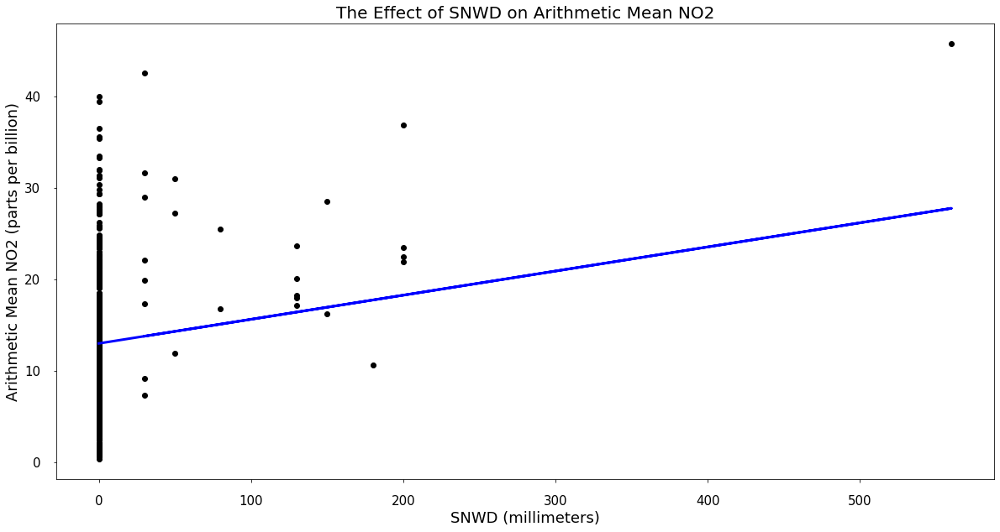

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'SNOW', 'TMAX']
Coefficients [ 0.02639636 -0.01496608 -0.21006205]


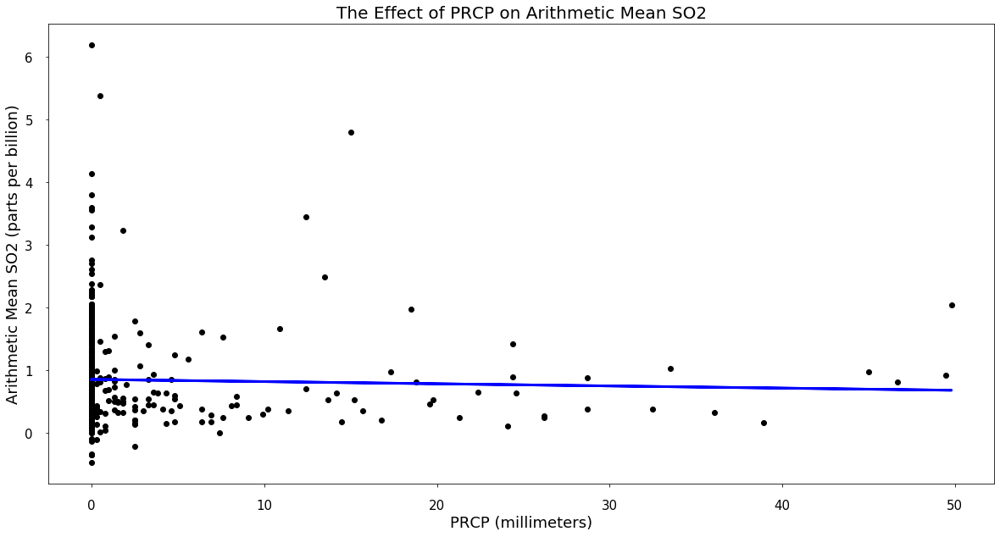

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'TAVG']
Coefficients [-0.0034694  -0.02630271]


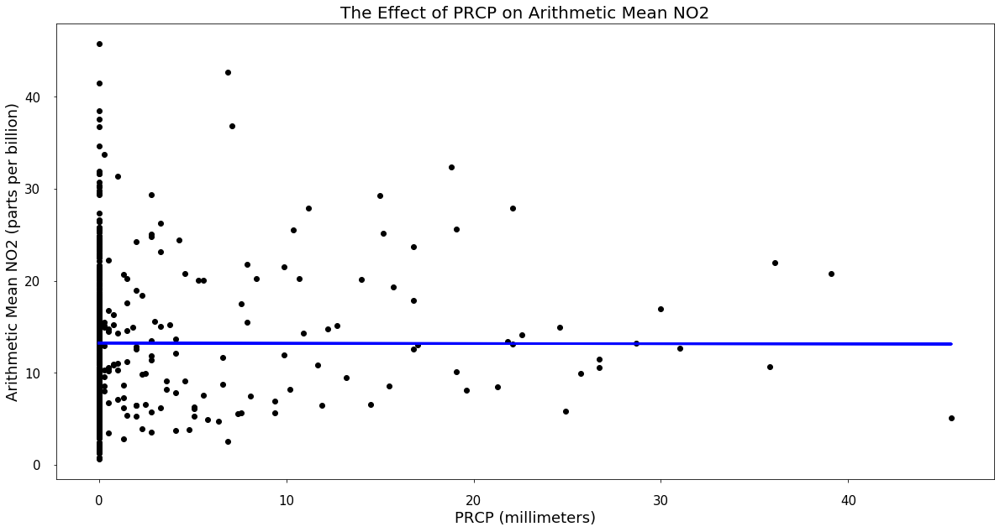

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'SNOW', 'TMAX']
Coefficients [-0.00221925  0.02566746 -0.01308737 -0.21316553]


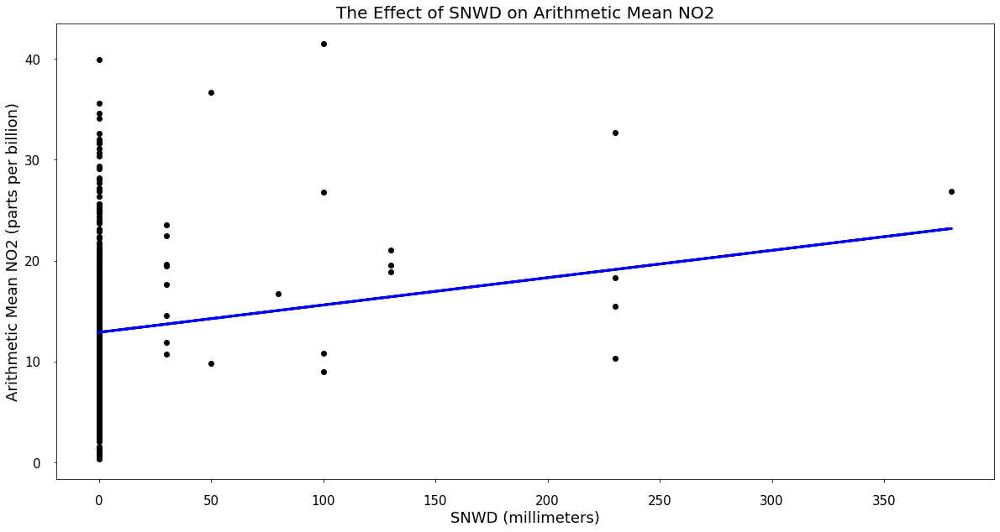

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display SNWD
All Features In Model ['SNWD', 'TMAX']
Coefficients [ 0.02708259 -0.2124176 ]


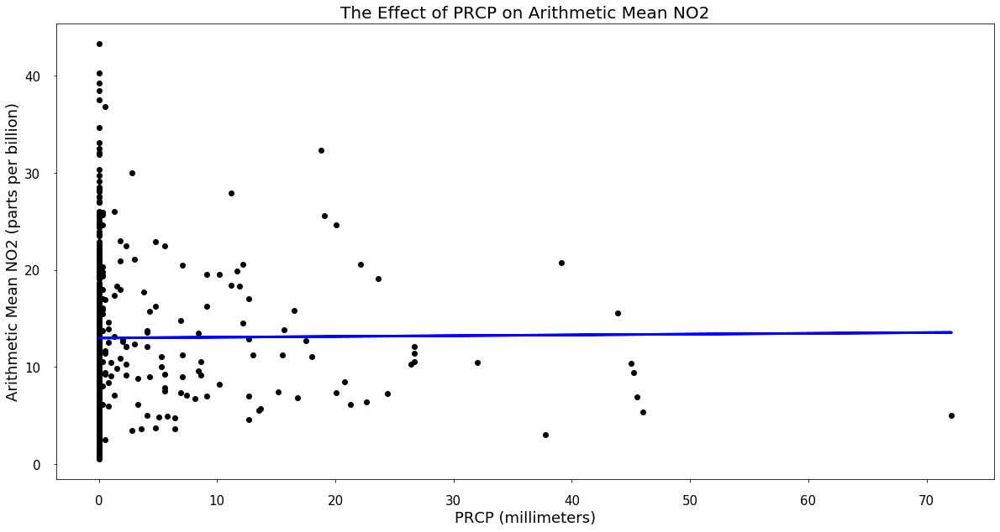

Explained Variance 0.11
Correlation Coefficient 0.33
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'SNWD', 'TMAX']
Coefficients [ 0.00796038  0.02476278 -0.21408792]


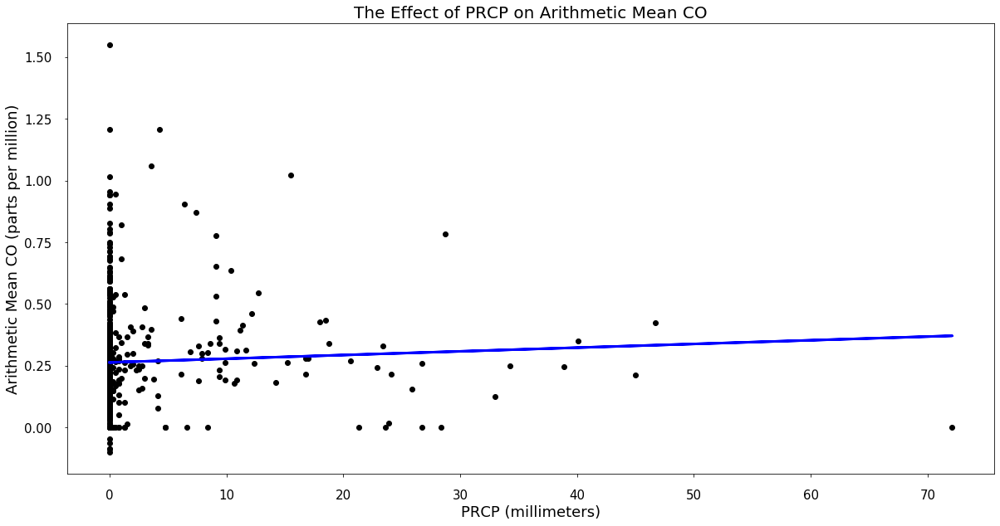

Explained Variance 0.10
Correlation Coefficient 0.32
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'TAVG']
Coefficients [ 0.00149588 -0.03755728  0.0005385  -0.00419491]


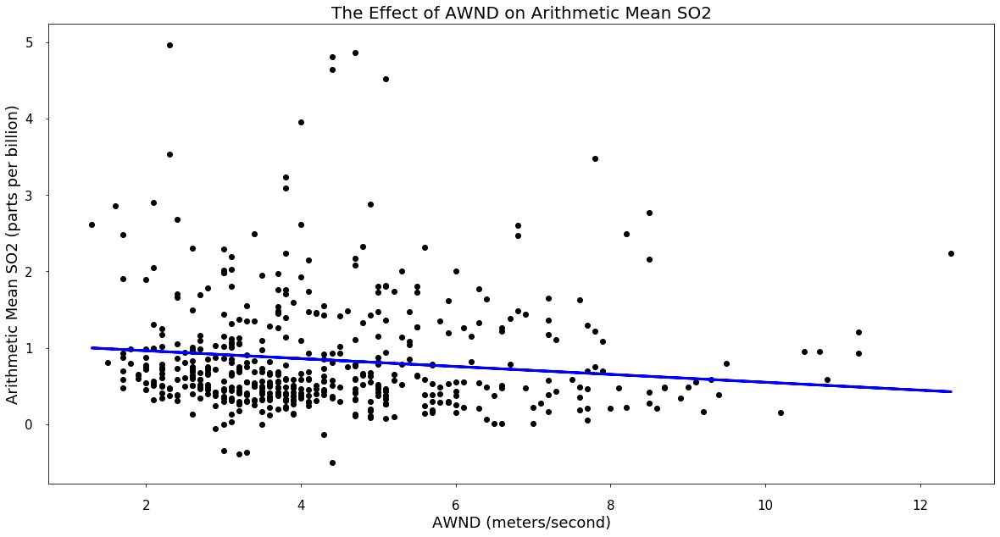

Explained Variance 0.10
Correlation Coefficient 0.32
Feature Selected for Display AWND
All Features In Model ['AWND', 'SNWD', 'TMAX']
Coefficients [-0.05159911  0.00291199 -0.01868328]


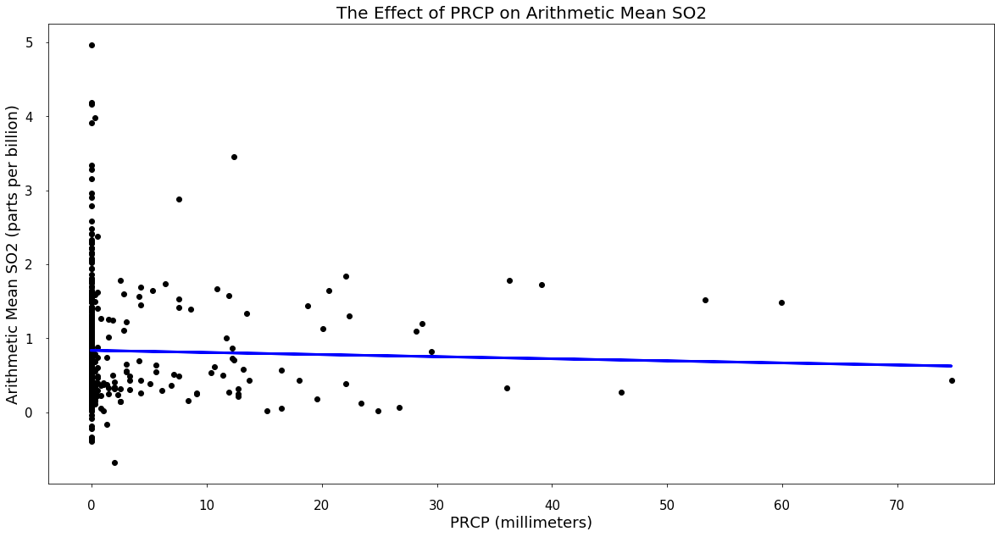

Explained Variance 0.10
Correlation Coefficient 0.32
Feature Selected for Display PRCP
All Features In Model ['PRCP', 'AWND', 'SNWD', 'SNOW', 'TMAX']
Coefficients [-0.00282113 -0.04994332  0.00305973 -0.00054164 -0.01957954]


In [173]:
for model_record in topModel_records:
    display_model(model_record,featureNum=0,featureType=None)